# Bank Loan Dataset

Link: https://www.kaggle.com/datasets/xavierberge/bank-loan-data/data

**Understanding the columns in the dataset**:

* **id:** A unique identifier for each loan record.
* **address_state:** The state where the borrower resides.
* **application_type:** Indicates if the application was an individual or a joint application.
* **emp_length:** Employment length of the borrower in years.
* **emp_title:** This should be the job title of the borrower/employer of the borrower.
* **Grade:** Loan assigned grade by the lending institution (e.g., A, B, C, D, F, G).
* **home_ownership:** Indicates if the borrower owns, rents, or has a mortgage on their home.
* **issue_date:** The date the loan was issued.
* **last_credit_pull_date:** The date the borrower's credit was last pulled.
* **last_payment_date:** The date of the last payment made by the borrower.
* **loan_status:** The current status of the loan (e.g., Fully Paid, Charged Off, Current, Late).
* **Good vs Bad Loan:** This is your **target variable** for the classification task.
* **next_payment_date:** The next scheduled payment date.
* **member_id:** Similar to `id`, a unique identifier for the member/borrower.
* **Purpose:** The reason for the loan (e.g., debt consolidation, credit card, home improvement).
* **sub_grade:** A more granular categorization of the loan grade (e.g., A1, A2, B1, B2).
* **term:** The term period on the loan (e.g., 36 months, 60 months).
* **verification_status:** Indicates if the borrower's identity, claims, income was verified by the lender.
* **annual_income:** The borrower's self-reported annual income.
* **dti:** Debt-to-income ratio, calculated as the borrower's total monthly debt payments divided by their gross monthly income.
* **installment:** The monthly payment due by the borrower.
* **int_rate:** The interest rate on the loan.
* **loan_amount:** The principal amount of the loan.
* **total_acc:** The total number of credit lines currently in the borrower's credit file.
* **total_payment:** The total payments received to date for the loan.

# 1 Basics

In [ ]:
## Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')

In [ ]:
plt.rcParams['figure.figsize'] = [13,10]

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# data = pd.read_csv('/content/drive/MyDrive/Capstone_Project/Bank Data_1.csv')
# data.head()

In [ ]:
 data= pd.read_csv('Bank Data_1.csv')
 data.head()

,id,address_state,application_type,emp_length,emp_title,Grade,home_ownership,issue_date,last_credit_pull_date,last_payment_date,...,sub_grade,term,verification_status,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment
0,1077430,GA,INDIVIDUAL,< 1 year,Ryder,C,RENT,2/11/2021,9/13/2021,4/13/2021,...,C4,60 months,Source Verified,30000.0,0.0100,59.83,0.1527,"$2,500",4,"$1,009"
1,1072053,CA,INDIVIDUAL,9 years,MKC Accounting,E,RENT,1/1/2021,12/14/2021,1/15/2021,...,E1,36 months,Source Verified,48000.0,0.0535,109.43,0.1864,"$3,000",4,"$3,939"
2,1069243,CA,INDIVIDUAL,4 years,Chemat Technology Inc,C,RENT,1/5/2021,12/12/2021,1/9/2021,...,C5,36 months,Not Verified,50000.0,0.2088,421.65,0.1596,"$12,000",11,"$3,522"
3,1041756,TX,INDIVIDUAL,< 1 year,barnes distribution,B,MORTGAGE,2/25/2021,12/12/2021,3/12/2021,...,B2,60 months,Source Verified,42000.0,0.0540,97.06,0.1065,"$4,500",9,"$4,911"
4,1068350,IL,INDIVIDUAL,10+ years,J&J Steel Inc,A,MORTGAGE,1/1/2021,12/14/2021,1/15/2021,...,A1,36 months,Verified,83000.0,0.0231,106.53,0.0603,"$3,500",28,"$3,835"


In [ ]:
data.shape

(38576, 25)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     38576 non-null  int64  
 1   address_state          38576 non-null  object 
 2   application_type       38576 non-null  object 
 3   emp_length             38576 non-null  object 
 4   emp_title              37138 non-null  object 
 5   Grade                  38576 non-null  object 
 6   home_ownership         38576 non-null  object 
 7   issue_date             38576 non-null  object 
 8   last_credit_pull_date  38576 non-null  object 
 9   last_payment_date      38576 non-null  object 
 10  loan_status            38576 non-null  object 
 11  Good vs Bad Loan       38576 non-null  object 
 12  next_payment_date      38576 non-null  object 
 13  member_id              38576 non-null  int64  
 14  Purpose                38576 non-null  object 
 15  su

In [ ]:
data.describe()

,id,member_id,annual_income,dti,installment,int_rate,total_acc
count,3.857600e+04,3.857600e+04,3.857600e+04,38576.000000,38576.000000,38576.000000,38576.000000
mean,6.810371e+05,8.476515e+05,6.964454e+04,0.133274,326.862965,0.120488,22.132544
std,2.113246e+05,2.668105e+05,6.429368e+04,0.066662,209.092000,0.037164,11.392282
min,5.473400e+04,7.069900e+04,4.000000e+03,0.000000,15.690000,0.054200,2.000000
25%,5.135170e+05,6.629788e+05,4.150000e+04,0.082100,168.450000,0.093200,14.000000
50%,6.627280e+05,8.473565e+05,6.000000e+04,0.134200,283.045000,0.118600,20.000000
75%,8.365060e+05,1.045652e+06,8.320050e+04,0.185900,434.442500,0.145900,29.000000
max,1.077501e+06,1.314167e+06,6.000000e+06,0.299900,1305.190000,0.245900,90.000000


In [ ]:
data.describe(exclude=np.number)

,address_state,application_type,emp_length,emp_title,Grade,home_ownership,issue_date,last_credit_pull_date,last_payment_date,loan_status,Good vs Bad Loan,next_payment_date,Purpose,sub_grade,term,verification_status,loan_amount,total_payment
count,38576,38576,38576,37138,38576,38576,38576,38576,38576,38576,38576,38576,38576,38576,38576,38576,38576,38576
unique,50,1,11,28525,7,5,65,107,102,3,2,102,14,35,2,3,880,19525
top,CA,INDIVIDUAL,10+ years,US Army,B,RENT,12/11/2021,5/16/2021,5/16/2021,Fully Paid,Good Loan,6/16/2021,Debt consolidation,B3,36 months,Not Verified,"$10,000","$6,515"
freq,6894,38576,8870,135,11674,18439,2188,10041,1209,32145,33243,1209,18214,2834,28237,16464,2761,32


**Column names**

In [ ]:
data.columns

Index(['id', 'address_state', 'application_type', 'emp_length', 'emp_title',
       'Grade', 'home_ownership', 'issue_date', 'last_credit_pull_date',
       'last_payment_date', 'loan_status', 'Good vs Bad Loan',
       'next_payment_date', 'member_id', 'Purpose', 'sub_grade', 'term',
       'verification_status', 'annual_income', 'dti', 'installment',
       'int_rate', ' loan_amount ', 'total_acc', ' total_payment '],
      dtype='object')

In [ ]:
#Fixing the spaces in the column names ' loan_amount ' and ' total_payment '
data.columns = data.columns.str.strip()

In [ ]:
data.columns

Index(['id', 'address_state', 'application_type', 'emp_length', 'emp_title',
       'Grade', 'home_ownership', 'issue_date', 'last_credit_pull_date',
       'last_payment_date', 'loan_status', 'Good vs Bad Loan',
       'next_payment_date', 'member_id', 'Purpose', 'sub_grade', 'term',
       'verification_status', 'annual_income', 'dti', 'installment',
       'int_rate', 'loan_amount', 'total_acc', 'total_payment'],
      dtype='object')

'loan_amount' and 'total_payment' columns have values like ' $4000 '. They are categoric in nature. It would be better to convert them to numerical columns. Since they're both data pertaining to financial values, we will assign the new datatype as 'float'.

In [ ]:
# Apply .replace() with a regex to remove '$' and spaces in loan_amount and total_payment
#These are better as numeric columns than categoric
# The r'[$, ]' regex matches either a dollar sign or a space.
data['loan_amount'] = data['loan_amount'].replace({r'[$, ]': ''}, regex=True)
data['total_payment'] = data['total_payment'].replace({r'[$, ]': ''}, regex=True)

data['loan_amount'] = data['loan_amount'].astype(float)
data['total_payment'] = data['total_payment'].astype(float)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     38576 non-null  int64  
 1   address_state          38576 non-null  object 
 2   application_type       38576 non-null  object 
 3   emp_length             38576 non-null  object 
 4   emp_title              37138 non-null  object 
 5   Grade                  38576 non-null  object 
 6   home_ownership         38576 non-null  object 
 7   issue_date             38576 non-null  object 
 8   last_credit_pull_date  38576 non-null  object 
 9   last_payment_date      38576 non-null  object 
 10  loan_status            38576 non-null  object 
 11  Good vs Bad Loan       38576 non-null  object 
 12  next_payment_date      38576 non-null  object 
 13  member_id              38576 non-null  int64  
 14  Purpose                38576 non-null  object 
 15  su

In [ ]:
for i in data.columns:
    print('-------------------------------------')
    print(f'Number of Unique values in column {i}')
    print(f'Column {i}: {len(data[i].unique())}')

-------------------------------------
Number of Unique values in column id
Column id: 38576
-------------------------------------
Number of Unique values in column address_state
Column address_state: 50
-------------------------------------
Number of Unique values in column application_type
Column application_type: 1
-------------------------------------
Number of Unique values in column emp_length
Column emp_length: 11
-------------------------------------
Number of Unique values in column emp_title
Column emp_title: 28526
-------------------------------------
Number of Unique values in column Grade
Column Grade: 7
-------------------------------------
Number of Unique values in column home_ownership
Column home_ownership: 5
-------------------------------------
Number of Unique values in column issue_date
Column issue_date: 65
-------------------------------------
Number of Unique values in column last_credit_pull_date
Column last_credit_pull_date: 107
-------------------------------

We can infer fom this that:


*   Columns 'id', 'member_id' can be removed
*   Column 'application_type' can also be removed
*   Column 'emp_title' has 28000 and more unique values, many of them repeated, too -- this column can also be removed






In [ ]:
#Deleting the following columns: 'id','member_id','application_type','emp_title'
data.drop(['id','member_id','application_type','emp_title'],axis=1,inplace=True)
data.columns

Index(['address_state', 'emp_length', 'Grade', 'home_ownership', 'issue_date',
       'last_credit_pull_date', 'last_payment_date', 'loan_status',
       'Good vs Bad Loan', 'next_payment_date', 'Purpose', 'sub_grade', 'term',
       'verification_status', 'annual_income', 'dti', 'installment',
       'int_rate', 'loan_amount', 'total_acc', 'total_payment'],
      dtype='object')

In [ ]:
data.shape

(38576, 21)

In [ ]:
data.isnull().sum()

address_state            0
emp_length               0
Grade                    0
home_ownership           0
issue_date               0
last_credit_pull_date    0
last_payment_date        0
loan_status              0
Good vs Bad Loan         0
next_payment_date        0
Purpose                  0
sub_grade                0
term                     0
verification_status      0
annual_income            0
dti                      0
installment              0
int_rate                 0
loan_amount              0
total_acc                0
total_payment            0
dtype: int64

No null values present in the data now

In [ ]:
data[data.duplicated()]

,address_state,emp_length,Grade,home_ownership,issue_date,last_credit_pull_date,last_payment_date,loan_status,Good vs Bad Loan,next_payment_date,...,sub_grade,term,verification_status,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment


No duplicated rows in the dataset

In [ ]:
num = data.select_dtypes(include=np.number).columns.to_list()
cat = data.drop('Good vs Bad Loan',axis=1).select_dtypes(exclude=np.number).columns.to_list()

In [ ]:
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

In [ ]:
cat

['address_state',
 'emp_length',
 'Grade',
 'home_ownership',
 'issue_date',
 'last_credit_pull_date',
 'last_payment_date',
 'loan_status',
 'next_payment_date',
 'Purpose',
 'sub_grade',
 'term',
 'verification_status']

In [ ]:
target = 'Good vs Bad Loan'

In [ ]:
#Outliers
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

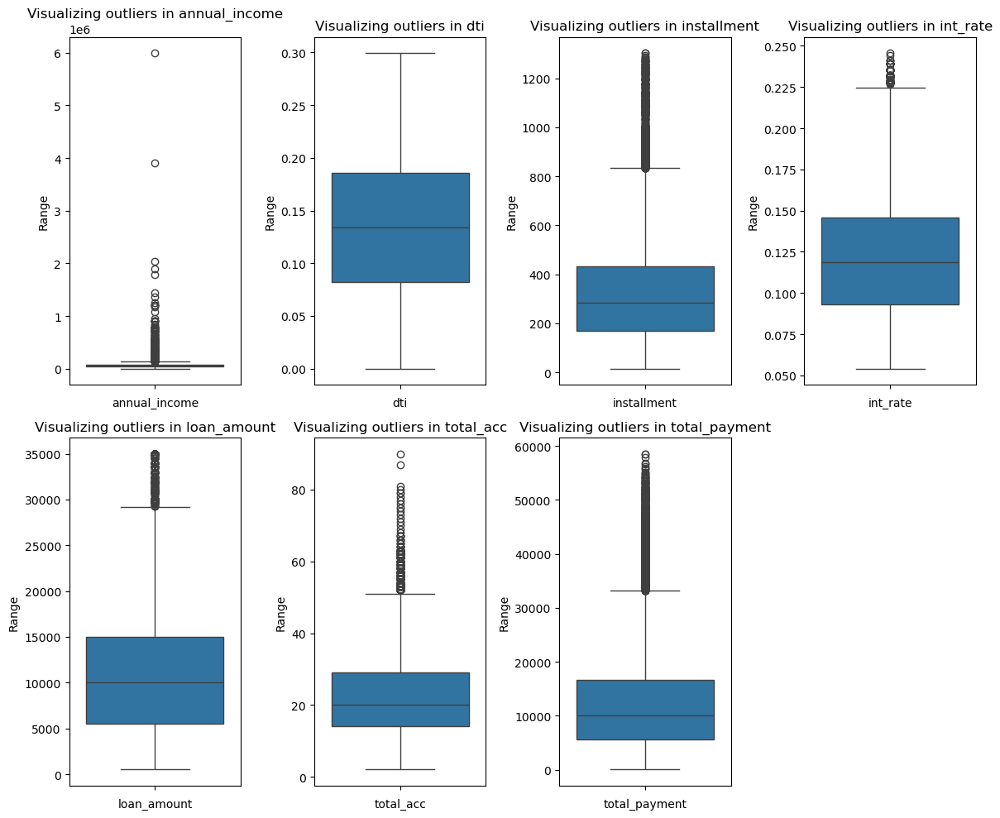

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.boxplot(data[i])
    plt.title(f'Visualizing outliers in {i}')
    plt.ylabel('Range')
    plt.xlabel(i)
    t+=1
plt.tight_layout()
plt.show()

**Note**: It is to be noted that the annual_income column in boxplots and other plots in this notebook are scaled in the plots in the power of 1e6

In [ ]:
q1 = data[num].quantile(0.25)
q3 = data[num].quantile(0.75)
iqr = q3 - q1

print('Q1 for numerical variables:')
print(q1)
print('--------------------------------------')
print('Q3 for numerical variables:')
print(q3)
print('--------------------------------------')
print('IQR for numerical variables:')
print(iqr)
print('--------------------------------------')

Q1 for numerical variables:
annual_income    41500.0000
dti                  0.0821
installment        168.4500
int_rate             0.0932
loan_amount       5500.0000
total_acc           14.0000
total_payment     5633.0000
Name: 0.25, dtype: float64
--------------------------------------
Q3 for numerical variables:
annual_income    83200.5000
dti                  0.1859
installment        434.4425
int_rate             0.1459
loan_amount      15000.0000
total_acc           29.0000
total_payment    16658.0000
Name: 0.75, dtype: float64
--------------------------------------
IQR for numerical variables:
annual_income    41700.5000
dti                  0.1038
installment        265.9925
int_rate             0.0527
loan_amount       9500.0000
total_acc           15.0000
total_payment    11025.0000
dtype: float64
--------------------------------------


In [ ]:
#Outliers - Overall (Usual method we follow)
print('Overall')
uw_overall = q3 + (1.5*iqr)
lw_overall = q1 - (1.5*iqr)
overall_outliers = data[((data[num] < lw_overall) | (data[num] > uw_overall)).any(axis=1)]

print('Number of outlier rows:',overall_outliers.shape[0])
print('Percentage of all outliers overall in dataset:',overall_outliers.shape[0] * 100 / len(data))

Overall
Number of outlier rows: 4104
Percentage of all outliers overall in dataset: 10.638739112401494


Some EDA to be done before we decide on outlier treatment for individual columns

# 2 EDA

In [ ]:
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

In [ ]:
cat

['address_state',
 'emp_length',
 'Grade',
 'home_ownership',
 'issue_date',
 'last_credit_pull_date',
 'last_payment_date',
 'loan_status',
 'next_payment_date',
 'Purpose',
 'sub_grade',
 'term',
 'verification_status']

In [ ]:
target

'Good vs Bad Loan'

### Univariate Analysis

#### Numeric variables

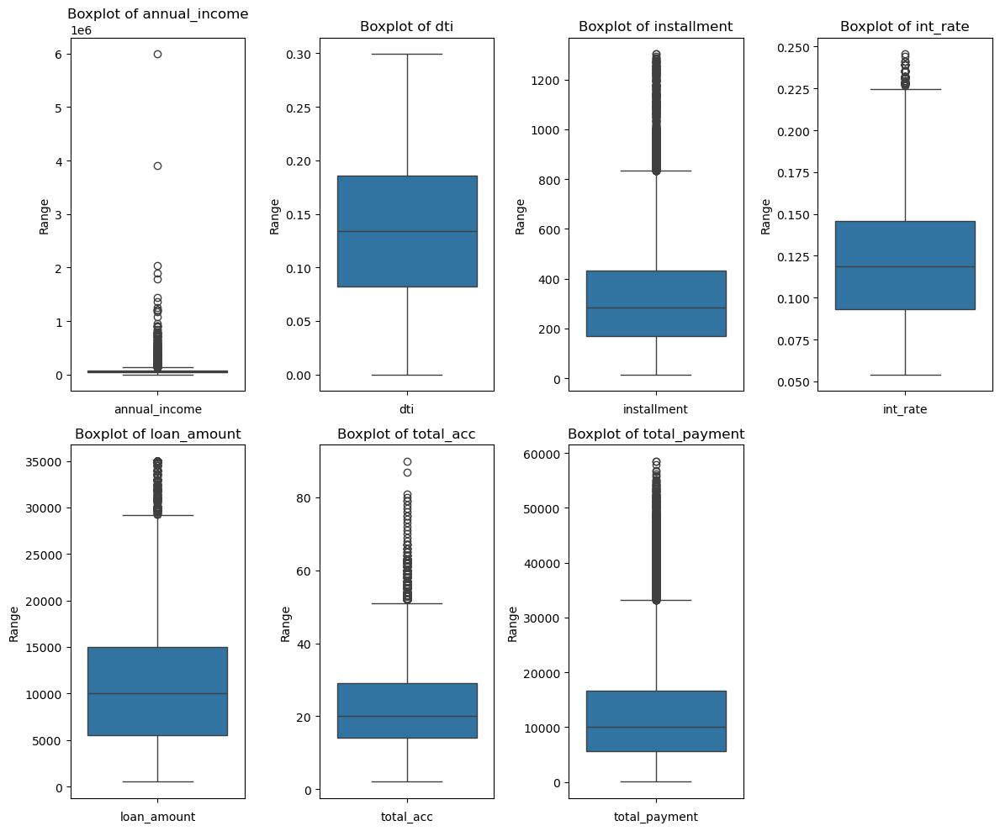

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.boxplot(data[i])
    plt.xlabel(i)
    plt.ylabel('Range')
    plt.title(f'Boxplot of {i}')
    t+=1
plt.tight_layout()
plt.show()


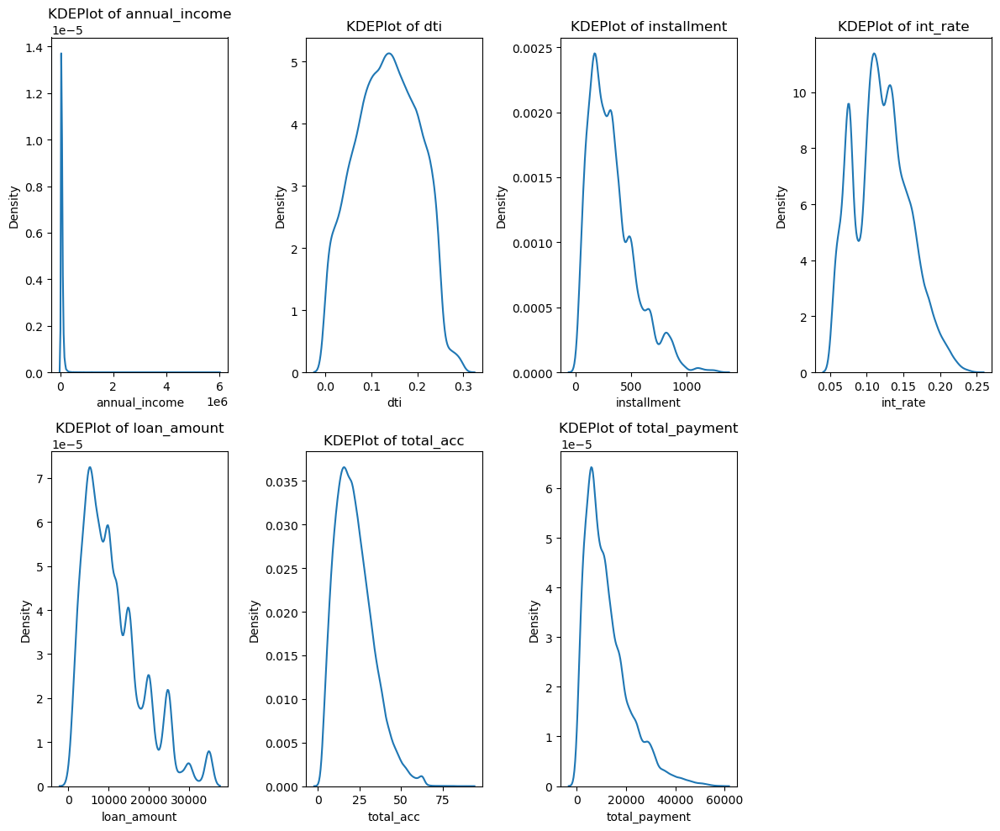

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.kdeplot(data[i])
    plt.xlabel(i)
    plt.ylabel('Density')
    plt.title(f'KDEPlot of {i}')
    t+=1
plt.tight_layout()
plt.show()


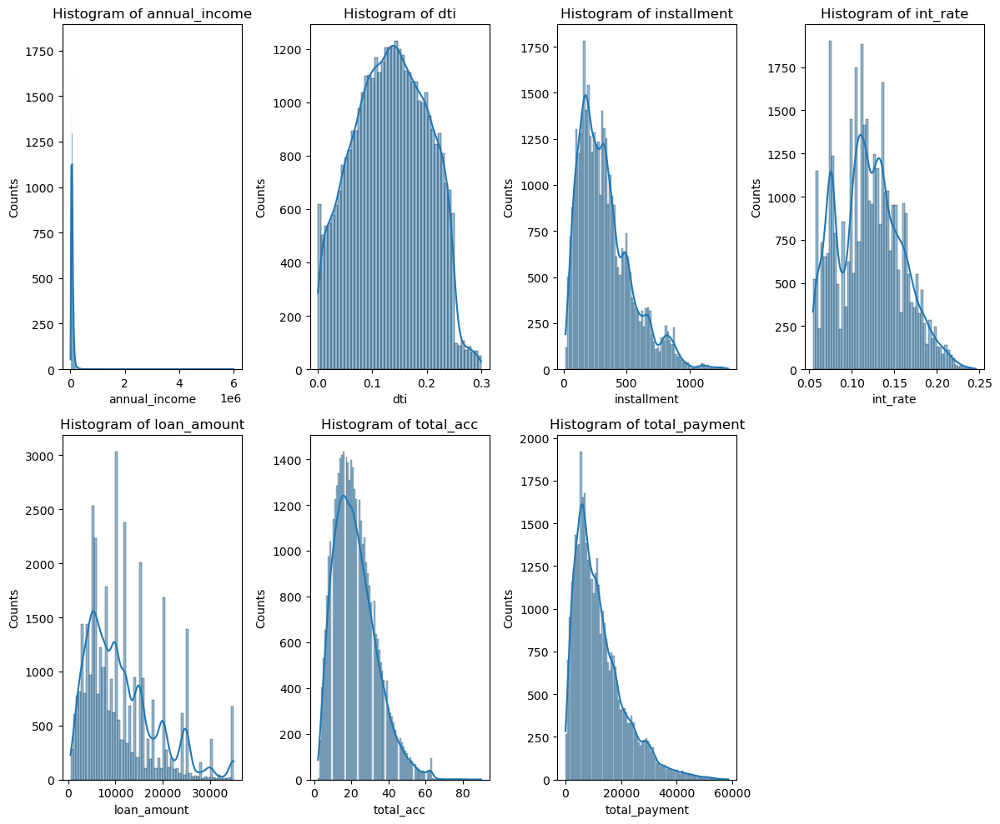

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.histplot(data[i],kde=True)
    plt.xlabel(i)
    plt.ylabel('Counts')
    plt.title(f'Histogram of {i}')
    t+=1
plt.tight_layout()
plt.show()


**Inference**:
* All numeric columns except **dti** have outliers
* Outlier treatment must be done to each column accordingly after EDA

#### Categoric Variables

In [ ]:
cat

['address_state',
 'emp_length',
 'Grade',
 'home_ownership',
 'issue_date',
 'last_credit_pull_date',
 'last_payment_date',
 'loan_status',
 'next_payment_date',
 'Purpose',
 'sub_grade',
 'term',
 'verification_status']

I'll seperate the date columns and put them in a seperate list

In [ ]:
dates = ['issue_date','last_payment_date','next_payment_date','last_credit_pull_date']

In [ ]:
cat.remove('issue_date')
cat.remove('last_credit_pull_date')
cat.remove('next_payment_date')
cat.remove('last_payment_date')

In [ ]:
dates

['issue_date',
 'last_payment_date',
 'next_payment_date',
 'last_credit_pull_date']

In [ ]:
cat

['address_state',
 'emp_length',
 'Grade',
 'home_ownership',
 'loan_status',
 'Purpose',
 'sub_grade',
 'term',
 'verification_status']

**Trying univariate analysis for variables in cat**

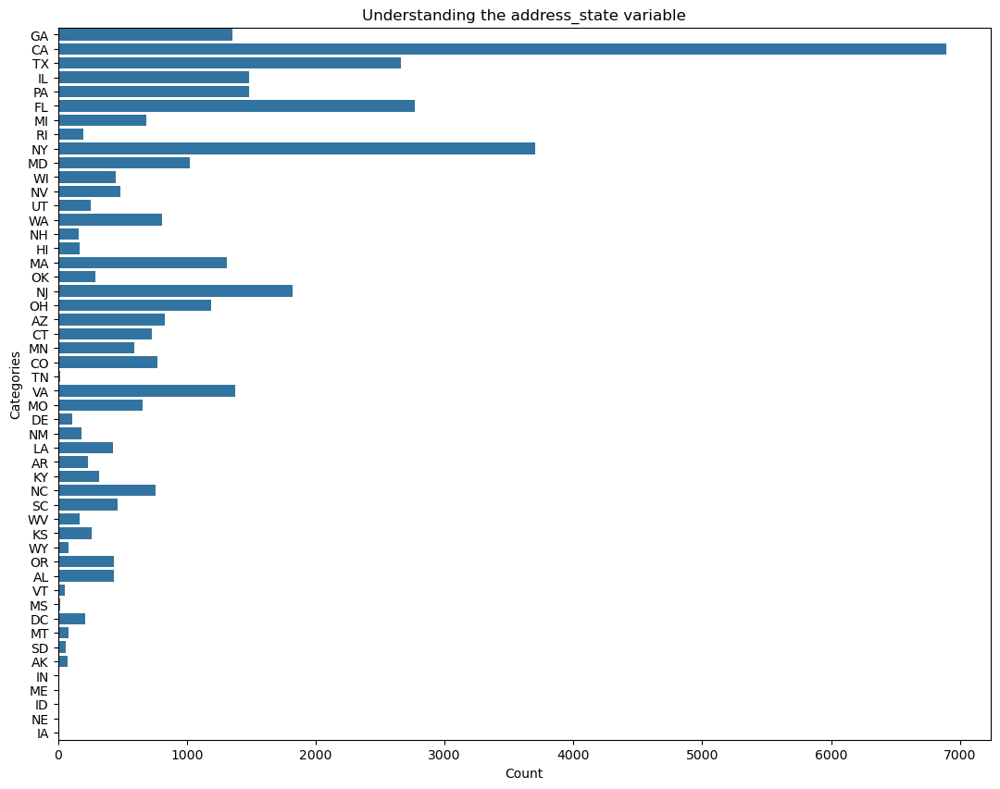

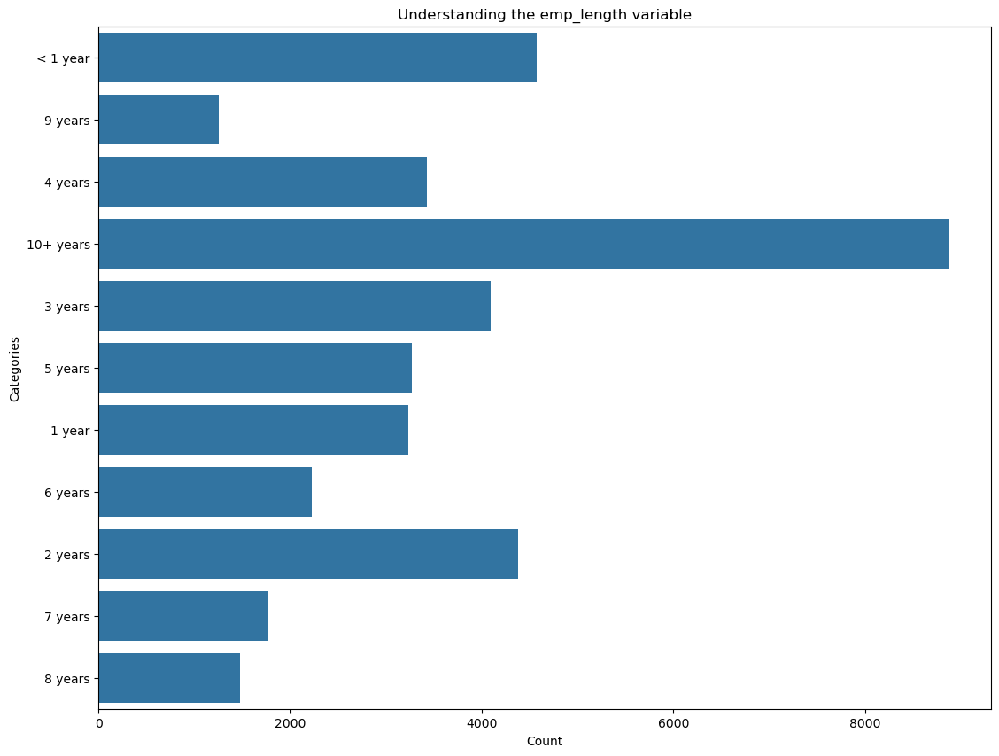

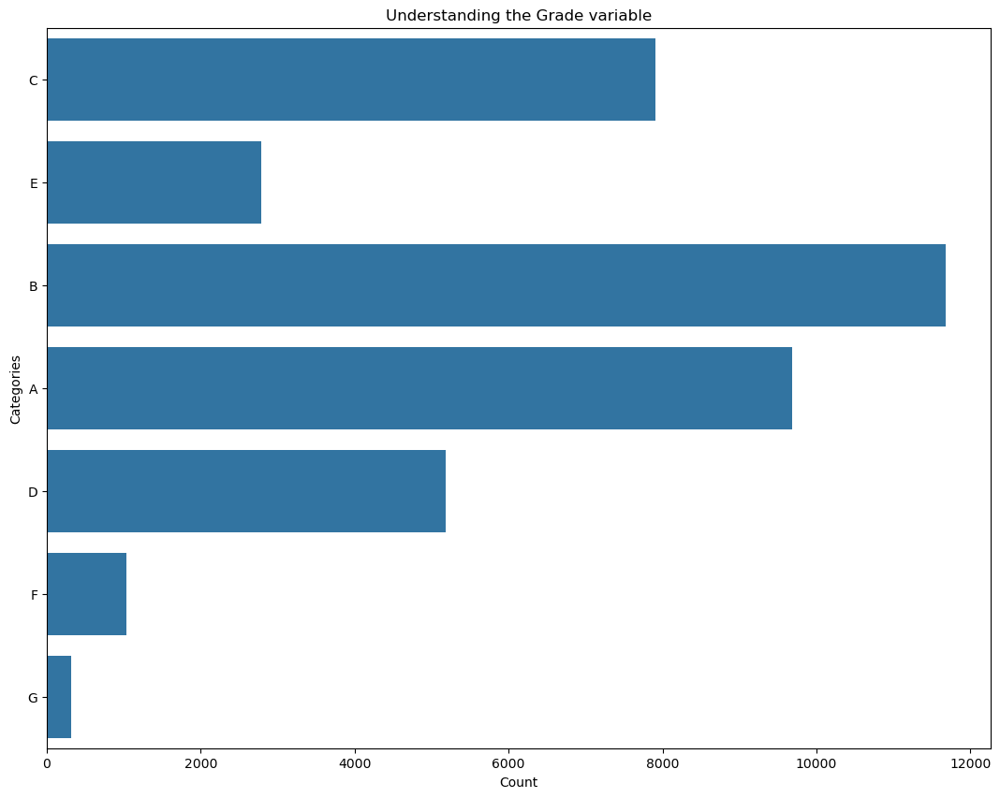

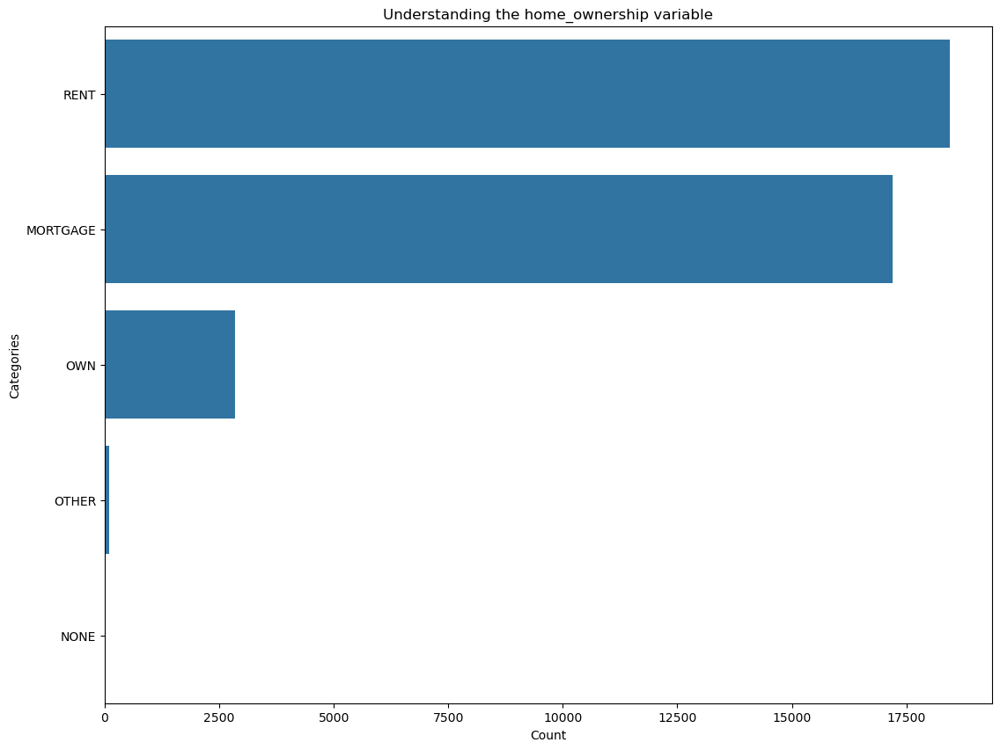

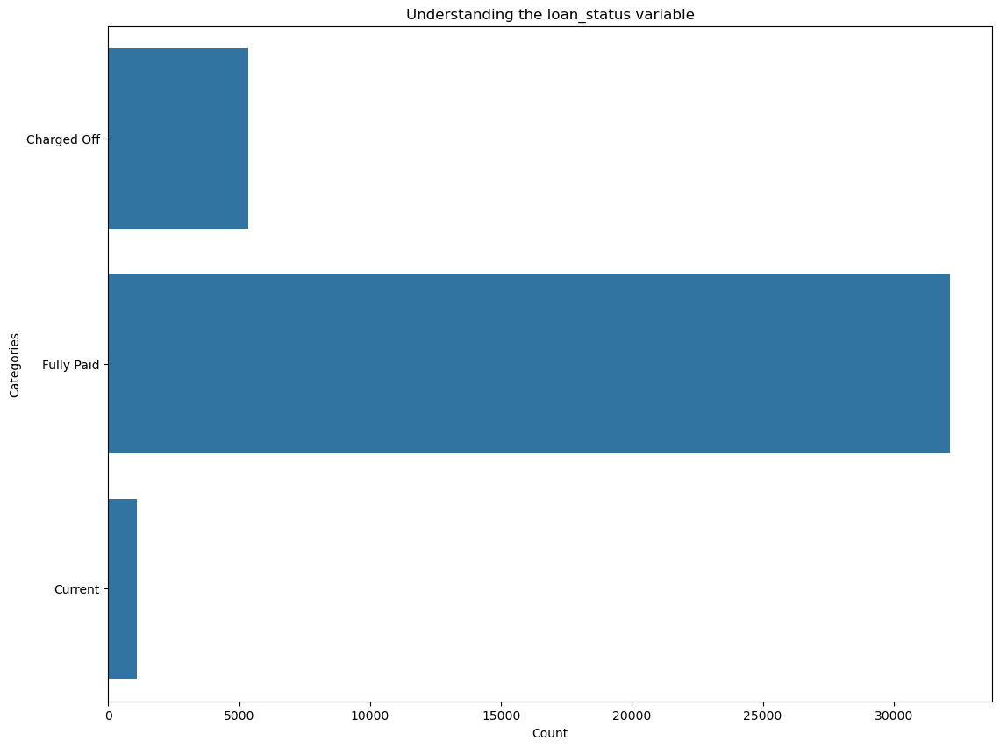

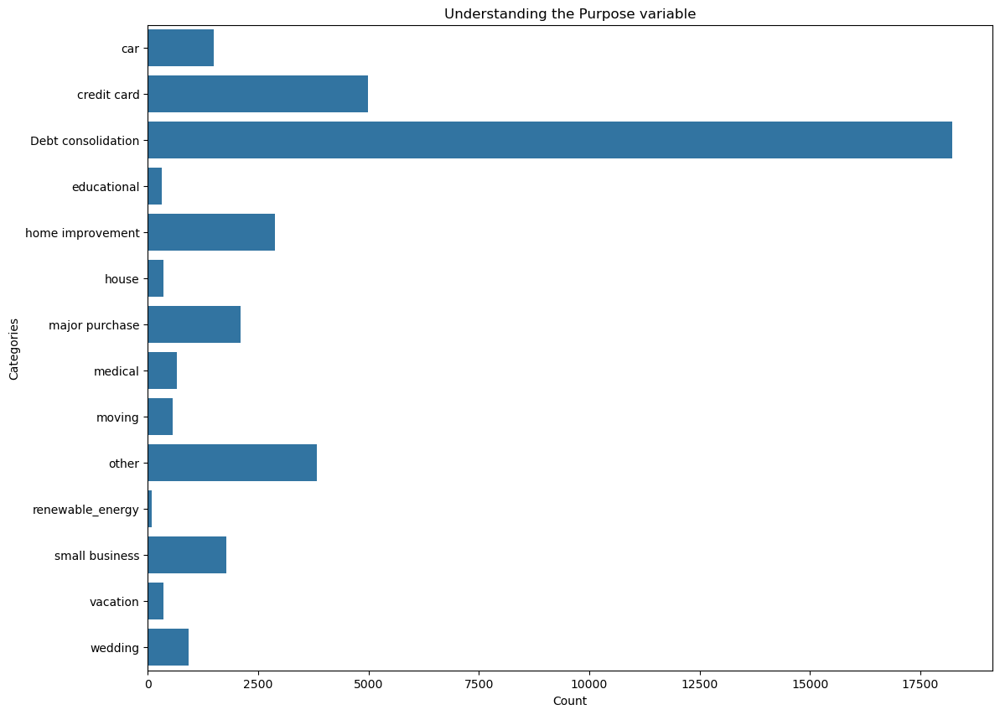

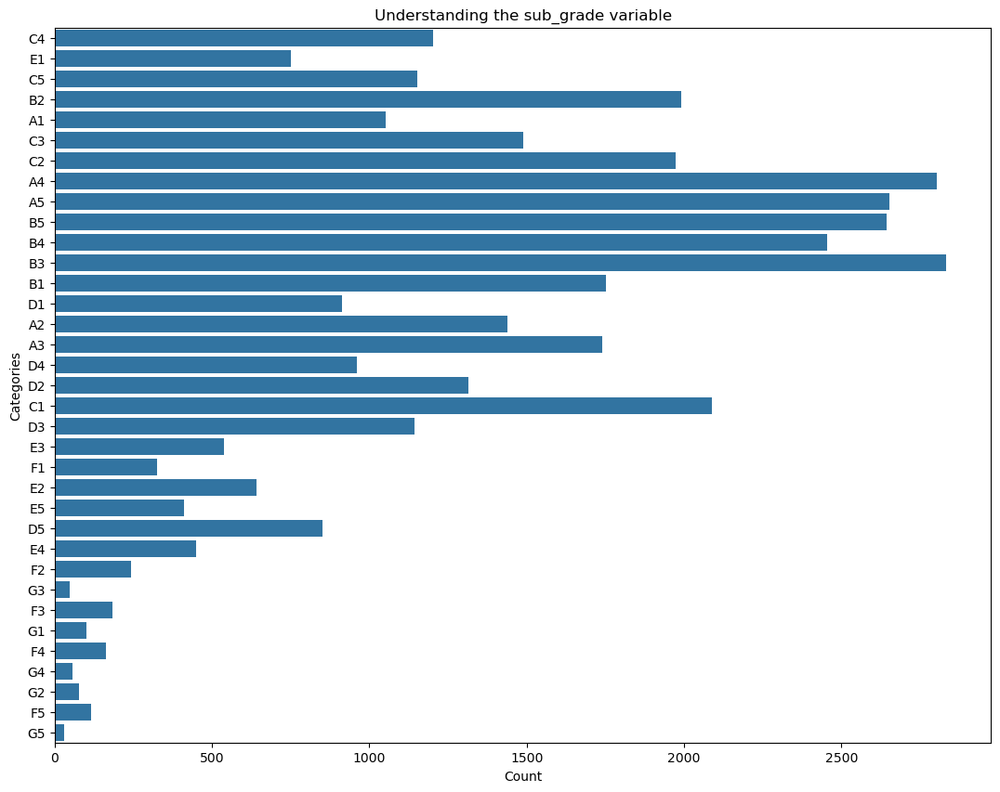

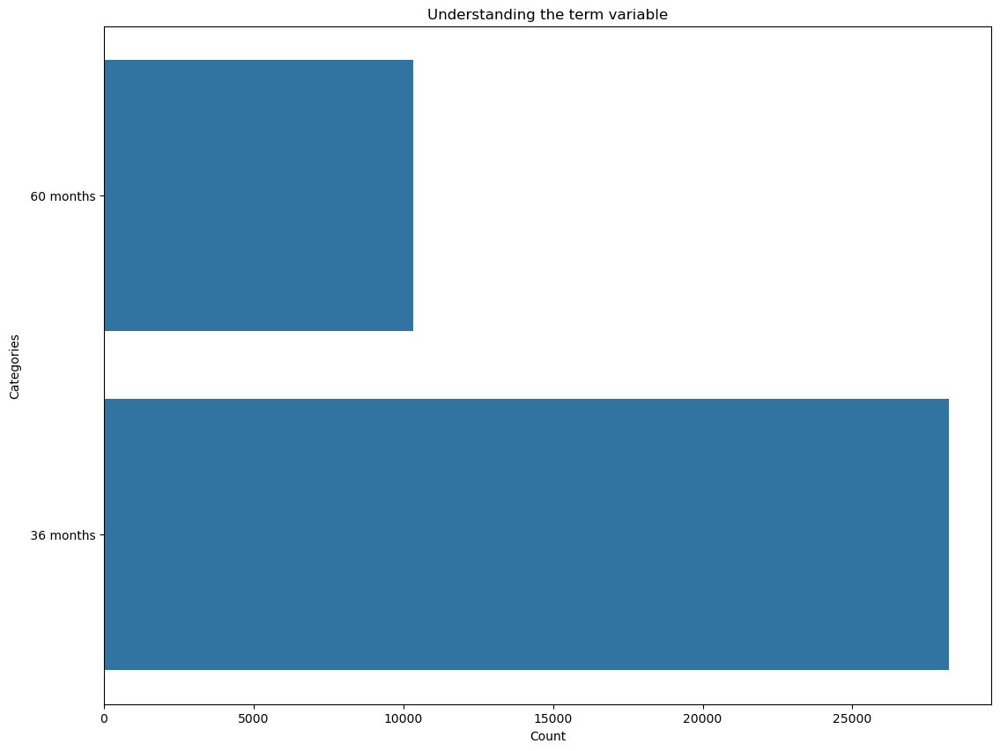

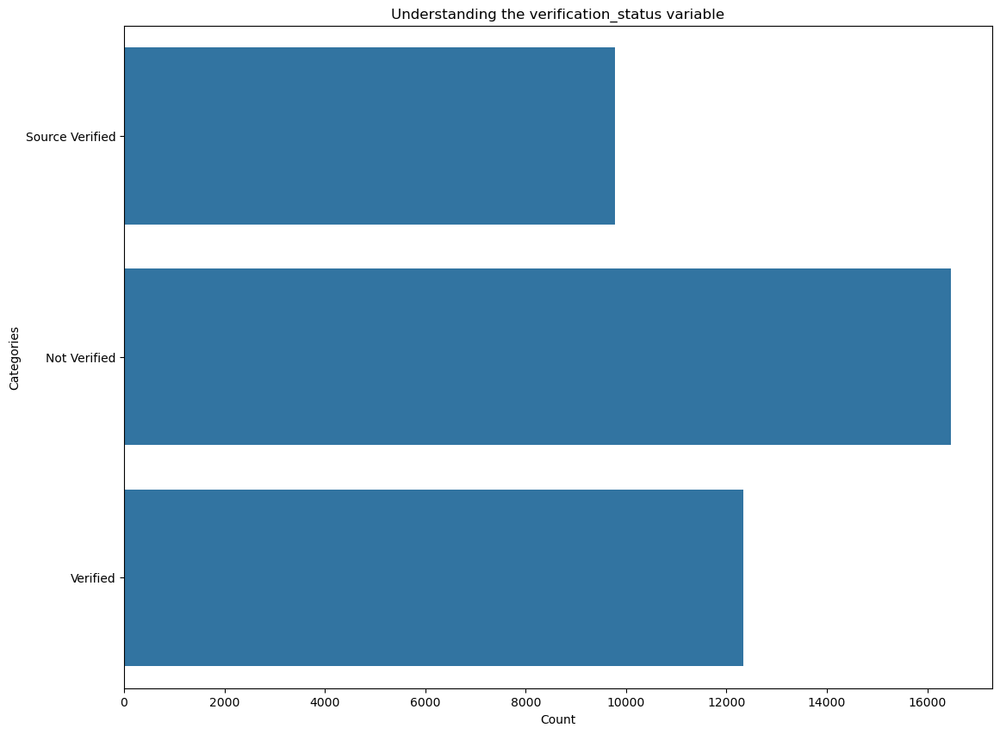

In [ ]:
for i in cat:
    plt.title(f'Understanding the {i} variable')
    sns.countplot(data=data,y=i)
    plt.ylabel('Categories')
    plt.xlabel('Count')
    plt.show()

**Insights**:
* Most borrowers seem to be from states CA and NY. There are quite a few states with minimal number of borrowers too
* Most borrowers seem to be employed for either more than ten years, or less than a year (< 1 year also includes Retired people other than new joinees in their jobs)
* Most loans are issued under grades A, B, C and D
* The 'OTHER' and 'NONE' categories in home_ownership column may be clubbed as 'OTHER' since the number of records itself seem to be less
* Most of the borrowers seem to be renting out their current home, as can be observed in 'RENT' under home_ownership
* A large number of the bank's borrowers have finished fully paying their loans
* Most borrowers seem to be asking for laons for the purpose of 'Debt Consolidation'
* The 'sub_grade' column can be analyzed further, since it seems there is a significant difference between sub_grades within each category of Grade
* Most loans are given out for a term of 36 months, the other term being 60 months
* The verification_status column has three distinct categories - 'Verified', 'Not Verified' and Source Verified' -- but with the emp_title column being removed, we don't need a distinction between 'Verified' and 'Source Verified' and these values can be replaced and clubbed together under 'Verified'

In [ ]:
data['home_ownership'].value_counts()

home_ownership
RENT        18439
MORTGAGE    17198
OWN          2838
OTHER          98
NONE            3
Name: count, dtype: int64

In [ ]:
data['home_ownership'] = data['home_ownership'].replace('NONE','OTHER')
data['home_ownership'].value_counts()

home_ownership
RENT        18439
MORTGAGE    17198
OWN          2838
OTHER         101
Name: count, dtype: int64

In [ ]:
data['verification_status'].value_counts()

verification_status
Not Verified       16464
Verified           12335
Source Verified     9777
Name: count, dtype: int64

In [ ]:
data['verification_status'] = data['verification_status'].replace('Source Verified','Verified')
data['verification_status'].value_counts()

verification_status
Verified        22112
Not Verified    16464
Name: count, dtype: int64

Now let's look at the target variable

#### Target Variable - Good vs Bad Loan

In [ ]:
target

'Good vs Bad Loan'

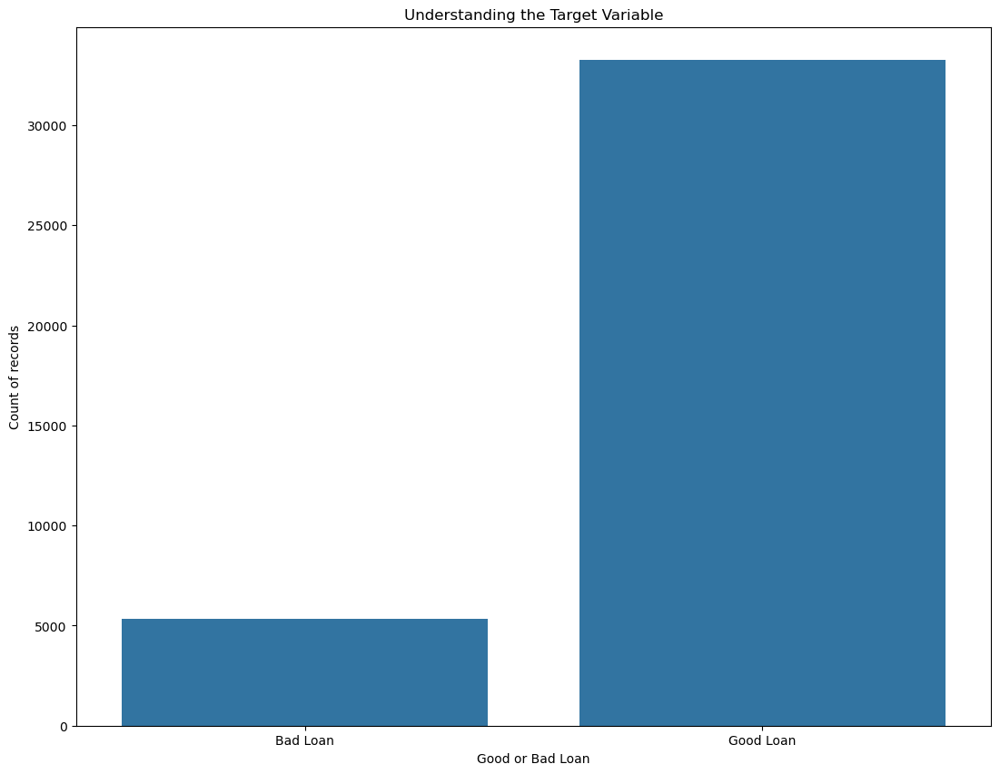

In [ ]:
sns.countplot(data=data,x=target)
plt.title('Understanding the Target Variable')
plt.xlabel('Good or Bad Loan')
plt.ylabel('Count of records')
plt.show()

**Inference**:
* Class imbalance present in the target variable -- most records/data are those of 'Good' loans

In [ ]:
data[target].value_counts(normalize=True)*100

Good vs Bad Loan
Good Loan    86.175342
Bad Loan     13.824658
Name: proportion, dtype: float64

The remaining columns to be analyzed are the columns pertaining to dates

#### Date columns

In [ ]:
dates

['issue_date',
 'last_payment_date',
 'next_payment_date',
 'last_credit_pull_date']

In [ ]:
data[dates].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   issue_date             38576 non-null  object
 1   last_payment_date      38576 non-null  object
 2   next_payment_date      38576 non-null  object
 3   last_credit_pull_date  38576 non-null  object
dtypes: object(4)
memory usage: 1.2+ MB


In [ ]:
data[dates].head()

,issue_date,last_payment_date,next_payment_date,last_credit_pull_date
0,2/11/2021,4/13/2021,5/13/2021,9/13/2021
1,1/1/2021,1/15/2021,2/15/2021,12/14/2021
2,1/5/2021,1/9/2021,2/9/2021,12/12/2021
3,2/25/2021,3/12/2021,4/12/2021,12/12/2021
4,1/1/2021,1/15/2021,2/15/2021,12/14/2021


These columns are all of object datatype. We shgall first convert them to datetime datatype so they'd be of more use for analysis

In [ ]:
for col in dates:
    data[col] = pd.to_datetime(data[col], format='%m/%d/%Y')

In [ ]:
data[dates].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   issue_date             38576 non-null  datetime64[ns]
 1   last_payment_date      38576 non-null  datetime64[ns]
 2   next_payment_date      38576 non-null  datetime64[ns]
 3   last_credit_pull_date  38576 non-null  datetime64[ns]
dtypes: datetime64[ns](4)
memory usage: 1.2 MB


In [ ]:
data[dates].isnull().sum()

issue_date               0
last_payment_date        0
next_payment_date        0
last_credit_pull_date    0
dtype: int64

In [ ]:
data[dates].head()

,issue_date,last_payment_date,next_payment_date,last_credit_pull_date
0,2021-02-11,2021-04-13,2021-05-13,2021-09-13
1,2021-01-01,2021-01-15,2021-02-15,2021-12-14
2,2021-01-05,2021-01-09,2021-02-09,2021-12-12
3,2021-02-25,2021-03-12,2021-04-12,2021-12-12
4,2021-01-01,2021-01-15,2021-02-15,2021-12-14


In [ ]:
#Verifying with data.info() for all columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   address_state          38576 non-null  object        
 1   emp_length             38576 non-null  object        
 2   Grade                  38576 non-null  object        
 3   home_ownership         38576 non-null  object        
 4   issue_date             38576 non-null  datetime64[ns]
 5   last_credit_pull_date  38576 non-null  datetime64[ns]
 6   last_payment_date      38576 non-null  datetime64[ns]
 7   loan_status            38576 non-null  object        
 8   Good vs Bad Loan       38576 non-null  object        
 9   next_payment_date      38576 non-null  datetime64[ns]
 10  Purpose                38576 non-null  object        
 11  sub_grade              38576 non-null  object        
 12  term                   38576 non-null  object        
 13  v

**Understanding the dates columns**


In [ ]:
dates_df = data[dates]
dates_df.head()

,issue_date,last_payment_date,next_payment_date,last_credit_pull_date
0,2021-02-11,2021-04-13,2021-05-13,2021-09-13
1,2021-01-01,2021-01-15,2021-02-15,2021-12-14
2,2021-01-05,2021-01-09,2021-02-09,2021-12-12
3,2021-02-25,2021-03-12,2021-04-12,2021-12-12
4,2021-01-01,2021-01-15,2021-02-15,2021-12-14


In [ ]:
for i in dates_df.columns:
  print('--------------------')
  print(f'The {i} column has data about loans taken in these years: {dates_df[i].dt.year.unique()}')

--------------------
The issue_date column has data about loans taken in these years: [2021]
--------------------
The last_payment_date column has data about loans taken in these years: [2021]
--------------------
The next_payment_date column has data about loans taken in these years: [2021 2022]
--------------------
The last_credit_pull_date column has data about loans taken in these years: [2021 2022]


In [ ]:
for i in dates_df.columns:
  if len(dates_df[i].dt.year.unique()) > 1:
    print('--------------------')
    print(f'The number of entries in column {i} for the years are: {dates_df[i].dt.year.value_counts()}')

--------------------
The number of entries in column next_payment_date for the years are: next_payment_date
2021    35160
2022     3416
Name: count, dtype: int64
--------------------
The number of entries in column last_credit_pull_date for the years are: last_credit_pull_date
2021    38575
2022        1
Name: count, dtype: int64


In [ ]:
dates_df.head()

,issue_date,last_payment_date,next_payment_date,last_credit_pull_date
0,2021-02-11,2021-04-13,2021-05-13,2021-09-13
1,2021-01-01,2021-01-15,2021-02-15,2021-12-14
2,2021-01-05,2021-01-09,2021-02-09,2021-12-12
3,2021-02-25,2021-03-12,2021-04-12,2021-12-12
4,2021-01-01,2021-01-15,2021-02-15,2021-12-14


The intervals between the different dates with respect to loan payment seem to be very minimal.

Trying to add more info to dates_df to see if we can understand the characteristics of a good and bad loan with respect to dates

In [ ]:
dates_df['term'] = data['term']
dates_df['loan_status'] = data['loan_status']
dates_df['Good vs Bad Loan'] = data['Good vs Bad Loan']
dates_df.head()

,issue_date,last_payment_date,next_payment_date,last_credit_pull_date,term,loan_status,Good vs Bad Loan
0,2021-02-11,2021-04-13,2021-05-13,2021-09-13,60 months,Charged Off,Bad Loan
1,2021-01-01,2021-01-15,2021-02-15,2021-12-14,36 months,Fully Paid,Good Loan
2,2021-01-05,2021-01-09,2021-02-09,2021-12-12,36 months,Charged Off,Bad Loan
3,2021-02-25,2021-03-12,2021-04-12,2021-12-12,60 months,Fully Paid,Good Loan
4,2021-01-01,2021-01-15,2021-02-15,2021-12-14,36 months,Fully Paid,Good Loan


In [ ]:
#Let's try to make some new columns
##Creating new columns
#Creating new columns
dates_df['loan_age_at_last_pull_days'] = (dates_df['last_credit_pull_date'] - dates_df['issue_date']).dt.days

In [ ]:
dates_df['days_since_last_payment_at_pull'] = (dates_df['last_credit_pull_date'] - dates_df['last_payment_date']).dt.days

In [ ]:
dates_df['duration_issued_and_last_paid'] = (dates_df['last_payment_date'] - dates_df['issue_date']).dt.days

In [ ]:
dates_df

,issue_date,last_payment_date,next_payment_date,last_credit_pull_date,term,loan_status,Good vs Bad Loan,loan_age_at_last_pull_days,days_since_last_payment_at_pull,duration_issued_and_last_paid
0,2021-02-11,2021-04-13,2021-05-13,2021-09-13,60 months,Charged Off,Bad Loan,214,153,61
1,2021-01-01,2021-01-15,2021-02-15,2021-12-14,36 months,Fully Paid,Good Loan,347,333,14
2,2021-01-05,2021-01-09,2021-02-09,2021-12-12,36 months,Charged Off,Bad Loan,341,337,4
3,2021-02-25,2021-03-12,2021-04-12,2021-12-12,60 months,Fully Paid,Good Loan,290,275,15
4,2021-01-01,2021-01-15,2021-02-15,2021-12-14,36 months,Fully Paid,Good Loan,347,333,14
...,...,...,...,...,...,...,...,...,...,...
38571,2021-07-11,2021-05-16,2021-06-16,2021-05-16,60 months,Current,Good Loan,-56,0,-56
38572,2021-10-11,2021-05-16,2021-06-16,2021-04-16,60 months,Current,Good Loan,-178,-30,-148
38573,2021-09-11,2021-05-16,2021-06-16,2021-05-16,60 months,Current,Good Loan,-118,0,-118
38574,2021-10-11,2021-05-16,2021-06-16,2021-05-16,60 months,Current,Good Loan,-148,0,-148


Observing some negative values in the column duration_issued_and_last_paid, which is not logically correct since loan's last_payment_date should always be after issue_date

In [ ]:
# Create the new boolean column
dates_df['is_payment_after_issue'] = dates_df['last_payment_date'] > dates_df['issue_date']

# Display the head of the DataFrame with the new column to verify
print(dates_df[['issue_date', 'last_payment_date', 'is_payment_after_issue']].head())

# Display the value counts of the new column
print("\nValue counts for 'is_payment_after_issue':")
print(dates_df['is_payment_after_issue'].value_counts())

  issue_date last_payment_date  is_payment_after_issue
0 2021-02-11        2021-04-13                    True
1 2021-01-01        2021-01-15                    True
2 2021-01-05        2021-01-09                    True
3 2021-02-25        2021-03-12                    True
4 2021-01-01        2021-01-15                    True

Value counts for 'is_payment_after_issue':
is_payment_after_issue
True     23120
False    15456
Name: count, dtype: int64


We have 15000+ records where the issue_date is after last_payment_date, which is logically wrong. This could be due to data entry error. It would be best to drop the date columns

Further, There doesn't seem to be a logical explanation as to why the loan is classified as Good or Bad just with the date information alone. For instance, in row number 1,
* The issue date is 1st Jan, 2021
* The last recorded date of payment seems to be 15th Jan 2021
* The next scheduled payment date for the loan is 15th February
* The last time the credit info of the loan was pulled is 14th of December

This loan is still classified as 'Good Loan'.

Logically, as of 2021-12-14 (last observed date), the last_payment_date was 2021-01-15. This is almost 11 months with no further recorded payment based on the data provided for last_payment_date.

However, it's labeled a "Good Loan." This almost certainly implies that the loan was fully paid off (as indicated by 'Fully Paid' loan status) before the last_credit_pull_date of 2021-12-14. The last_payment_date of 2021-01-15 would then represent the final payment made on that loan, even if the loan continued for a few more months to accrue interest or fulfill its term before official closure.

In essence, the loan completed its lifecycle as expected, even if the last reported payment in this specific snapshot appears far in the past.

Which means the dates or intervals between dates wouldn't matter as long as the loan is fully paid in the end. This suggests that the date columns don't have much of a role in predicting whether the loan is a good one or not.

Further, the data seems to be for 2021, mostly, and the intervals between payments seem to be very short, with no variation. This suggests we can drop the dates and we'd still have information about whether the loan was Fully Paid or not (loan_status column) and that seems to have more say than the dates itself

In [ ]:
data.drop(dates, axis=1,inplace=True)

In [ ]:
data.columns

Index(['address_state', 'emp_length', 'Grade', 'home_ownership', 'loan_status',
       'Good vs Bad Loan', 'Purpose', 'sub_grade', 'term',
       'verification_status', 'annual_income', 'dti', 'installment',
       'int_rate', 'loan_amount', 'total_acc', 'total_payment'],
      dtype='object')

In [ ]:
data.shape

(38576, 17)

In [ ]:
del dates_df,dates

### Bivariate Analysis

**Simple Bivariate**

Simple bivariate - just comparing all the columns with the target variable.

This would give us a range, ex: dti values range between 0.05 and 0.6 for a 'Good Loan' and 0.3 to 0.8 for a 'Bad Loan'. Basically just general information for us to be aware of.

In [ ]:
target

'Good vs Bad Loan'

In [ ]:
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

In [ ]:
cat

['address_state',
 'emp_length',
 'Grade',
 'home_ownership',
 'loan_status',
 'Purpose',
 'sub_grade',
 'term',
 'verification_status']

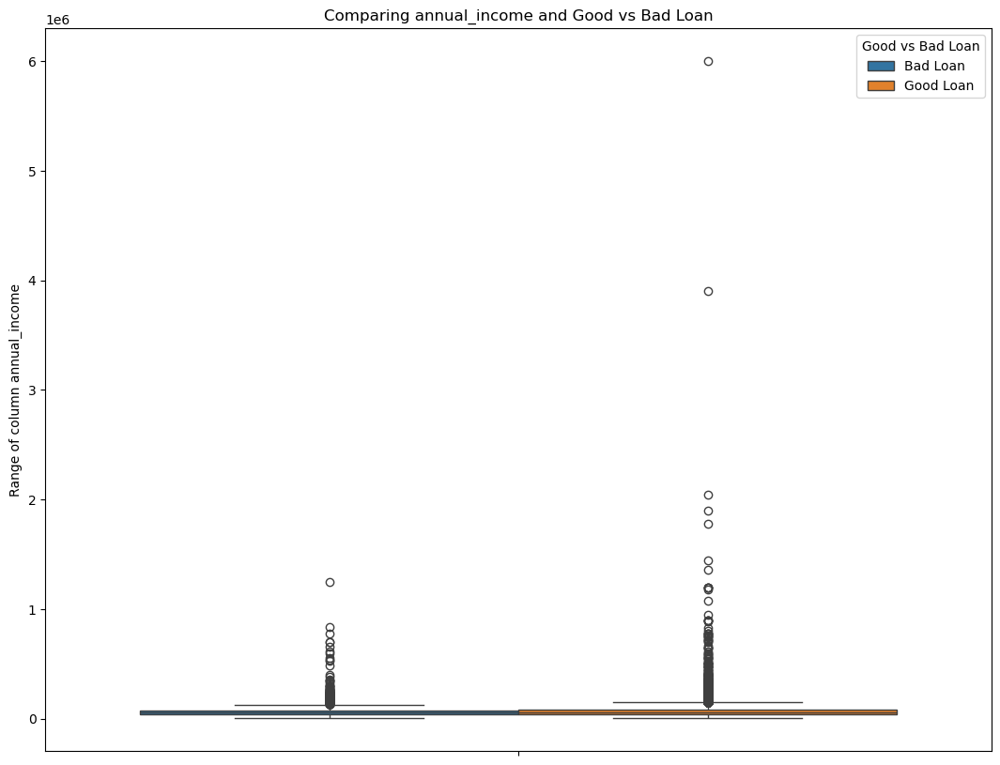

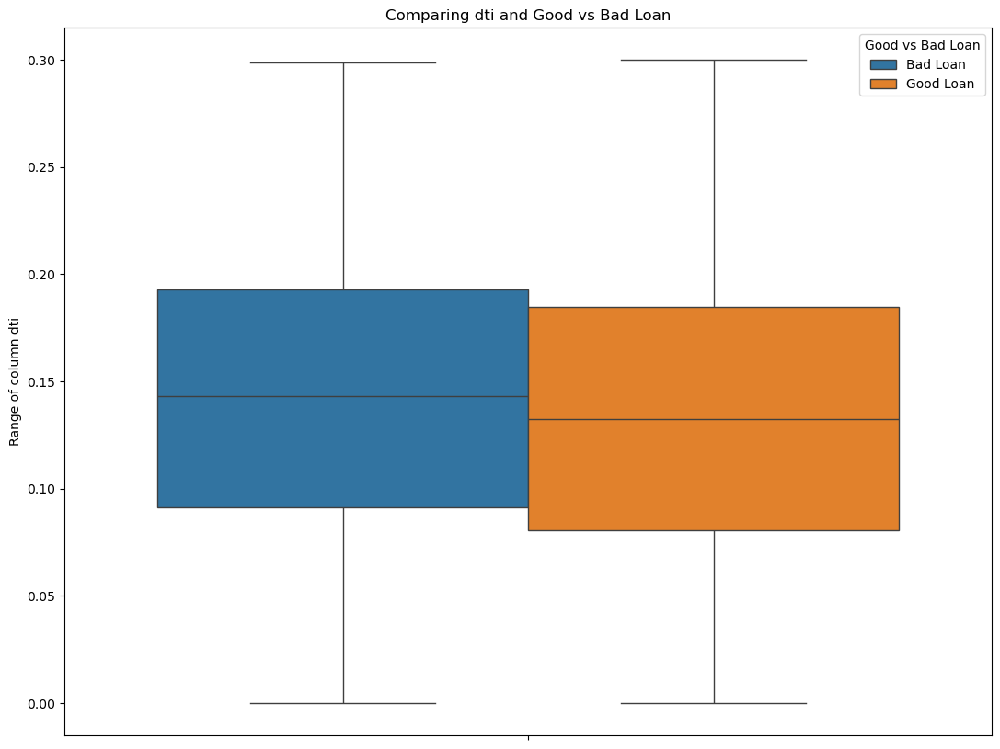

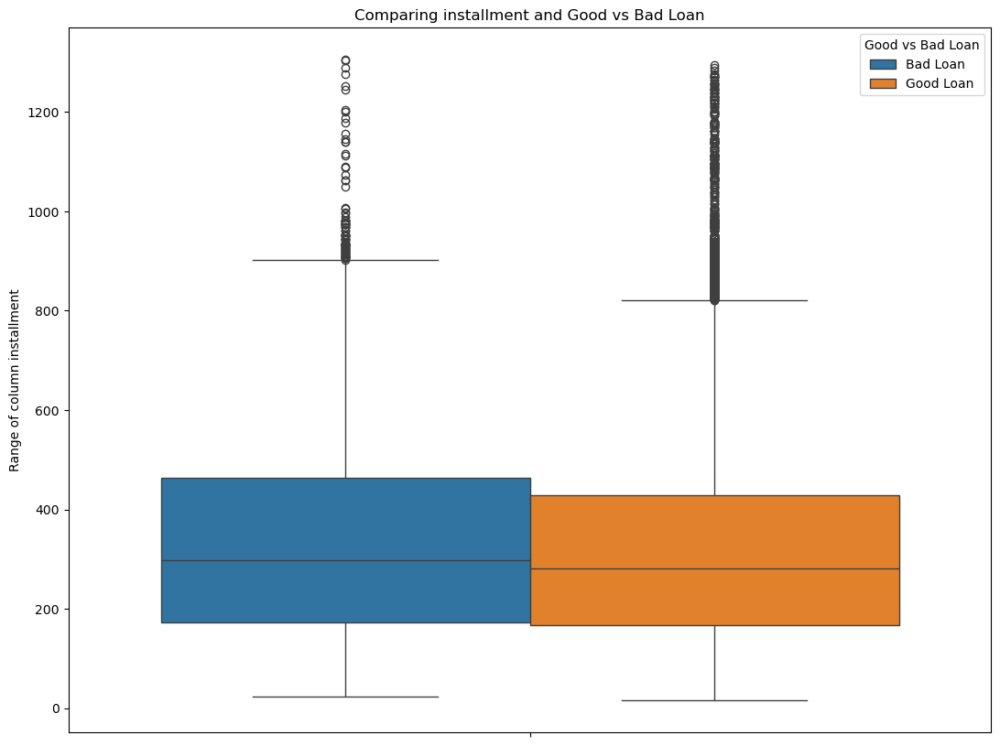

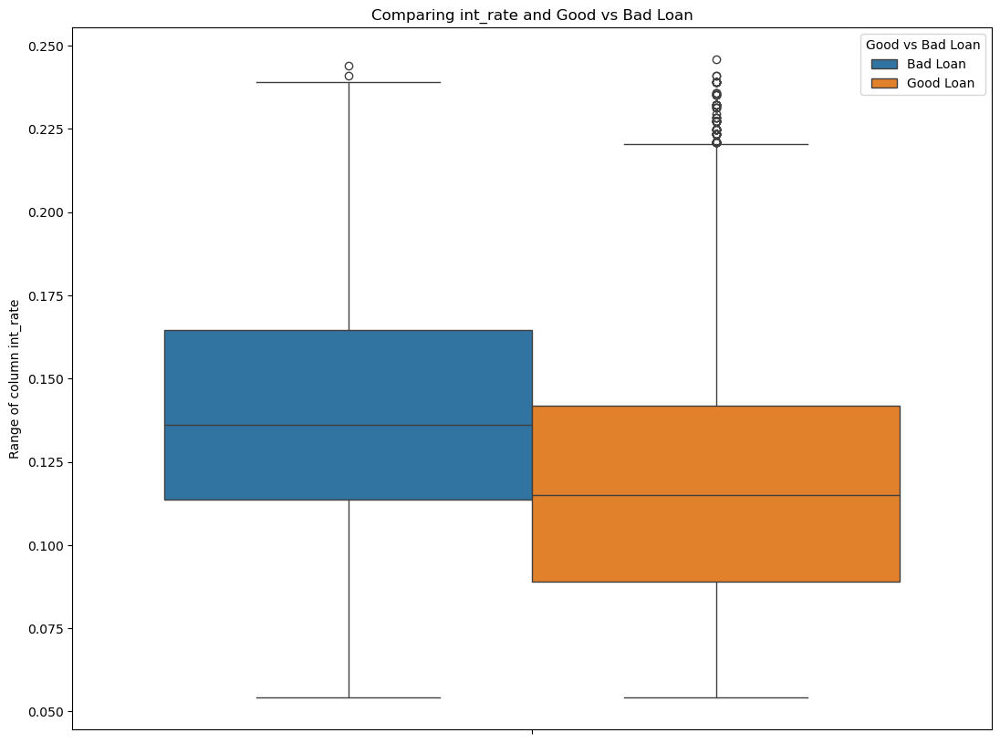

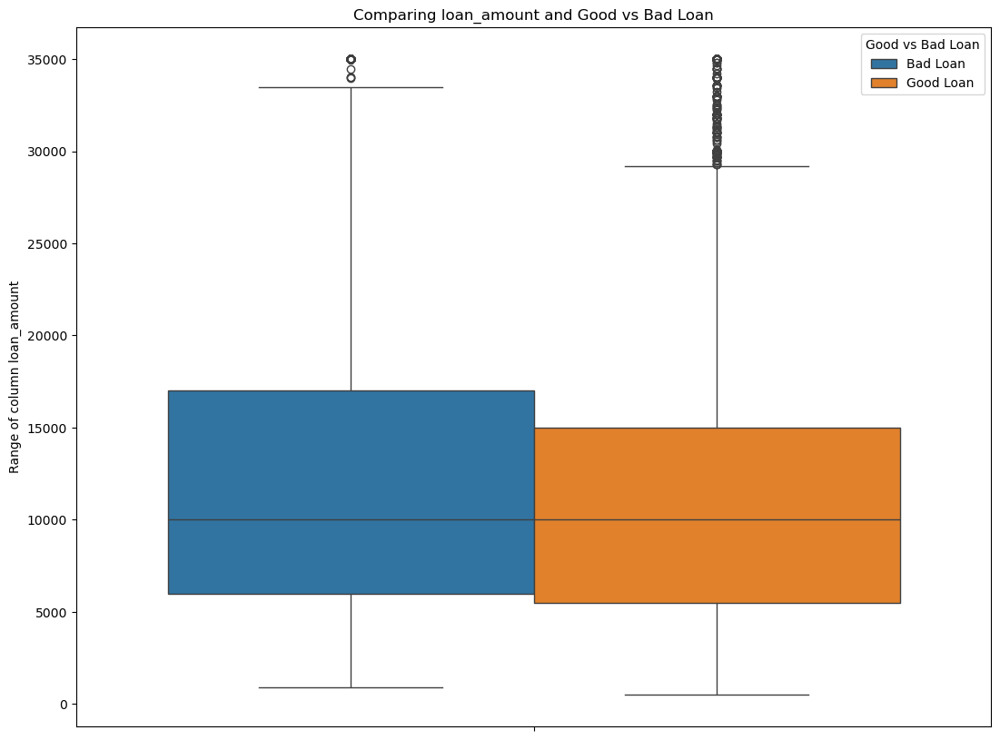

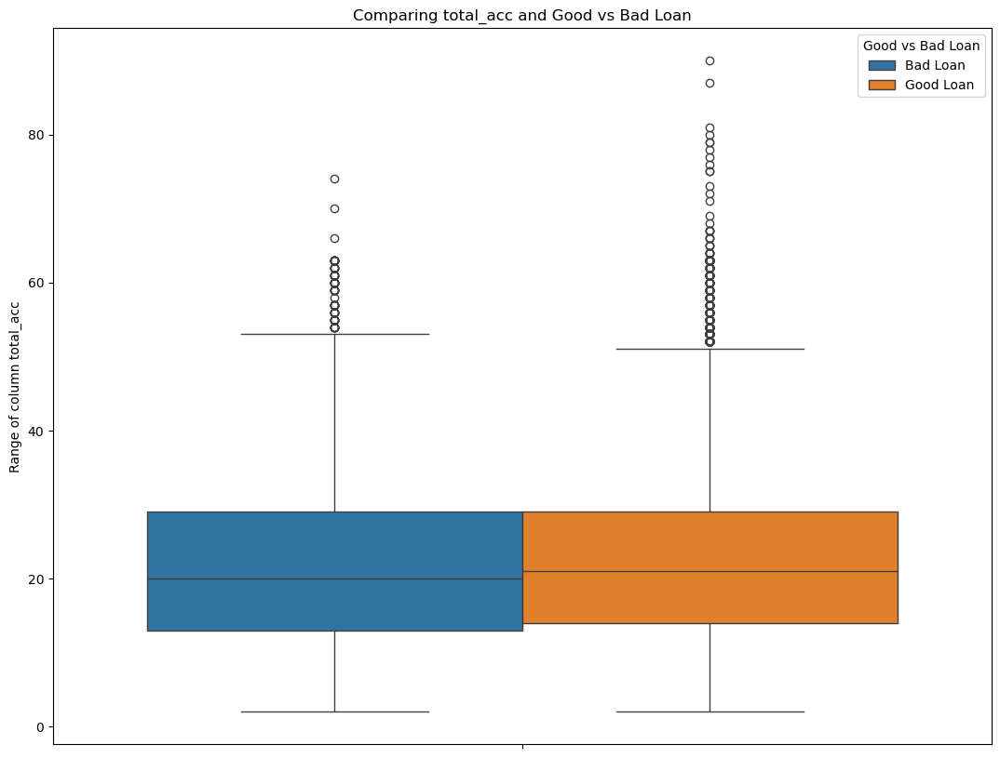

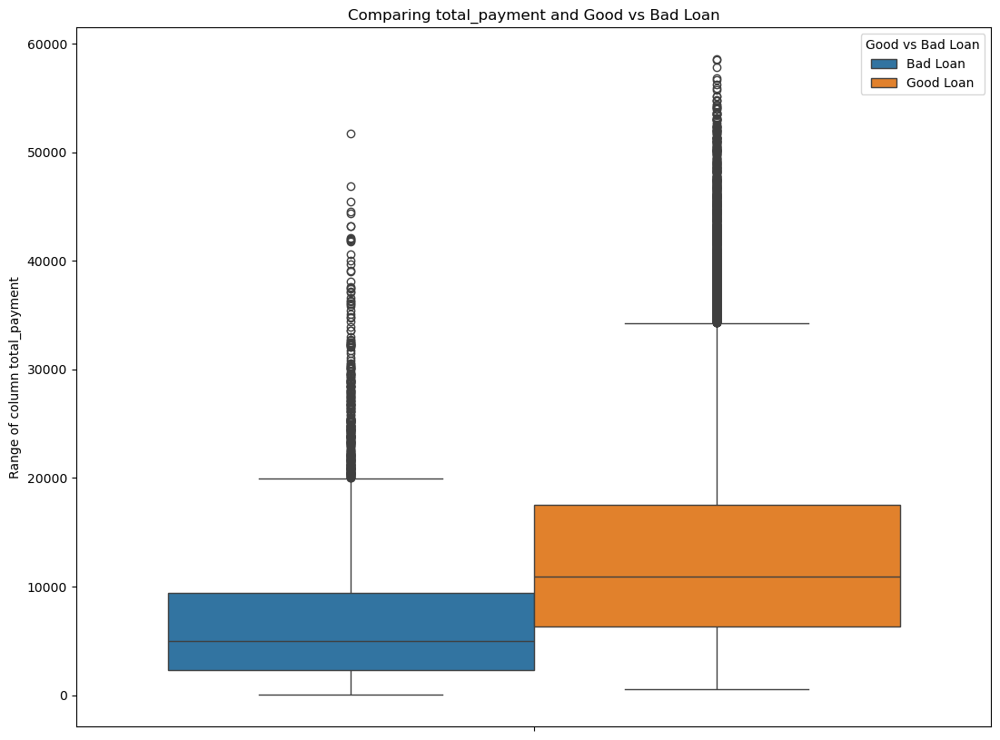

In [ ]:
for i in num:
    sns.boxplot(data=data,y=i,hue=target)
    plt.ylabel(f'Range of column {i}')
    plt.title(f'Comparing {i} and {target}')
    plt.show()

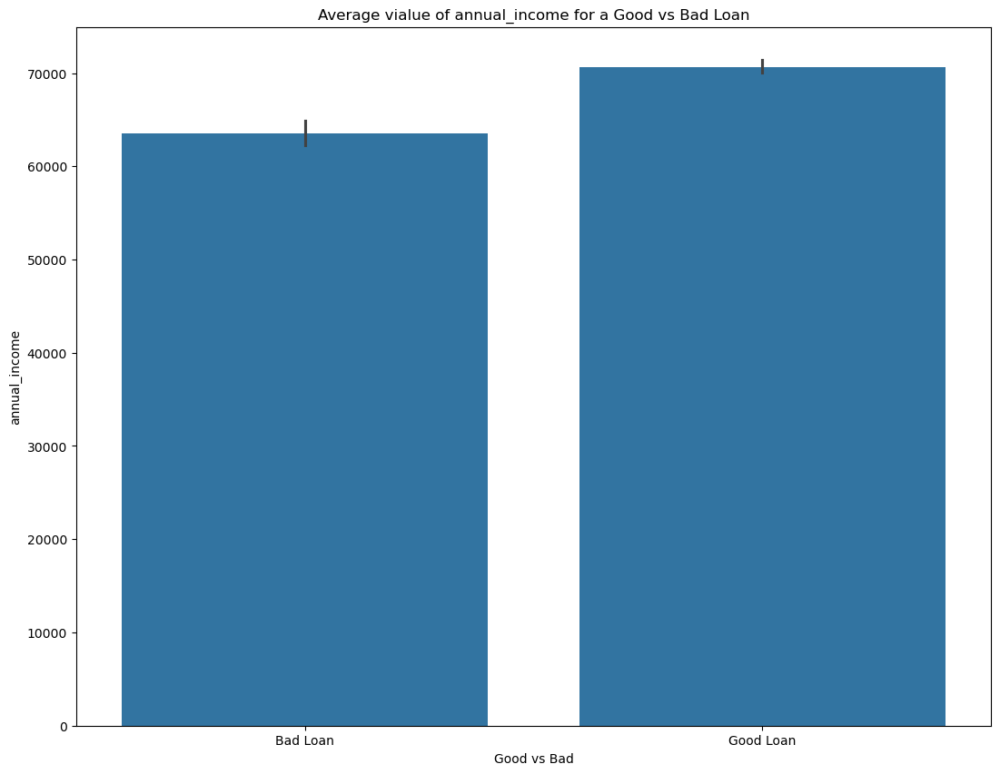

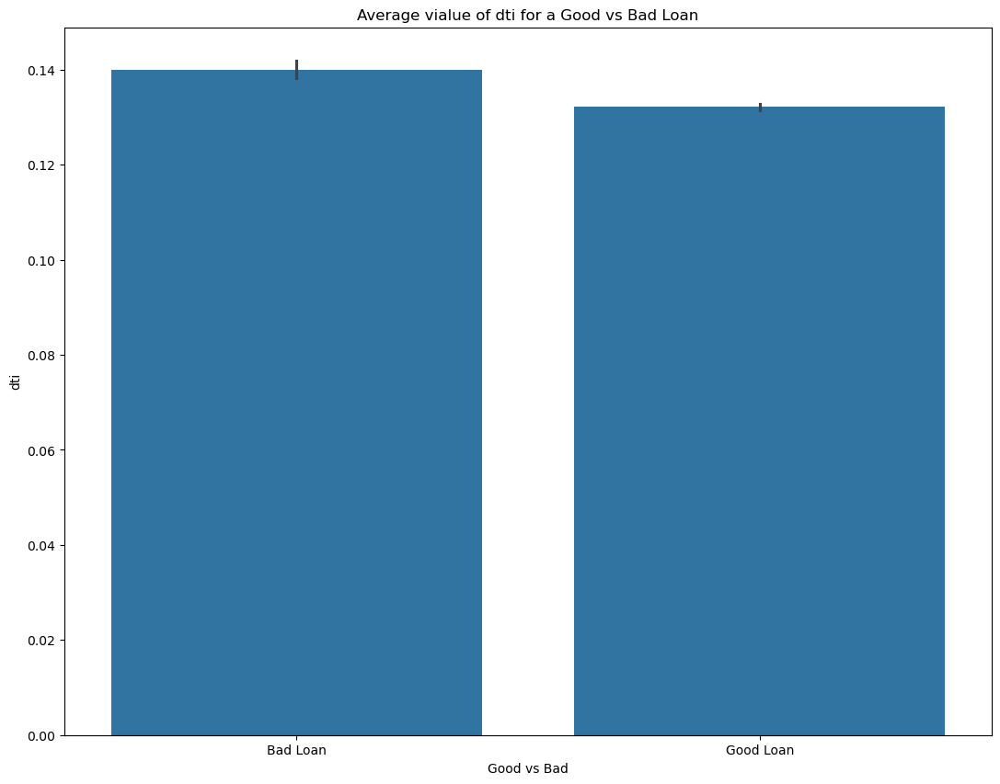

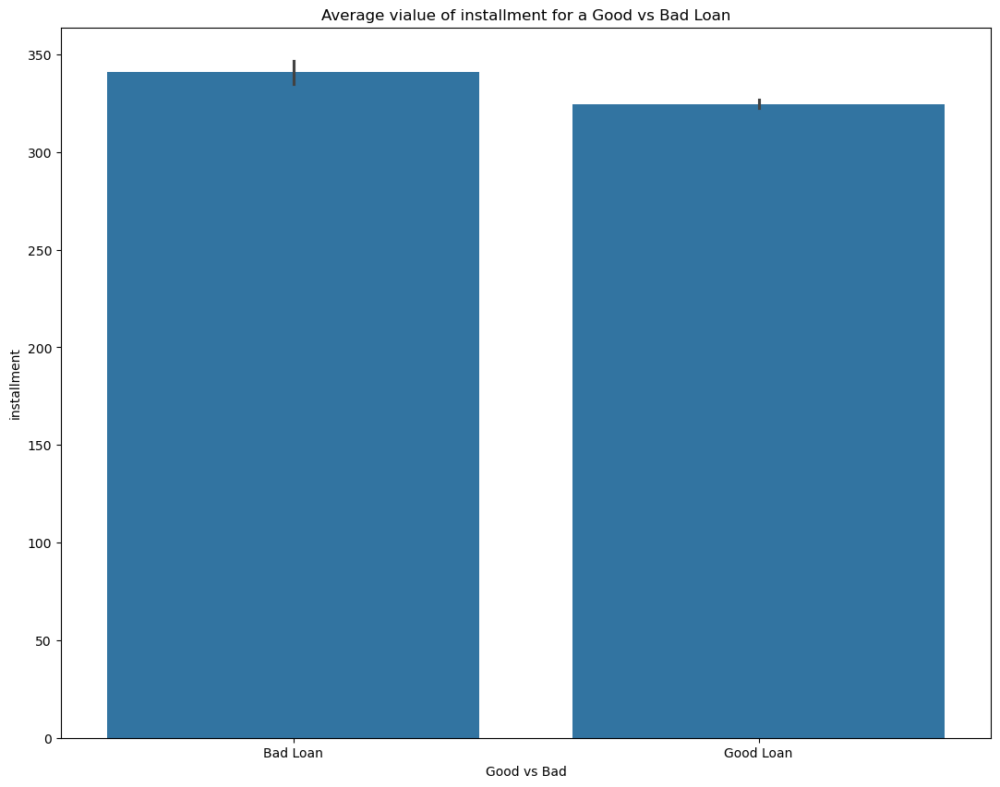

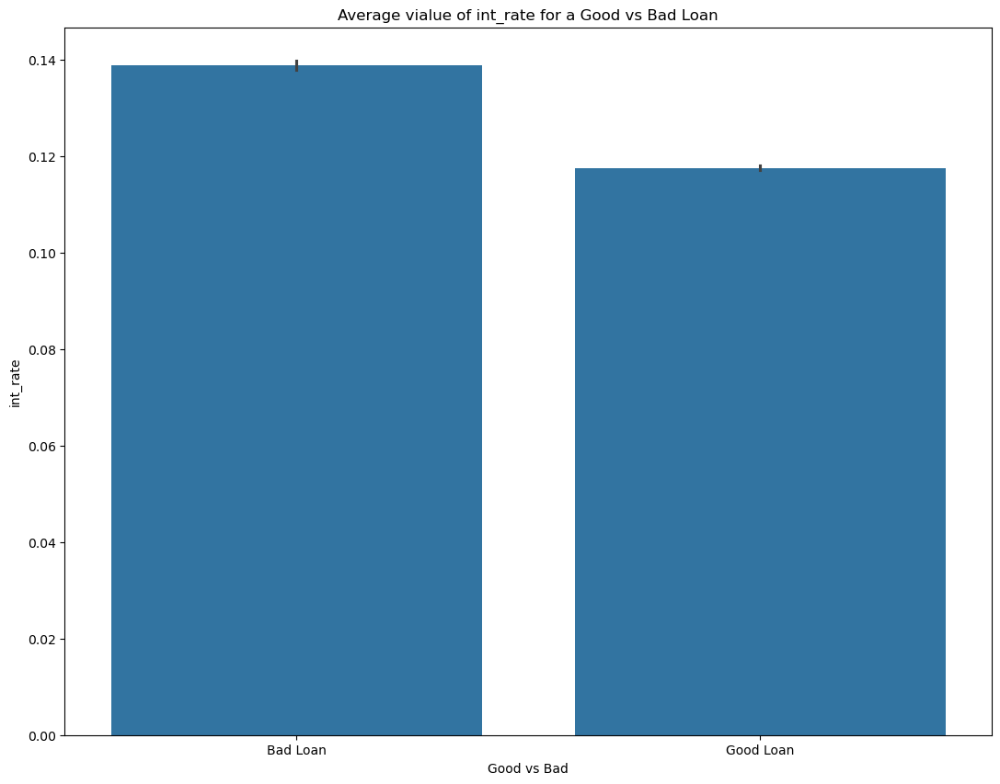

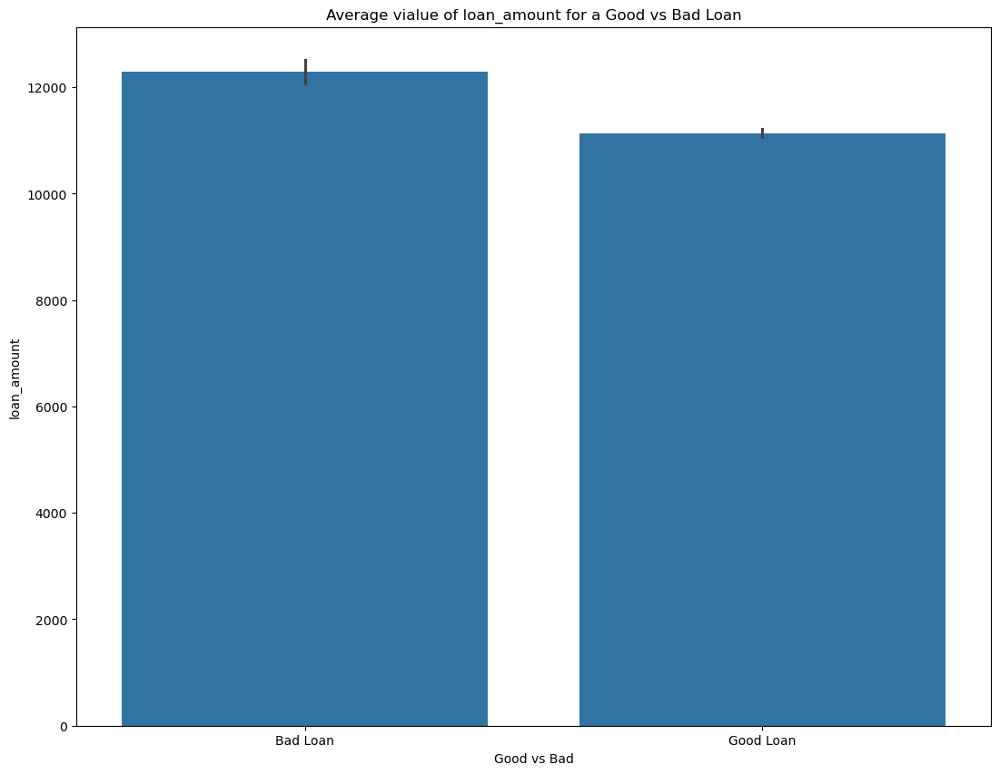

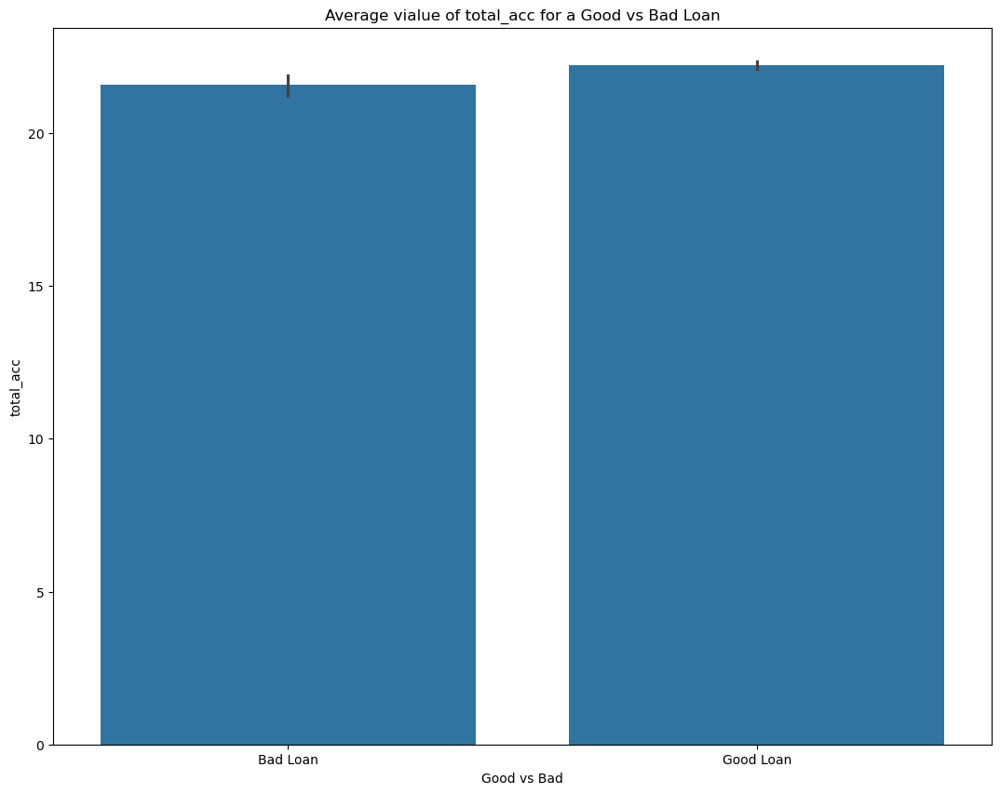

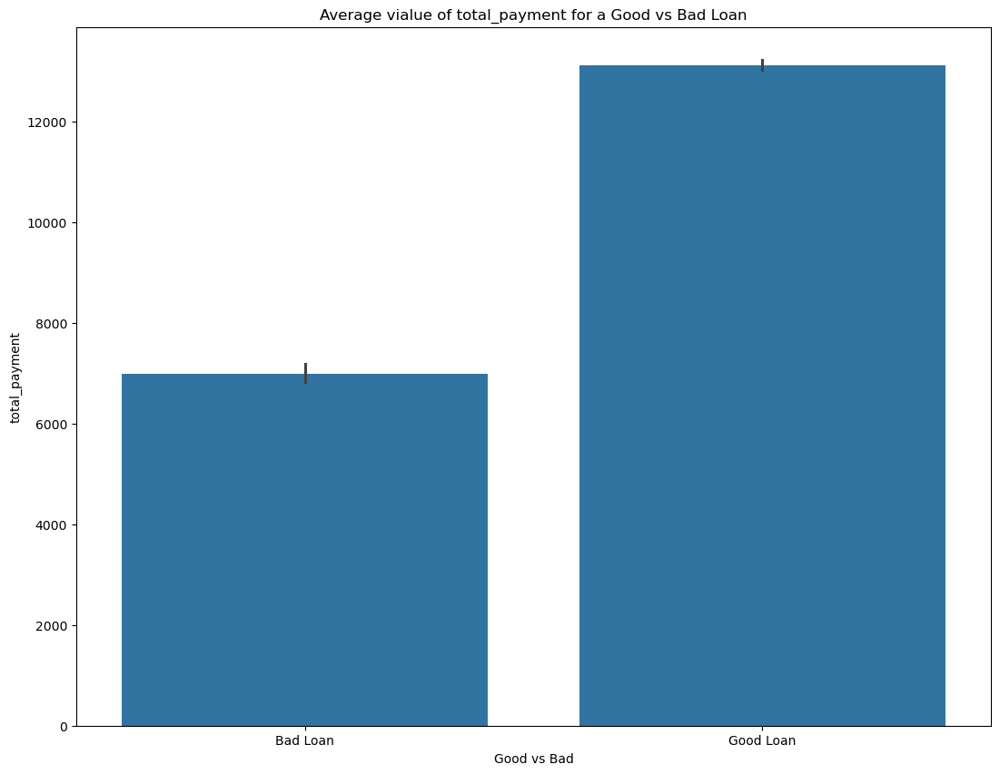

In [ ]:
numerical= data.select_dtypes(include=np.number).columns.to_list()
for i in numerical:
    sns.barplot(data=data, x='Good vs Bad Loan',y=i)
    plt.xlabel('Good vs Bad')
    plt.title(f'Average vialue of {i} for a Good vs Bad Loan')
    plt.ylabel(i)
    plt.show()

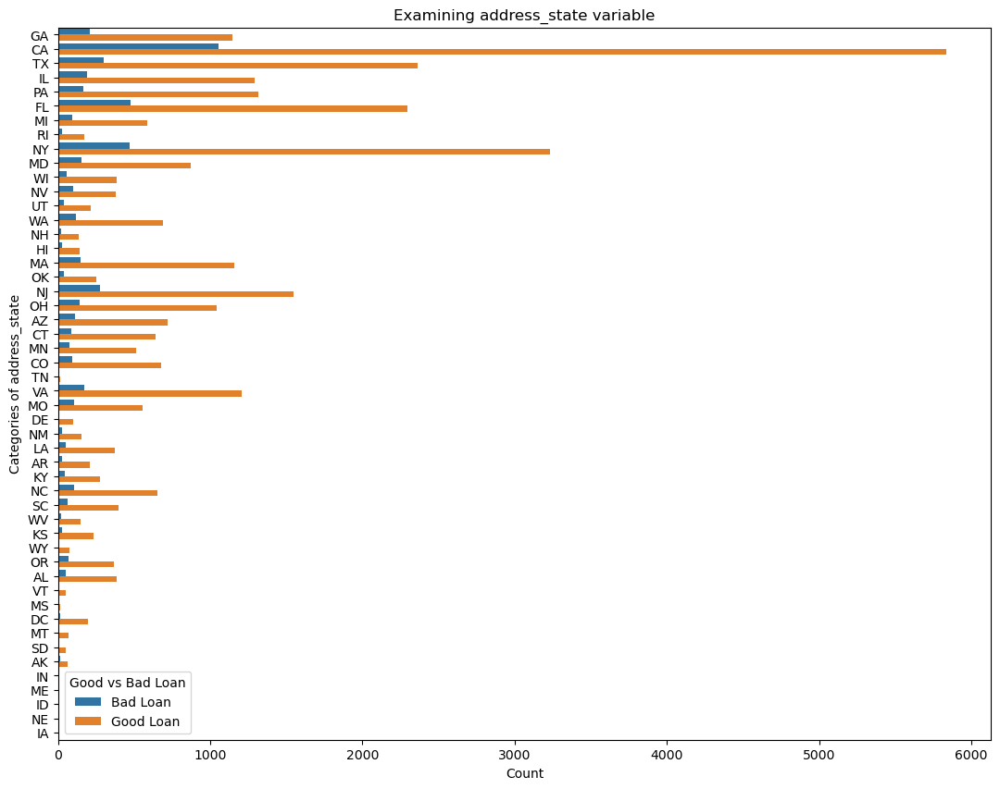

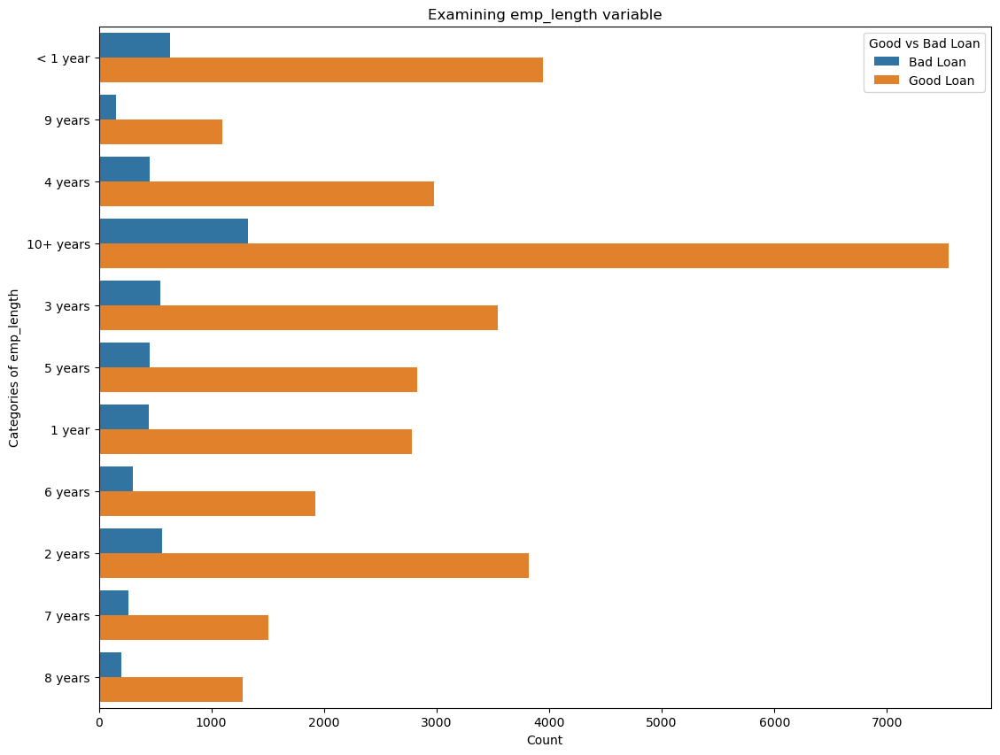

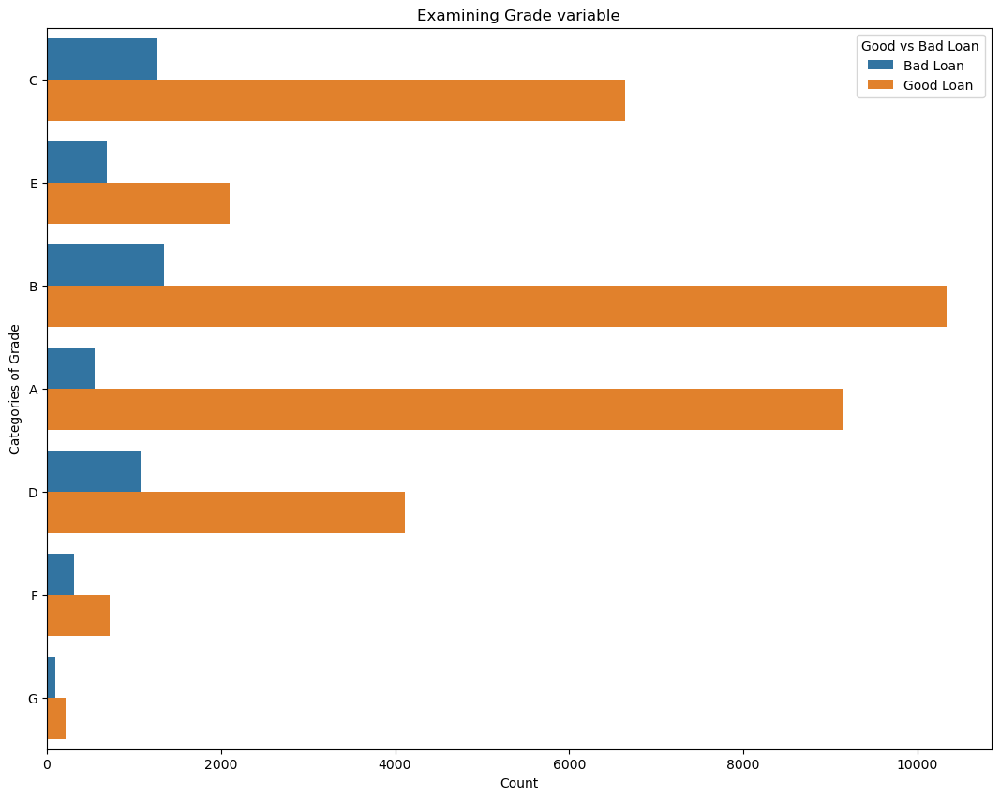

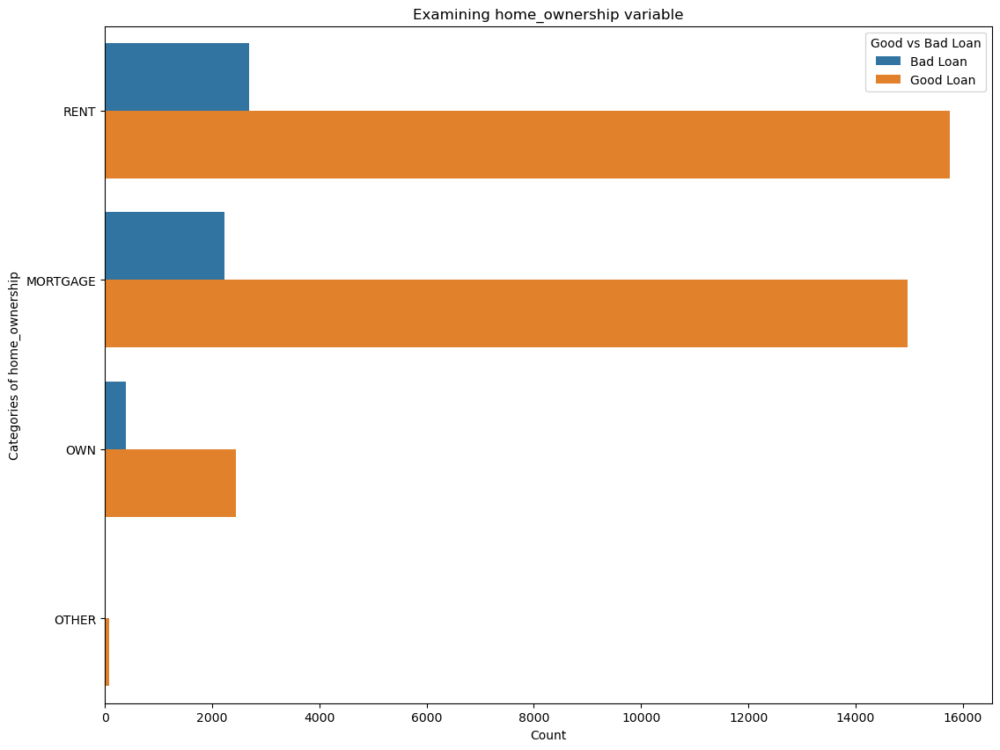

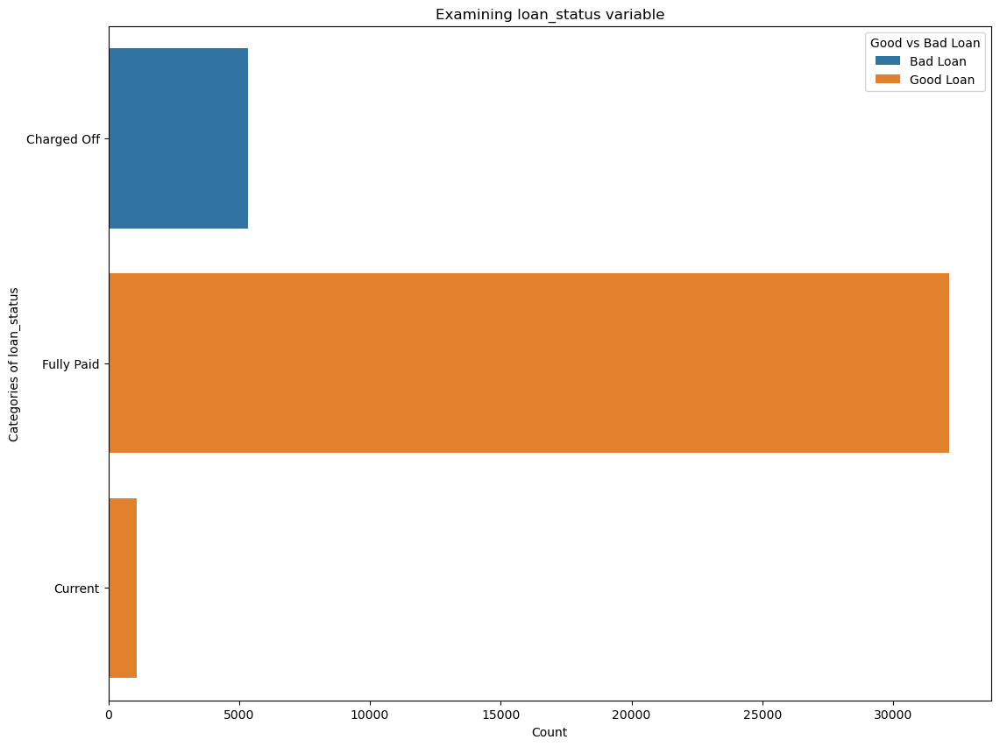

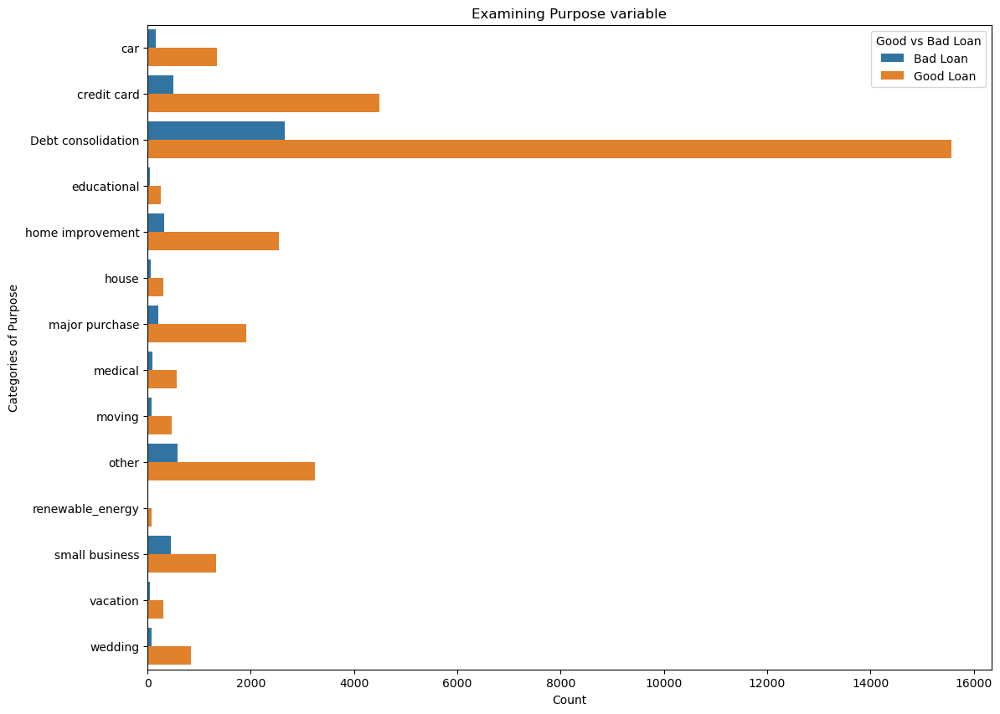

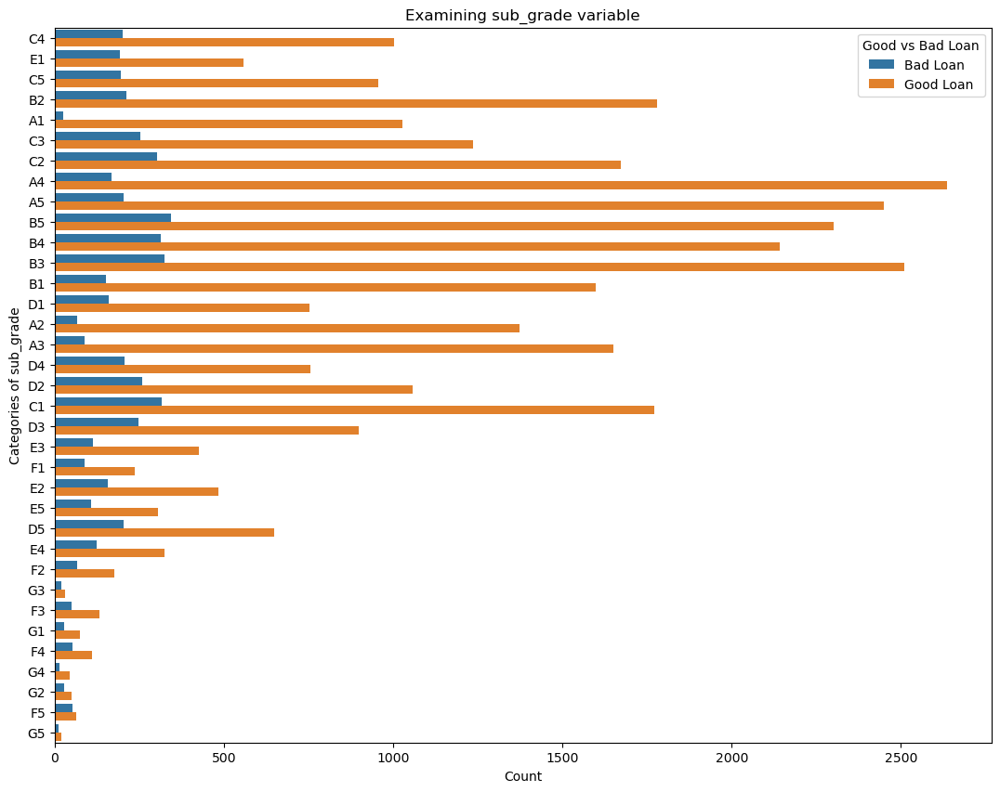

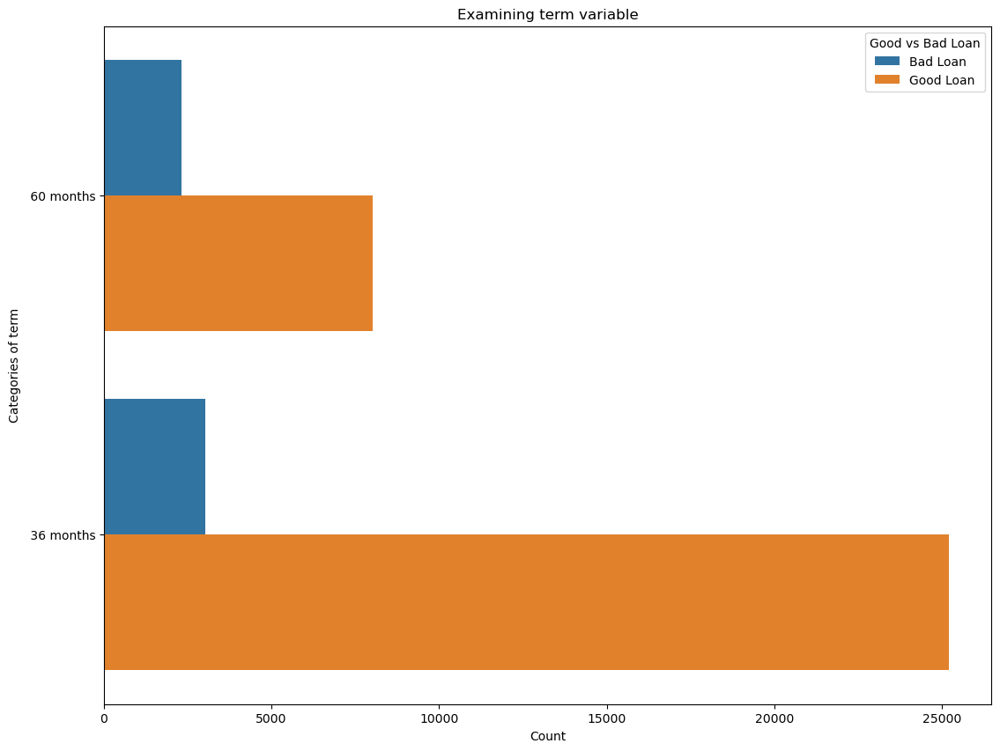

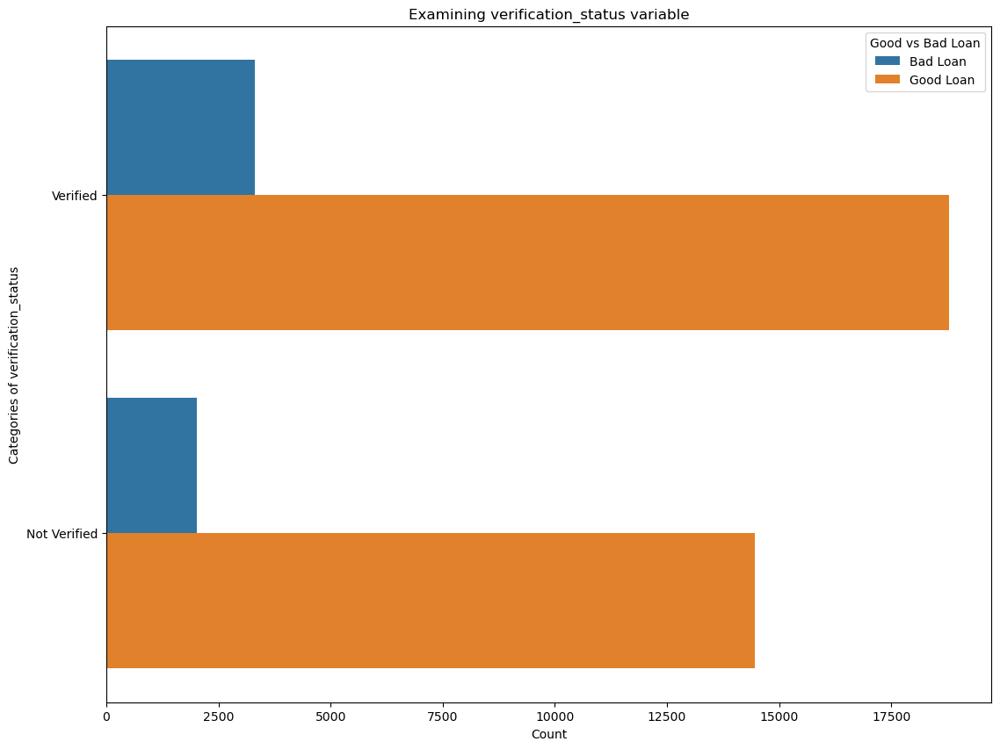

In [ ]:
for i in cat:
    sns.countplot(data=data,y=i,hue=target)
    plt.ylabel(f'Categories of {i}')
    plt.xlabel(f'Count')
    plt.title(f'Examining {i} variable')
    plt.show()

Inference:

* The simple bivariate analysis of all numerical variables give us a good idea of the general outliers of these variables for good loans and for bad loans
* The analysis of the categorical variables are interesting wrt:
There is a great variation between sub-grades of loans within the same grade itself

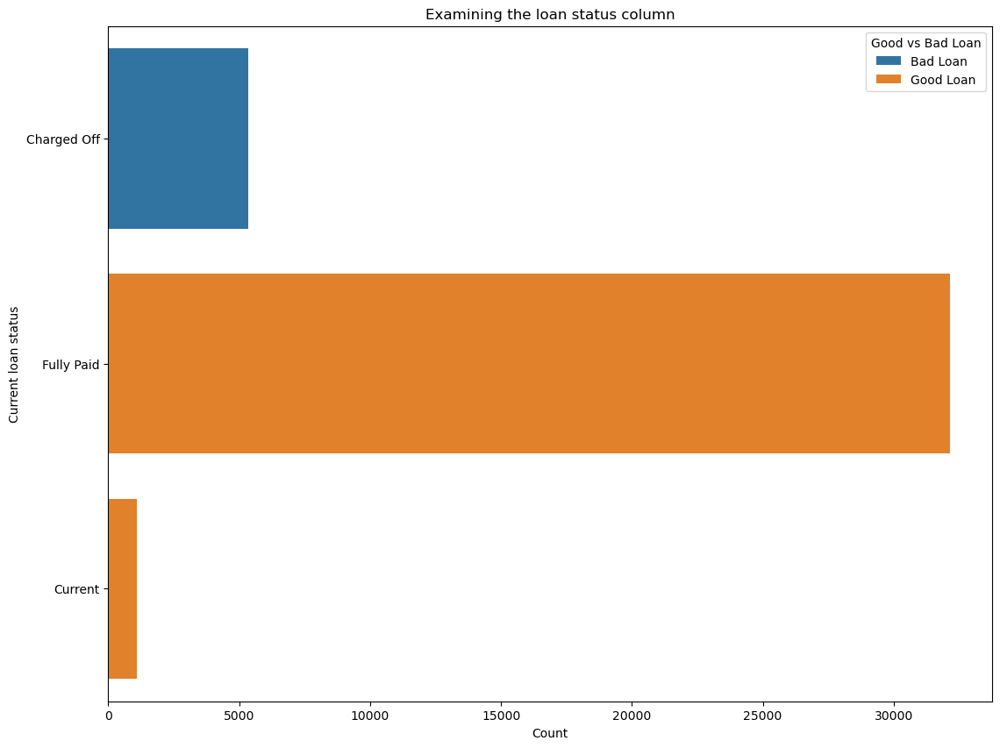

In [ ]:
sns.countplot(data=data,y='loan_status',hue=target)
plt.title('Examining the loan status column')
plt.ylabel('Current loan status')
plt.xlabel('Count')
plt.show()

**The loan_status column has 'Fully Paid','Charged off', and 'Current', but without the date columns, having 'Current' makes no sense
If we replace 'Current' with 'Fully Paid', then the loan_status column will become identical to the target column**. All the 'Charged off' loans are 'Bad Loans'. Additionally, this column is more of a post-processing variable than a pre-processing variable (with respect to bank data). We are interested in predicting the likelihood of a loan becoming good or bad without information like this to skew the predictions. We are dropping this variable from our analysis.

In [ ]:
data.drop('loan_status',axis=1,inplace=True)

In [ ]:
data.shape

(38576, 16)

In [ ]:
cat.remove('loan_status')

**Analyzing State-wise**

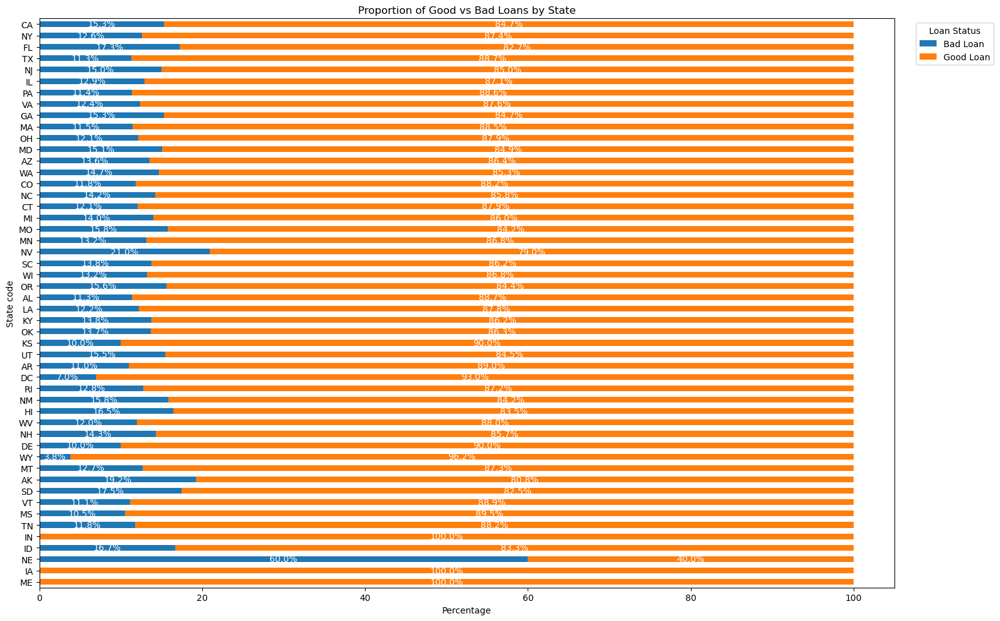

In [ ]:
df_state = pd.crosstab(data['address_state'], data['Good vs Bad Loan'])
df_state_percent = df_state.div(df_state.sum(axis=1), axis=0) * 100

fig, ax = plt.subplots(figsize=(16, 10))
df_state_percent = df_state_percent.loc[data['address_state'].value_counts().index[::-1]]

ax = df_state_percent.plot(kind='barh', stacked=True, ax=ax)
for container in ax.containers:
    labels = [f"{v.get_width():.1f}%" if v.get_width() > 0 else "" for v in container]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_title('Proportion of Good vs Bad Loans by State')
ax.set_xlabel('Percentage')
ax.set_ylabel('State code')
ax.legend(title='Loan Status', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()

This can be interpreted as: Out of all the loans taken in [state_code], __% were Good Loans and paid in time, and the rest were bad loans

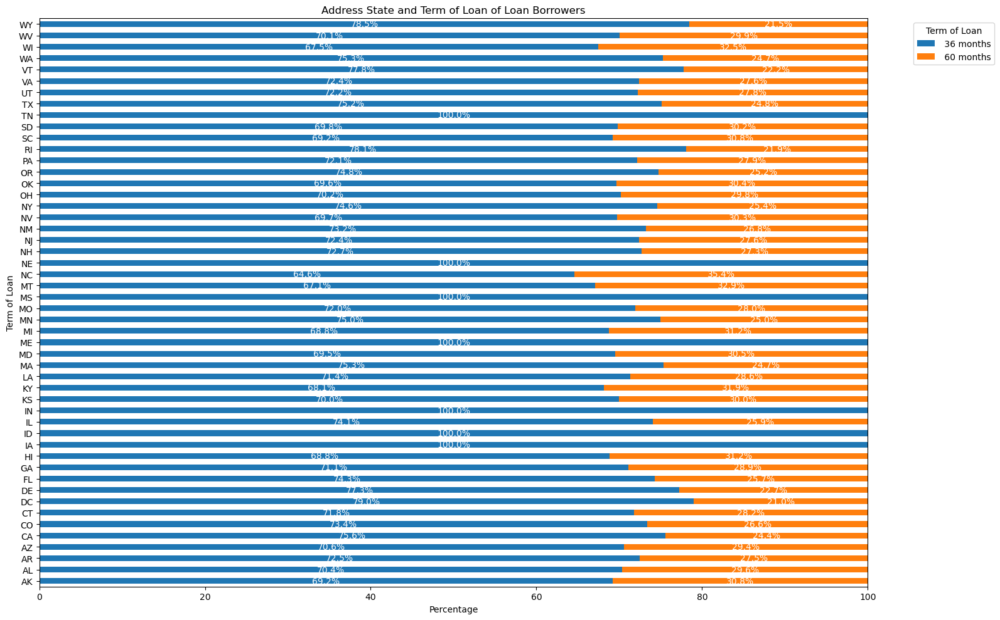

In [ ]:
df_as_t = pd.crosstab(data['address_state'], data['term'])

# Calculate percentages per row
percent_df = df_as_t.div(df_as_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Term of Loan')
ax.set_title('Address State and Term of Loan of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Term of Loan', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


**Inference**:
- Borrowers from different states have mostly taken loans for a term of 36 months
- There are six states with borrowers that have only taken loans for 36 months

In [ ]:
# Crosstab for counts
df_state = pd.crosstab(data['address_state'], data['Good vs Bad Loan'])

# Calculate percentages
df_state_percent = df_state.div(df_state.sum(axis=1), axis=0) * 100

# Prepare result DataFrame
result_df = df_state_percent.reset_index()
result_df.columns = ['State'] + [f'Percentage of {col}' for col in df_state_percent.columns]

# Add count columns
result_df['Number of Bad Loans'] = df_state['Bad Loan'].values
result_df['Number of Good Loans'] = df_state['Good Loan'].values
result_df['Total Loans'] = df_state.sum(axis=1).values

# Reorder columns
result_df = result_df[['State',
                       'Total Loans',
                       'Number of Good Loans',
                       'Number of Bad Loans',
                       'Percentage of Good Loan',
                       'Percentage of Bad Loan']]

# Sort by highest percentage of bad loans
result_df = result_df.sort_values(by='Percentage of Bad Loan', ascending=False).reset_index(drop=True)
result_df

,State,Total Loans,Number of Good Loans,Number of Bad Loans,Percentage of Good Loan,Percentage of Bad Loan
0,NE,5,2,3,40.000000,60.000000
1,NV,482,381,101,79.045643,20.954357
2,AK,78,63,15,80.769231,19.230769
3,SD,63,52,11,82.539683,17.460317
4,FL,2773,2294,479,82.726289,17.273711
5,ID,6,5,1,83.333333,16.666667
6,HI,170,142,28,83.529412,16.470588
7,NM,183,154,29,84.153005,15.846995
8,MO,660,556,104,84.242424,15.757576
9,OR,436,368,68,84.403670,15.596330


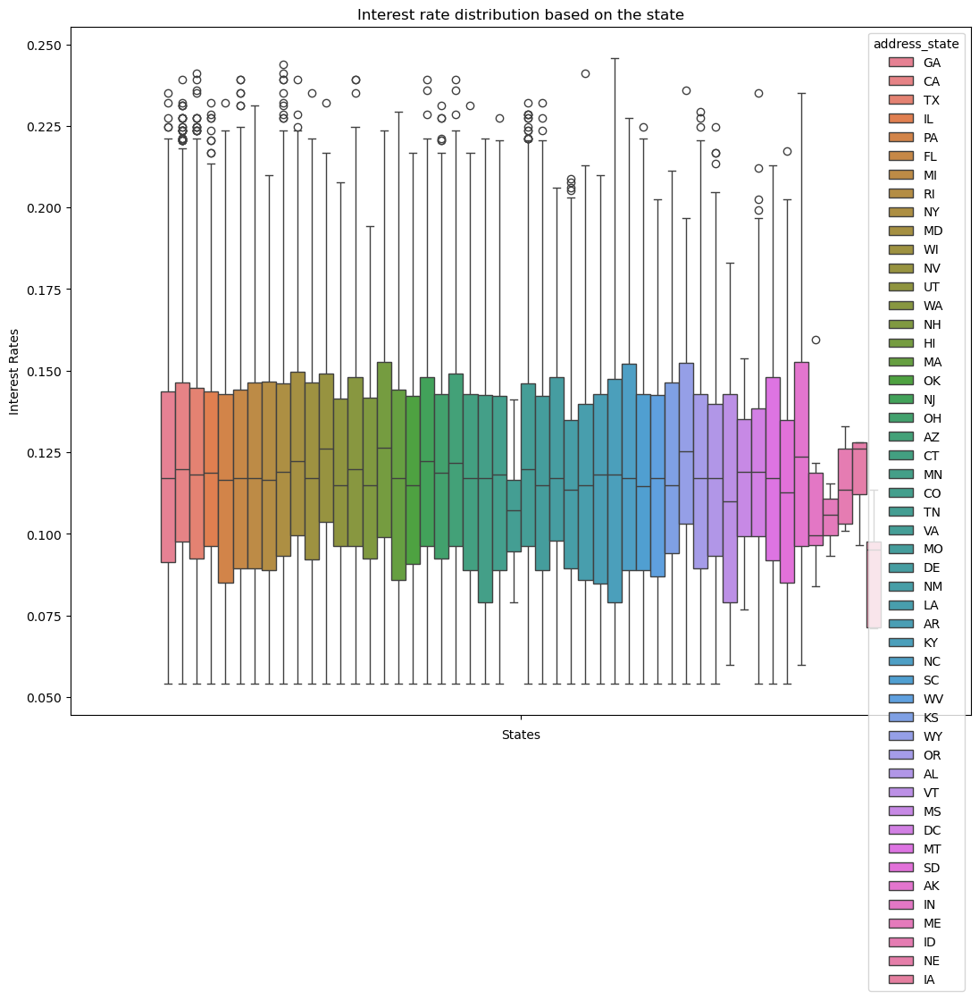

In [ ]:
sns.boxplot(data=data,hue='address_state',y='int_rate')
plt.title('Interest rate distribution based on the state')
plt.xlabel('States')
plt.ylabel('Interest Rates')
plt.show()

**Inference**:
Though this seems messy, we can see that the interest rates offered on loans has a different range depending on the state the borrower is from

In [ ]:
# Group by state and calculate statistics for interest rates
int_rate_summary = data.groupby('address_state')['int_rate'].agg(['min', 'max', 'median', 'mean', 'std']).reset_index()

# Rename columns for better clarity
int_rate_summary.columns = [
    'State',
    'Min Interest Rate',
    'Max Interest Rate',
    'Median Interest Rate',
    'Mean Interest Rate',
    'Std Deviation Interest Rate'
]
int_rate_summary

,State,Min Interest Rate,Max Interest Rate,Median Interest Rate,Mean Interest Rate,Std Deviation Interest Rate
0,AK,0.0599,0.2352,0.12355,0.127915,0.041381
1,AL,0.0542,0.2248,0.11710,0.118594,0.036370
2,AR,0.0542,0.2099,0.11830,0.117557,0.037650
3,AZ,0.0542,0.2391,0.12180,0.122431,0.038145
4,CA,0.0542,0.2391,0.11990,0.121482,0.036276
5,CO,0.0542,0.2274,0.11830,0.118150,0.036687
6,CT,0.0542,0.2313,0.11710,0.119101,0.037489
7,DC,0.0542,0.2352,0.11890,0.120467,0.034981
8,DE,0.0542,0.2062,0.11710,0.119956,0.034095
9,FL,0.0542,0.2391,0.11710,0.119781,0.037399


Most states seem to have similar minimum interest rates recorded, with a very few exceptions

**Analyzing Debt-to-income ratio, state-wise**

In [ ]:
# Group by state and calculate statistics for interest rates
dti_summary = data.groupby('address_state')['dti'].agg(['min', 'max', 'median', 'mean', 'std']).reset_index()

# Rename columns for better clarity
dti_summary.columns = [
    'State',
    'Min DTI',
    'Max DTI',
    'Median DTI',
    'Mean DTI',
    'Std Deviation DTI'
]
dti_summary

,State,Min DTI,Max DTI,Median DTI,Mean DTI,Std Deviation DTI
0,AK,0.0000,0.2983,0.15315,0.150435,0.066467
1,AL,0.0000,0.2964,0.14520,0.141753,0.070254
2,AR,0.0000,0.2965,0.15400,0.152133,0.067926
3,AZ,0.0000,0.2891,0.12860,0.131855,0.067029
4,CA,0.0000,0.2976,0.12885,0.128443,0.065646
5,CO,0.0000,0.2919,0.13800,0.136090,0.065788
6,CT,0.0000,0.2962,0.12730,0.128976,0.065207
7,DC,0.0026,0.2556,0.12835,0.125146,0.060101
8,DE,0.0015,0.2962,0.14630,0.141715,0.064076
9,FL,0.0000,0.2992,0.13640,0.135271,0.067028


**Analyzing credit accumulation state-wise**

In [ ]:
# Group by state and calculate statistics for interest rates
credits_summary = data.groupby('address_state')['total_acc'].agg(['min', 'max', 'median', 'mean', 'std']).reset_index()

# Rename columns for better clarity
credits_summary.columns = [
    'State',
    'Min credits',
    'Max credits',
    'Median credits',
    'Mean credits',
    'Std Deviation credits'
]
credits_summary

,State,Min credits,Max credits,Median credits,Mean credits,Std Deviation credits
0,AK,5,54,22.0,22.730769,11.032035
1,AL,3,66,23.0,24.127315,11.289278
2,AR,3,60,22.5,24.110169,11.632884
3,AZ,3,67,21.0,22.141657,11.326306
4,CA,3,90,19.0,20.449086,10.755271
5,CO,3,70,21.0,22.463636,11.679925
6,CT,3,63,22.0,23.504110,11.766037
7,DC,3,78,19.0,20.341121,10.822099
8,DE,5,56,21.5,23.345455,11.211426
9,FL,3,63,20.0,21.372160,11.218574


**Analyzing based on Grades of Loans borrowed**

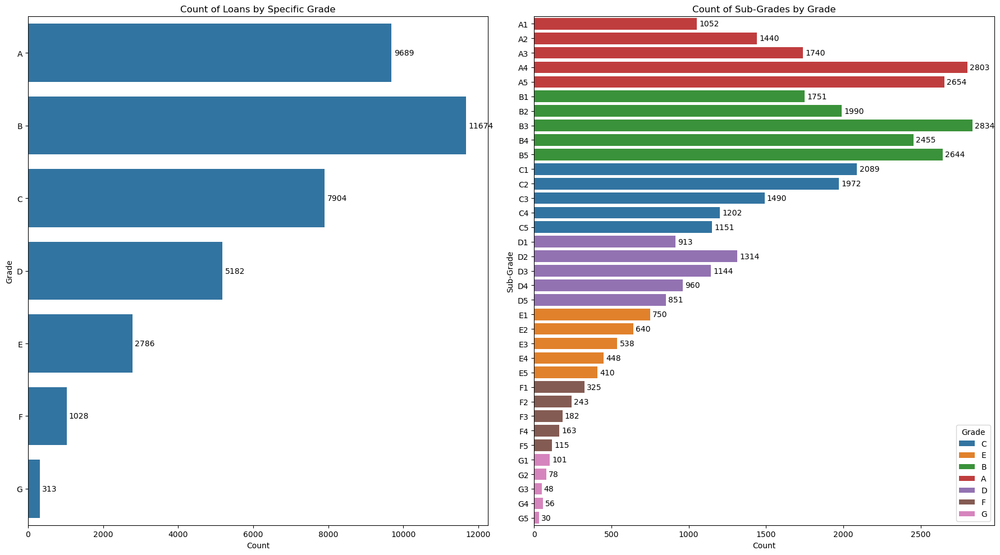

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18,10)) # Recommended figsize: (16, 8) or (18, 10)

# Plot 1: Count of Loans by Grade
ax1 = sns.countplot(data=data, y='Grade', order=['A','B','C','D','E','F','G'], ax=axes[0])
for container in ax1.containers:
    ax1.bar_label(container, fmt='%d', label_type='edge', padding=3)
ax1.set_title('Count of Loans by Specific Grade')
ax1.set_xlabel('Count')
ax1.set_ylabel('Grade')

# Plot 2: Count of Sub-Grades by Grade (with Hue)
ax2 = sns.countplot(data=data, y='sub_grade', hue='Grade', order=['A1','A2','A3','A4','A5',
                                                         'B1','B2','B3','B4','B5',
                                                         'C1','C2','C3','C4','C5',
                                                         'D1','D2','D3','D4','D5',
                                                         'E1','E2','E3','E4','E5',
                                                         'F1','F2','F3','F4','F5',
                                                         'G1','G2','G3','G4','G5'], ax=axes[1])
for container in ax2.containers:
    ax2.bar_label(container, fmt='%d', label_type='edge', padding=3)
ax2.set_title('Count of Sub-Grades by Grade')
ax2.set_xlabel('Count')
ax2.set_ylabel('Sub-Grade')

plt.tight_layout() # Adjusts subplot params for a tight layout. Only call once per figure.
plt.show()

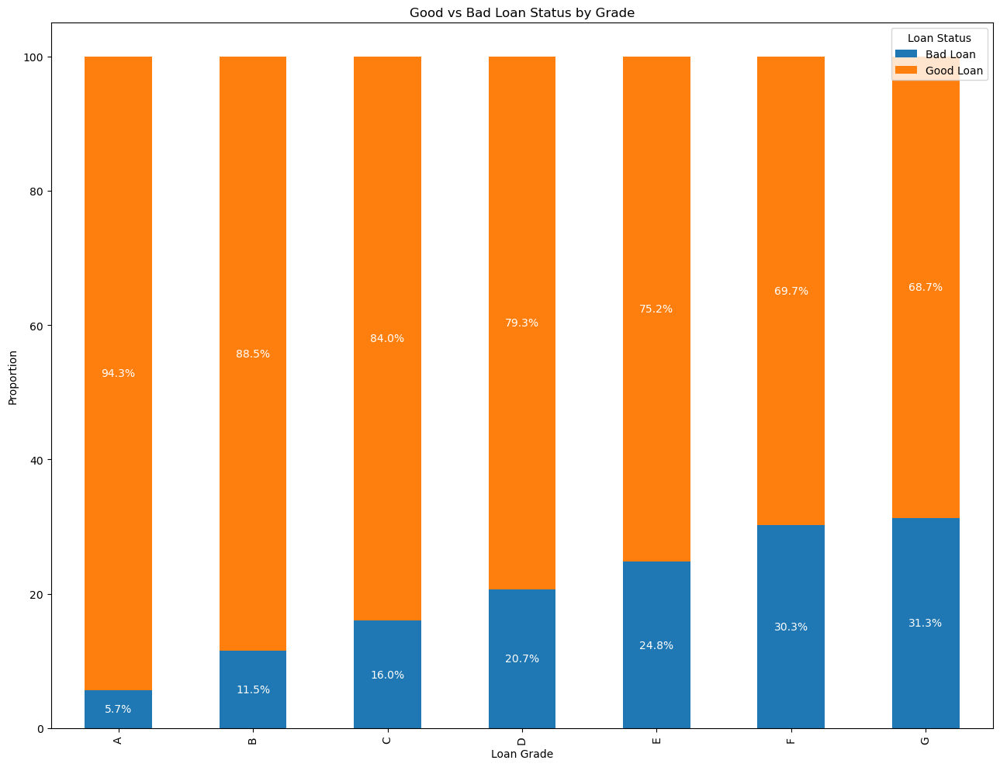

In [ ]:
#bivariate - cat vs cat
df_cross = pd.crosstab(data['Grade'], data['Good vs Bad Loan'])
# Normalize by row to get percentages
df_percent = df_cross.div(df_cross.sum(axis=1), axis=0) * 100

ax = df_percent.plot(kind='bar', stacked=True)

# Add percentage labels inside the bars
for container in ax.containers:
#     # Get each bar segment’s width (height) and its x position
      labels = [f"{v.get_height():.1f}%" if v.get_height() > 0 else "" for v in container]
      ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')
plt.title('Good vs Bad Loan Status by Grade')
plt.xlabel('Loan Grade')
plt.ylabel('Proportion')
plt.legend(title='Loan Status')
plt.tight_layout()
plt.show()


**Inference**:
- Grades D,E,F and G have a higher proprortion of 'Bad Loans' issued
- Grade A may be considered the least risky loan grade for the bank since the chances of a Grade A loan turning out to be a 'Bad Loan' is minimal

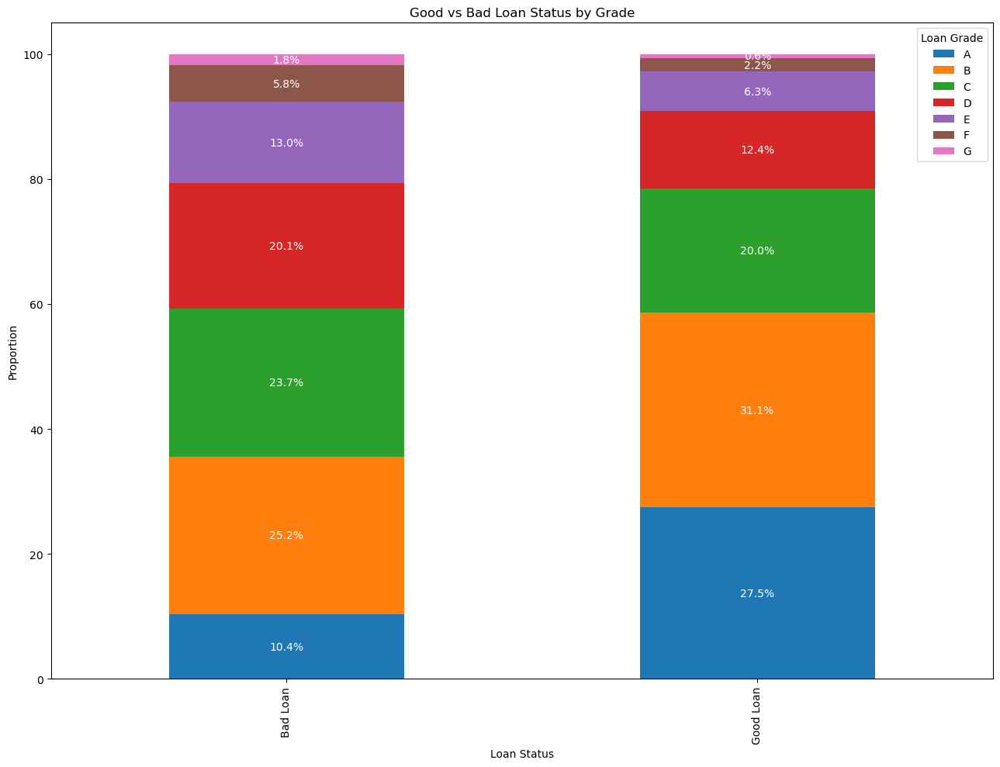

In [ ]:
#bivariate - cat vs cat
df_cross = pd.crosstab(data['Good vs Bad Loan'], data['Grade'])
# Normalize by row to get percentages
df_percent = df_cross.div(df_cross.sum(axis=1), axis=0) * 100

ax = df_percent.plot(kind='bar', stacked=True)

# Add percentage labels inside the bars
for container in ax.containers:
#     # Get each bar segment’s width (height) and its x position
      labels = [f"{v.get_height():.1f}%" if v.get_height() > 0 else "" for v in container]
      ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')
plt.title('Good vs Bad Loan Status by Grade')
plt.xlabel('Loan Status')
plt.ylabel('Proportion')
plt.legend(title='Loan Grade')
plt.tight_layout()
plt.show()

This plot shows us the distribution of grades across 'Good Loans' and 'Bad Loans'. We can see that there are more 'Bad Loans' from grades D,E,F and G than 'Good Loans'.

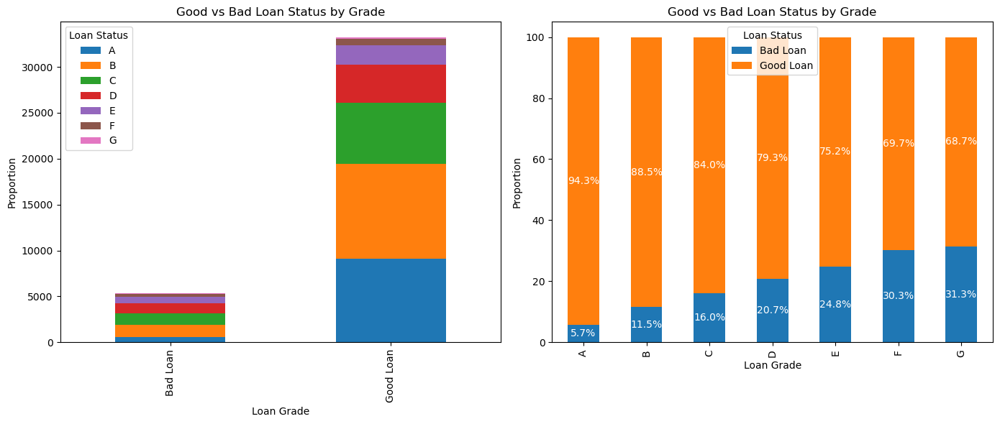

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

df_cross.plot(kind='bar', stacked=True, ax=axes[0])
axes[0].set_title('Good vs Bad Loan Status by Grade')
axes[0].set_xlabel('Loan Grade')
axes[0].set_ylabel('Proportion')
axes[0].legend(title='Loan Status')

df_cross = pd.crosstab(data['Grade'], data['Good vs Bad Loan'])
df_percent = df_cross.div(df_cross.sum(axis=1), axis=0) * 100

ax = df_percent.plot(kind='bar', stacked=True, ax=axes[1])
for container in ax.containers:
    labels = [f"{v.get_height():.1f}%" if v.get_height() > 0 else "" for v in container]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')
axes[1].set_title('Good vs Bad Loan Status by Grade')
axes[1].set_xlabel('Loan Grade')
axes[1].set_ylabel('Proportion')
axes[1].legend(title='Loan Status')
plt.tight_layout()
plt.show()

**Inference**:
- Though B-grade loans appear to be more popular since they're greater in number, A-grade loans are the safest and least likely to turn out to be 'Bad Loan' investments for the bank
- Grade E,F and G loans are the least popular grades, and the chances of a loan of those grades becoming a 'Bad Loan' is higher as well

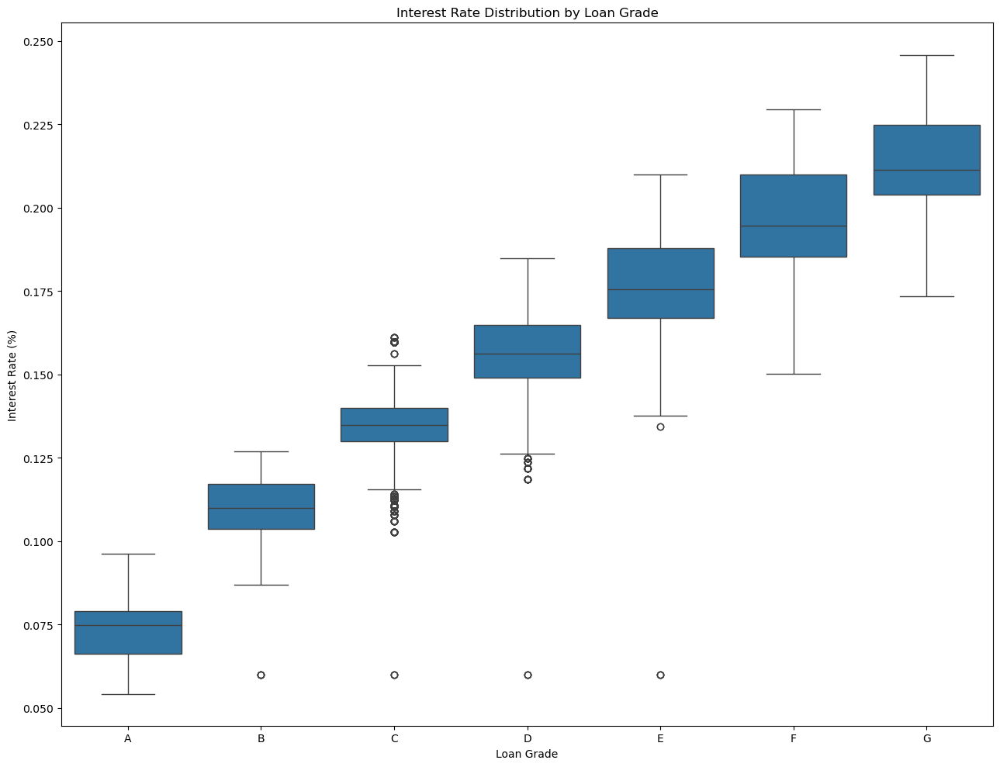

In [ ]:
#cat vs num
sns.boxplot(data=data, x='Grade', y='int_rate', order=sorted(data['Grade'].unique()))
plt.title('Interest Rate Distribution by Loan Grade')
plt.xlabel('Loan Grade')
plt.ylabel('Interest Rate (%)')
plt.tight_layout()
plt.show()

**Inference**:
* Loans given under Grades A, F and G have fixed interest rates across all loans
* Other categories of grades B, C, D, and E have some interest rates that fall out of the normal range for loans of those categories
* This could indicate that these loan grades may have special concessions (ex: lower interest for a government official or female loan borrowers, etc) but we do not have any information to substantiate this theory

In [ ]:
# Group by state and calculate statistics for interest rates
int_rate_summary = data.groupby('Grade')['int_rate'].agg(['min', 'max', 'median', 'mean', 'std']).reset_index()

# Rename columns for better clarity
int_rate_summary.columns = [
    'State',
    'Min Interest Rate',
    'Max Interest Rate',
    'Median Interest Rate',
    'Mean Interest Rate',
    'Std Deviation Interest Rate'
]
int_rate_summary

,State,Min Interest Rate,Max Interest Rate,Median Interest Rate,Mean Interest Rate,Std Deviation Interest Rate
0,A,0.0542,0.0963,0.0749,0.073520,0.010311
1,B,0.0600,0.1269,0.1099,0.110291,0.009001
2,C,0.0600,0.1611,0.1349,0.135469,0.009407
3,D,0.0600,0.1849,0.1562,0.157105,0.011810
4,E,0.0600,0.2099,0.1756,0.177052,0.014059
5,F,0.1501,0.2294,0.1947,0.197440,0.014818
6,G,0.1734,0.2459,0.2114,0.214006,0.013405


**Inference**:
- F and G-grade loans have higher thresholds of interest rates
- These Grade categories may be at risk for turning out bad loans and may have to be further examined

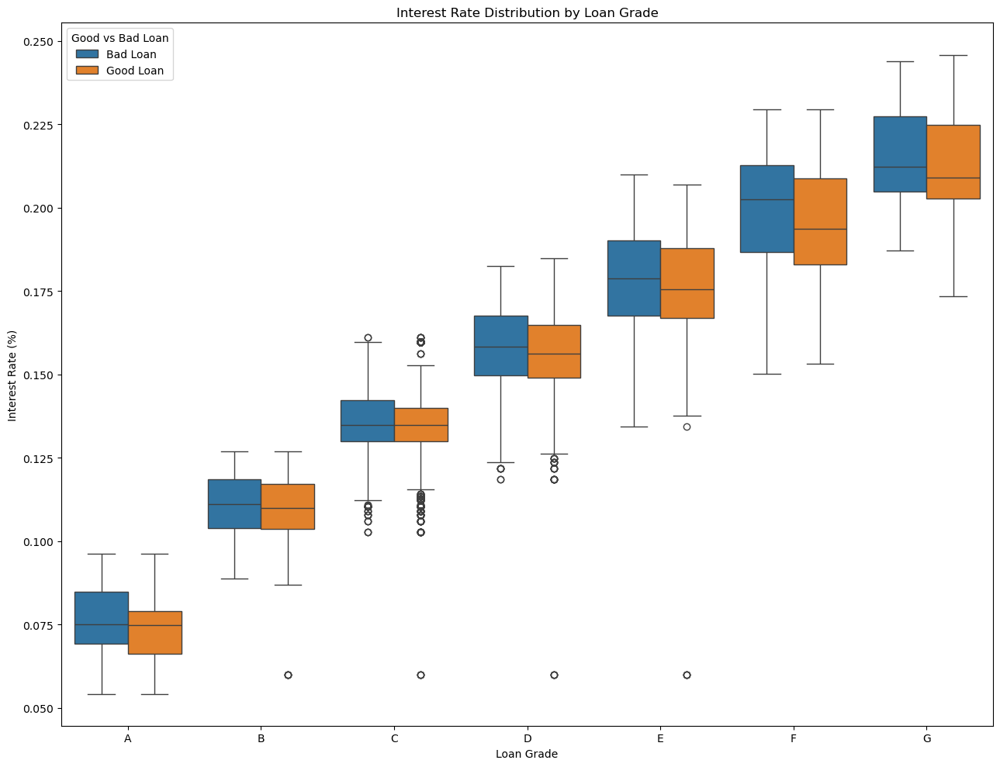

In [ ]:
sns.boxplot(data=data, x='Grade', y='int_rate',hue='Good vs Bad Loan' ,order=sorted(data['Grade'].unique()))
plt.title('Interest Rate Distribution by Loan Grade')
plt.xlabel('Loan Grade')
plt.ylabel('Interest Rate (%)')
plt.tight_layout()
plt.show()

**Inference**

We can see that the interest rate on Bad Loans is higher than Good Loans across all Grade categories and even amongst outlier interest rates too, suggesting that the higher interest rates may be a reason as to why the borrowers are unable to pay

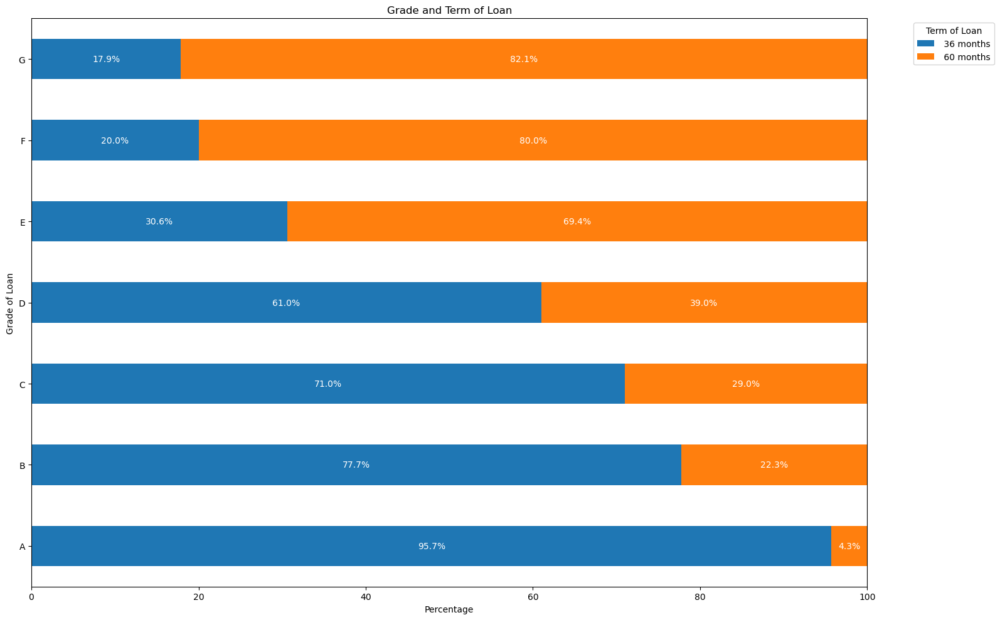

In [ ]:
df_g_t = pd.crosstab(data['Grade'], data['term'])

# Calculate percentages per row
percent_df = df_g_t.div(df_g_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Grade of Loan')
ax.set_title('Grade and Term of Loan')
ax.set_xlim(0, 100)
ax.legend(title='Term of Loan', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


A majority of E,F and G grade loans are taken for 60 months, which makes sense given the higher interest rates on those loans

**Analyzing based on sub-grade**

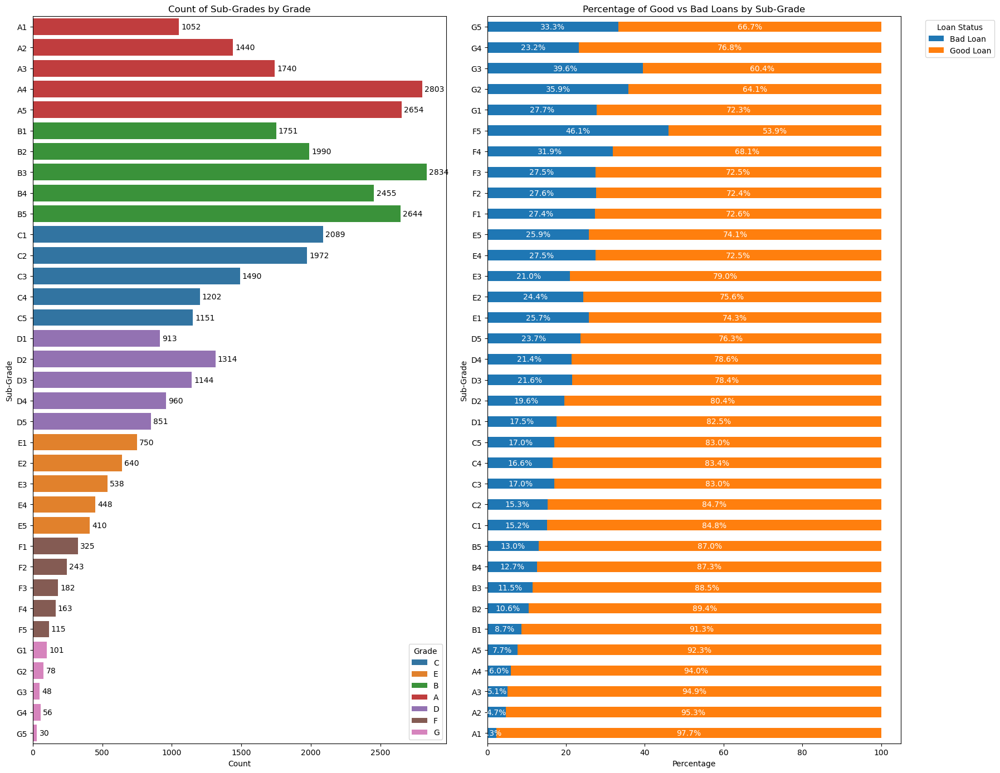

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18, 14))

ax1 = sns.countplot(data=data, y='sub_grade', hue='Grade', order=[
    'A1','A2','A3','A4','A5',
    'B1','B2','B3','B4','B5',
    'C1','C2','C3','C4','C5',
    'D1','D2','D3','D4','D5',
    'E1','E2','E3','E4','E5',
    'F1','F2','F3','F4','F5',
    'G1','G2','G3','G4','G5'
], ax=axes[0])
for container in ax1.containers:
    ax1.bar_label(container, fmt='%d', label_type='edge', padding=3)
ax1.set_title('Count of Sub-Grades by Grade')
ax1.set_xlabel('Count')
ax1.set_ylabel('Sub-Grade')

df_cross_sub = pd.crosstab(data['sub_grade'], data['Good vs Bad Loan'])
df_percent_sub = df_cross_sub.div(df_cross_sub.sum(axis=1), axis=0) * 100
ax2 = df_percent_sub.plot(kind='barh', stacked=True, ax=axes[1])
for container in ax2.containers:
    labels = [f"{v.get_width():.1f}%" if v.get_width() > 0 else "" for v in container]
    ax2.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')
ax2.set_title('Percentage of Good vs Bad Loans by Sub-Grade')
ax2.set_xlabel('Percentage')
ax2.set_ylabel('Sub-Grade')
ax2.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

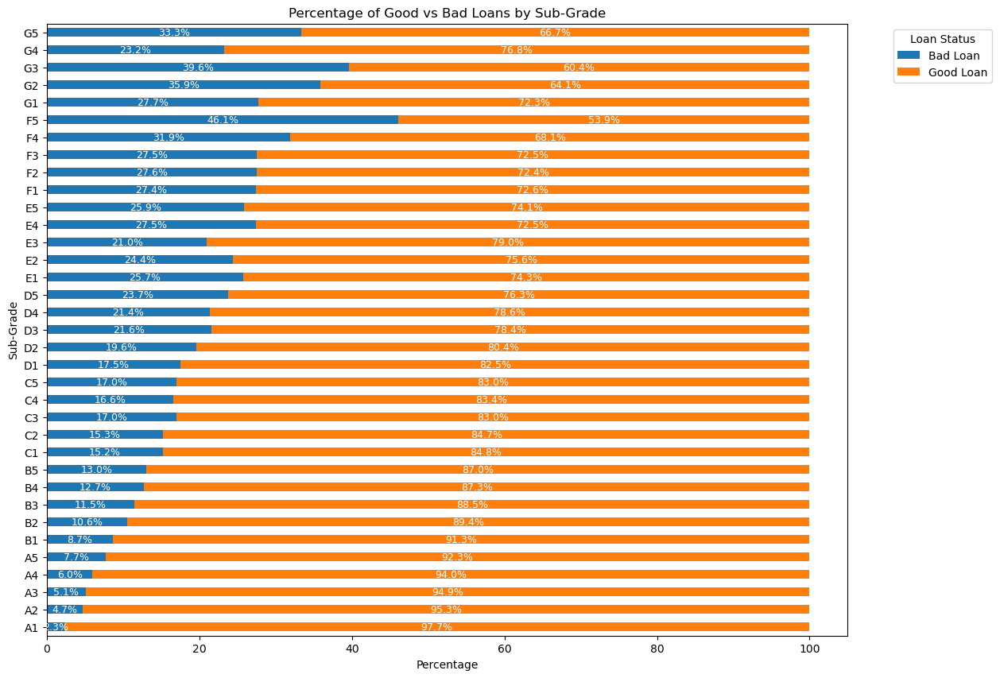

In [ ]:
df_cross_sub = pd.crosstab(data['sub_grade'], data['Good vs Bad Loan'])
df_percent_sub = df_cross_sub.div(df_cross_sub.sum(axis=1), axis=0) * 100
ax = df_percent_sub.plot(kind='barh', stacked=True)
for container in ax.containers:
    labels = [f"{v.get_width():.1f}%" if v.get_width() > 0 else "" for v in container]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=9, color='white')
ax.set_title('Percentage of Good vs Bad Loans by Sub-Grade')
ax.set_xlabel('Percentage')
ax.set_ylabel('Sub-Grade')
ax.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**Inference**:
- As the grade of loan and its subgrades increase, we see that the percentage of 'Bad Loan' in each subgrade also increases
- The proportion distribution of good vs bad loans across subgrades is also consistent with the findings on Grade, but the risks of a 'Bad Loan' turnout increases from subgrade D3 to G5
- Loans taken in subgrade **F5** has an almost equal proportion of good and bad loans

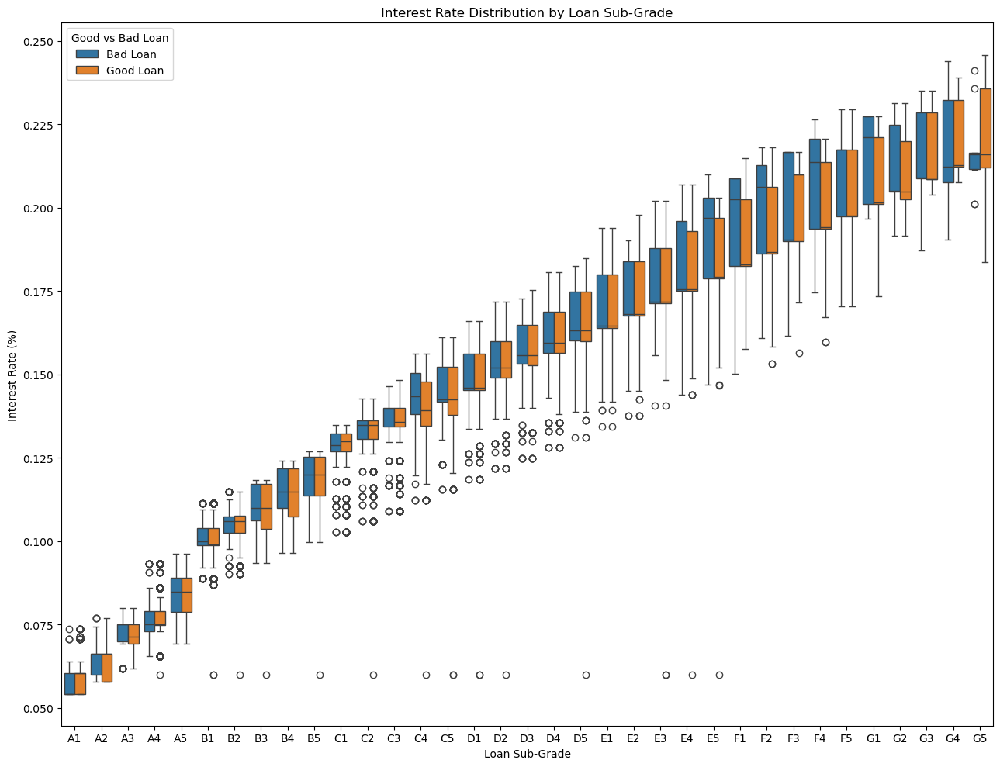

In [ ]:
sns.boxplot(data=data, x='sub_grade', y='int_rate',hue='Good vs Bad Loan' ,order=sorted(data['sub_grade'].unique()))
plt.title('Interest Rate Distribution by Loan Sub-Grade')
plt.xlabel('Loan Sub-Grade')
plt.ylabel('Interest Rate (%)')
plt.tight_layout()
plt.show()

In [ ]:
int_rate_summary = data.groupby('sub_grade')['int_rate'].agg(['min', 'max', 'median', 'mean', 'std']).reset_index()

# Rename columns for better clarity
int_rate_summary.columns = [
    'State',
    'Min Interest Rate',
    'Max Interest Rate',
    'Median Interest Rate',
    'Mean Interest Rate',
    'Std Deviation Interest Rate'
]
int_rate_summary

,State,Min Interest Rate,Max Interest Rate,Median Interest Rate,Mean Interest Rate,Std Deviation Interest Rate
0,A1,0.0542,0.0737,0.0603,0.058137,0.004785
1,A2,0.0579,0.0768,0.0662,0.063863,0.005801
2,A3,0.0617,0.0800,0.0714,0.071728,0.005273
3,A4,0.0600,0.0932,0.0751,0.076643,0.006579
4,A5,0.0691,0.0963,0.0849,0.082733,0.007430
5,B1,0.0600,0.1114,0.0991,0.100120,0.005965
6,B2,0.0600,0.1148,0.1059,0.104936,0.005630
7,B3,0.0600,0.1183,0.1099,0.109976,0.006411
8,B4,0.0964,0.1242,0.1149,0.114090,0.007488
9,B5,0.0600,0.1269,0.1199,0.117866,0.007298


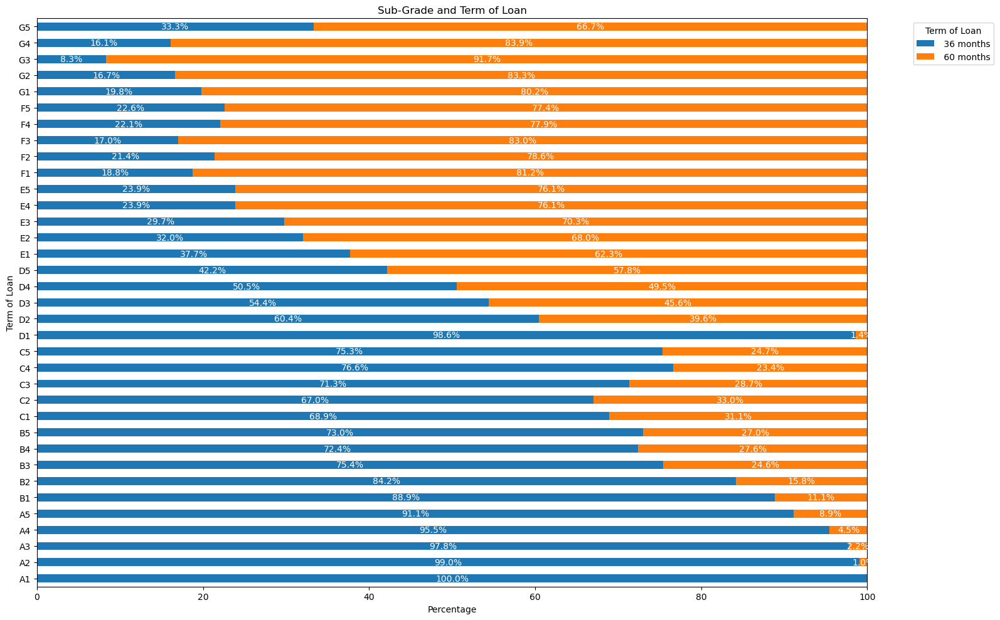

In [ ]:
df_g_t = pd.crosstab(data['sub_grade'], data['term'])

# Calculate percentages per row
percent_df = df_g_t.div(df_g_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Term of Loan')
ax.set_title('Sub-Grade and Term of Loan')
ax.set_xlim(0, 100)
ax.legend(title='Term of Loan', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


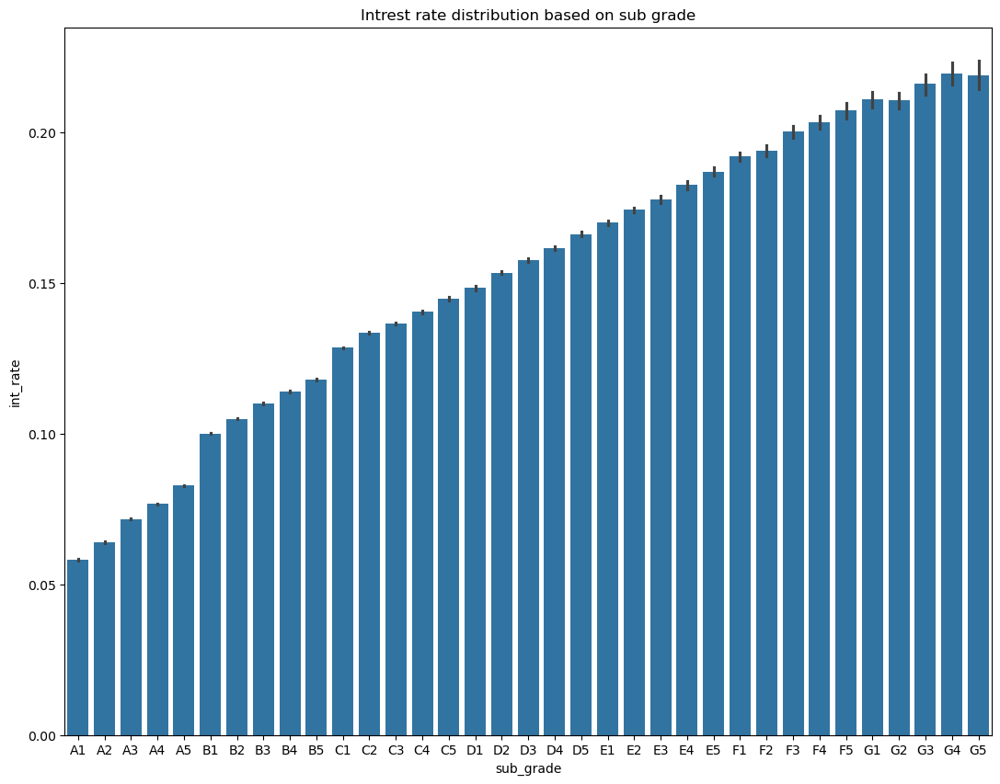

In [ ]:
sns.barplot(data=data,x='sub_grade',y='int_rate',order=sorted(data['sub_grade'].unique()))
plt.title('Intrest rate distribution based on sub grade')
plt.show()

**Analyzing based on Purpose of Loan**

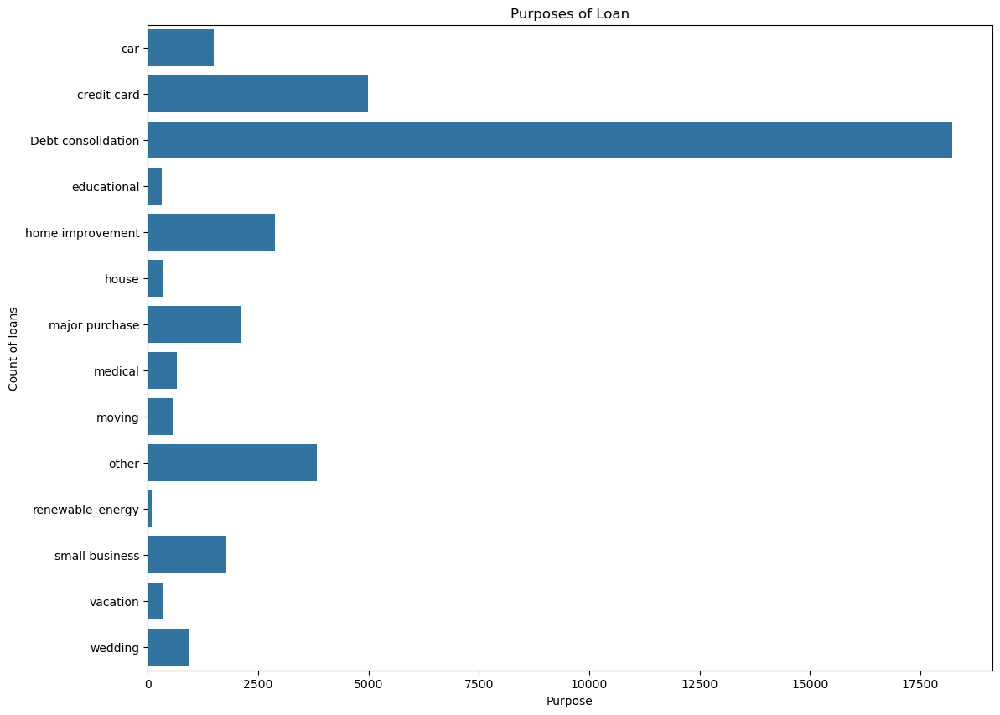

In [ ]:
sns.countplot(data['Purpose'])
plt.title('Purposes of Loan')
plt.ylabel('Count of loans')
plt.xlabel('Purpose')
plt.show()

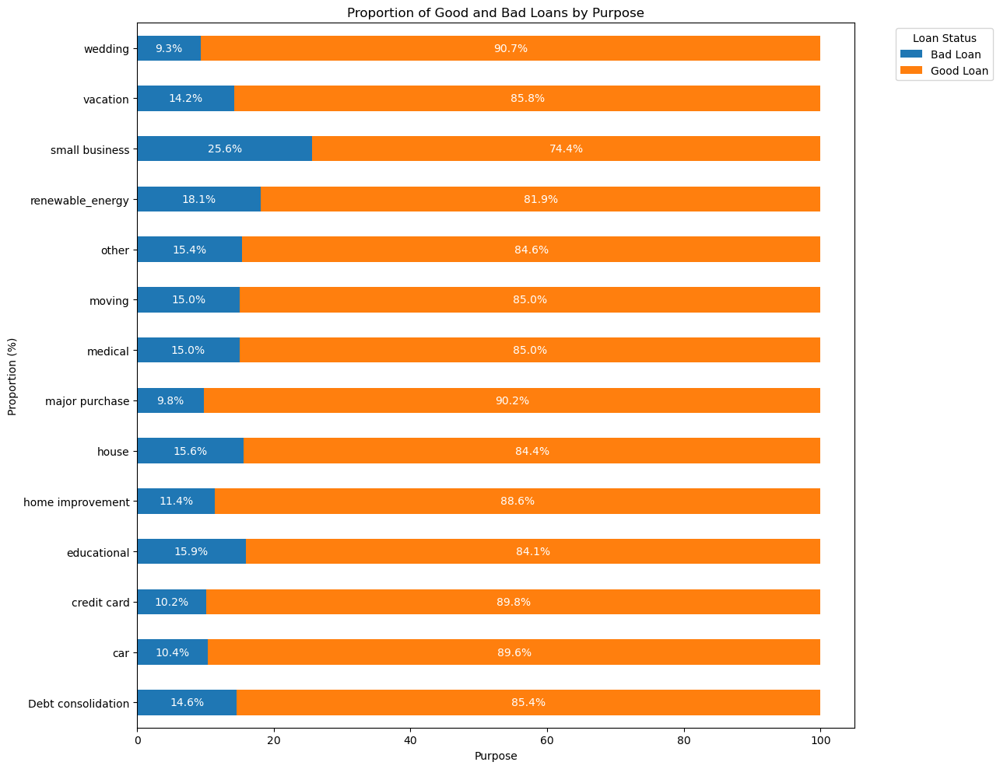

In [ ]:
crosstab = pd.crosstab(data['Purpose'], data[target])
percent_df = crosstab.div(crosstab.sum(axis=1), axis=0) * 100

ax = percent_df.plot(kind='barh', stacked=True)

for container in ax.containers:
    labels = [f"{v.get_width():.1f}%" if v.get_width() > 0 else "" for v in container]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')
plt.xlabel('Purpose')
plt.ylabel('Proportion (%)')
plt.title('Proportion of Good and Bad Loans by Purpose')
plt.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


**Inference**:
- Though'Debt consolidation' is the most popular reason borrowers list when borrowing loans, with 'renewable energy' being the least popular reason, the greatest percentage of bad loans come from loans taken for the purpose of 'small buisness'

In [ ]:
pd.crosstab(data['Purpose'],data['Grade'])

Grade,A,B,C,D,E,F,G
Purpose,,,,,,,
Debt consolidation,3753,5504,3868,2771,1561,587,170
car,577,482,241,128,56,11,2
credit card,1353,1603,1052,582,279,100,29
educational,79,98,90,30,13,4,1
home improvement,933,869,520,295,183,60,16
house,91,104,70,50,30,15,6
major purchase,796,588,372,224,98,26,6
medical,197,197,133,83,40,14,3
moving,164,176,112,65,28,9,5


In [ ]:
pd.crosstab(data['Purpose'],data['sub_grade'])

sub_grade,A1,A2,A3,A4,A5,B1,B2,B3,B4,B5,...,F1,F2,F3,F4,F5,G1,G2,G3,G4,G5
Purpose,,,,,,,,,,,,,,,,,,,,,
Debt consolidation,332,490,638,1174,1119,775,940,1298,1170,1321,...,191,131,106,95,64,54,42,31,30,13
car,114,108,102,119,134,82,94,130,88,88,...,6,3,2,0,0,1,0,1,0,0
credit card,116,178,216,401,442,261,272,405,322,343,...,26,27,16,18,13,10,9,1,7,2
educational,0,6,16,32,25,16,21,18,21,22,...,0,3,1,0,0,0,0,0,1,0
home improvement,124,176,168,243,222,119,149,251,171,179,...,15,12,14,8,11,4,4,4,4,0
house,11,13,13,25,29,22,15,32,21,14,...,7,1,4,1,2,2,2,0,2,0
major purchase,127,147,171,194,157,113,93,133,129,120,...,12,8,0,5,1,2,2,0,0,2
medical,32,27,41,58,39,30,41,46,41,39,...,4,5,1,2,2,1,0,2,0,0
moving,12,27,43,41,41,29,25,45,40,37,...,3,2,2,1,1,3,0,0,1,1


From these crosstabs, we can see that a particular loan 'Purpose' does not correspond to a particular loan 'Grade' or 'sub_grade', implying that the significance of different grades and sub-grades depends on other information.

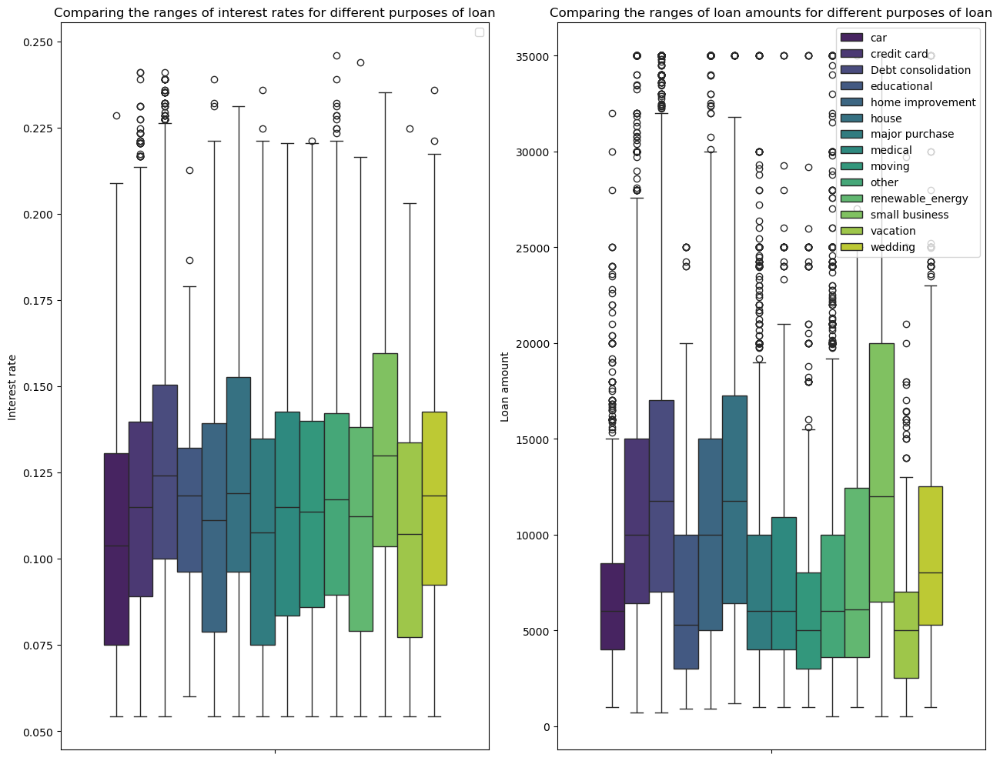

In [ ]:
plt.subplot(1,2,1)
ax = sns.boxplot(data=data,y='int_rate',hue='Purpose',palette='viridis',legend=False)
ax.legend(loc='upper right')
plt.title('Comparing the ranges of interest rates for different purposes of loan')
plt.ylabel('Interest rate')

plt.subplot(1,2,2)
ax = sns.boxplot(data=data,y='loan_amount',hue='Purpose',palette='viridis')
ax.legend(loc='upper right')
plt.title('Comparing the ranges of loan amounts for different purposes of loan')
plt.ylabel('Loan amount')

plt.tight_layout()
plt.show()

- The most popular loan purpose 'Debt consolidation' seems to have the smallest range between its interest rate values, suggesting the interest on those loans would be easier to manage and make payments for
- Loans taken for 'small business' purposes seem to be taken for a higher interest rates than other loan purposes, and the amount borrowed for the same seems to be much higher as well

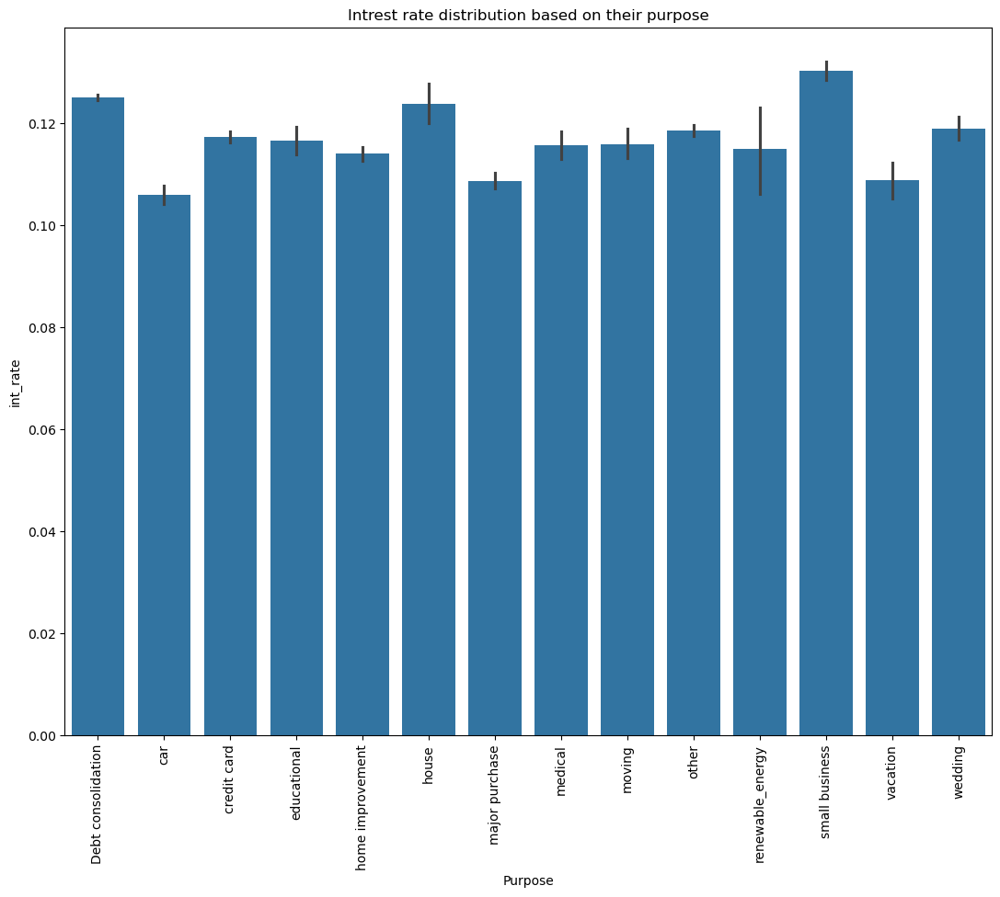

In [ ]:
sns.barplot(data=data, x='Purpose',y='int_rate',order=sorted(data['Purpose'].unique()))
plt.xticks(rotation=90)
plt.title('Intrest rate distribution based on their purpose')
plt.show()

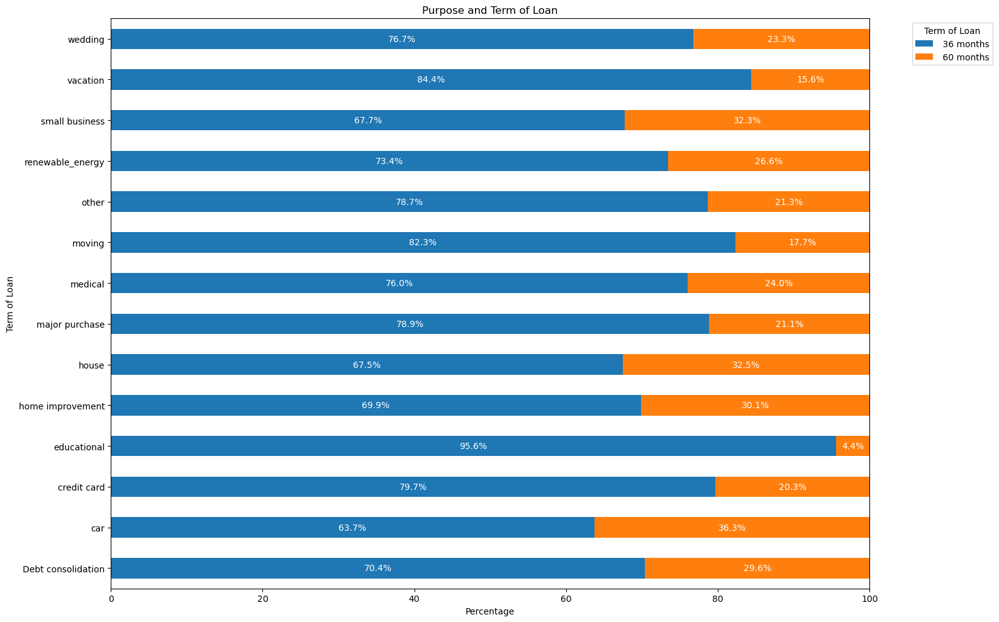

In [ ]:
df_p_t = pd.crosstab(data['Purpose'], data['term'])

# Calculate percentages per row
percent_df = df_p_t.div(df_p_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Term of Loan')
ax.set_title('Purpose and Term of Loan')
ax.set_xlim(0, 100)
ax.legend(title='Term of Loan', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


So far, we see that different loan purposes have a different spread of loan terms. Perhaps standardizing a loan's term for a particular purpose would help - example: loans for education can have a fixed term of 60 months, which would mean a lower installment amount can be paid for those loans and the entire loan can be paid off in five years

**Trying to understand the profile of the loan borrowers**

**Analyzing the employment experience of the loan borrowers**

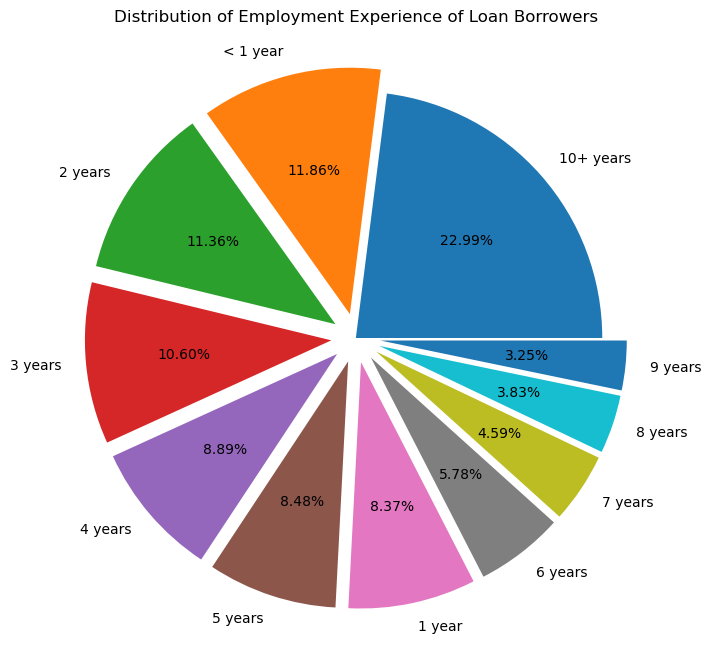

In [ ]:
plt.figure(figsize=(10,8))
plt.pie(round(data['emp_length'].value_counts(normalize=True)*100,2),
       labels=data['emp_length'].value_counts().index,autopct='%.2f%%',explode=(0,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1))
plt.title('Distribution of Employment Experience of Loan Borrowers')
plt.show()

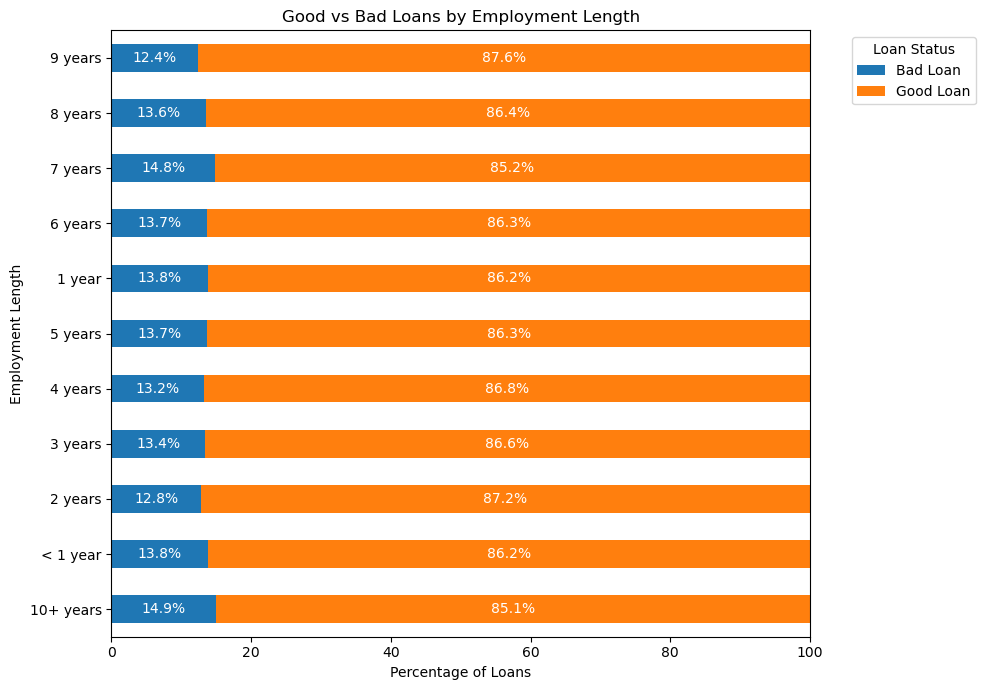

In [ ]:
df_emp = pd.crosstab(data['emp_length'], data[target])
df_emp_sorted = df_emp.sort_values(by=['Bad Loan', 'Good Loan'], ascending=[False, False])

# Calculate percentages per row
percent_df = df_emp_sorted.div(df_emp_sorted.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(10, 7))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax, color=['#1f77b4', '#ff7f0e'])

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Loans')
ax.set_ylabel('Employment Length')
ax.set_title('Good vs Bad Loans by Employment Length')
ax.set_xlim(0, 100)
ax.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


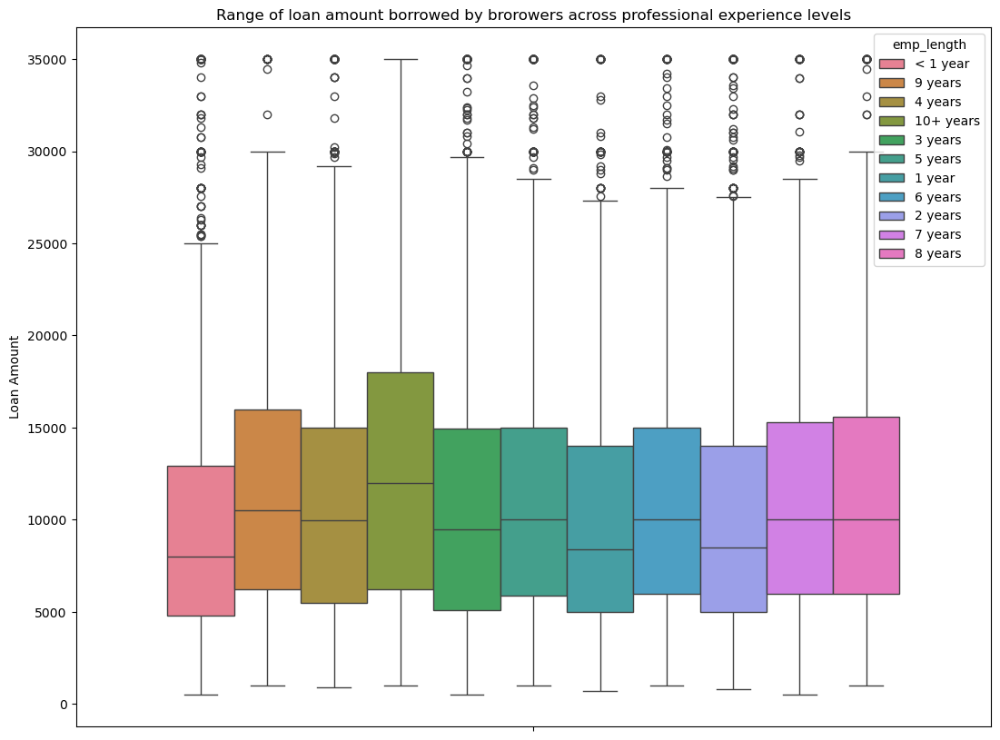

In [ ]:
sns.boxplot(data=data,
            hue='emp_length',
            y='loan_amount')
plt.title('Range of loan amount borrowed by brorowers across professional experience levels')
plt.ylabel('Loan Amount')
plt.show()

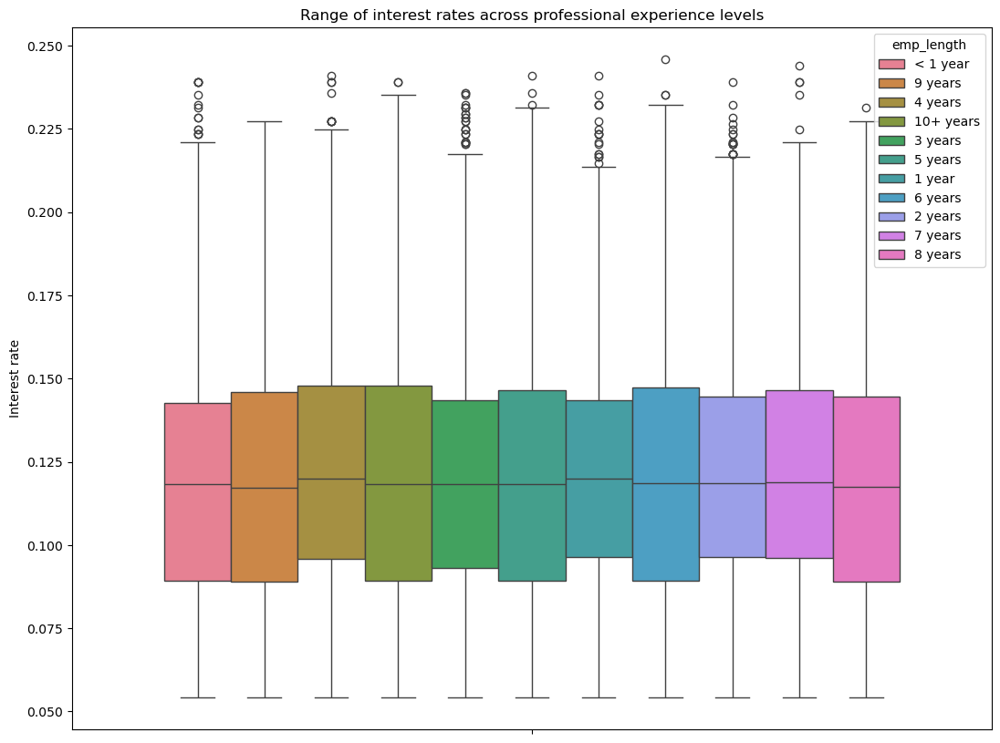

In [ ]:
sns.boxplot(data=data,
            hue='emp_length',
            y='int_rate')
plt.title('Range of interest rates across professional experience levels')
plt.ylabel('Interest rate')
plt.show()

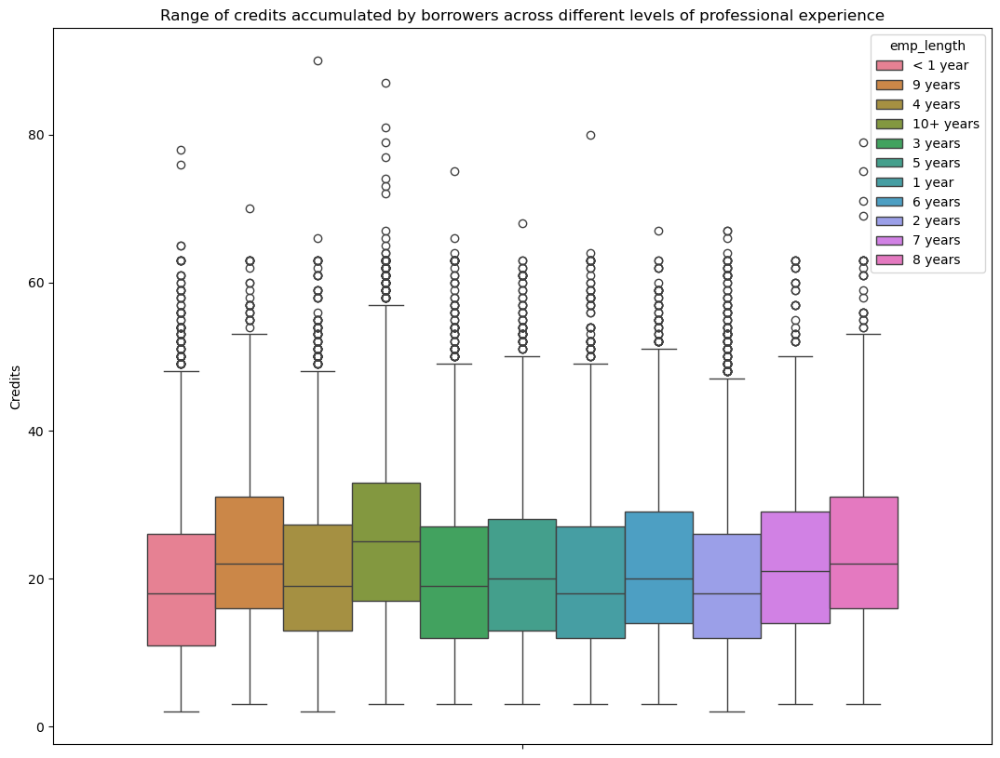

In [ ]:
sns.boxplot(data=data,
            hue='emp_length',
            y='total_acc')
plt.title('Range of credits accumulated by borrowers across different levels of professional experience')
plt.ylabel('Credits')
plt.show()

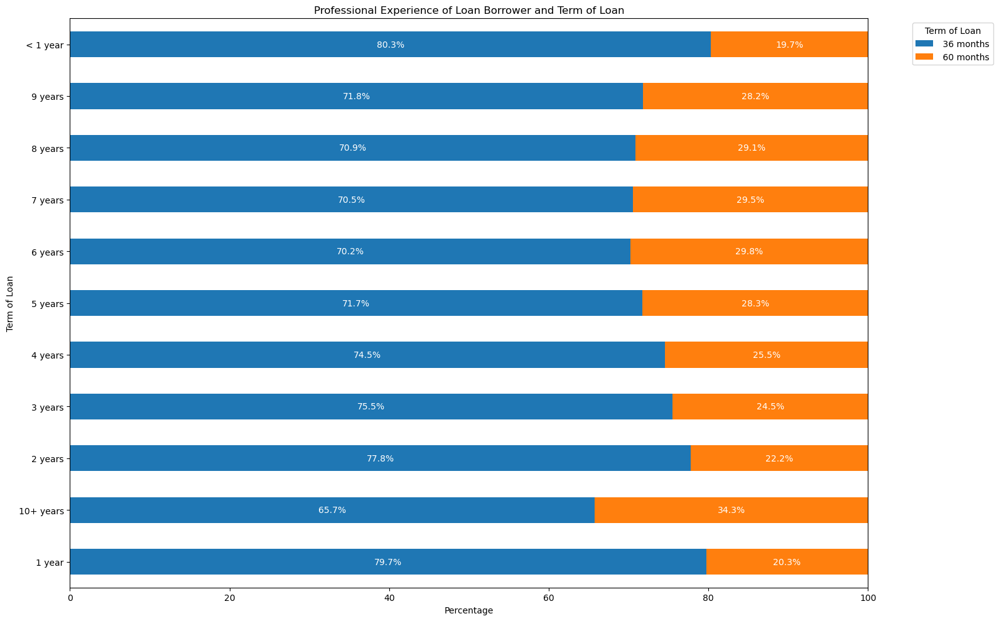

In [ ]:
df_e_t = pd.crosstab(data['emp_length'], data['term'])

# Calculate percentages per row
percent_df = df_e_t.div(df_e_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Term of Loan')
ax.set_title('Professional Experience of Loan Borrower and Term of Loan')
ax.set_xlim(0, 100)
ax.legend(title='Term of Loan', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


**Home ownership status of loan borrowers**

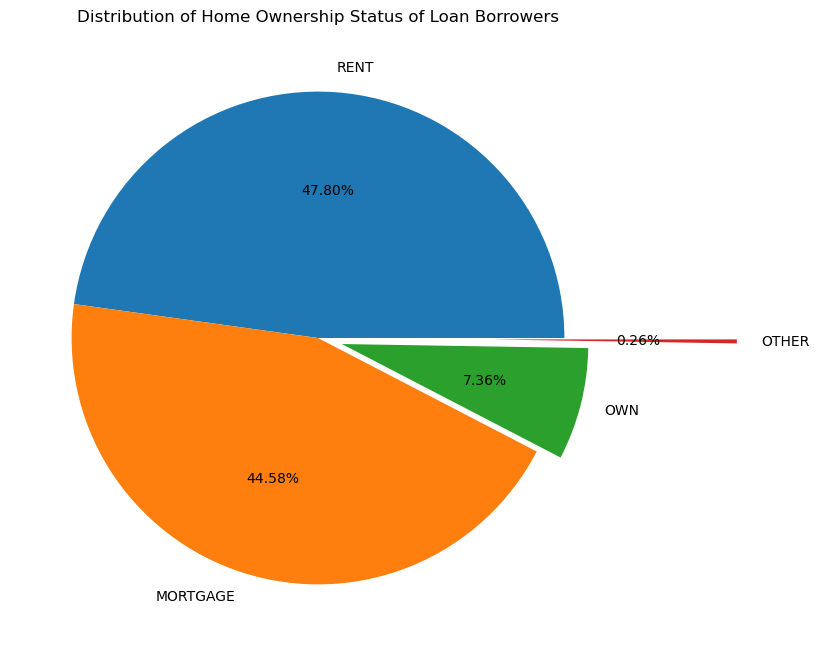

In [ ]:
plt.figure(figsize=(10,8))
plt.pie(round(data['home_ownership'].value_counts(normalize=True)*100,2),
       labels=data['home_ownership'].value_counts().index,autopct='%.2f%%',explode=(0,0,0.1,0.7))
plt.title('Distribution of Home Ownership Status of Loan Borrowers')
plt.show()

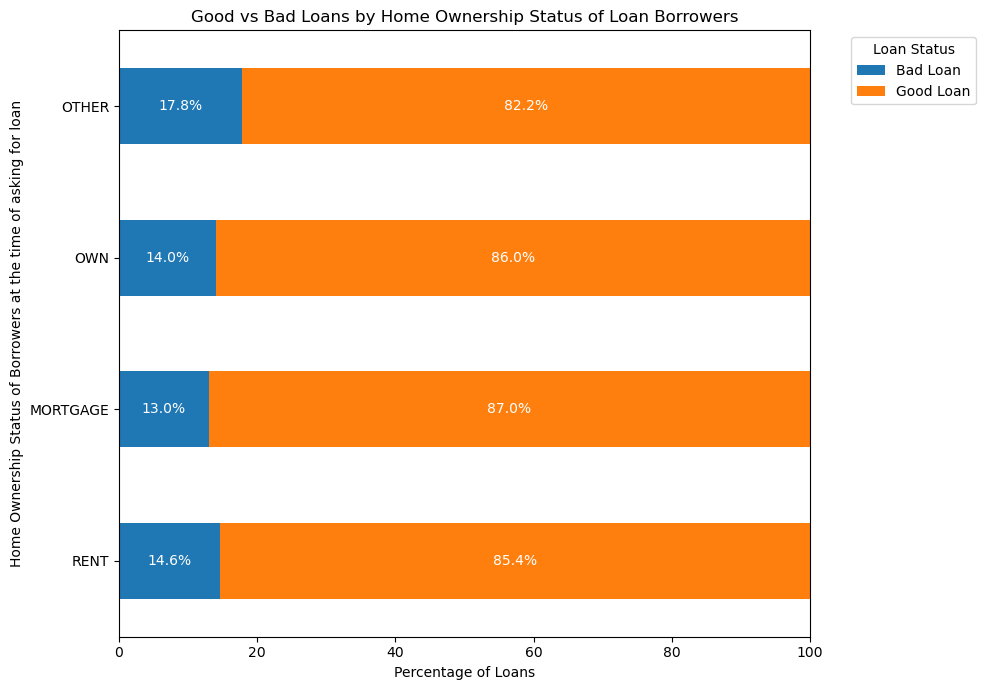

In [ ]:
df_he = pd.crosstab(data['home_ownership'], data[target])
df_he_sorted = df_he.sort_values(by=['Bad Loan', 'Good Loan'], ascending=[False, False])

# Calculate percentages per row
percent_df = df_he_sorted.div(df_he_sorted.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(10, 7))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax, color=['#1f77b4', '#ff7f0e'])

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Loans')
ax.set_ylabel('Home Ownership Status of Borrowers at the time of asking for loan')
ax.set_title('Good vs Bad Loans by Home Ownership Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


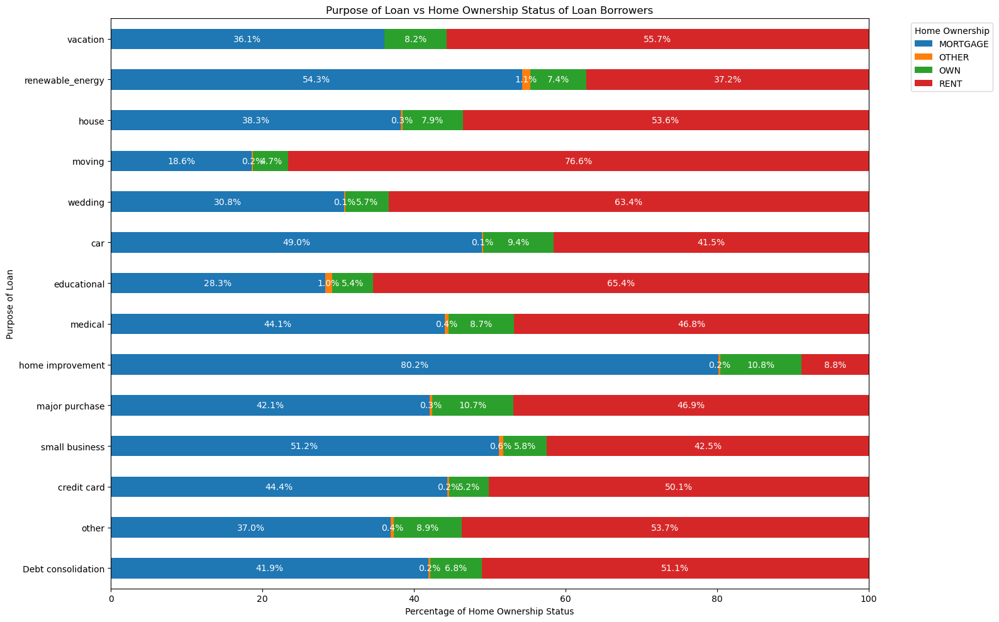

In [ ]:
df_heP = pd.crosstab(data['Purpose'], data['home_ownership'])
df_heP_sorted = df_heP.sort_values(by=['OTHER','RENT','OWN','MORTGAGE'], ascending=[False, False,False,False])

# Calculate percentages per row
percent_df = df_heP_sorted.div(df_heP_sorted.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Home Ownership Status')
ax.set_ylabel('Purpose of Loan')
ax.set_title('Purpose of Loan vs Home Ownership Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Home Ownership', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


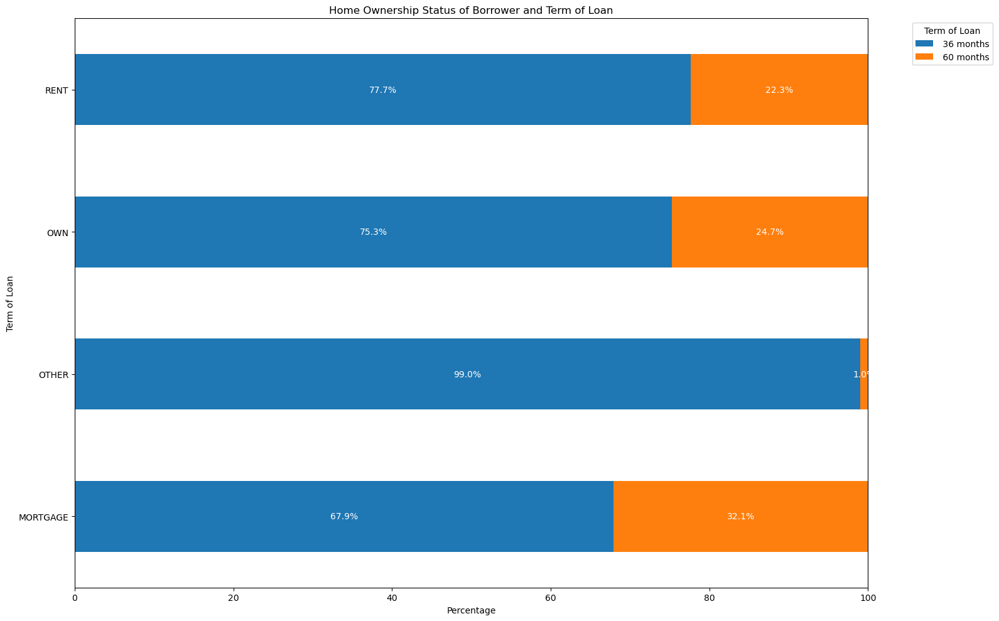

In [ ]:
df_h_t = pd.crosstab(data['home_ownership'], data['term'])

# Calculate percentages per row
percent_df = df_h_t.div(df_h_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Term of Loan')
ax.set_title('Home Ownership Status of Borrower and Term of Loan')
ax.set_xlim(0, 100)
ax.legend(title='Term of Loan', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


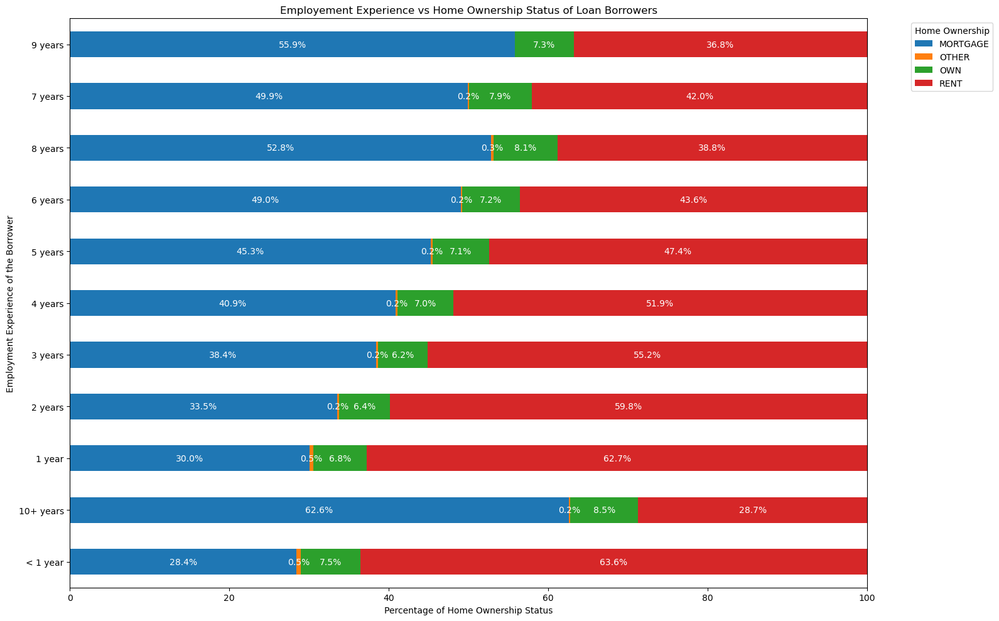

In [ ]:
df_heP = pd.crosstab(data['emp_length'], data['home_ownership'])
df_heP_sorted = df_heP.sort_values(by=['OTHER','RENT','OWN','MORTGAGE'], ascending=[False, False,False,False])

# Calculate percentages per row
percent_df = df_heP_sorted.div(df_heP_sorted.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Home Ownership Status')
ax.set_ylabel('Employment Experience of the Borrower')
ax.set_title('Employement Experience vs Home Ownership Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Home Ownership', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


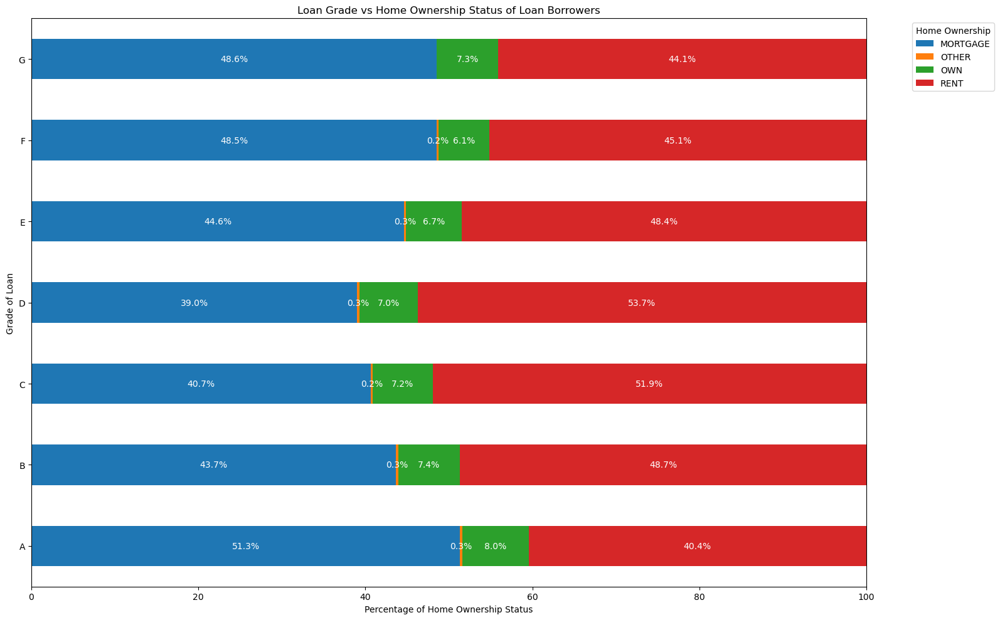

In [ ]:
df_he_grade = pd.crosstab(data['Grade'], data['home_ownership'])

# Calculate percentages per row
percent_df = df_he_grade.div(df_he_grade.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Home Ownership Status')
ax.set_ylabel('Grade of Loan')
ax.set_title('Loan Grade vs Home Ownership Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Home Ownership', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


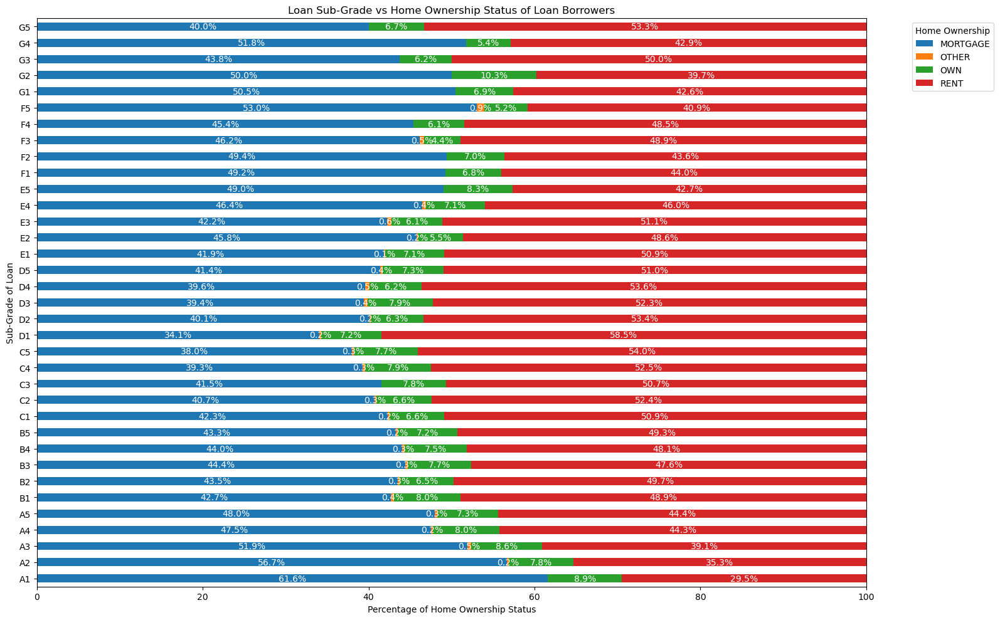

In [ ]:
df_he_grade = pd.crosstab(data['sub_grade'], data['home_ownership'])

# Calculate percentages per row
percent_df = df_he_grade.div(df_he_grade.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Home Ownership Status')
ax.set_ylabel('Sub-Grade of Loan')
ax.set_title('Loan Sub-Grade vs Home Ownership Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Home Ownership', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


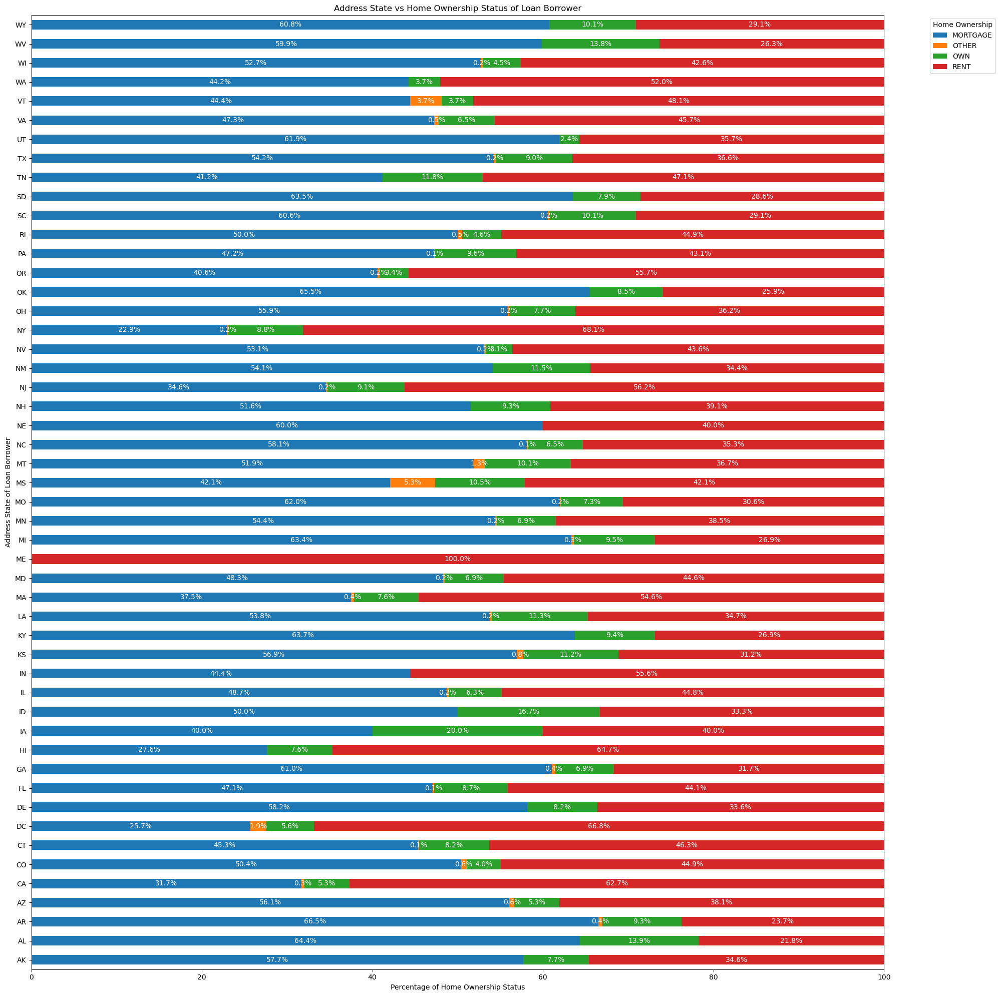

In [ ]:
df_he_state = pd.crosstab(data['address_state'], data['home_ownership'])

# Calculate percentages per row
percent_df = df_he_state.div(df_he_state.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(20,20))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Home Ownership Status')
ax.set_ylabel('Address State of Loan Borrower')
ax.set_title('Address State vs Home Ownership Status of Loan Borrower')
ax.set_xlim(0, 100)
ax.legend(title='Home Ownership', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


Some states do not have customers whose current 'home_ownership' status is 'OTHER'

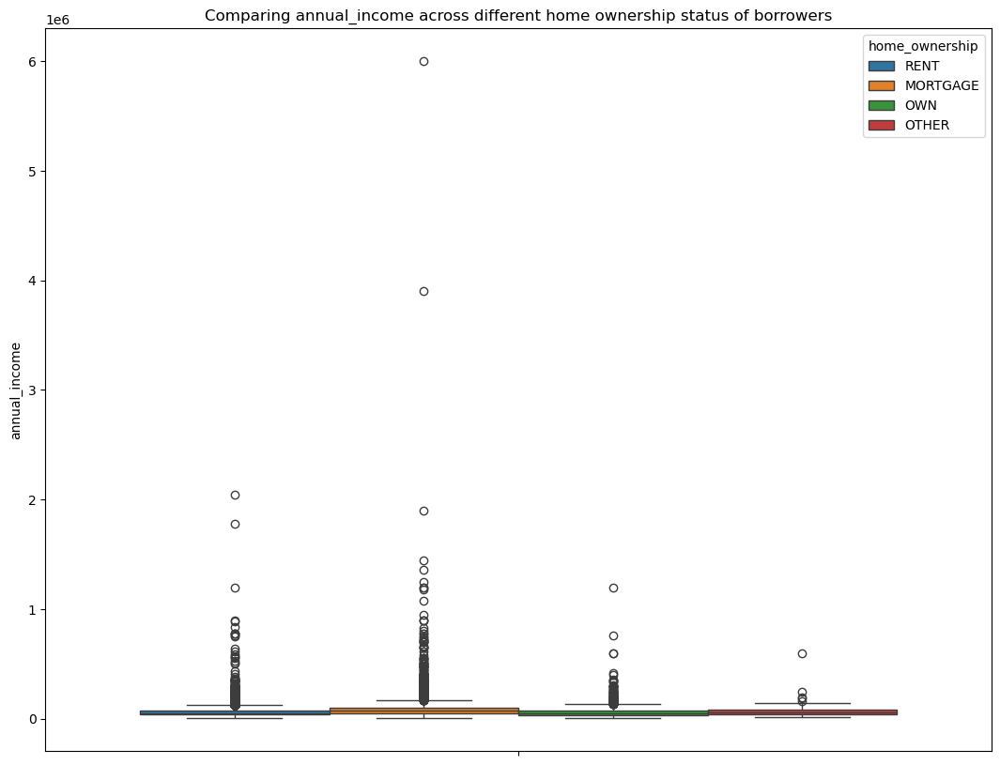

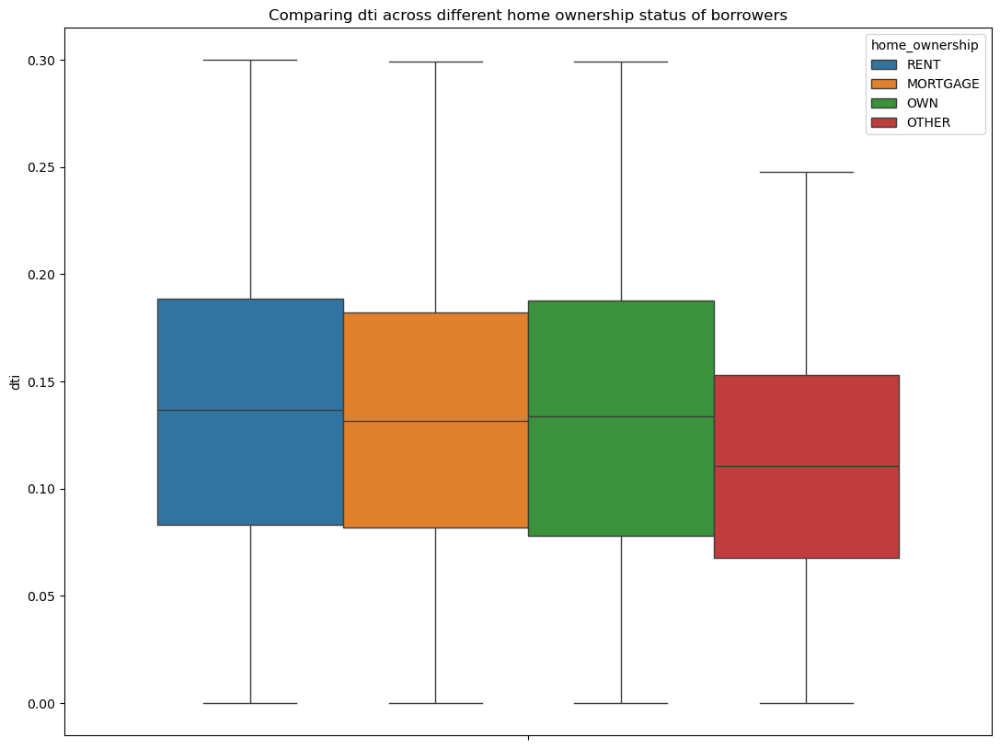

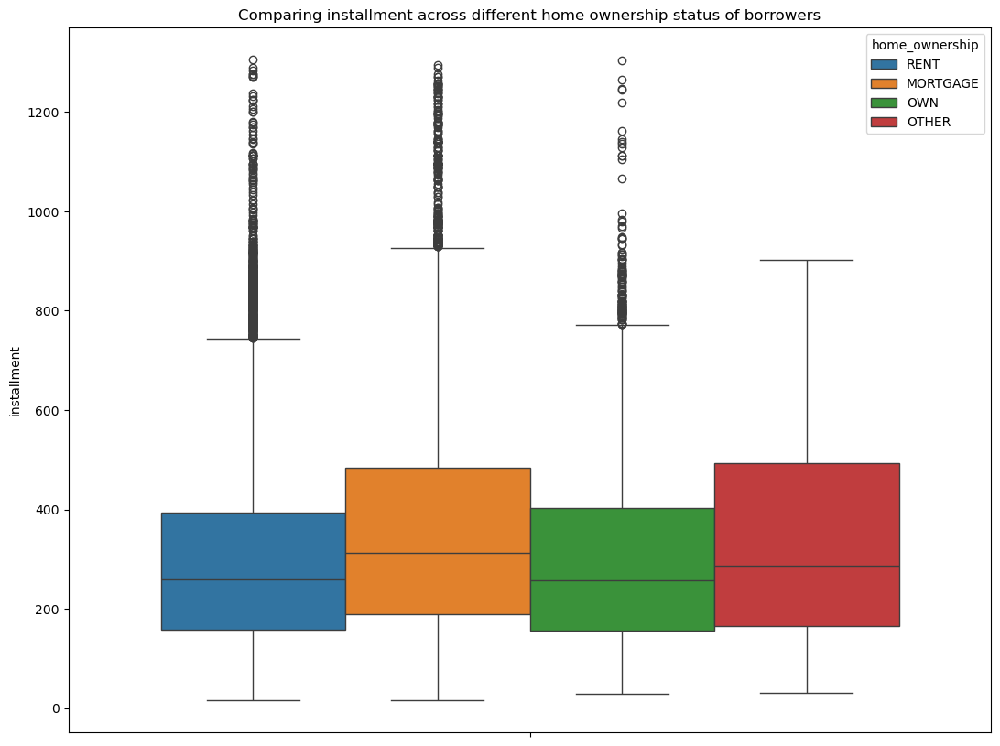

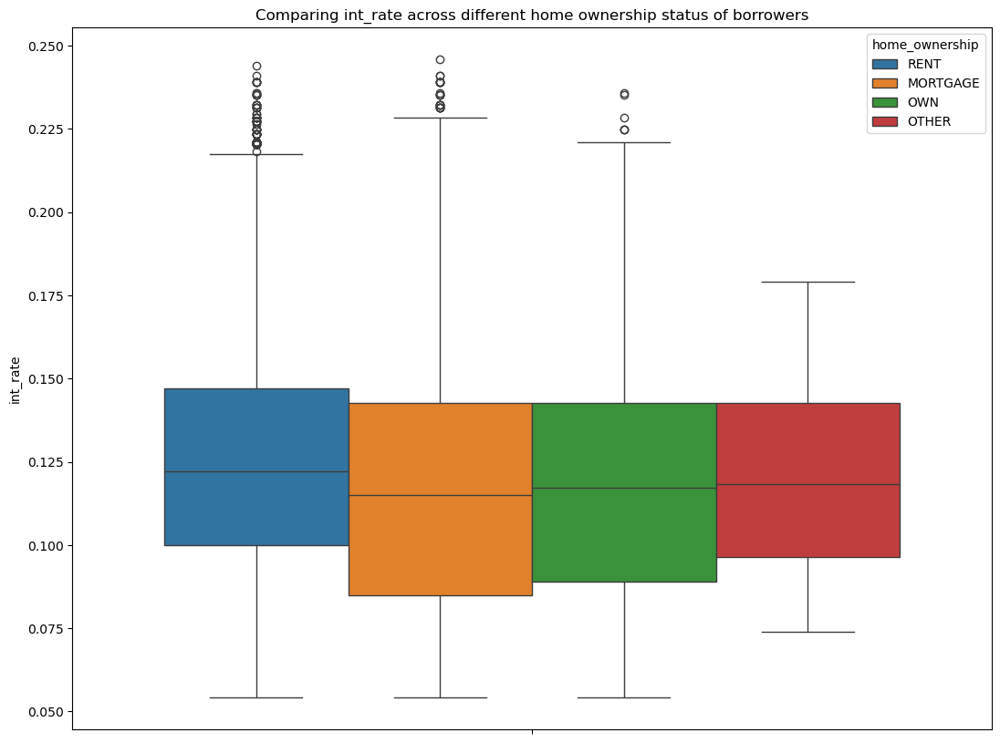

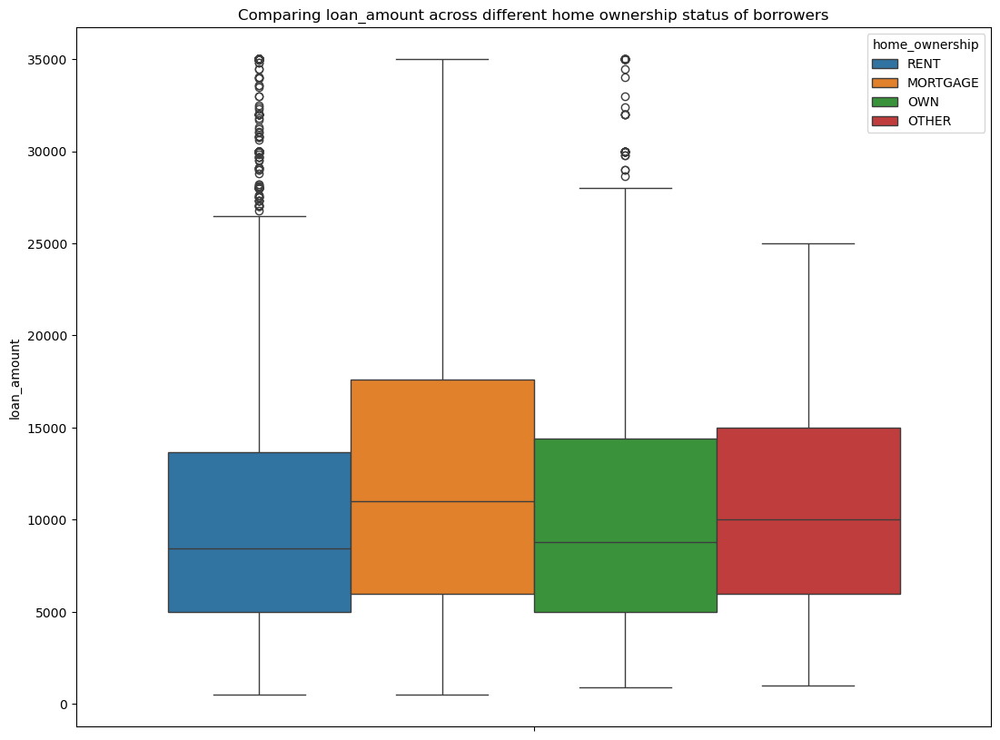

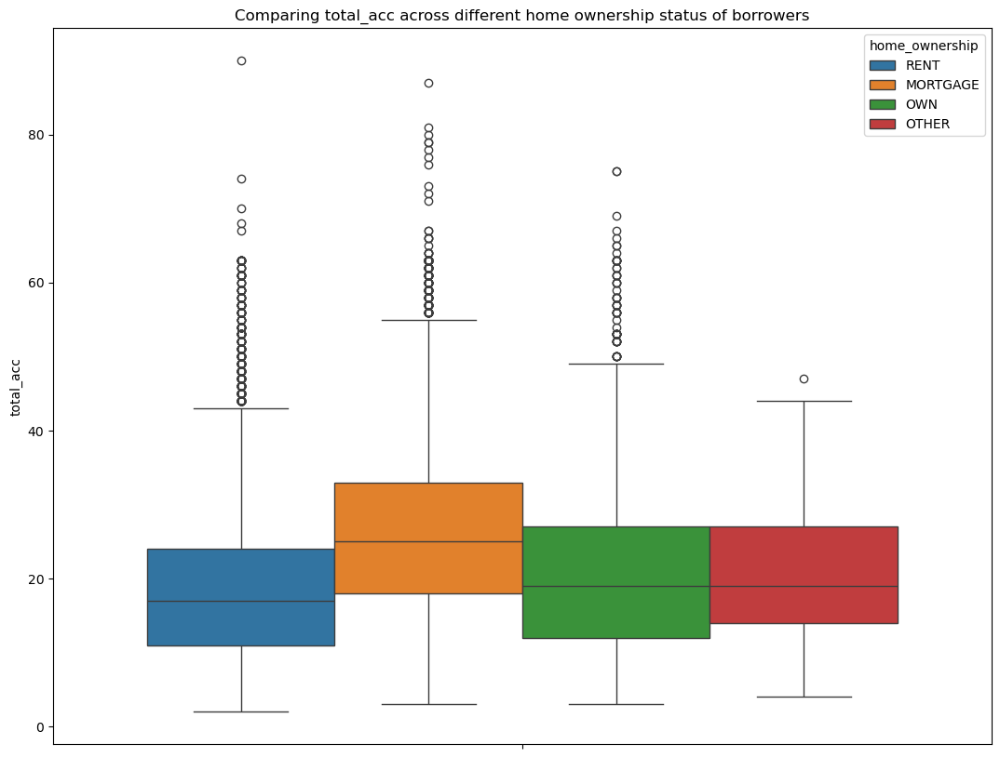

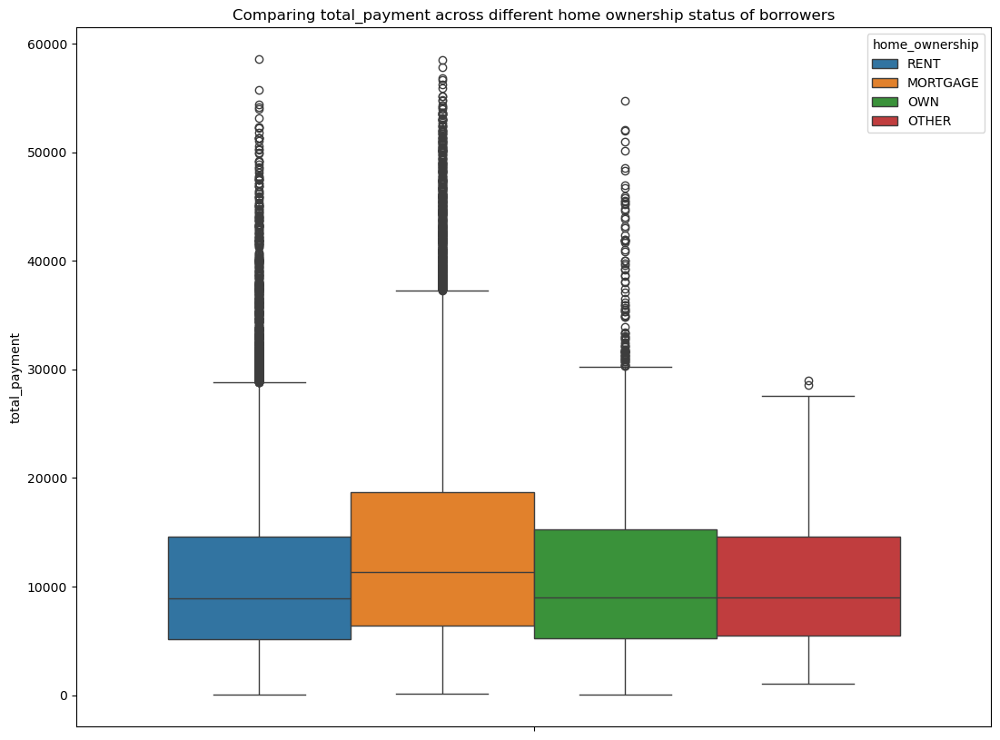

In [ ]:
for i in num:
    sns.boxplot(data=data,y=i,hue='home_ownership')
    plt.title(f'Comparing {i} across different home ownership status of borrowers')
    plt.ylabel(i)
    plt.show()

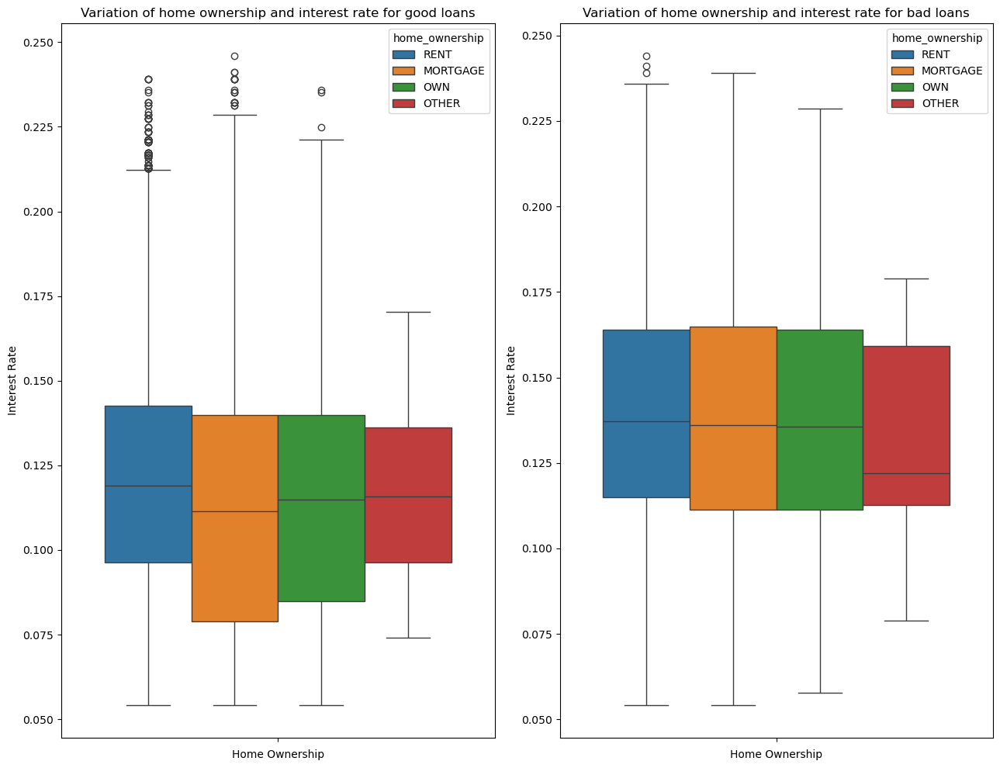

In [ ]:
plt.subplot(1,2,1)
sns.boxplot(data=data[data[target]=='Good Loan'],hue='home_ownership',y='int_rate')
plt.title('Variation of home ownership and interest rate for good loans')
plt.ylabel('Interest Rate')
plt.xlabel('Home Ownership')

plt.subplot(1,2,2)
sns.boxplot(data=data[data[target]=='Bad Loan'],hue='home_ownership',y='int_rate')
plt.title('Variation of home ownership and interest rate for bad loans')
plt.ylabel('Interest Rate')
plt.xlabel('Home Ownership')

plt.tight_layout()
plt.show()

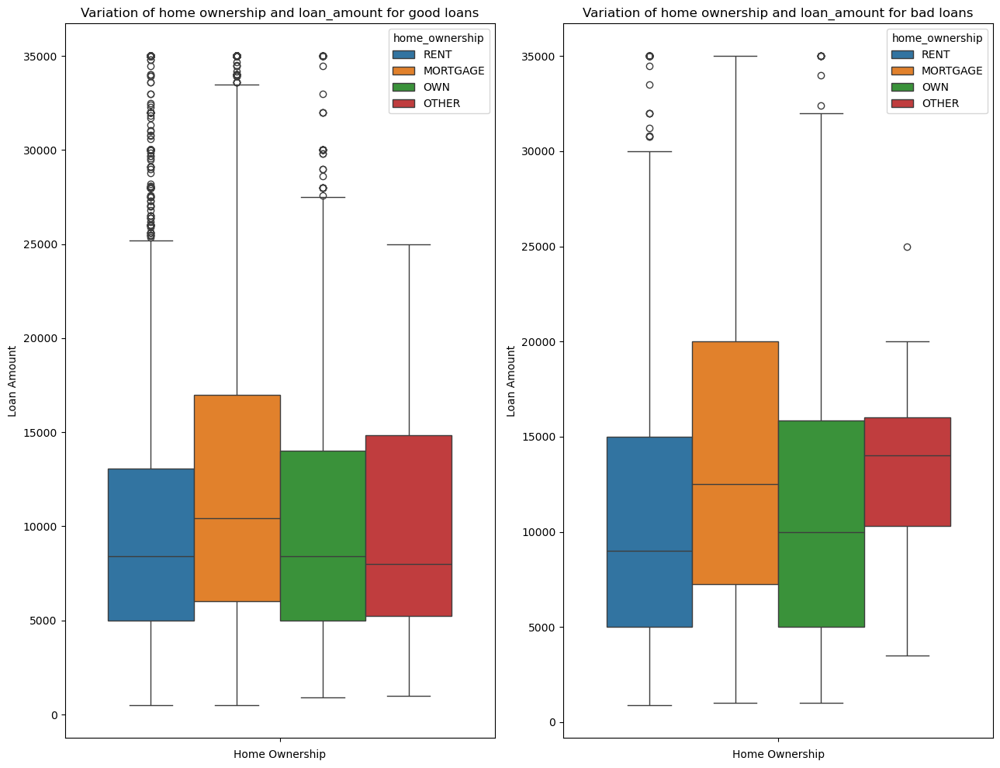

In [ ]:
plt.subplot(1,2,1)
sns.boxplot(data=data[data[target]=='Good Loan'],hue='home_ownership',y='loan_amount')
plt.title('Variation of home ownership and loan_amount for good loans')
plt.ylabel('Loan Amount')
plt.xlabel('Home Ownership')

plt.subplot(1,2,2)
sns.boxplot(data=data[data[target]=='Bad Loan'],hue='home_ownership',y='loan_amount')
plt.title('Variation of home ownership and loan_amount for bad loans')
plt.ylabel('Loan Amount')
plt.xlabel('Home Ownership')

plt.tight_layout()
plt.show()

On analyzing various numerical columns, we've found certain insights:
- Typically, the Bad Loans start off with higher interest rates while asking higher loan amounts than their Good Loan counterparts
- However, the total payment they make on their loans is lower than the Good Loan counterparts
- They also tend to pay a lower first installment amount as well

**Analyzing based on verification status**

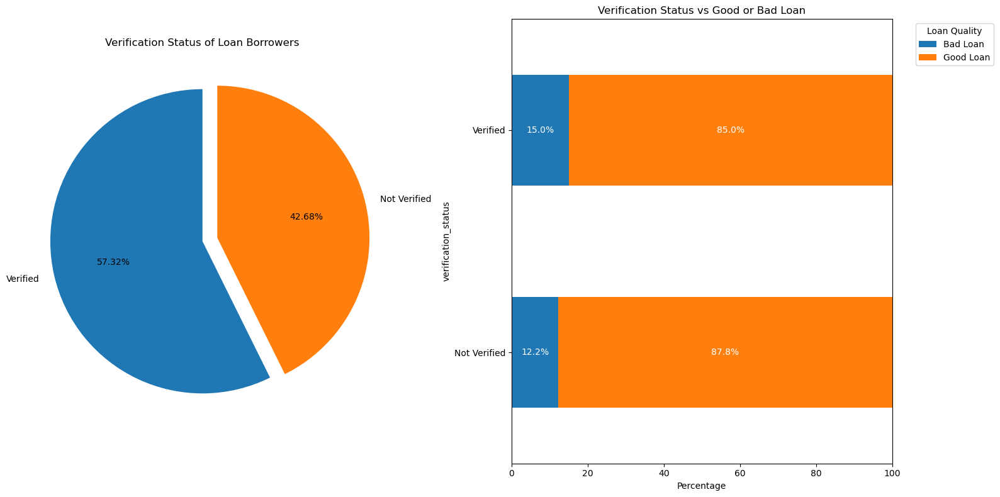

In [ ]:
# Prepare summary data
verification_counts = data['verification_status'].value_counts()
df_vs = pd.crosstab(data['verification_status'], data[target])
percent_df = df_vs.div(df_vs.sum(axis=1), axis=0) * 100

# Layout: One row, two columns
fig, axes = plt.subplots(1, 2, figsize=(16, 8))  # Adjust figsize as needed for your display

# Pie chart
axes[0].pie(
    verification_counts,
    explode=(0, 0.1),
    labels=verification_counts.index,
    autopct='%.2f%%',
    startangle=90
)
axes[0].set_title('Verification Status of Loan Borrowers')

# Horizontal stacked bar chart
normalized_counts = percent_df.copy()
bars = normalized_counts.plot(
    kind='barh',
    stacked=True,
    ax=axes[1],
    legend=False
)

# Add percentage labels inside bar segments
for container, col in zip(axes[1].containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    axes[1].bar_label(container, labels=labels, label_type='center', fontsize=10,color='white')

axes[1].set_xlabel('Percentage')
axes[1].set_title('Verification Status vs Good or Bad Loan')
axes[1].set_xlim(0, 100)
axes[1].legend(title='Loan Quality', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

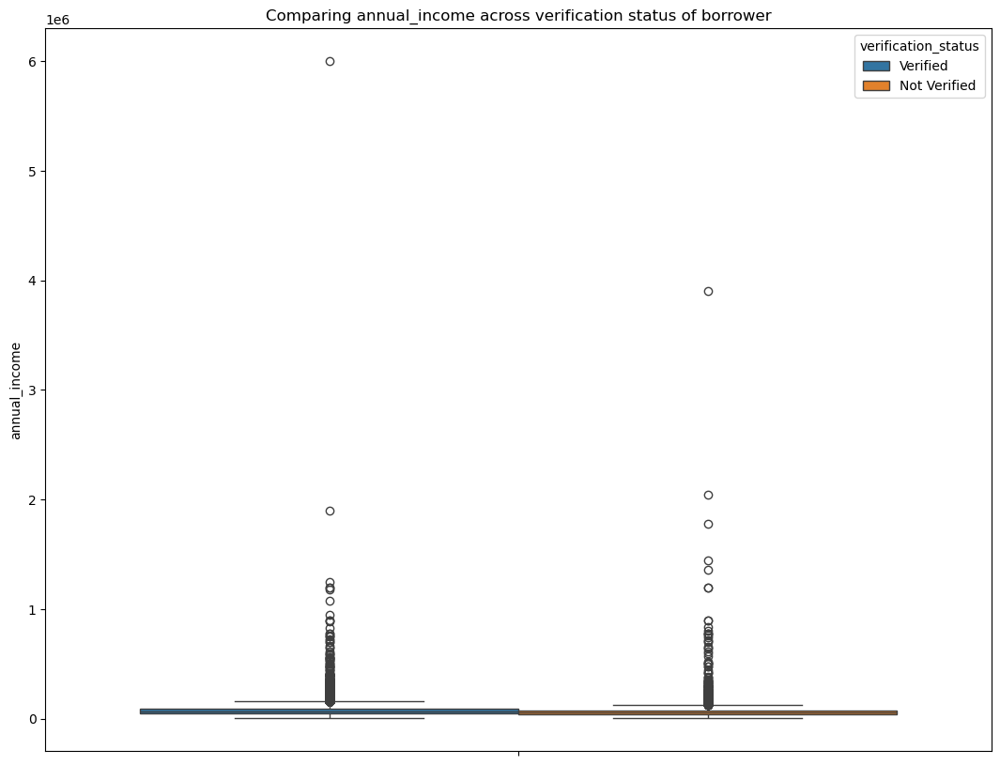

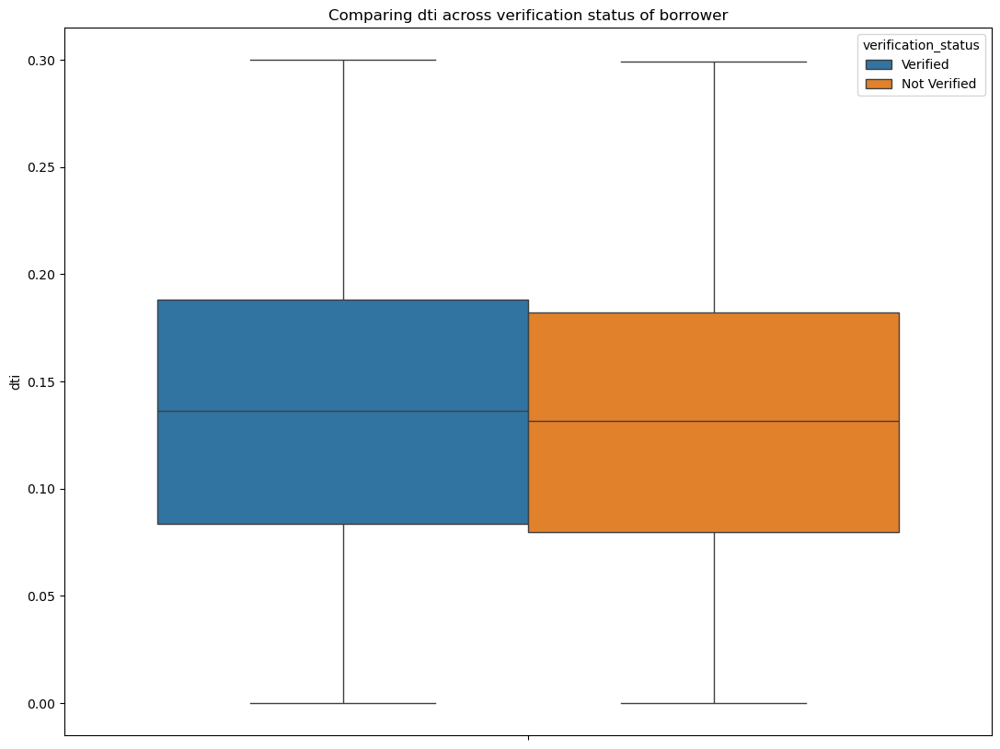

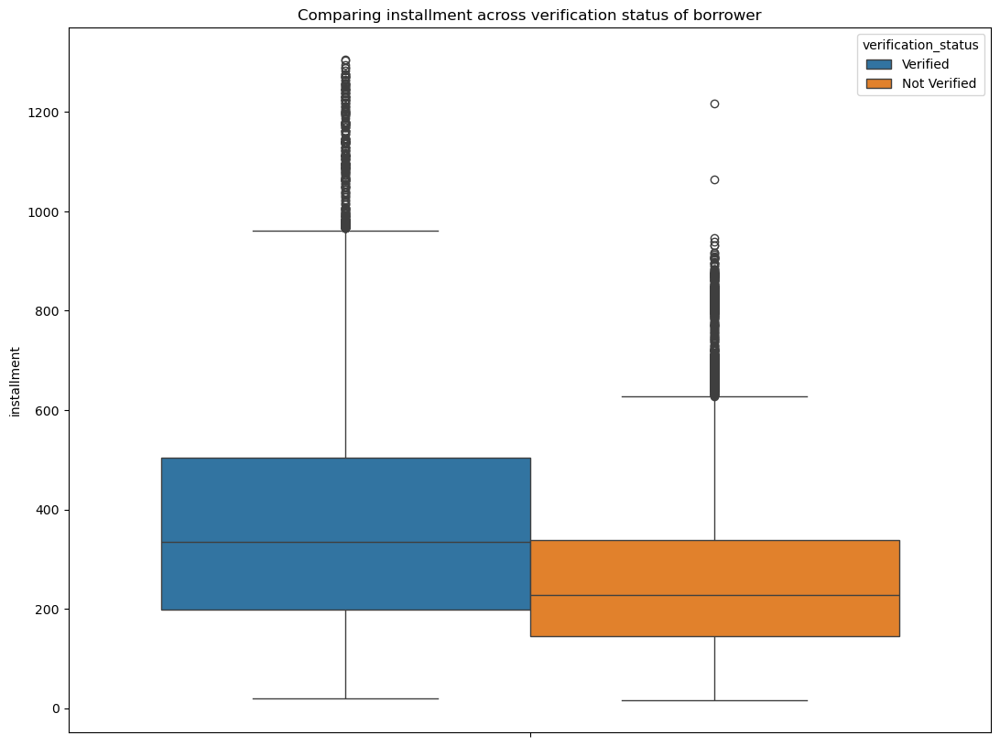

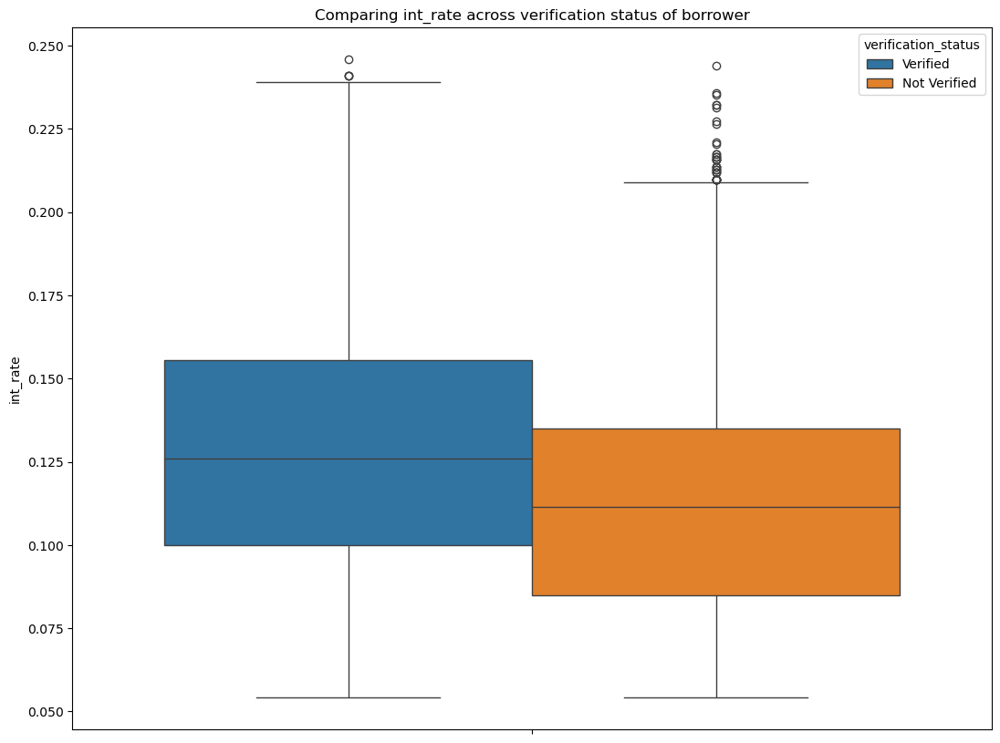

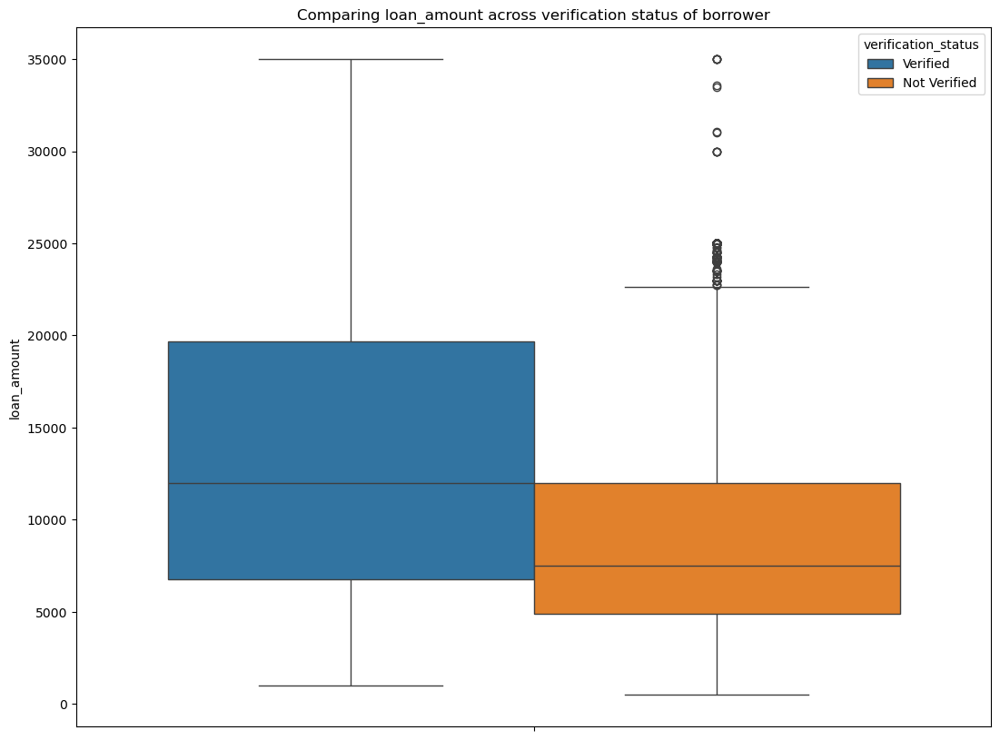

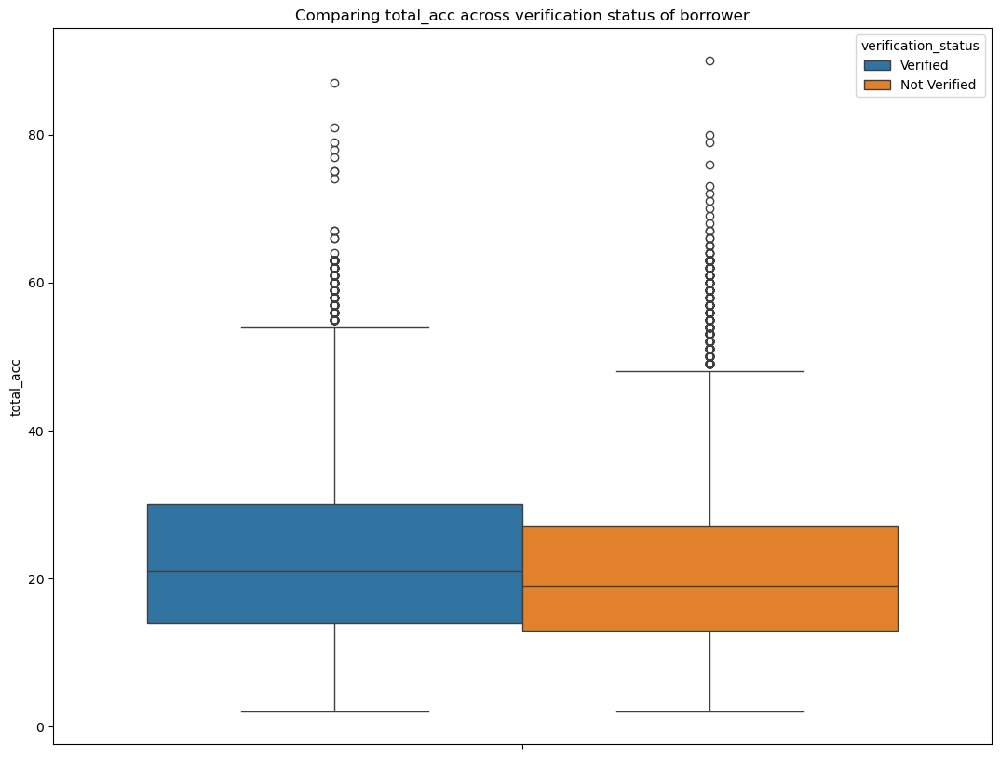

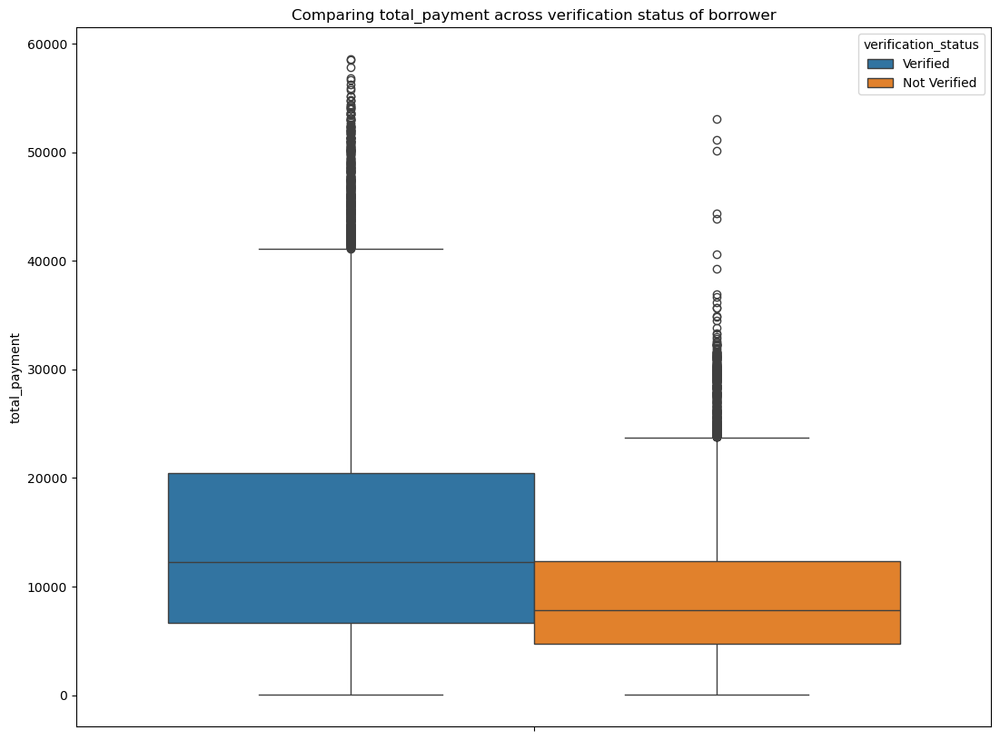

In [ ]:
for i in num:
    sns.boxplot(data=data,y=i,hue='verification_status')
    plt.title(f'Comparing {i} across verification status of borrower')
    plt.ylabel(f'{i}')
    plt.show()

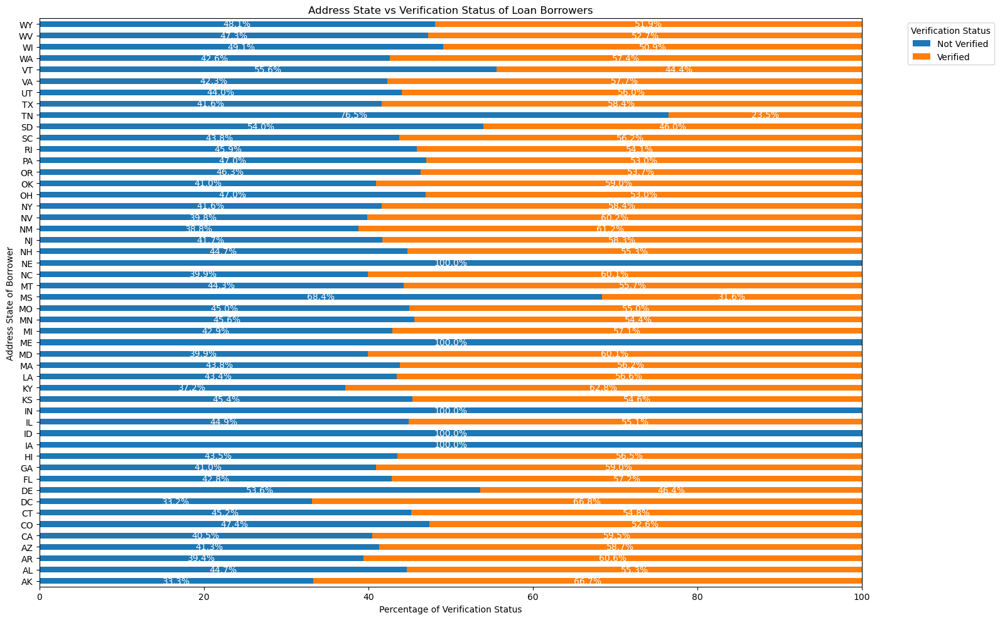

In [ ]:
df_vs_as = pd.crosstab(data['address_state'], data['verification_status'])

# Calculate percentages per row
percent_df = df_vs_as.div(df_vs_as.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Verification Status')
ax.set_ylabel('Address State of Borrower')
ax.set_title('Address State vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Verification Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


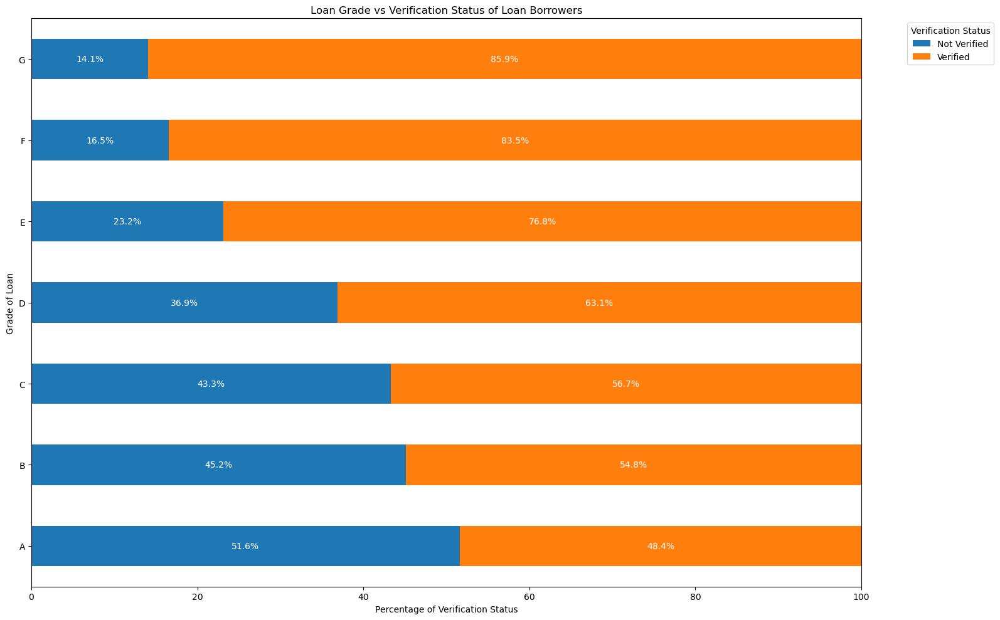

In [ ]:
df_vs_grade = pd.crosstab(data['Grade'], data['verification_status'])

# Calculate percentages per row
percent_df = df_vs_grade.div(df_vs_grade.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Verification Status')
ax.set_ylabel('Grade of Loan')
ax.set_title('Loan Grade vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Verification Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


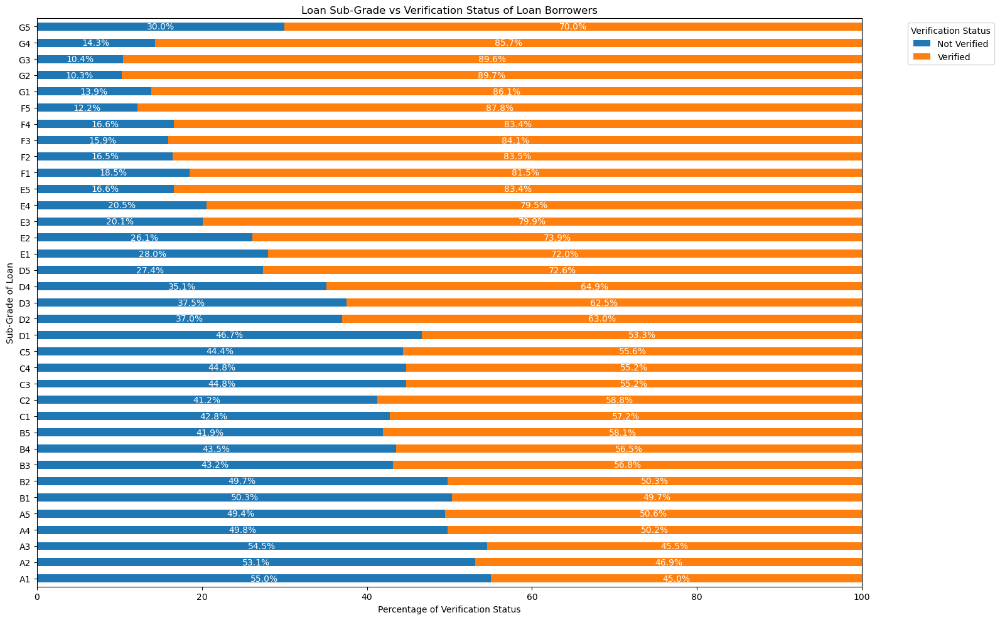

In [ ]:
df_vs_sgrade = pd.crosstab(data['sub_grade'], data['verification_status'])

# Calculate percentages per row
percent_df = df_vs_sgrade.div(df_vs_sgrade.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Verification Status')
ax.set_ylabel('Sub-Grade of Loan')
ax.set_title('Loan Sub-Grade vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Verification Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


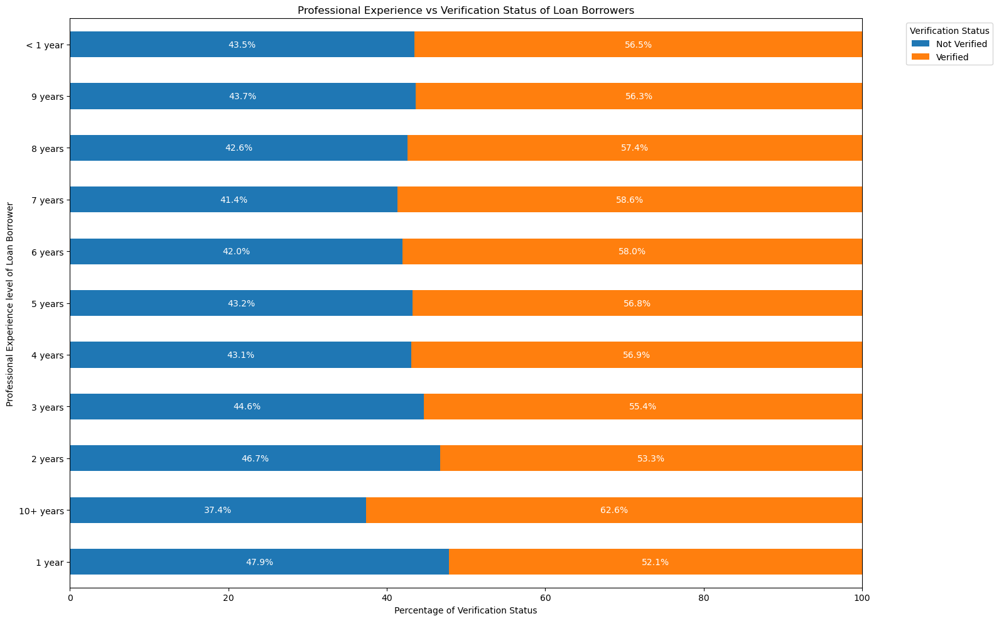

In [ ]:
df_vs_emp = pd.crosstab(data['emp_length'], data['verification_status'])

# Calculate percentages per row
percent_df = df_vs_emp.div(df_vs_emp.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Verification Status')
ax.set_ylabel('Professional Experience level of Loan Borrower')
ax.set_title('Professional Experience vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Verification Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


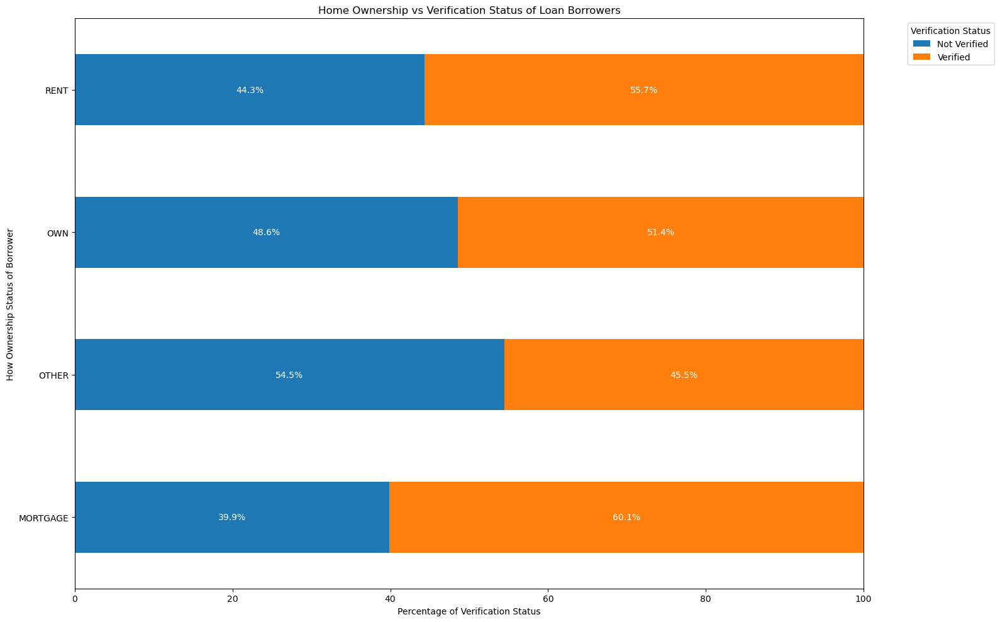

In [ ]:
df_vs_h = pd.crosstab(data['home_ownership'], data['verification_status'])

# Calculate percentages per row
percent_df = df_vs_h.div(df_vs_h.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Verification Status')
ax.set_ylabel('How Ownership Status of Borrower')
ax.set_title('Home Ownership vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Verification Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


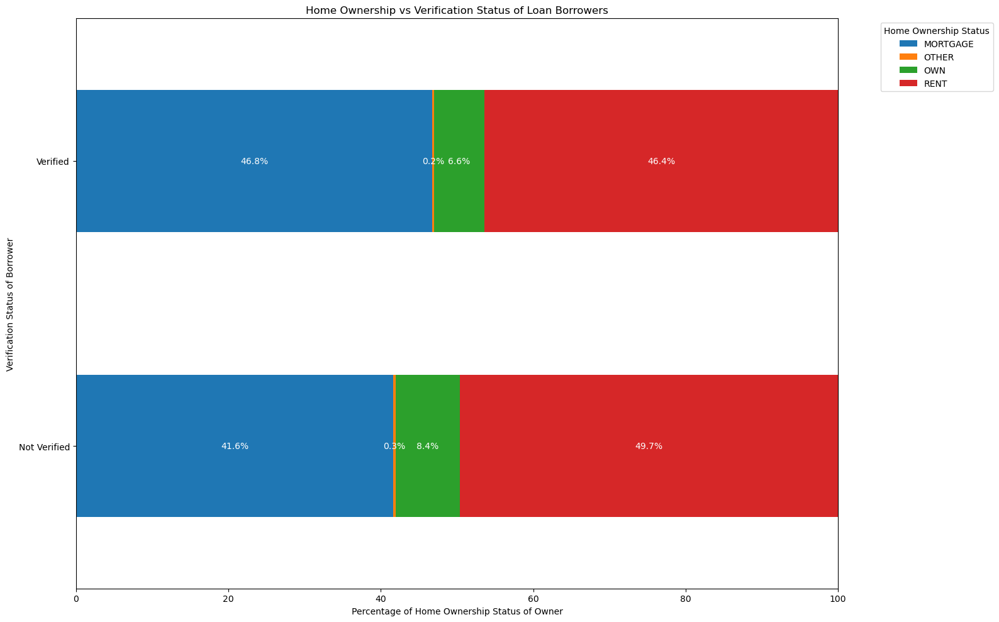

In [ ]:
df_vs_h = pd.crosstab(data['verification_status'], data['home_ownership'])

# Calculate percentages per row
percent_df = df_vs_h.div(df_vs_h.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Home Ownership Status of Owner')
ax.set_ylabel('Verification Status of Borrower')
ax.set_title('Home Ownership vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Home Ownership Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


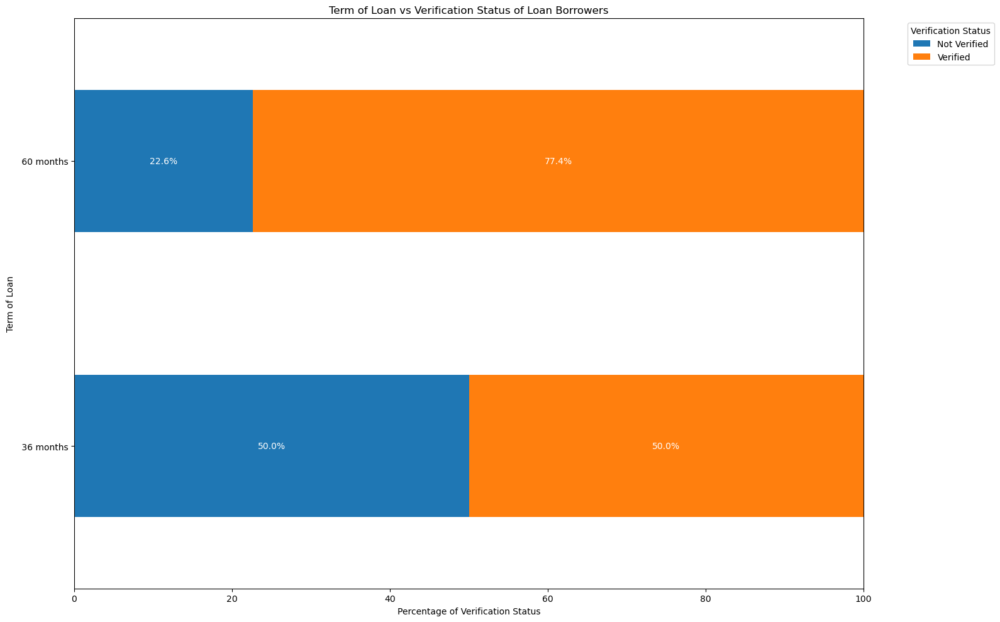

In [ ]:
df_vs_t = pd.crosstab(data['term'], data['verification_status'])

# Calculate percentages per row
percent_df = df_vs_t.div(df_vs_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage of Verification Status')
ax.set_ylabel('Term of Loan')
ax.set_title('Term of Loan vs Verification Status of Loan Borrowers')
ax.set_xlim(0, 100)
ax.legend(title='Verification Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


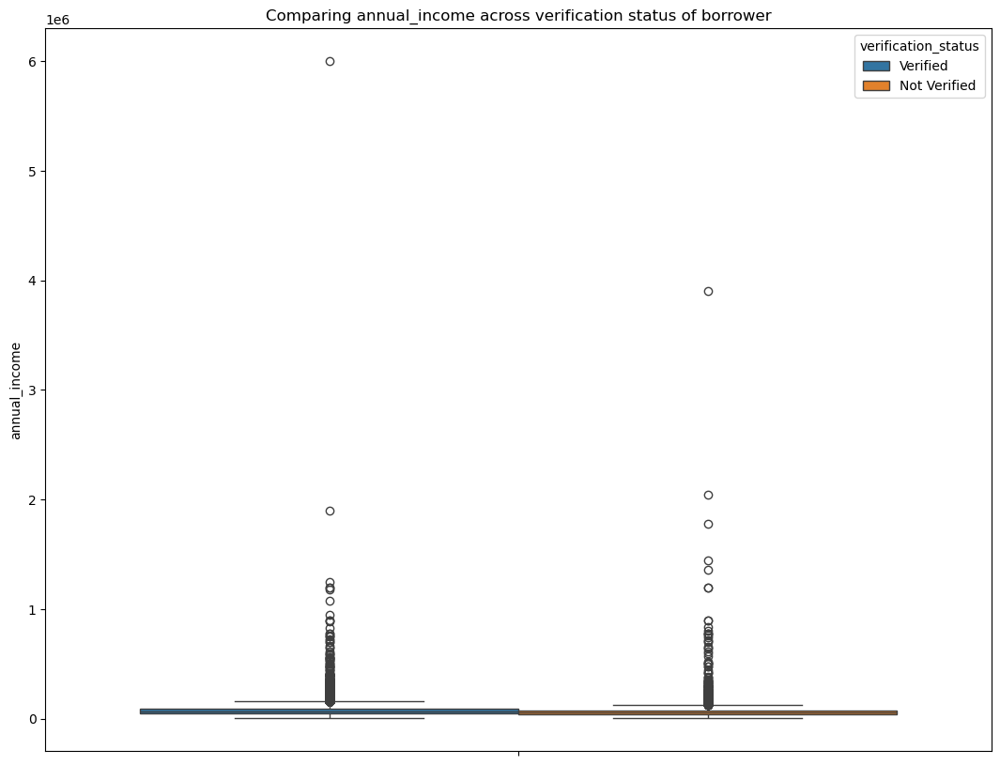

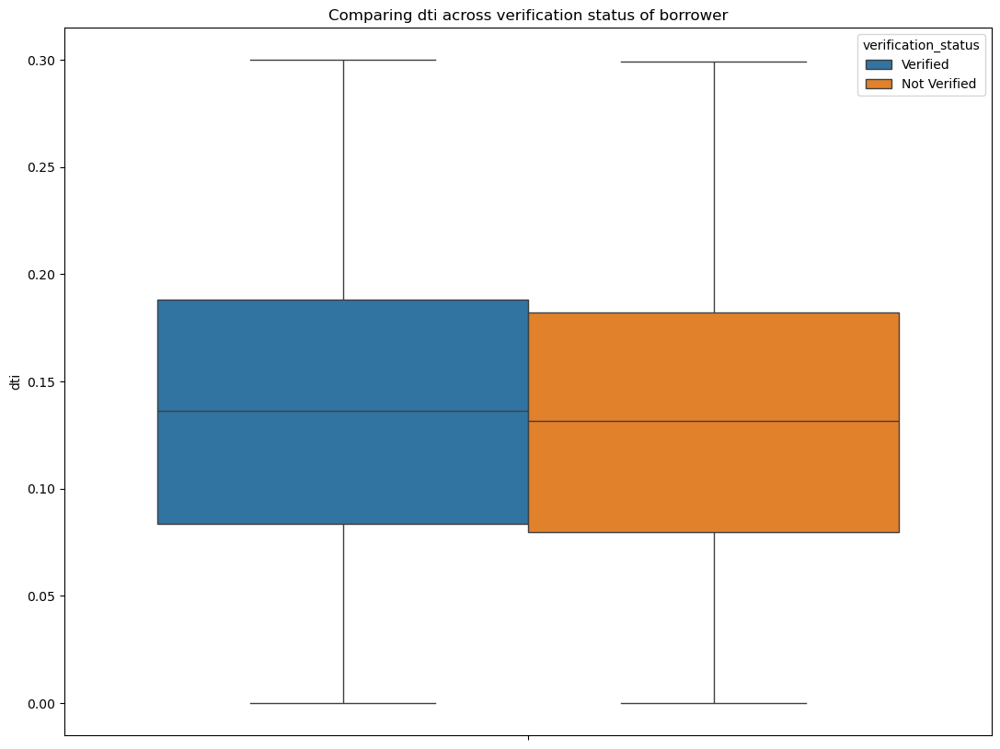

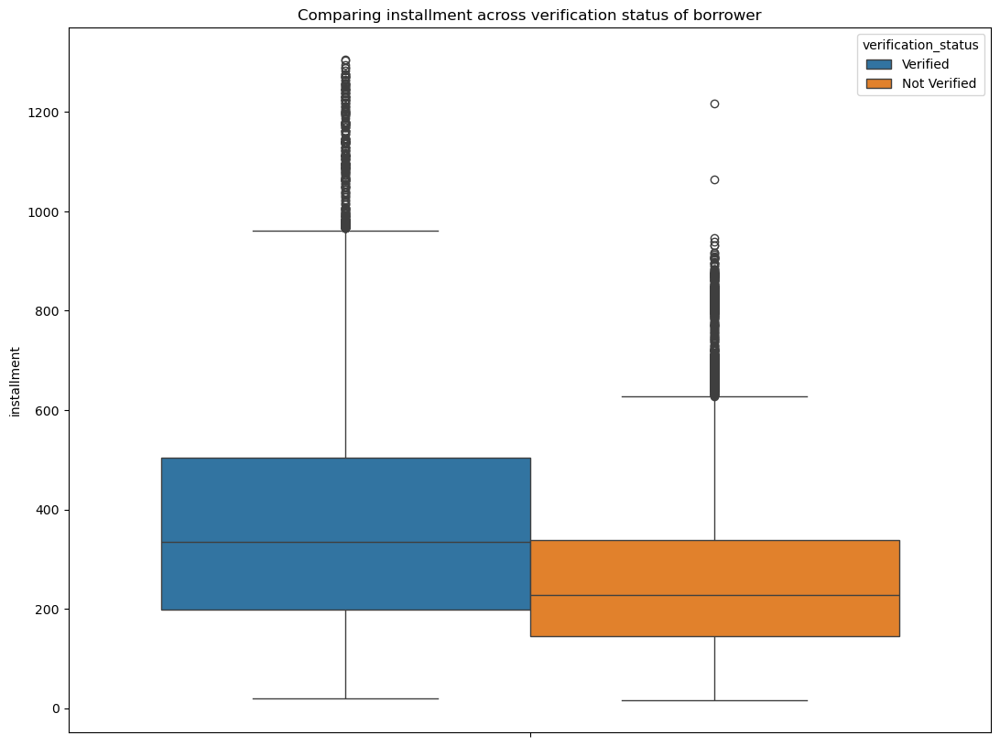

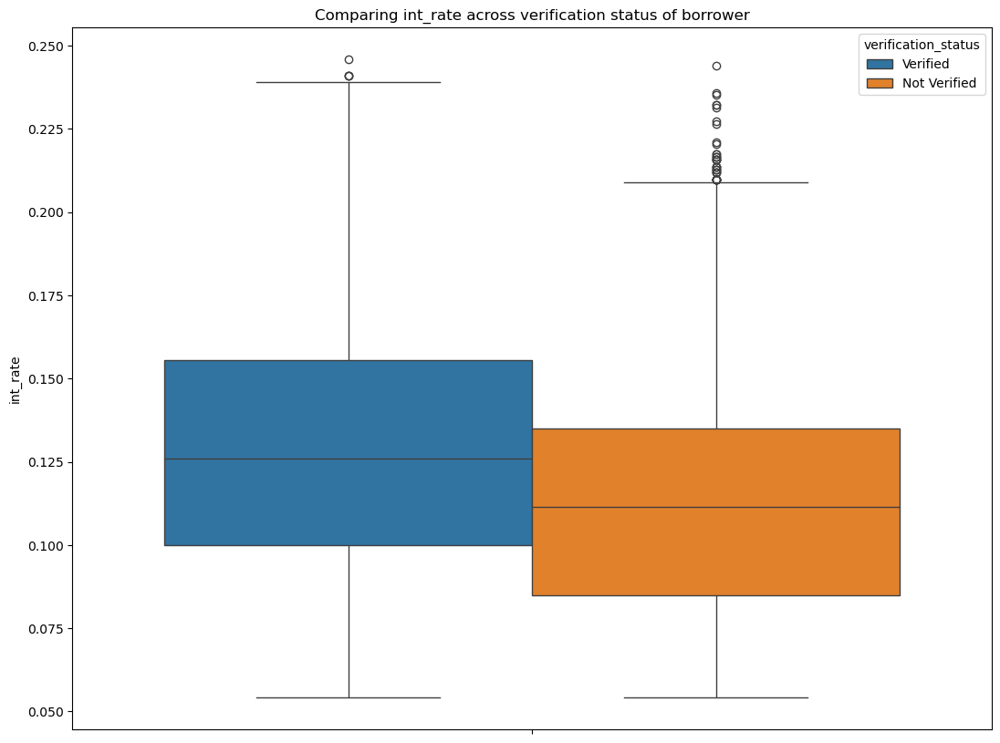

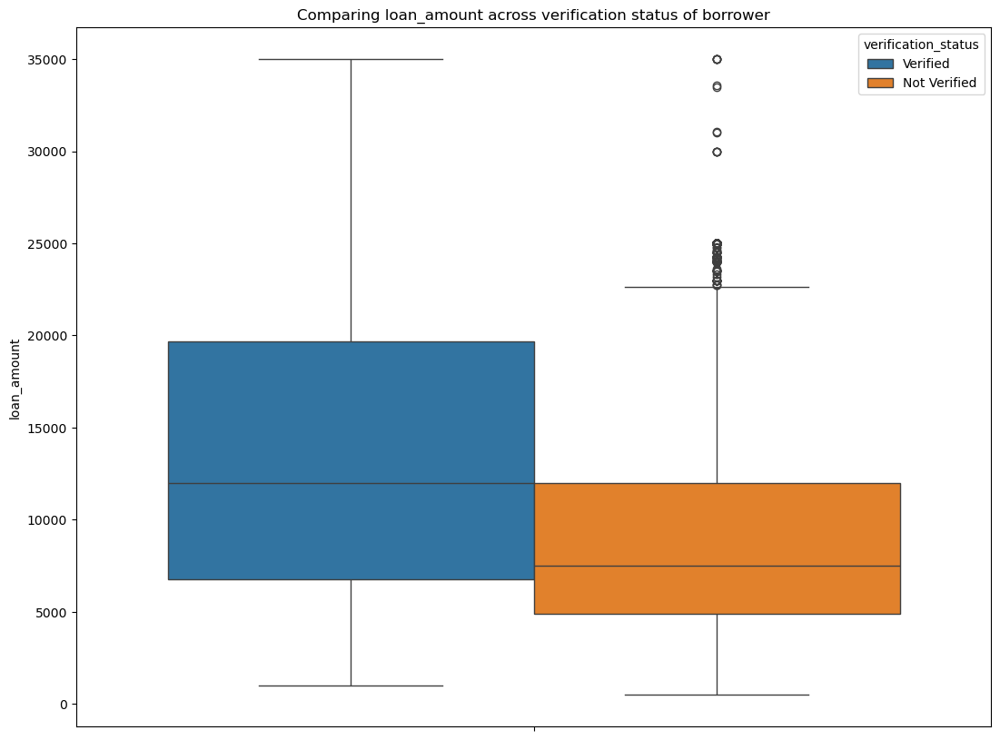

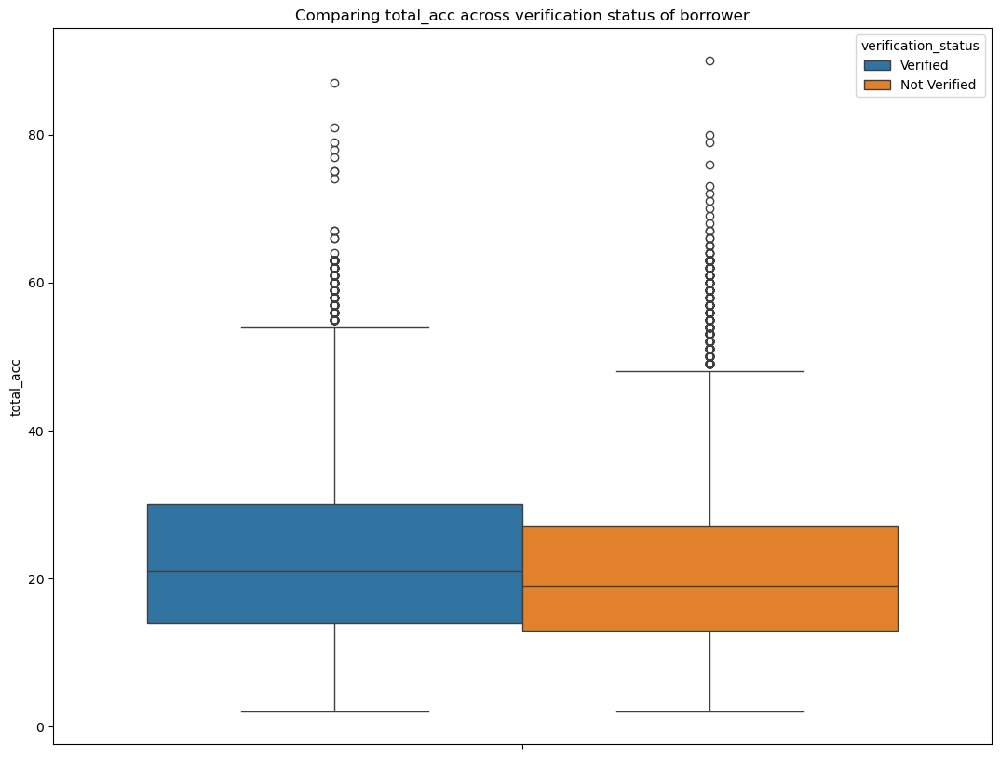

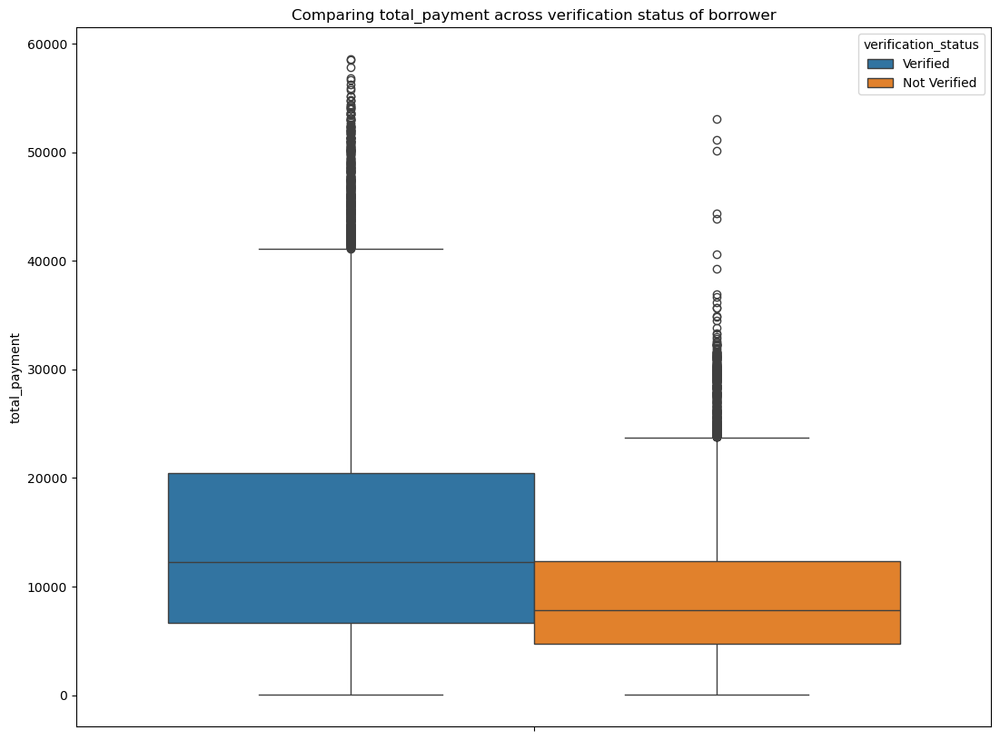

In [ ]:
for i in num:
    sns.boxplot(data=data,y=i,hue='verification_status')
    plt.title(f'Comparing {i} across verification status of borrower')
    plt.ylabel(f'{i}')
    plt.show()

**Term of Loan**

Some analysis on the term of loan has already been made across this notebook.

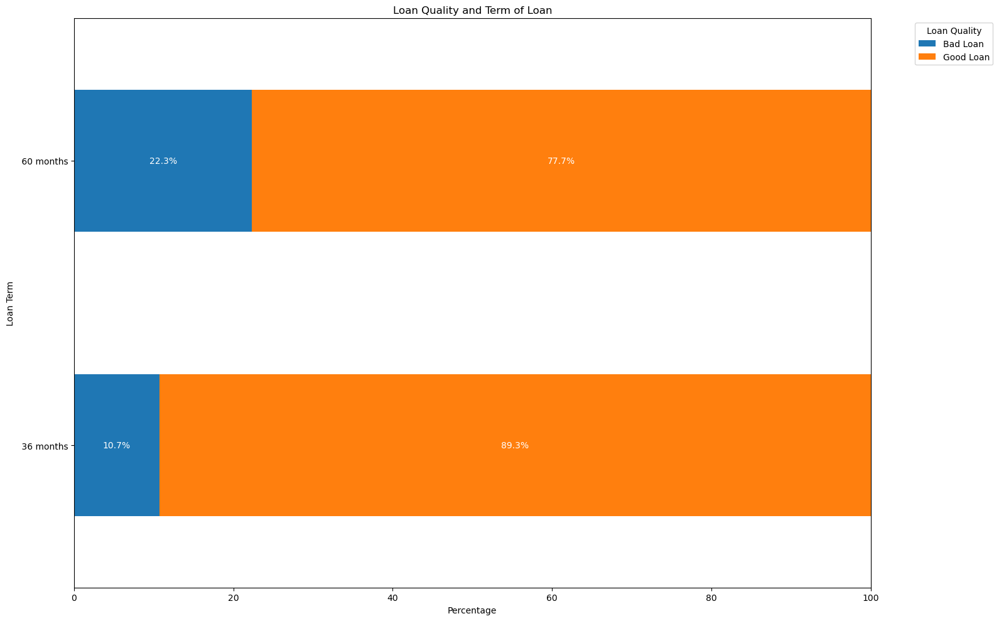

In [ ]:
df_g_t = pd.crosstab(data['term'], data[target])

# Calculate percentages per row
percent_df = df_g_t.div(df_g_t.sum(axis=1), axis=0) * 100

# To equalize bar lengths, use percentages as segment sizes and set all total bars to 100 units
normalized_counts = percent_df.copy()  # Each bar sums to 100

fig, ax = plt.subplots(figsize=(16,10))
bars = normalized_counts.plot(kind='barh', stacked=True, ax=ax)

# Add percentage labels in each bar
for container, col in zip(ax.containers, percent_df.columns):
    labels = [f"{p:.1f}%" if p > 0 else "" for p in percent_df[col]]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white')

ax.set_xlabel('Percentage')
ax.set_ylabel('Loan Term')
ax.set_title('Loan Quality and Term of Loan')
ax.set_xlim(0, 100)
ax.legend(title='Loan Quality', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


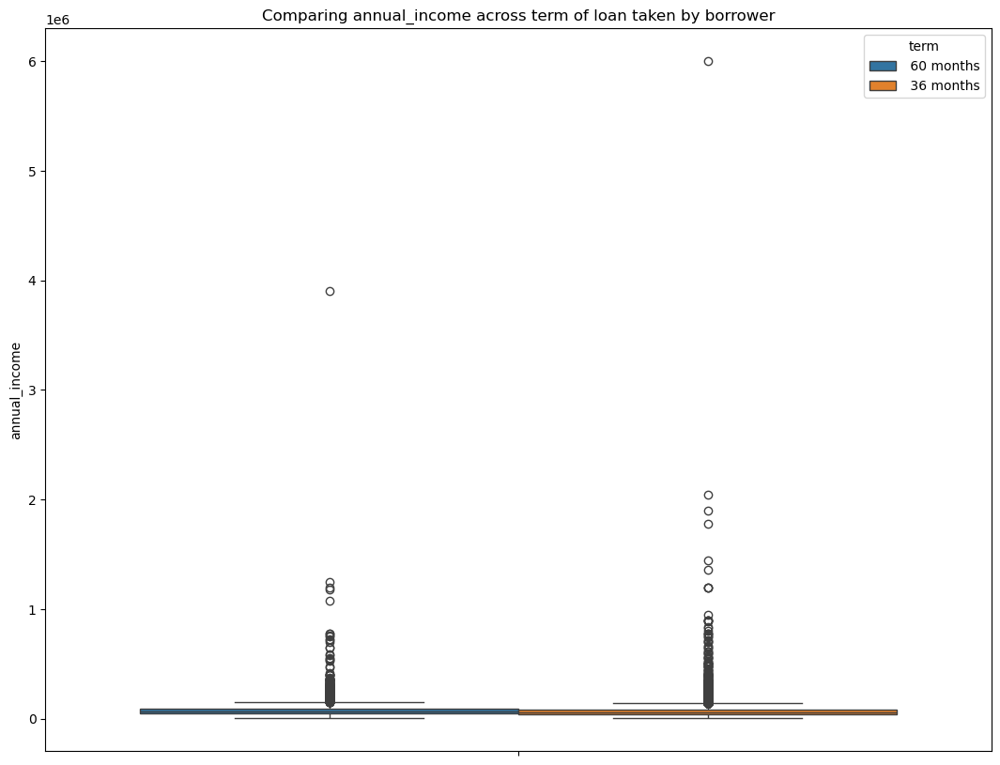

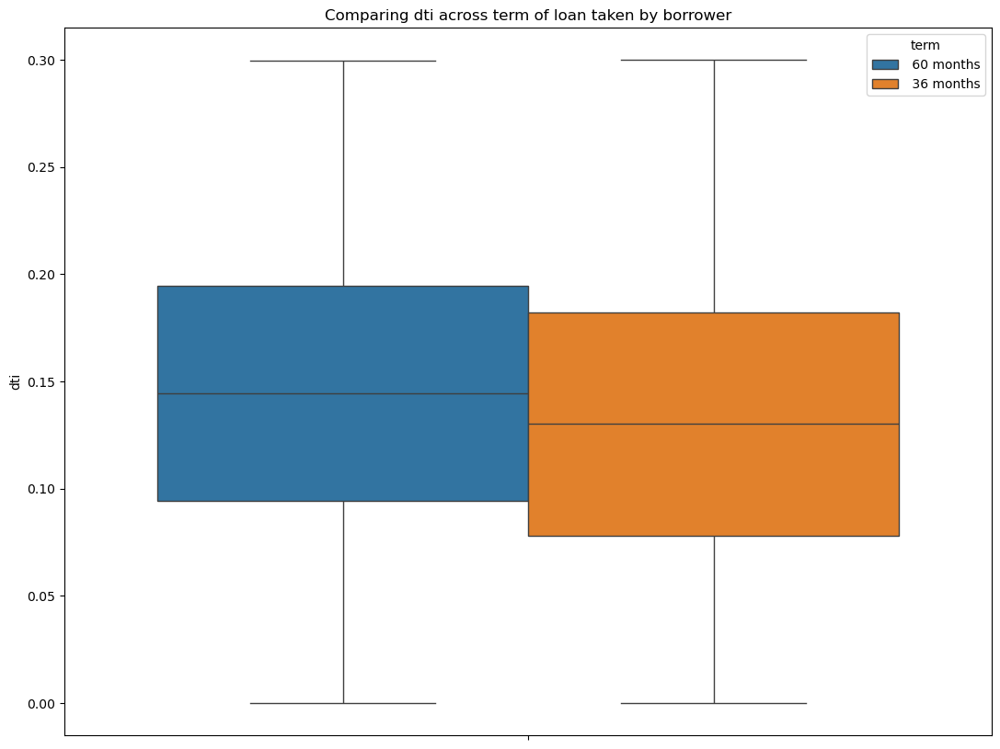

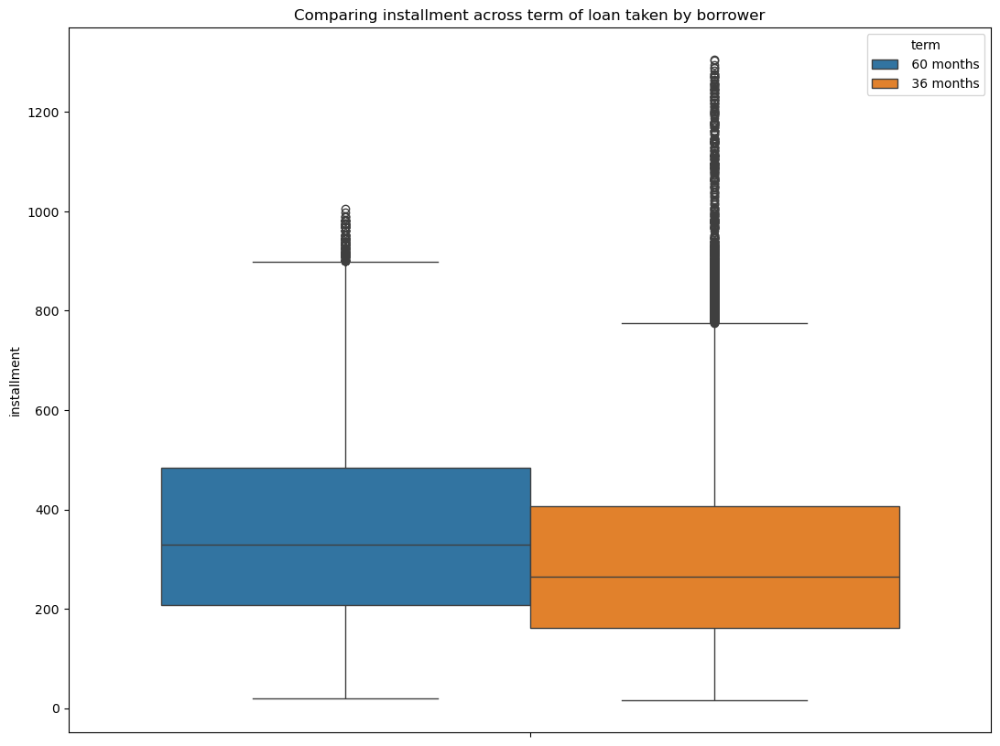

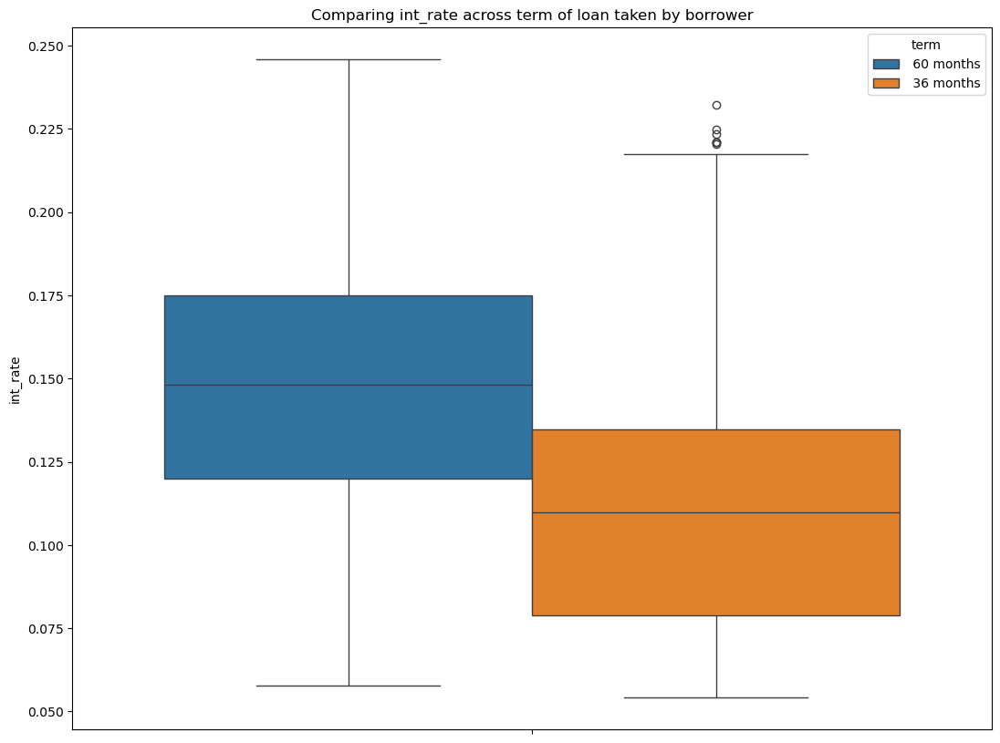

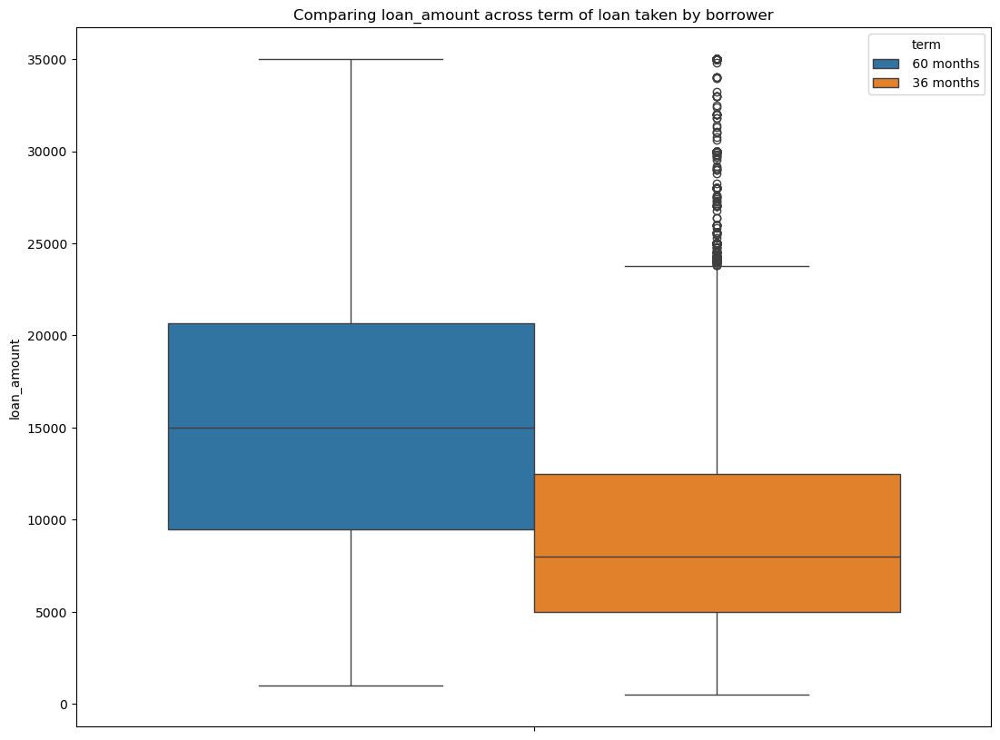

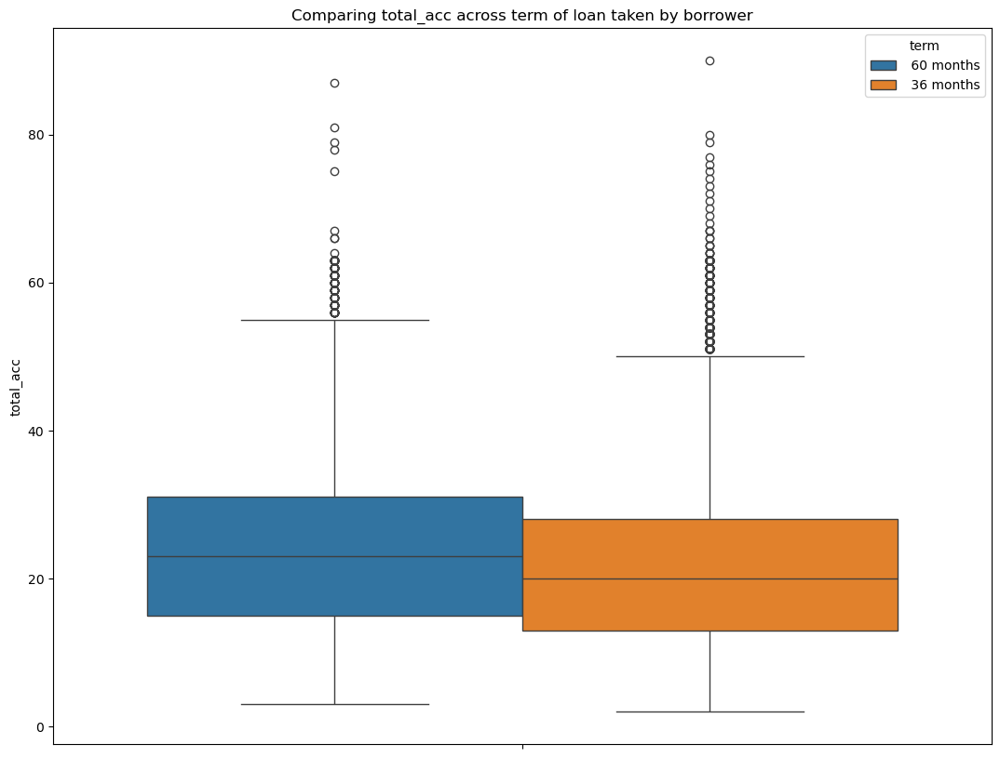

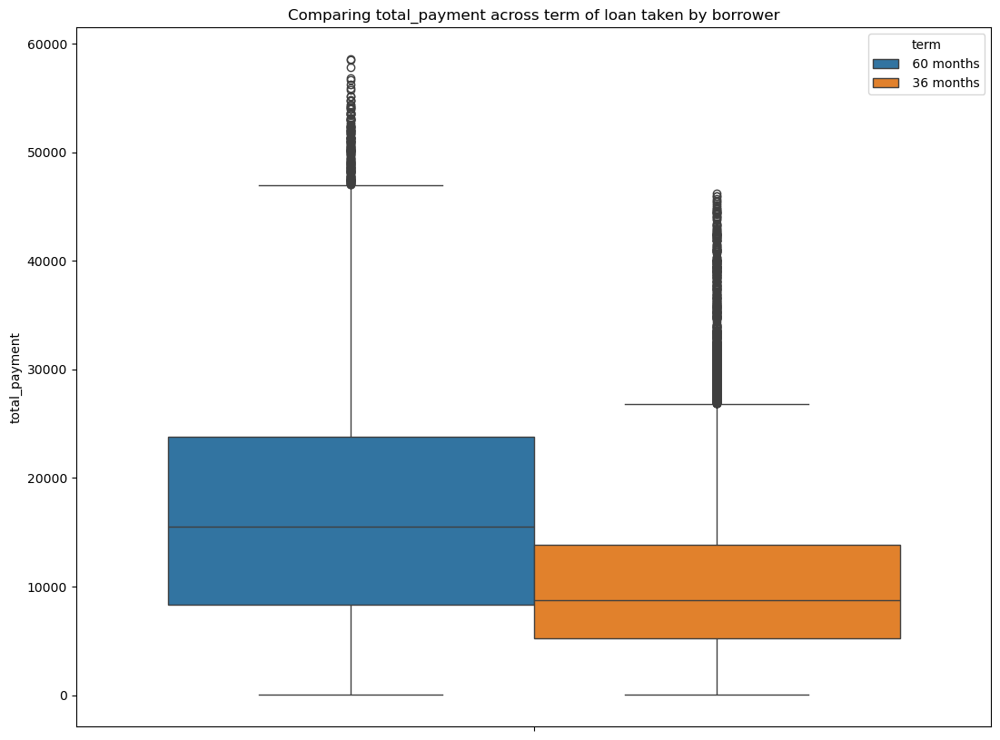

In [ ]:
for i in num:
    sns.boxplot(data=data,y=i,hue='term')
    plt.title(f'Comparing {i} across term of loan taken by borrower')
    plt.ylabel(f'{i}')
    plt.show()

### Multivariate Analysis

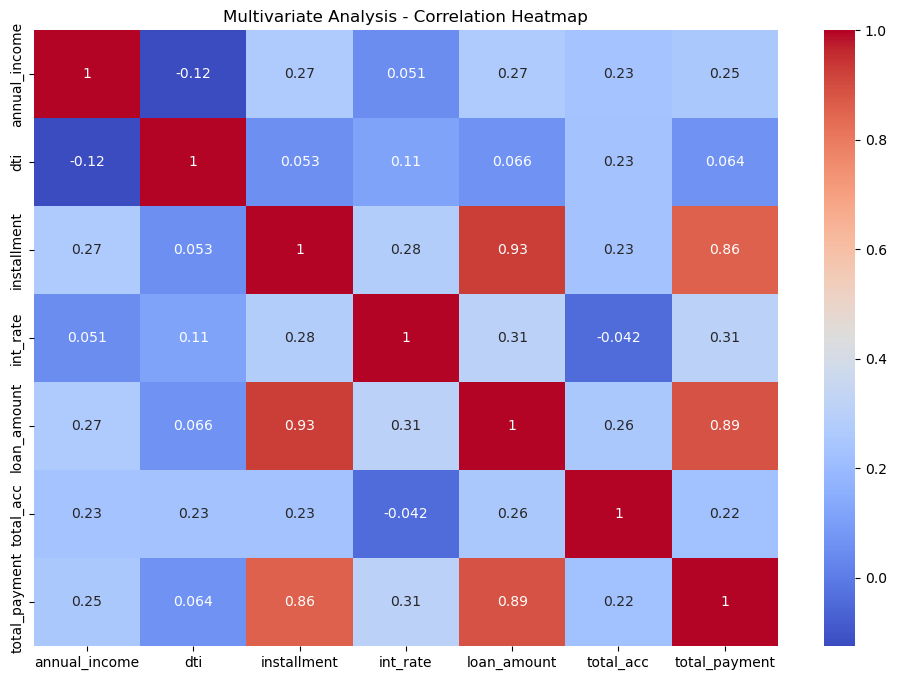

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(data[numerical].corr(), annot=True, cmap='coolwarm')
plt.title('Multivariate Analysis - Correlation Heatmap')
plt.show()

**Inference**
* There seems to be low, medium and high multicollinearity, especially amongst the independent variables or columns *total_acc and int_rate*, *total_payment and installment*, *total_payment and loan_amount*

**Note**: We can still try more multivariate plots if time permits

# 3 Data Preprocessing

## Encoding Categorical Variables

In [ ]:
cat

['address_state',
 'emp_length',
 'Grade',
 'home_ownership',
 'Purpose',
 'sub_grade',
 'term',
 'verification_status']

In [ ]:
for i in cat:
    print(i, len(data[i].unique()))

address_state 50
emp_length 11
Grade 7
home_ownership 4
Purpose 14
sub_grade 35
term 2
verification_status 2


In [ ]:
data_copy = data.copy()

In [ ]:
# Define the main grades you want to create columns for
main_grades = ['A', 'B', 'C', 'D', 'E', 'F', 'G']

# Iterate through each main grade to create the new columns
for grade_char in main_grades:
    # Create the new column name as requested (e.g., 'Grade_A')
    new_col_name = f'Grade_{grade_char}'

    # Initialize the new column with 0s
    data_copy[new_col_name] = 0

    # Create a boolean mask for rows where the 'Grade' matches the current grade_char
    mask = (data_copy['Grade'] == grade_char)

    # For the masked rows, extract the numerical part from the sub_grade
    # and assign it to the new column.
    # .str[1] gets the second character (e.g., '1' from 'A1')
    # .astype(int) converts it to an integer.
    data_copy.loc[mask, new_col_name] = data_copy.loc[mask, 'sub_grade'].str[1].astype(int)

print("\nDataFrame head with new engineered grade-specific sub-grade columns:")
data_copy.head()


DataFrame head with new engineered grade-specific sub-grade columns:


,address_state,emp_length,Grade,home_ownership,Good vs Bad Loan,Purpose,sub_grade,term,verification_status,annual_income,...,loan_amount,total_acc,total_payment,Grade_A,Grade_B,Grade_C,Grade_D,Grade_E,Grade_F,Grade_G
0,GA,< 1 year,C,RENT,Bad Loan,car,C4,60 months,Verified,30000.0,...,2500.0,4,1009.0,0,0,4,0,0,0,0
1,CA,9 years,E,RENT,Good Loan,car,E1,36 months,Verified,48000.0,...,3000.0,4,3939.0,0,0,0,0,1,0,0
2,CA,4 years,C,RENT,Bad Loan,car,C5,36 months,Not Verified,50000.0,...,12000.0,11,3522.0,0,0,5,0,0,0,0
3,TX,< 1 year,B,MORTGAGE,Good Loan,car,B2,60 months,Verified,42000.0,...,4500.0,9,4911.0,0,2,0,0,0,0,0
4,IL,10+ years,A,MORTGAGE,Good Loan,car,A1,36 months,Verified,83000.0,...,3500.0,28,3835.0,1,0,0,0,0,0,0


In [ ]:
data.shape

(38576, 16)

In [ ]:
data_copy.shape

(38576, 23)

In [ ]:
data_copy.isnull().sum()

address_state          0
emp_length             0
Grade                  0
home_ownership         0
Good vs Bad Loan       0
Purpose                0
sub_grade              0
term                   0
verification_status    0
annual_income          0
dti                    0
installment            0
int_rate               0
loan_amount            0
total_acc              0
total_payment          0
Grade_A                0
Grade_B                0
Grade_C                0
Grade_D                0
Grade_E                0
Grade_F                0
Grade_G                0
dtype: int64

In [ ]:
data_copy.drop(['Grade','sub_grade'],axis=1,inplace=True)
data_copy.shape

(38576, 21)

In [ ]:
cat.remove('Grade')
cat.remove('sub_grade')

In [ ]:
cat

['address_state',
 'emp_length',
 'home_ownership',
 'Purpose',
 'term',
 'verification_status']

In [ ]:
#One-Hot Encode and save to new DataFrame
one_hot_encoded_df = pd.get_dummies(data_copy[cat], drop_first=True,dtype='int64')

# Encoding the target column too
target_encoded = pd.get_dummies(data_copy[target], drop_first=True,dtype='int64')

# Remove the original categoric columns from the main DataFrame
data_numeric = data_copy.drop(columns=(cat + ['Good vs Bad Loan']))

# Add encoded columns
df = pd.concat([data_numeric, one_hot_encoded_df, target_encoded], axis=1)

In [ ]:
data.shape, data_copy.shape, df.shape

((38576, 16), (38576, 21), (38576, 92))

In [ ]:
df.head()

,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment,Grade_A,Grade_B,Grade_C,...,Purpose_medical,Purpose_moving,Purpose_other,Purpose_renewable_energy,Purpose_small business,Purpose_vacation,Purpose_wedding,term_ 60 months,verification_status_Verified,Good Loan
0,30000.0,0.0100,59.83,0.1527,2500.0,4,1009.0,0,0,4,...,0,0,0,0,0,0,0,1,1,0
1,48000.0,0.0535,109.43,0.1864,3000.0,4,3939.0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,50000.0,0.2088,421.65,0.1596,12000.0,11,3522.0,0,0,5,...,0,0,0,0,0,0,0,0,0,0
3,42000.0,0.0540,97.06,0.1065,4500.0,9,4911.0,0,2,0,...,0,0,0,0,0,0,0,1,1,1
4,83000.0,0.0231,106.53,0.0603,3500.0,28,3835.0,1,0,0,...,0,0,0,0,0,0,0,0,1,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38576 entries, 0 to 38575
Data columns (total 92 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   annual_income                 38576 non-null  float64
 1   dti                           38576 non-null  float64
 2   installment                   38576 non-null  float64
 3   int_rate                      38576 non-null  float64
 4   loan_amount                   38576 non-null  float64
 5   total_acc                     38576 non-null  int64  
 6   total_payment                 38576 non-null  float64
 7   Grade_A                       38576 non-null  int64  
 8   Grade_B                       38576 non-null  int64  
 9   Grade_C                       38576 non-null  int64  
 10  Grade_D                       38576 non-null  int64  
 11  Grade_E                       38576 non-null  int64  
 12  Grade_F                       38576 non-null  int64  
 13  G

## Outlier Detection

In [ ]:
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers


In [ ]:
outlier_summary = {}

for col in num:
    outliers = detect_outliers_iqr(df, col)
    outlier_summary[col] = len(outliers)

# Display outlier counts
for col, count in outlier_summary.items():
    print(f"{col}: {count} outliers")


annual_income: 1824 outliers
dti: 0 outliers
installment: 1150 outliers
int_rate: 78 outliers
loan_amount: 1208 outliers
total_acc: 692 outliers
total_payment: 1277 outliers


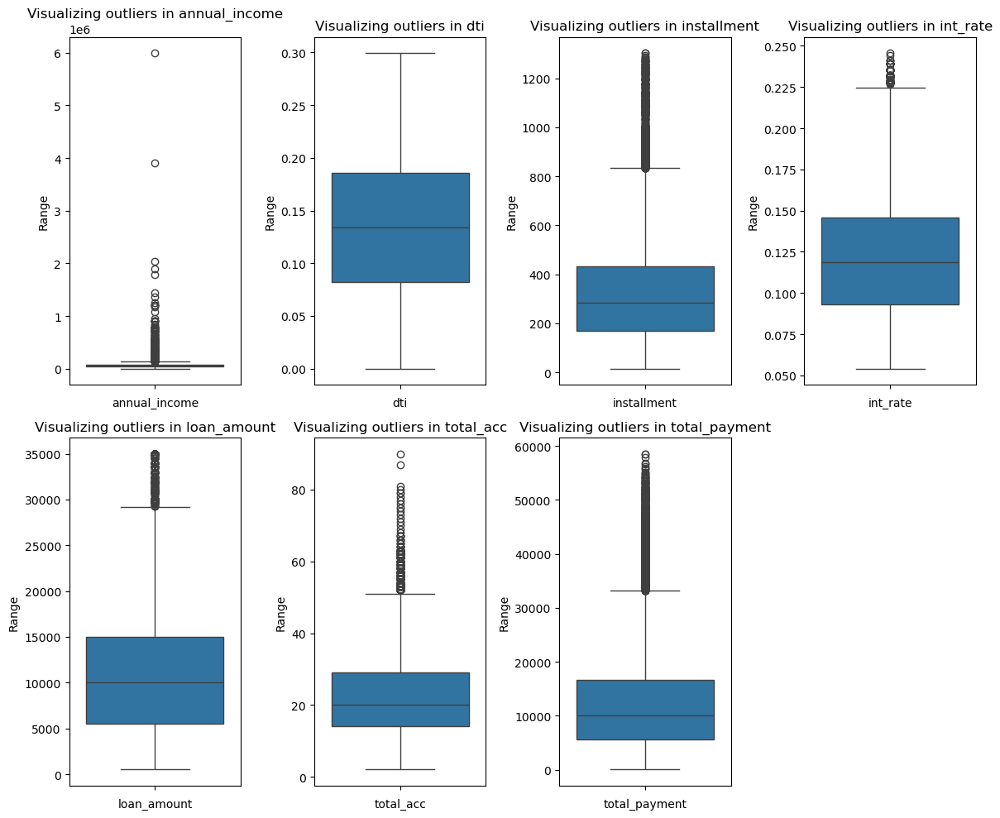

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.boxplot(df[i])
    plt.title(f'Visualizing outliers in {i}')
    plt.ylabel('Range')
    plt.xlabel(i)
    t+=1
plt.tight_layout()
plt.show()

## Outlier Treatment

Capping the outliers using IQR

In [ ]:
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

In [ ]:
#Considering only the original numerical columns for outlier treatment
q1 = data[num].quantile(0.25)
q3 = data[num].quantile(0.75)
iqr = q3 - q1
uw = q3 + 1.5*iqr
lw = q1 - 1.5*iqr

print('Upper whisker values of numerical variables')
print(uw)
print('--------------------------------------')
print('Q3 for numerical variables:')
print(q3)
print('--------------------------------------')
print('IQR for numerical variables:')
print(iqr)
print('--------------------------------------')
print('Q3 for numerical variables:')
print(q3)
print('--------------------------------------')
print('Lower whisker values of numerical variables')
print(lw)
print('--------------------------------------')

Upper whisker values of numerical variables
annual_income    145751.25000
dti                   0.34160
installment         833.43125
int_rate              0.22495
loan_amount       29250.00000
total_acc            51.50000
total_payment     33195.50000
dtype: float64
--------------------------------------
Q3 for numerical variables:
annual_income    83200.5000
dti                  0.1859
installment        434.4425
int_rate             0.1459
loan_amount      15000.0000
total_acc           29.0000
total_payment    16658.0000
Name: 0.75, dtype: float64
--------------------------------------
IQR for numerical variables:
annual_income    41700.5000
dti                  0.1038
installment        265.9925
int_rate             0.0527
loan_amount       9500.0000
total_acc           15.0000
total_payment    11025.0000
dtype: float64
--------------------------------------
Q3 for numerical variables:
annual_income    83200.5000
dti                  0.1859
installment        434.4425
int_rate   

In [ ]:
overall_outliers = df[((df[num] < lw) | (df[num] > uw)).any(axis=1)]

print('Number of outlier rows:',overall_outliers.shape[0])
print('Percentage of all outliers overall in dataset:',overall_outliers.shape[0] * 100 / len(df))

Number of outlier rows: 4104
Percentage of all outliers overall in dataset: 10.638739112401494


In [ ]:
def cap_outliers_iqr(df, num_cols):
    df_capped = df.copy()  # To avoid changing original data
    for col in num_cols:
        q1 = df_capped[col].quantile(0.25)
        q3 = df_capped[col].quantile(0.75)
        iqr = q3 - q1
        uw = q3 + 1.5 * iqr
        lw = q1 - 1.5 * iqr
        # Cap values outside the whiskers
        df_capped[col] = df_capped[col].clip(lower=lw, upper=uw)
    return df_capped

In [ ]:
df_outliers_capped = cap_outliers_iqr(df, num)

In [ ]:
df_outliers_capped

,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment,Grade_A,Grade_B,Grade_C,...,Purpose_medical,Purpose_moving,Purpose_other,Purpose_renewable_energy,Purpose_small business,Purpose_vacation,Purpose_wedding,term_ 60 months,verification_status_Verified,Good Loan
0,30000.00,0.0100,59.83,0.1527,2500.0,4.0,1009.0,0,0,4,...,0,0,0,0,0,0,0,1,1,0
1,48000.00,0.0535,109.43,0.1864,3000.0,4.0,3939.0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,50000.00,0.2088,421.65,0.1596,12000.0,11.0,3522.0,0,0,5,...,0,0,0,0,0,0,0,0,0,0
3,42000.00,0.0540,97.06,0.1065,4500.0,9.0,4911.0,0,2,0,...,0,0,0,0,0,0,0,1,1,1
4,83000.00,0.0231,106.53,0.0603,3500.0,28.0,3835.0,1,0,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38571,100000.00,0.1986,551.64,0.1299,24250.0,33.0,31946.0,0,0,1,...,0,0,0,0,0,0,1,1,1,1
38572,50000.00,0.0458,579.72,0.1349,25200.0,18.0,31870.0,0,0,1,...,0,0,0,0,0,0,1,1,1,1
38573,65000.00,0.1734,627.93,0.1749,25000.0,20.0,33195.5,0,0,0,...,0,0,0,0,0,0,1,1,1,1
38574,145751.25,0.0009,612.72,0.1825,24000.0,9.0,33195.5,0,0,0,...,0,0,0,0,0,0,1,1,1,1


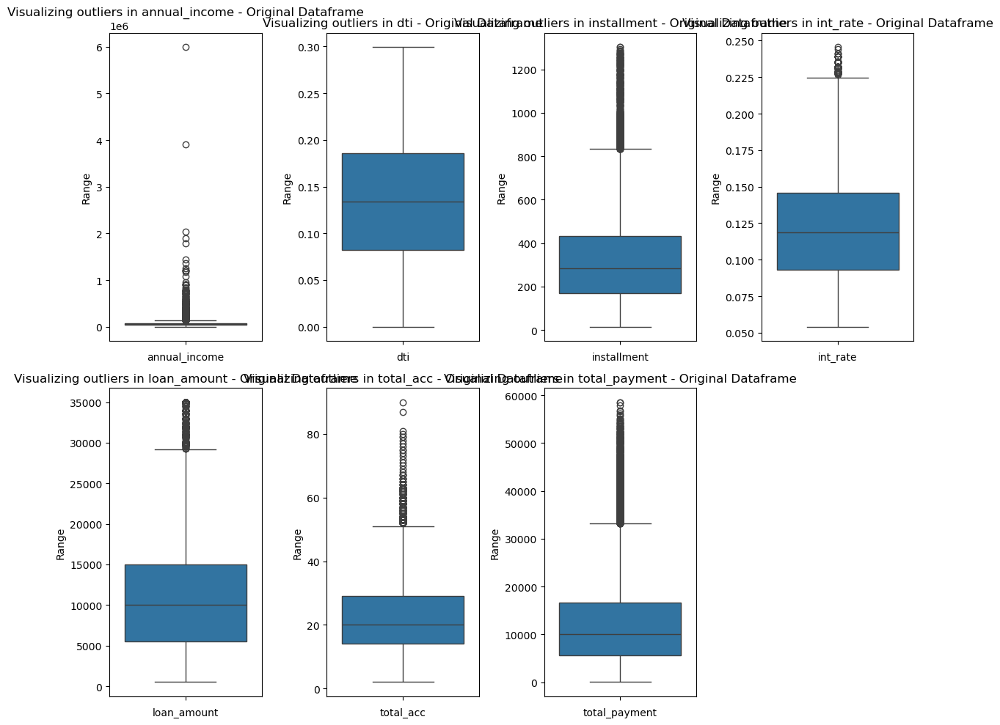

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.boxplot(df[i])
    plt.title(f'Visualizing outliers in {i} - Original Dataframe')
    plt.ylabel('Range')
    plt.xlabel(i)
    t+=1
plt.tight_layout()
plt.show()

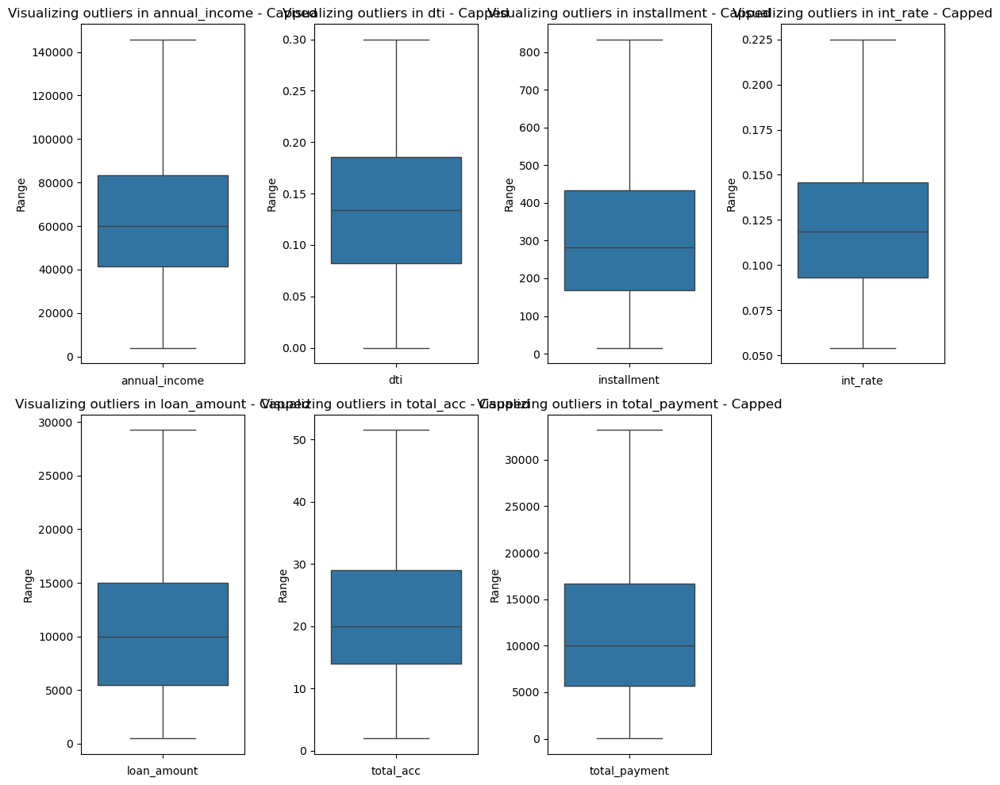

In [ ]:
t = 1
plt.figure(figsize=(12,10))
for i in num:
    plt.subplot(2,4,t)
    sns.boxplot(df_outliers_capped[i])
    plt.title(f'Visualizing outliers in {i} - Capped')
    plt.ylabel('Range')
    plt.xlabel(i)
    t+=1
plt.tight_layout()
plt.show()

In [ ]:
df_outliers_capped.shape

(38576, 92)

In [ ]:
data.shape, data_copy.shape, df.shape, df_outliers_capped.shape,

((38576, 16), (38576, 21), (38576, 92), (38576, 92))

## Scaling

In [ ]:
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

In [ ]:
df_outliers_capped

,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment,Grade_A,Grade_B,Grade_C,...,Purpose_medical,Purpose_moving,Purpose_other,Purpose_renewable_energy,Purpose_small business,Purpose_vacation,Purpose_wedding,term_ 60 months,verification_status_Verified,Good Loan
0,30000.00,0.0100,59.83,0.1527,2500.0,4.0,1009.0,0,0,4,...,0,0,0,0,0,0,0,1,1,0
1,48000.00,0.0535,109.43,0.1864,3000.0,4.0,3939.0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,50000.00,0.2088,421.65,0.1596,12000.0,11.0,3522.0,0,0,5,...,0,0,0,0,0,0,0,0,0,0
3,42000.00,0.0540,97.06,0.1065,4500.0,9.0,4911.0,0,2,0,...,0,0,0,0,0,0,0,1,1,1
4,83000.00,0.0231,106.53,0.0603,3500.0,28.0,3835.0,1,0,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38571,100000.00,0.1986,551.64,0.1299,24250.0,33.0,31946.0,0,0,1,...,0,0,0,0,0,0,1,1,1,1
38572,50000.00,0.0458,579.72,0.1349,25200.0,18.0,31870.0,0,0,1,...,0,0,0,0,0,0,1,1,1,1
38573,65000.00,0.1734,627.93,0.1749,25000.0,20.0,33195.5,0,0,0,...,0,0,0,0,0,0,1,1,1,1
38574,145751.25,0.0009,612.72,0.1825,24000.0,9.0,33195.5,0,0,0,...,0,0,0,0,0,0,1,1,1,1


This is the final dataframe we will be considering for scaling the numeric variables and passing to the model.

In [ ]:
from sklearn.preprocessing import StandardScaler
s = StandardScaler()

In [ ]:
num

['annual_income',
 'dti',
 'installment',
 'int_rate',
 'loan_amount',
 'total_acc',
 'total_payment']

In [ ]:
for i in num:
    print(f'Mean of column {i}: {df_outliers_capped[i].mean()}. Standard deviation of column {i}: {df_outliers_capped[i].std()}')

Mean of column annual_income: 65884.83320302778. Standard deviation of column annual_income: 32725.082160111448
Mean of column dti: 0.13327433119037743. Standard deviation of column dti: 0.06666155326867897
Mean of column installment: 323.7190931537744. Standard deviation of column installment: 199.54696567898756
Mean of column int_rate: 0.12047301171712982. Standard deviation of column int_rate: 0.03711887663168132
Mean of column loan_amount: 11177.02846329324. Standard deviation of column loan_amount: 7124.0583987838345
Mean of column total_acc: 22.024082330982996. Standard deviation of column total_acc: 11.057780992586743
Mean of column total_payment: 12033.783764516798. Standard deviation of column total_payment: 8348.351969231066


In [ ]:
num_scaled = s.fit_transform(df_outliers_capped[num])
num_scaled = pd.DataFrame(data=num_scaled, columns=df_outliers_capped[num].columns)
cat_cols = df_outliers_capped.drop(num,axis=1)
num_scaled

,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment
0,-1.096569,-1.849281,-1.322458,0.868221,-1.218005,-1.630012,-1.320611
1,-0.546525,-1.196722,-1.073892,1.776127,-1.147820,-1.630012,-0.969639
2,-0.485409,1.132987,0.490773,1.054113,0.115522,-0.996965,-1.019590
3,-0.729873,-1.189222,-1.135883,-0.376444,-0.937263,-1.177836,-0.853207
4,0.523005,-1.652763,-1.088425,-1.621110,-1.077634,0.540433,-0.982097
...,...,...,...,...,...,...,...
38571,1.042491,0.979973,1.142207,0.253971,1.835069,0.992610,2.385198
38572,-0.485409,-1.312233,1.282927,0.388675,1.968422,-0.363919,2.376095
38573,-0.027039,0.601939,1.524528,1.466308,1.940348,-0.183048,2.534870
38574,2.440558,-1.985793,1.448304,1.671058,1.799977,-1.177836,2.534870


In [ ]:
for i in num:
    print(f'Mean of column {i}: {num_scaled[i].mean()}. Standard deviation of column {i}: {num_scaled[i].std()}')

Mean of column annual_income: 2.320831208673077e-16. Standard deviation of column annual_income: 1.0000129616788012
Mean of column dti: 5.3047570483956046e-17. Standard deviation of column dti: 1.0000129616788032
Mean of column installment: -1.5030144970454214e-16. Standard deviation of column installment: 1.000012961678799
Mean of column int_rate: 4.715339598573871e-17. Standard deviation of column int_rate: 1.000012961678835
Mean of column loan_amount: -4.1259221487521374e-17. Standard deviation of column loan_amount: 1.0000129616787787
Mean of column total_acc: -8.251844297504275e-17. Standard deviation of column total_acc: 1.0000129616787665
Mean of column total_payment: -2.6523785241978023e-17. Standard deviation of column total_payment: 1.0000129616787778


In [ ]:
final_df = pd.concat([num_scaled,cat_cols],axis=1,ignore_index=False)

In [ ]:
final_df.shape

(38576, 92)

In [ ]:
final_df

,annual_income,dti,installment,int_rate,loan_amount,total_acc,total_payment,Grade_A,Grade_B,Grade_C,...,Purpose_medical,Purpose_moving,Purpose_other,Purpose_renewable_energy,Purpose_small business,Purpose_vacation,Purpose_wedding,term_ 60 months,verification_status_Verified,Good Loan
0,-1.096569,-1.849281,-1.322458,0.868221,-1.218005,-1.630012,-1.320611,0,0,4,...,0,0,0,0,0,0,0,1,1,0
1,-0.546525,-1.196722,-1.073892,1.776127,-1.147820,-1.630012,-0.969639,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,-0.485409,1.132987,0.490773,1.054113,0.115522,-0.996965,-1.019590,0,0,5,...,0,0,0,0,0,0,0,0,0,0
3,-0.729873,-1.189222,-1.135883,-0.376444,-0.937263,-1.177836,-0.853207,0,2,0,...,0,0,0,0,0,0,0,1,1,1
4,0.523005,-1.652763,-1.088425,-1.621110,-1.077634,0.540433,-0.982097,1,0,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38571,1.042491,0.979973,1.142207,0.253971,1.835069,0.992610,2.385198,0,0,1,...,0,0,0,0,0,0,1,1,1,1
38572,-0.485409,-1.312233,1.282927,0.388675,1.968422,-0.363919,2.376095,0,0,1,...,0,0,0,0,0,0,1,1,1,1
38573,-0.027039,0.601939,1.524528,1.466308,1.940348,-0.183048,2.534870,0,0,0,...,0,0,0,0,0,0,1,1,1,1
38574,2.440558,-1.985793,1.448304,1.671058,1.799977,-1.177836,2.534870,0,0,0,...,0,0,0,0,0,0,1,1,1,1


In [ ]:
final_df.columns

Index(['annual_income', 'dti', 'installment', 'int_rate', 'loan_amount',
       'total_acc', 'total_payment', 'Grade_A', 'Grade_B', 'Grade_C',
       'Grade_D', 'Grade_E', 'Grade_F', 'Grade_G', 'address_state_AL',
       'address_state_AR', 'address_state_AZ', 'address_state_CA',
       'address_state_CO', 'address_state_CT', 'address_state_DC',
       'address_state_DE', 'address_state_FL', 'address_state_GA',
       'address_state_HI', 'address_state_IA', 'address_state_ID',
       'address_state_IL', 'address_state_IN', 'address_state_KS',
       'address_state_KY', 'address_state_LA', 'address_state_MA',
       'address_state_MD', 'address_state_ME', 'address_state_MI',
       'address_state_MN', 'address_state_MO', 'address_state_MS',
       'address_state_MT', 'address_state_NC', 'address_state_NE',
       'address_state_NH', 'address_state_NJ', 'address_state_NM',
       'address_state_NV', 'address_state_NY', 'address_state_OH',
       'address_state_OK', 'address_state_OR', 'a

In [ ]:
final_df.isnull().sum()

annual_income                   0
dti                             0
installment                     0
int_rate                        0
loan_amount                     0
                               ..
Purpose_vacation                0
Purpose_wedding                 0
term_ 60 months                 0
verification_status_Verified    0
Good Loan                       0
Length: 92, dtype: int64

# 4 Model Building

In [ ]:
final_df.columns

Index(['annual_income', 'dti', 'installment', 'int_rate', 'loan_amount',
       'total_acc', 'total_payment', 'Grade_A', 'Grade_B', 'Grade_C',
       'Grade_D', 'Grade_E', 'Grade_F', 'Grade_G', 'address_state_AL',
       'address_state_AR', 'address_state_AZ', 'address_state_CA',
       'address_state_CO', 'address_state_CT', 'address_state_DC',
       'address_state_DE', 'address_state_FL', 'address_state_GA',
       'address_state_HI', 'address_state_IA', 'address_state_ID',
       'address_state_IL', 'address_state_IN', 'address_state_KS',
       'address_state_KY', 'address_state_LA', 'address_state_MA',
       'address_state_MD', 'address_state_ME', 'address_state_MI',
       'address_state_MN', 'address_state_MO', 'address_state_MS',
       'address_state_MT', 'address_state_NC', 'address_state_NE',
       'address_state_NH', 'address_state_NJ', 'address_state_NM',
       'address_state_NV', 'address_state_NY', 'address_state_OH',
       'address_state_OK', 'address_state_OR', 'a

Our target column is 'Good Loan'

In [ ]:
target = 'Good Loan'

In [ ]:
final_df[target].value_counts()

Good Loan
1    33243
0     5333
Name: count, dtype: int64

In [ ]:
data['Good vs Bad Loan'].value_counts()

Good vs Bad Loan
Good Loan    33243
Bad Loan      5333
Name: count, dtype: int64

This is for the understanding that in the final_df, in the 'Good Loan' column, 1 depicts a Good Loan and 0 depicts a Bad Loan.

**Note**: Since we will most likely be using XGBClassifier, it's best to remove spaces and special characters from the feature names in X now itself, since XGBClassifier doesn't accept feature names with those characters.

In [ ]:
# Fixing column name spaces in final_df
final_df.columns = final_df.columns.str.replace('<', '_lt_', regex=False)  # Replace '<' with '_lt_' or any safe string # Replace '<' with '_lt_' or any safe string
final_df.columns = final_df.columns.str.replace(' ', '_', regex=False)

In [ ]:
final_df.columns

Index(['annual_income', 'dti', 'installment', 'int_rate', 'loan_amount',
       'total_acc', 'total_payment', 'Grade_A', 'Grade_B', 'Grade_C',
       'Grade_D', 'Grade_E', 'Grade_F', 'Grade_G', 'address_state_AL',
       'address_state_AR', 'address_state_AZ', 'address_state_CA',
       'address_state_CO', 'address_state_CT', 'address_state_DC',
       'address_state_DE', 'address_state_FL', 'address_state_GA',
       'address_state_HI', 'address_state_IA', 'address_state_ID',
       'address_state_IL', 'address_state_IN', 'address_state_KS',
       'address_state_KY', 'address_state_LA', 'address_state_MA',
       'address_state_MD', 'address_state_ME', 'address_state_MI',
       'address_state_MN', 'address_state_MO', 'address_state_MS',
       'address_state_MT', 'address_state_NC', 'address_state_NE',
       'address_state_NH', 'address_state_NJ', 'address_state_NM',
       'address_state_NV', 'address_state_NY', 'address_state_OH',
       'address_state_OK', 'address_state_OR', 'a

In [ ]:
target = 'Good_Loan'

In [ ]:
from sklearn.model_selection import train_test_split

X = final_df.drop(target,axis=1)
y = final_df['Good_Loan']

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(30860, 91)
(7716, 91)
(30860,)
(7716,)


## Models Built

Below is our approach towards model building, as guided by our mentor:
* **Linear Models**
* * Logistic Regression (Base Model)
  * Logistic Regression (A different Base Model with columns selected by Recursive Feature Elimination)
* **Non-linear models**
* * Decision Tree (based on all features, and rfe features)
  * Decision Tree (based on feature importances)
  * Random Forest (based on all features, and rfe features)
  * Random Forest (based on feature importances)
  * Support Vector Machine (based on all features, and rfe features)
  * Boosting Algorithms (based on all features, and rfe features)

**Accuracy metrics**

Given this is a binary classification task, and given the different models we are building, we look at the following accuracy metrics:
* Accuracy (accuracy_score)
* Confusion matrix
* Classification report
* ROC and AUC score
* F1 score
* Precision and Recall for the NEGATIVE class - Bad Loan Class (since our focus is on the 'Bad Loan')

## User-defined functions used

### A function to visualize confusion matrices for the models built

In [ ]:
def plot_confusion_matrix(y_true, y_pred, labels=['Bad Loan', 'Good Loan'], title='Confusion Matrix'):
    """
    Displays an annotated confusion matrix with correct label legend for [TN], [FP], [FN], [TP].

    Parameters:
    - y_true: list or array of true labels
    - y_pred: list or array of predicted labels
    - labels: list of class labels (displayed on axes)
    - title: title for the plot
    """
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 6))

    # Capture the axes object
    ax = sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Greens",
        xticklabels=labels,
        yticklabels=labels,
        cbar=False,
        linewidths=2,
        annot_kws={"size": 22, "weight": 'bold'},
        square=True
    )

    plt.title(title, fontsize=18, fontweight='bold')
    plt.xlabel('Predicted Label', fontsize=15)
    plt.ylabel('Actual Label', fontsize=15)

    # Annotate TN/FP/FN/TP inside or just beneath each cell
    cell_labels = {
        (0, 0): "(TN)", (0, 1): "(FP)",
        (1, 0): "(FN)", (1, 1): "(TP)"
    }
    for (i, j), txt in cell_labels.items():
        ax.text(j + 0.5, i + 0.7, txt,  # adjust vertical position
                fontsize=13, color='black', ha='center', va='bottom', alpha=0.8)

    plt.tight_layout()
    plt.show()

### A function to list the different models built with their accuracy metrics

In [ ]:
score_card = pd.DataFrame(columns=[
    'Model Name',
    'Number of features',
    'Train Accuracy Score',
    'Test Accuracy Score',
    'ROC-AUC Score',
    'f1-weighted',
    'Precision (Bad loan)',
    'Recall (Bad loan)'
])

def update_scorecard(modelname, model, xtrain, xtest, ytrain, ytest):
    y_pred_train = model.predict(xtrain)
    y_pred_test = model.predict(xtest)
    global score_card

    train_accuracy = accuracy_score(ytrain, y_pred_train)
    test_accuracy = accuracy_score(ytest, y_pred_test)

    y_prob = model.predict_proba(xtest)[:, 1]
    auc_scores = roc_auc_score(ytest, y_prob)

    test_f1 = f1_score(ytest, y_pred_test, average='weighted')

    # Calculate precision and recall for both classes
    precision = precision_score(ytest, y_pred_test, average=None)
    recall = recall_score(ytest, y_pred_test, average=None)

    # Extract scores for 'Bad loan' (class 0)
    precision_bad = precision[0]
    recall_bad = recall[0]

    new_row = pd.DataFrame({
        'Model Name': [modelname],
        'Number of features': [xtrain.shape[1]],
        'Train Accuracy Score': [train_accuracy],
        'Test Accuracy Score': [test_accuracy],
        'ROC-AUC Score': [auc_scores],
        'f1-weighted': [test_f1],
        'Precision (Bad loan)': [precision_bad],
        'Recall (Bad loan)': [recall_bad]
    })

    score_card = pd.concat([score_card, new_row], ignore_index=True)
    return score_card

## Base Model - Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
base_model = LogisticRegression(random_state=42)
base_model.fit(xtrain, ytrain)
ypred_base = base_model.predict(xtest)

In [ ]:
print('Training accuracy:',base_model.score(xtrain,ytrain))
print('Test accuracy:',base_model.score(xtest,ytest))
print('Model accuracy:',accuracy_score(ytest,ypred_base))

Training accuracy: 0.9579714841218405
Test accuracy: 0.9556765163297045
Model accuracy: 0.9556765163297045


In [ ]:
print(confusion_matrix(ytest,ypred_base))

[[ 782  282]
 [  60 6592]]


Plotting the confusion matrix using the plot_confusion_matrix function:

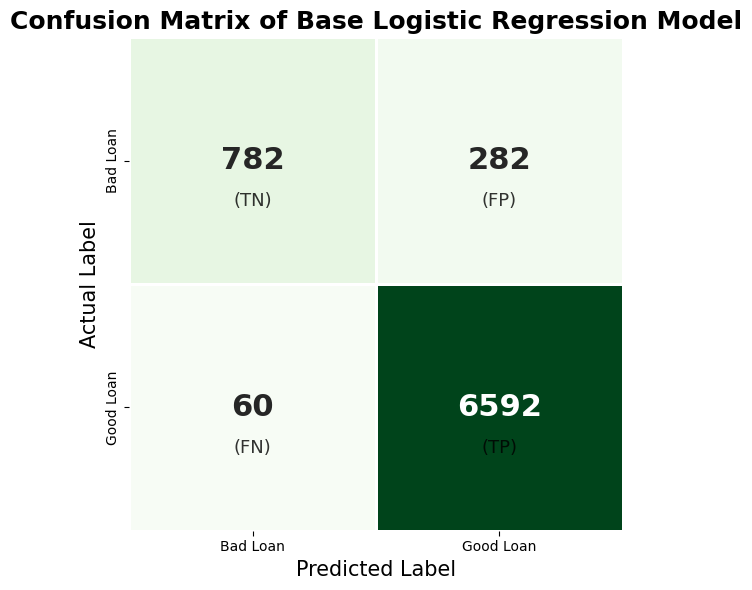

In [ ]:
plot_confusion_matrix(ytest, ypred_base,title='Confusion Matrix of Base Logistic Regression Model')

In [ ]:
print(classification_report(ytest, ypred_base))

              precision    recall  f1-score   support

           0       0.93      0.73      0.82      1064
           1       0.96      0.99      0.97      6652

    accuracy                           0.96      7716
   macro avg       0.94      0.86      0.90      7716
weighted avg       0.95      0.96      0.95      7716



ROC-AUC Score: 0.9610065546457847


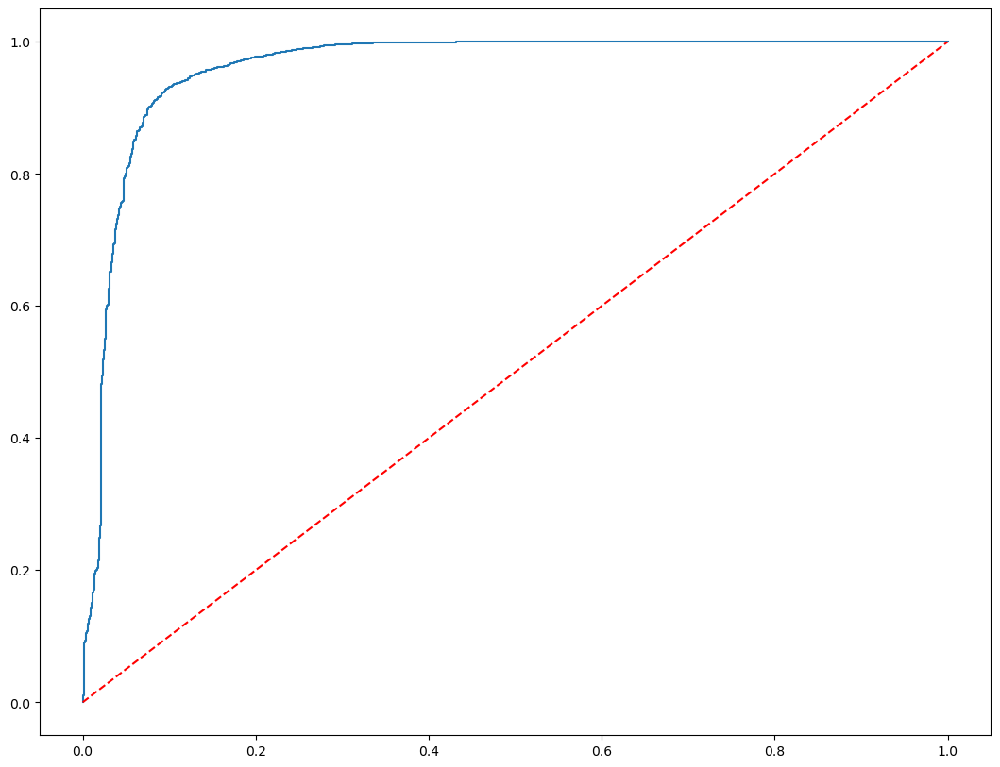

In [ ]:
ypred_base_prob = base_model.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_base_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_base_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

Using update_scorecard to store these results

In [ ]:
update_scorecard('Logistic Regression (Base model)',base_model,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962


We can see that though the training accuracies, test accuracies, and other scores are good, the recall for the 'Bad Loan' class is comparitively low. This means that **out of all the actual cases that a loan issued is Bad, the model only accurately predicted 73 percent of those cases**.

We can look at other models to see how they perform

### Recursive Feature Elimination (RFE)

In [ ]:
from sklearn.feature_selection import RFE

In [ ]:
rfe_model = RFE(estimator=base_model)
rfe_model.fit(xtrain,ytrain)
rfe_model.ranking_

array([ 1,  3,  1,  1,  1,  4,  1, 33, 40, 44, 30, 29, 32, 42, 27, 13, 10,
       46, 45,  9,  1, 14,  1, 15, 20, 36, 38, 35,  1,  1, 17,  1,  1,  1,
       34,  1, 18,  1, 41, 25,  6,  1,  1,  1,  1,  1, 19,  1, 12,  8,  1,
        1,  5,  1,  1, 31,  1,  1,  1, 16,  7,  1,  1,  1,  1, 23,  1, 24,
       43,  1, 21, 22, 28, 37,  1, 26,  1,  1,  1, 39,  1,  1, 11,  1,  2,
        1,  1,  1,  1,  1, 47])

In [ ]:
feat_index = pd.DataFrame()
feat_index['Rank'] = rfe_model.ranking_
feat_index['Features'] = xtrain.columns
feat_index[feat_index['Rank']==1].head()

,Rank,Features
0,1,annual_income
2,1,installment
3,1,int_rate
4,1,loan_amount
6,1,total_payment


In [ ]:
feat_index[feat_index['Rank']==1].shape

(45, 2)

RFE has chosen 45 columns as important from the original 91

In [ ]:
rfe_data = final_df[feat_index[feat_index['Rank']==1].Features]

In [ ]:
rfe_data.shape

(38576, 45)

In [ ]:
target

'Good_Loan'

In [ ]:
rfe_data[target] = final_df[target]

In [ ]:
target

'Good_Loan'

In [ ]:
X_r = rfe_data.drop(target,axis=1)
y_r = rfe_data[target]

xtrain_r, xtest_r, ytrain_r, ytest_r = train_test_split(X_r, y_r, test_size=0.2, random_state=42)

In [ ]:
X_r.columns

Index(['annual_income', 'installment', 'int_rate', 'loan_amount',
       'total_payment', 'address_state_DC', 'address_state_FL',
       'address_state_IN', 'address_state_KS', 'address_state_LA',
       'address_state_MA', 'address_state_MD', 'address_state_MI',
       'address_state_MO', 'address_state_NE', 'address_state_NH',
       'address_state_NJ', 'address_state_NM', 'address_state_NV',
       'address_state_OH', 'address_state_PA', 'address_state_RI',
       'address_state_SD', 'address_state_TN', 'address_state_UT',
       'address_state_VA', 'address_state_VT', 'address_state_WV',
       'address_state_WY', 'emp_length_10+_years', 'emp_length_2_years',
       'emp_length_4_years', 'emp_length_7_years', 'home_ownership_OWN',
       'Purpose_car', 'Purpose_credit_card', 'Purpose_educational',
       'Purpose_house', 'Purpose_major_purchase', 'Purpose_moving',
       'Purpose_renewable_energy', 'Purpose_small_business',
       'Purpose_vacation', 'Purpose_wedding', 'term__60_mo

In [ ]:
print(xtrain_r.shape)
print(ytrain_r.shape)
print(xtest_r.shape)
print(ytest_r.shape)

(30860, 45)
(30860,)
(7716, 45)
(7716,)


### Base Logistic Model with the columns determined using RFE

In [ ]:
rfe_model = LogisticRegression(random_state=42)
rfe_model.fit(xtrain_r, ytrain_r)
ypred_base_r = rfe_model.predict(xtest_r)

In [ ]:
print('Training accuracy:',rfe_model.score(xtrain_r,ytrain_r))
print('Test accuracy:',rfe_model.score(xtest_r,ytest_r))
print('Model accuracy:',accuracy_score(ytest_r,ypred_base_r))

Training accuracy: 0.9573882047958522
Test accuracy: 0.9559357179885951
Model accuracy: 0.9559357179885951


These accuracies are slightly lesser than the original base model's.

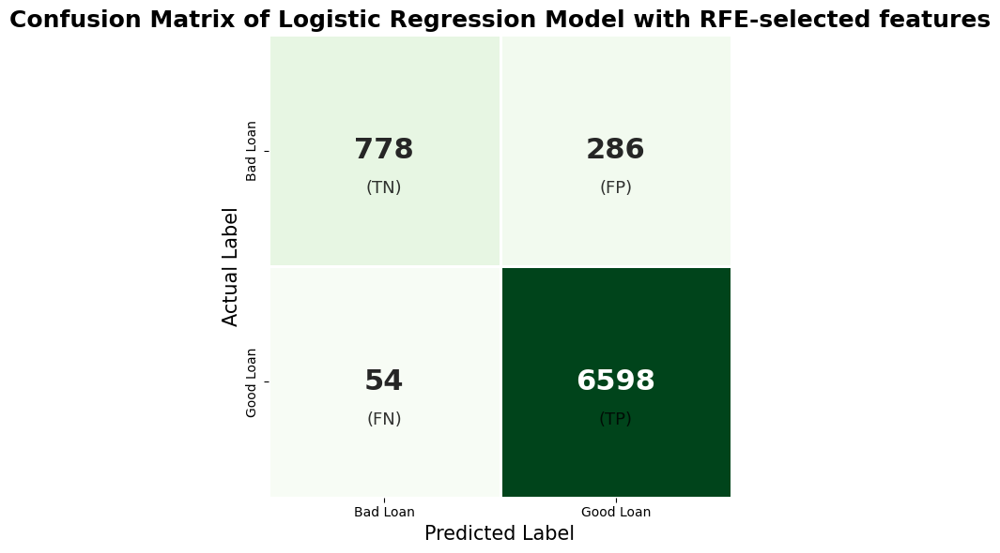

In [ ]:
plot_confusion_matrix(ytest_r, ypred_base_r,title='Confusion Matrix of Logistic Regression Model with RFE-selected features')

The amount of false predictions made by this model have also increased

In [ ]:
print(classification_report(ytest_r, ypred_base_r))

              precision    recall  f1-score   support

           0       0.94      0.73      0.82      1064
           1       0.96      0.99      0.97      6652

    accuracy                           0.96      7716
   macro avg       0.95      0.86      0.90      7716
weighted avg       0.96      0.96      0.95      7716



ROC-AUC Score: 0.9606113006885828


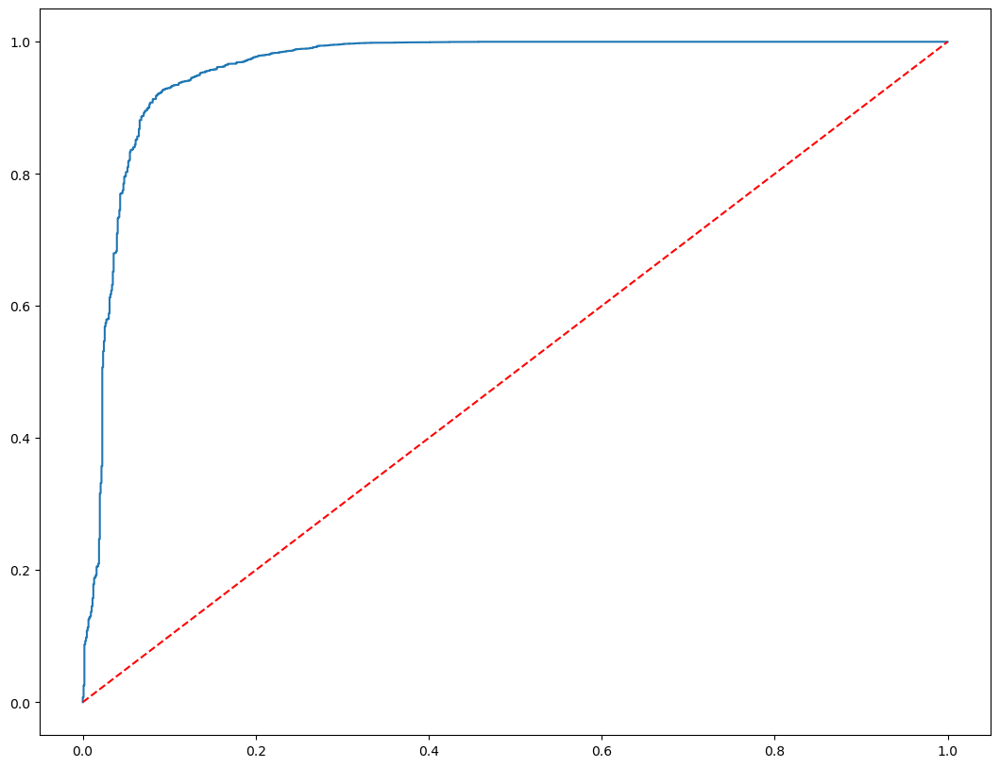

In [ ]:
ypred_base_r_prob = rfe_model.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_base_r_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_base_r_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Logistic Regression (features selected by RFE)',rfe_model,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203


The RFE model returns slightly better accuracies and metrics, though the recall score for the RFE-based Logistic Regression model is slightly lower.

## Decision Tree Models

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=42)
dt.fit(xtrain,ytrain)
ypred_dt = dt.predict(xtest)

In [ ]:
print('Training accuracy:',dt.score(xtrain,ytrain))
print('Test accuracy:',dt.score(xtest,ytest))
print('Model accuracy:',accuracy_score(ytest,ypred_dt))

Training accuracy: 1.0
Test accuracy: 0.9543805080352514
Model accuracy: 0.9543805080352514


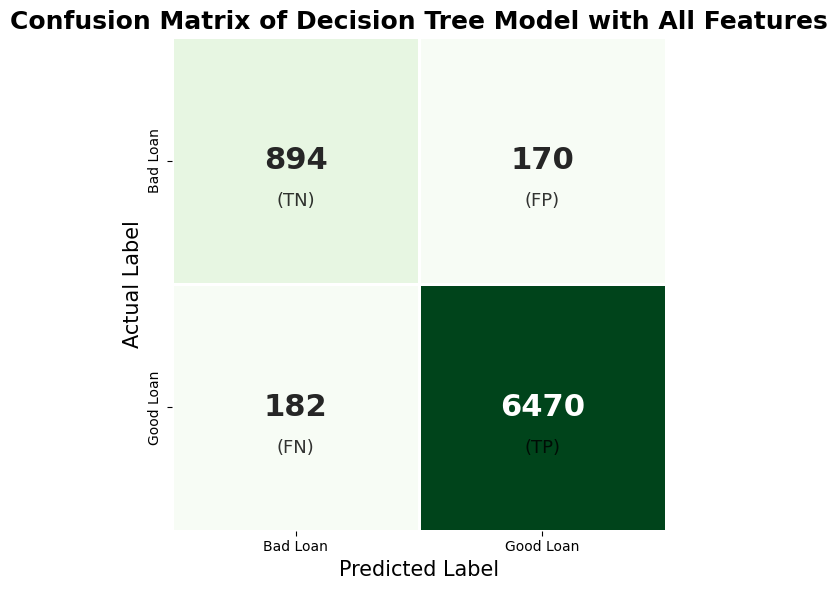

In [ ]:
plot_confusion_matrix(ytest,ypred_dt,title='Confusion Matrix of Decision Tree Model with All Features')

In [ ]:
print(classification_report(ytest, ypred_dt))

              precision    recall  f1-score   support

           0       0.83      0.84      0.84      1064
           1       0.97      0.97      0.97      6652

    accuracy                           0.95      7716
   macro avg       0.90      0.91      0.90      7716
weighted avg       0.95      0.95      0.95      7716



ROC-AUC Score: 0.9064326857432216


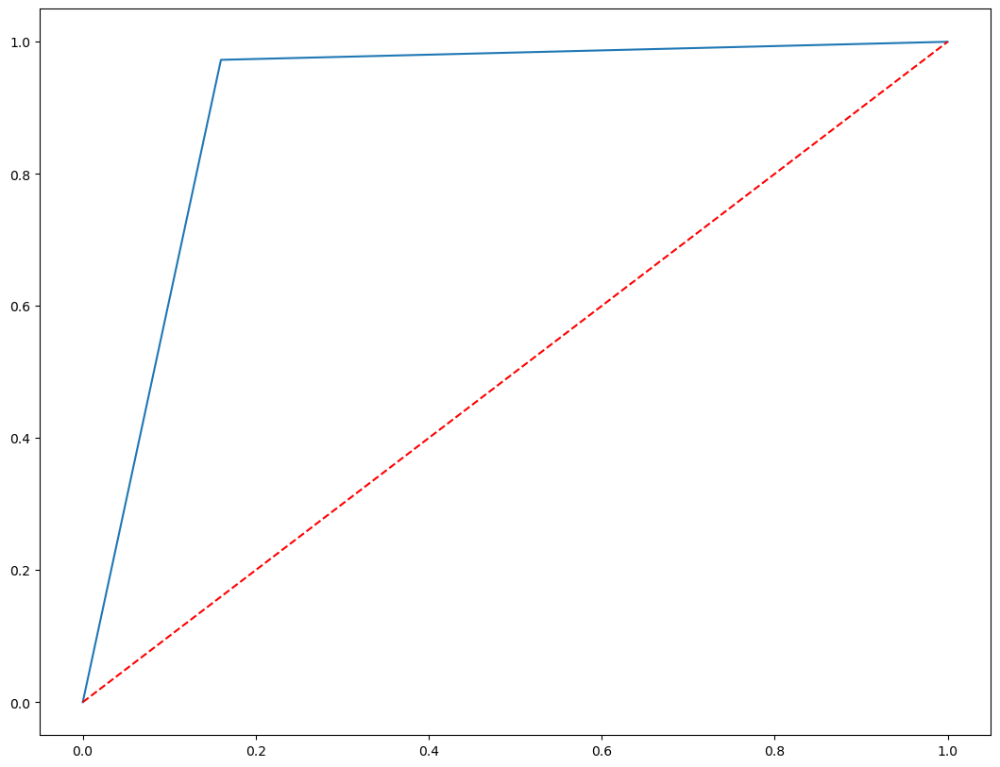

In [ ]:
ypred_dt_prob = dt.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_dt_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_dt_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Decision Tree',dt,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226


The Decision Tree created with all the features of the model returns 100% in training and 95% in testing. The precision and recall scores for this model seem to be in the same range. We can see if making a new model based on the important features in this tree returns better results

#### Feature Importances in a Decision Tree Model - Original Data

In [ ]:
dt_feature = pd.DataFrame()
dt_feature['Feature'] = xtrain.columns
dt_feature['Importance'] = dt.feature_importances_
dt_feature = dt_feature.sort_values('Importance',ascending=False)

In [ ]:
dt_feature.shape

(91, 2)

In [ ]:
dt_feature[dt_feature['Importance'] > 0].shape

(82, 2)

So, there are 82 features that possess some importance/role in accurate prediction. We shall try to build a model with those 82 features.

In [ ]:
dt_feature[dt_feature['Importance'] > 0]

,Feature,Importance
6,total_payment,0.313810
2,installment,0.262886
4,loan_amount,0.248159
3,int_rate,0.043155
1,dti,0.016883
...,...,...
39,address_state_MT,0.000064
62,address_state_WY,0.000056
83,Purpose_moving,0.000044
29,address_state_KS,0.000016


In [ ]:
features_82 = final_df[dt_feature[dt_feature['Importance'] > 0].Feature]

In [ ]:
features_82.columns

Index(['total_payment', 'installment', 'loan_amount', 'int_rate', 'dti',
       'term__60_months', 'total_acc', 'annual_income', 'emp_length_10+_years',
       'Grade_C', 'address_state_CA', 'Grade_D', 'emp_length_3_years',
       'emp_length_7_years', 'Grade_B', 'Purpose_other', 'home_ownership_RENT',
       'emp_length_5_years', 'address_state_NY', 'address_state_FL', 'Grade_E',
       'Grade_A', 'emp_length_4_years', 'emp_length_9_years',
       'address_state_CO', 'address_state_WA', 'Purpose_major_purchase',
       'address_state_GA', 'emp_length_8_years', 'home_ownership_OWN',
       'address_state_VA', 'address_state_NJ', 'address_state_MA',
       'address_state_MD', 'address_state_MI', 'address_state_LA',
       'verification_status_Verified', 'emp_length_2_years',
       'Purpose_small_business', 'Purpose_home_improvement',
       'address_state_NV', 'emp_length__lt__1_year', 'Purpose_credit_card',
       'Purpose_wedding', 'Grade_F', 'address_state_SD', 'Purpose_car',
      

In [ ]:
dt_red = final_df[features_82.columns]

In [ ]:
dt_red.shape

(38576, 82)

In [ ]:
target

'Good_Loan'

In [ ]:
dt_red[target] = final_df[target]

In [ ]:
dt_red.shape

(38576, 83)

In [ ]:
X_red = dt_red.drop(target,axis=1)
y_red = dt_red[target]

xtrain_red, xtest_red, ytrain_red,ytest_red = train_test_split(X_red,
                                                               y_red,
                                                               test_size=0.2,
                                                               random_state=42)

In [ ]:
print(xtrain_red.shape)
print(xtest_red.shape)
print(ytrain_red.shape)
print(ytest_red.shape)

(30860, 82)
(7716, 82)
(30860,)
(7716,)


### Decision Tree with reduced features

In [ ]:
dt_red = DecisionTreeClassifier(random_state=42)
dt_red.fit(xtrain_red,ytrain_red)
ypred_dt_red = dt_red.predict(xtest_red)

In [ ]:
print('Training accuracy:',dt_red.score(xtrain_red,ytrain_red))
print('Test accuracy:',dt_red.score(xtest_red,ytest_red))
print('Model accuracy:',accuracy_score(ytest_red,ypred_dt_red))

Training accuracy: 1.0
Test accuracy: 0.9543805080352514
Model accuracy: 0.9543805080352514


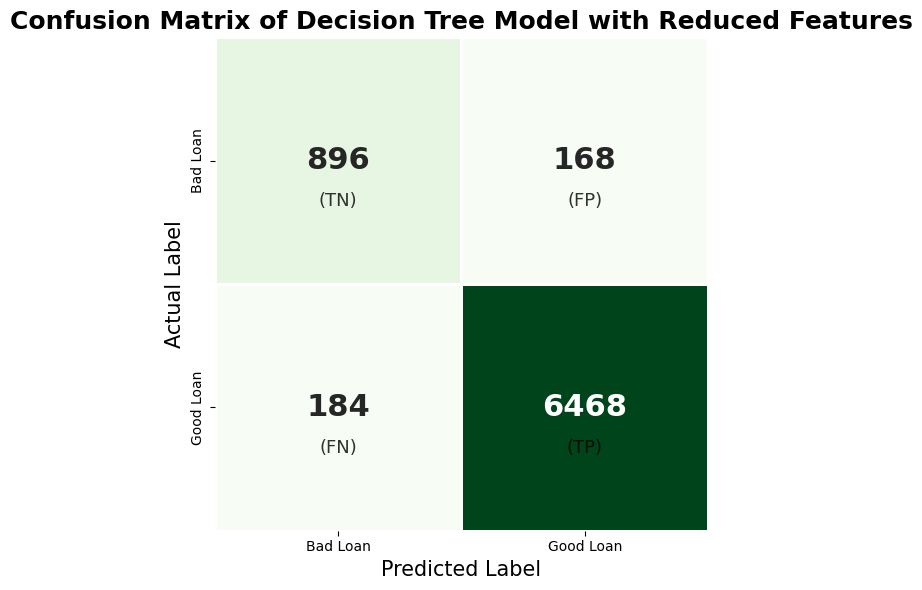

In [ ]:
plot_confusion_matrix(ytest_red,ypred_dt_red,title='Confusion Matrix of Decision Tree Model with Reduced Features')

In [ ]:
print(classification_report(ytest_red, ypred_dt_red))

              precision    recall  f1-score   support

           0       0.83      0.84      0.84      1064
           1       0.97      0.97      0.97      6652

    accuracy                           0.95      7716
   macro avg       0.90      0.91      0.90      7716
weighted avg       0.95      0.95      0.95      7716



ROC-AUC Score: 0.907222204639681


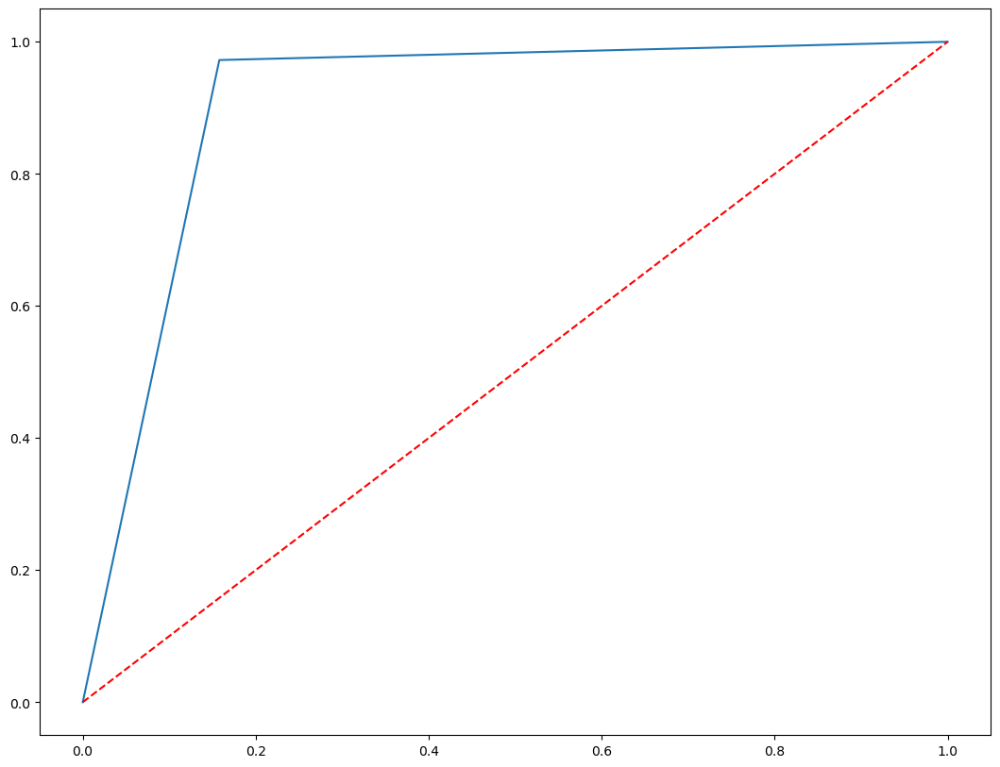

In [ ]:
ypred_dt_red_prob = dt_red.predict_proba(xtest_red)[:,1]
fpr, tpr, threshold = roc_curve(ytest_red,ypred_dt_red_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_red,ypred_dt_red_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Decision Tree (reduced features)',dt_red,xtrain_red,xtest_red,ytrain_red,ytest_red)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105


Using less features doesn't seem to improve accuracy -- it is staying somewhat closer to the same values. There is a slight decrease in precision and slight increase in recall for the 'Bad Loan' class.

Let us see how a decision tree constructed with RFE-selected features does

### Decision Tree (with features selected through RFE)

In [ ]:
dt_rfe = DecisionTreeClassifier(random_state=42)
dt_rfe.fit(xtrain_r,ytrain_r)
ypred_dt_rfe = dt_rfe.predict(xtest_r)

In [ ]:
print('Training accuracy:',dt_rfe.score(xtrain_r,ytrain_r))
print('Test accuracy:',dt_rfe.score(xtest_r,ytest_r))
print('Model accuracy:',accuracy_score(ytest_r,ypred_dt_rfe))

Training accuracy: 1.0
Test accuracy: 0.9568429237947123
Model accuracy: 0.9568429237947123


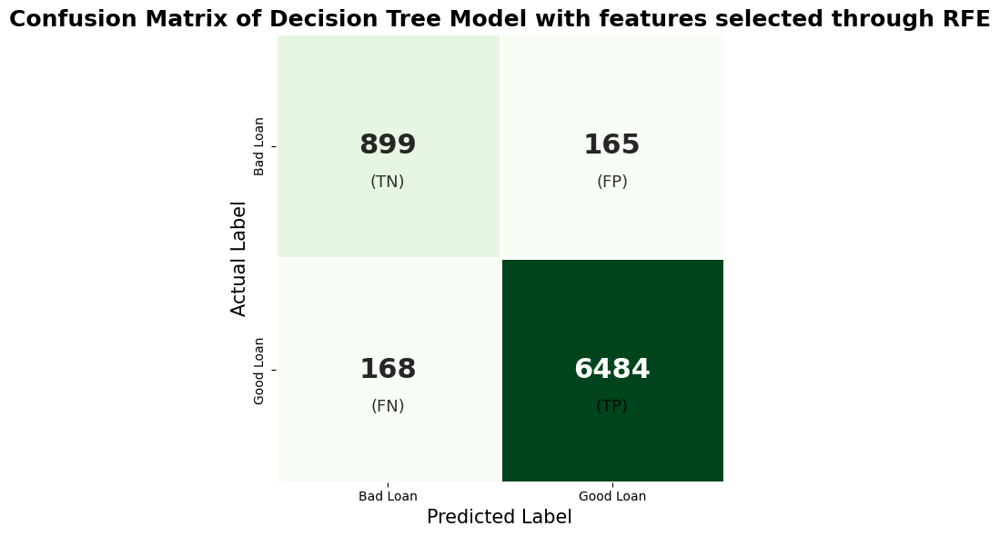

In [ ]:
plot_confusion_matrix(ytest_r,ypred_dt_rfe,title='Confusion Matrix of Decision Tree Model with features selected through RFE')

In [ ]:
print(classification_report(ytest_r, ypred_dt_rfe))

              precision    recall  f1-score   support

           0       0.84      0.84      0.84      1064
           1       0.98      0.97      0.97      6652

    accuracy                           0.96      7716
   macro avg       0.91      0.91      0.91      7716
weighted avg       0.96      0.96      0.96      7716



ROC-AUC Score: 0.909834624896577


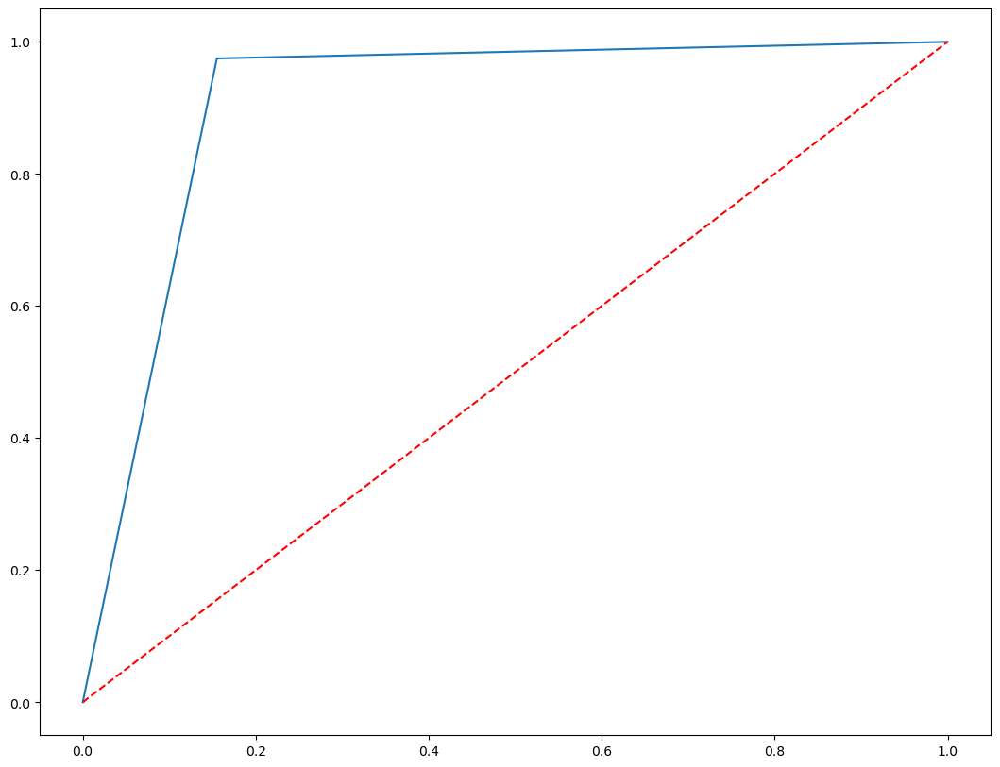

In [ ]:
ypred_dt_rfe_prob = dt_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_dt_rfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_dt_rfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Decision Tree (features selected by RFE)',dt_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925


This model seems to have a very close equal in precision and recall values. Let us see how it fares with a feature reduction through feature importances.

#### Feature Importances in the RFE-based Decision Tree

In [ ]:
dt_rfe_feature = pd.DataFrame()
dt_rfe_feature['Feature'] = xtrain_r.columns
dt_rfe_feature['Importance'] = dt_rfe.feature_importances_
dt_rfe_feature = dt_rfe_feature.sort_values('Importance',ascending=False)

In [ ]:
dt_rfe_feature.shape

(45, 2)

In [ ]:
dt_rfe_feature[dt_rfe_feature['Importance'] > 0].shape

(42, 2)

So, there are 42 features that possess some importance/role in accurate prediction. We shall try to build a model with those 42 features.

In [ ]:
features_42 = dt_rfe_feature[dt_rfe_feature['Importance'] > 0]
dt_rfe_red = final_df[features_42.Feature]

In [ ]:
dt_rfe_red.shape

(38576, 42)

In [ ]:
dt_rfe_red[target] = final_df[target]

X_rfe_red = dt_rfe_red.drop(target,axis=1)
y_rfe_red = dt_rfe_red[target]

xtrain_rr, xtest_rr, ytrain_rr,ytest_rr = train_test_split(X_rfe_red,
                                                               y_rfe_red,
                                                               test_size=0.2,
                                                               random_state=42)

print(xtrain_rr.shape)
print(xtest_rr.shape)
print(ytrain_rr.shape)
print(ytest_rr.shape)

(30860, 42)
(7716, 42)
(30860,)
(7716,)


### Decision Tree built with reduced features from RFE features

In [ ]:
dt_rfe_red = DecisionTreeClassifier(random_state=42)
dt_rfe_red.fit(xtrain_rr,ytrain_rr)
ypred_dt_rfe_red = dt_rfe_red.predict(xtest_rr)

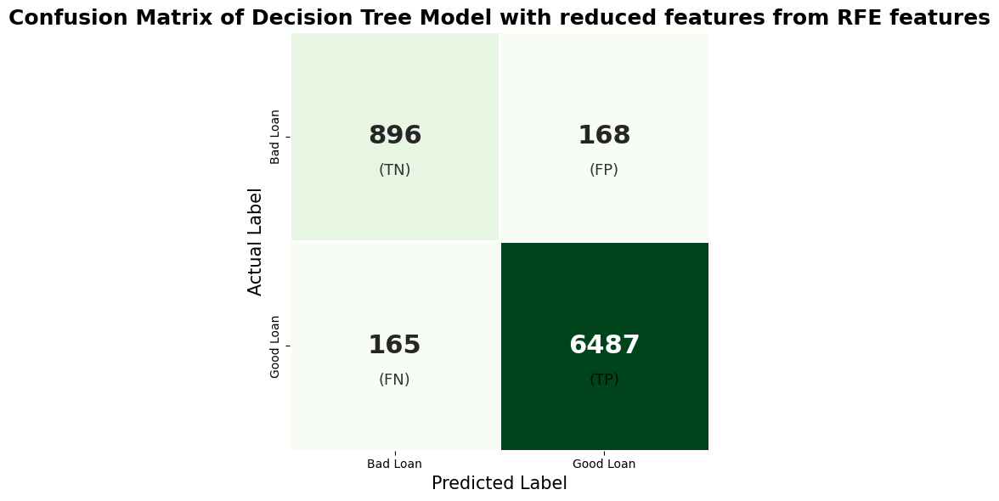

In [ ]:
plot_confusion_matrix(ytest_rr,ypred_dt_rfe_red,title='Confusion Matrix of Decision Tree Model with reduced features from RFE features')

In [ ]:
print(classification_report(ytest_rr, ypred_dt_rfe_red))

              precision    recall  f1-score   support

           0       0.84      0.84      0.84      1064
           1       0.97      0.98      0.97      6652

    accuracy                           0.96      7716
   macro avg       0.91      0.91      0.91      7716
weighted avg       0.96      0.96      0.96      7716



In [ ]:
update_scorecard('Decision Tree (reduced features from RFE features)',dt_rfe_red,xtrain_rr,xtest_rr,ytrain_rr,ytest_rr)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105


Not a very great improvement/degrade.

Let us see how a random forest model performs.

Just like the decision tree, we will build different random forest models:
* Random forest with all 91 features
* Random forest based on feature importances from the 91 features
* Random forest with the 45 rfe features
* Random forest based on feature importances from the 45 rfe features

## Random Forest Models

### Random Forest (all features)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state=42)
rf.fit(xtrain,ytrain)
ypred_rf = rf.predict(xtest)

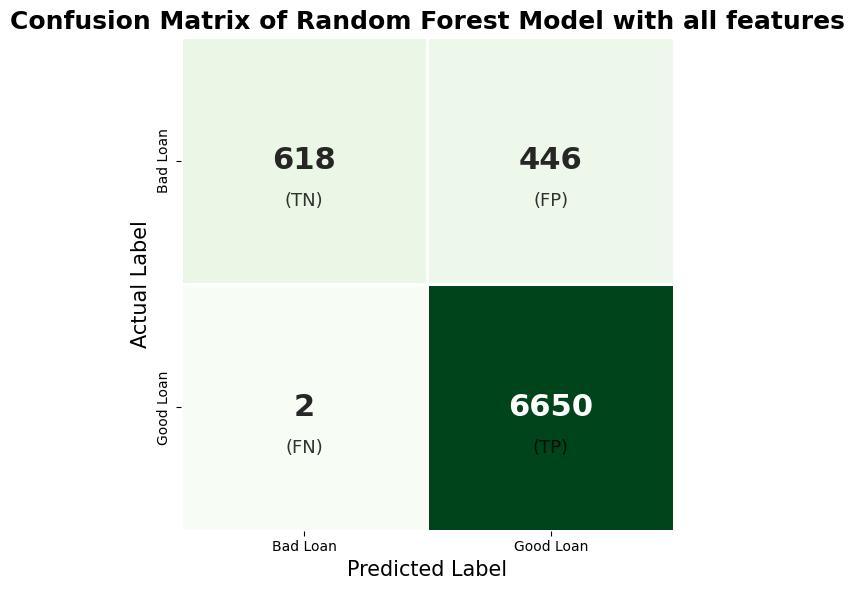

In [ ]:
plot_confusion_matrix(ytest,ypred_rf,title='Confusion Matrix of Random Forest Model with all features')

False negatives have decreased to 2

In [ ]:
ytest.value_counts()

Good_Loan
1    6652
0    1064
Name: count, dtype: int64

But if we just peek at ytest's real values and compare with all other condusion matrices of all models, we can see that the false positives have increased.

In [ ]:
print(classification_report(ytest, ypred_rf))

              precision    recall  f1-score   support

           0       1.00      0.58      0.73      1064
           1       0.94      1.00      0.97      6652

    accuracy                           0.94      7716
   macro avg       0.97      0.79      0.85      7716
weighted avg       0.95      0.94      0.94      7716



ROC-AUC Score: 0.9584636482215761


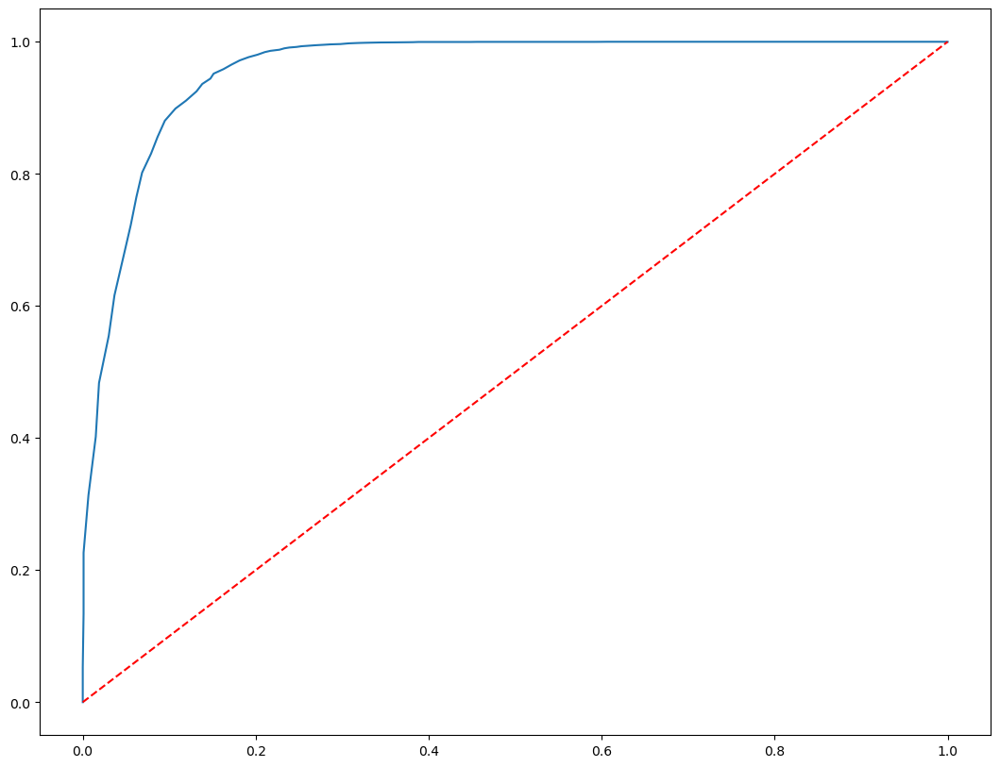

In [ ]:
ypred_rf_prob = rf.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_rf_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_rf_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Random Forest',rf,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827


This Random Forest returned a drastic decrease in recall for the 'Bad Loan' class.

#### Feature Importances in a Random Forest Model - Original Data

In [ ]:
rf_feature = pd.DataFrame()
rf_feature['Feature'] = xtrain.columns
rf_feature['Importance'] = rf.feature_importances_
rf_feature = rf_feature.sort_values('Importance',ascending=False)

In [ ]:
rf_feature.shape

(91, 2)

In [ ]:
rf_feature[rf_feature['Importance'] > 0].shape

(91, 2)

The random forest model sees all features as important for prediction.

In [ ]:
rf_feature.head(10)

,Feature,Importance
6,total_payment,0.317820
2,installment,0.117797
4,loan_amount,0.106861
3,int_rate,0.055436
1,dti,0.051434
0,annual_income,0.050527
5,total_acc,0.042803
89,term__60_months,0.017177
7,Grade_A,0.011118
8,Grade_B,0.009557


In [ ]:
dt_feature.head(10)

,Feature,Importance
6,total_payment,0.313810
2,installment,0.262886
4,loan_amount,0.248159
3,int_rate,0.043155
1,dti,0.016883
89,term__60_months,0.015418
5,total_acc,0.012290
0,annual_income,0.012175
63,emp_length_10+_years,0.004408
9,Grade_C,0.004004


It's interesting to note that the first five features focused by both the Random Forest model and the Decision Tree model that includes all features are the same. The rest of the order seems to have a slight difference.

We'll see how a random forest with the features selected from RFE fares

### Random Forest (with RFE-selected features)

In [ ]:
rf_rfe = RandomForestClassifier(random_state=42)
rf_rfe.fit(xtrain_r,ytrain_r)
ypred_rf_rfe = rf_rfe.predict(xtest_r)

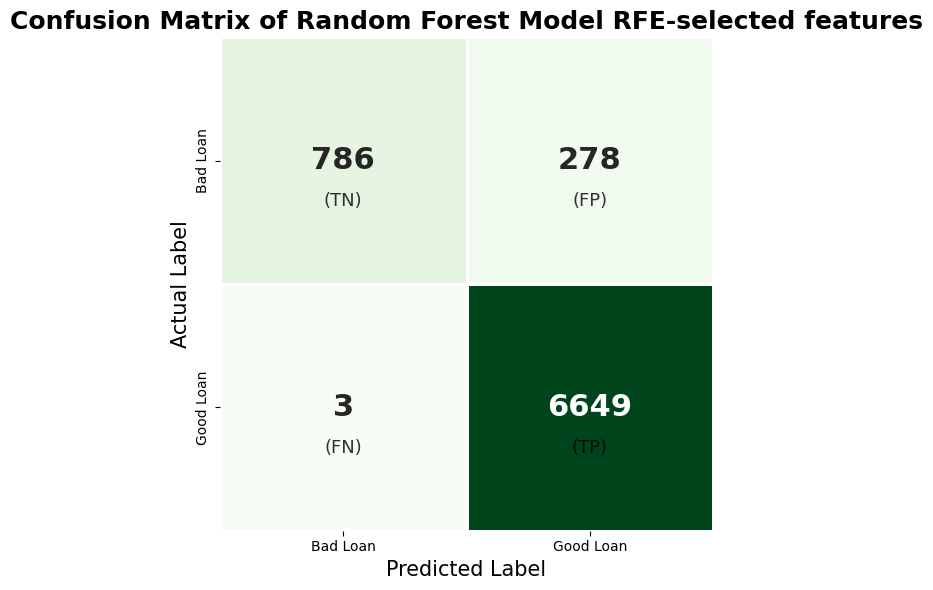

In [ ]:
plot_confusion_matrix(ytest_r,ypred_rf_rfe,title='Confusion Matrix of Random Forest Model RFE-selected features')

In [ ]:
print(classification_report(ytest_r, ypred_rf_rfe))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85      1064
           1       0.96      1.00      0.98      6652

    accuracy                           0.96      7716
   macro avg       0.98      0.87      0.91      7716
weighted avg       0.96      0.96      0.96      7716



ROC-AUC Score: 0.9686058859566233


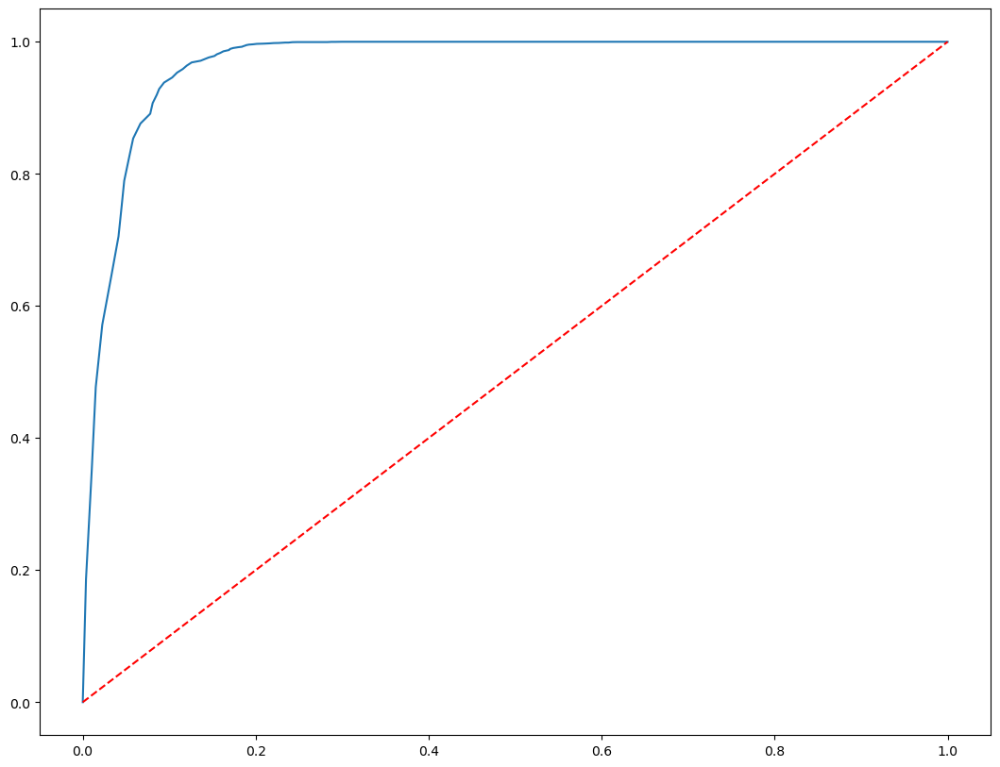

In [ ]:
ypred_rf_rfe_prob = rf_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_rf_rfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_rf_rfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Random Forest (RFE features)',rf_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722


The Random Forest model with the RFE-selected features seems to be performing well

#### Feature Importances in the Random Forest Model with RFE features

In [ ]:
rf_rfe_feature = pd.DataFrame()
rf_rfe_feature['Feature'] = xtrain_r.columns
rf_rfe_feature['Importance'] = rf_rfe.feature_importances_
rf_rfe_feature = rf_rfe_feature.sort_values('Importance',ascending=False)

In [ ]:
rf_rfe_feature.shape

(45, 2)

In [ ]:
rf_rfe_feature[rf_rfe_feature['Importance'] > 0].shape

(45, 2)

The Random forest model fitted with the features selected from RFE also seems to place importance to all features, not eliminating a single feature.

In [ ]:
dt_rfe_feature.head(10)

,Feature,Importance
4,total_payment,0.338818
1,installment,0.275333
3,loan_amount,0.253365
2,int_rate,0.054779
0,annual_income,0.024632
44,term__60_months,0.015717
29,emp_length_10+_years,0.003682
41,Purpose_small_business,0.002523
30,emp_length_2_years,0.001965
31,emp_length_4_years,0.001958


In [ ]:
rf_rfe_feature.head(10)

,Feature,Importance
4,total_payment,0.439315
1,installment,0.169859
3,loan_amount,0.135007
2,int_rate,0.081685
0,annual_income,0.065251
44,term__60_months,0.020047
29,emp_length_10+_years,0.008003
41,Purpose_small_business,0.005481
30,emp_length_2_years,0.005194
33,home_ownership_OWN,0.005145


We see the same conclusion as the comparison between the decision tree and random forest of original data. The same trend follows for the decision tree's and the random forest's feature importance basis for the features selected by RFE

In [ ]:
score_card

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722


**Note**: rfe_features, features_42, features_82, rf_feature, rf_rfe_feature should be analyzed to determine overall, which features most of the models are comsidering important

## Support Vector Machine

This is a new algorithm we haven't yet tried out. A variation of this SVM for classification is Support Vector Classifier).

### SVC (all features)

#### Default rbf kernel

In [ ]:
from sklearn.svm import SVC

svm_model = SVC(kernel='rbf', probability=True, random_state=42)
svm_model.fit(xtrain, ytrain)
ypred_svm = svm_model.predict(xtest)

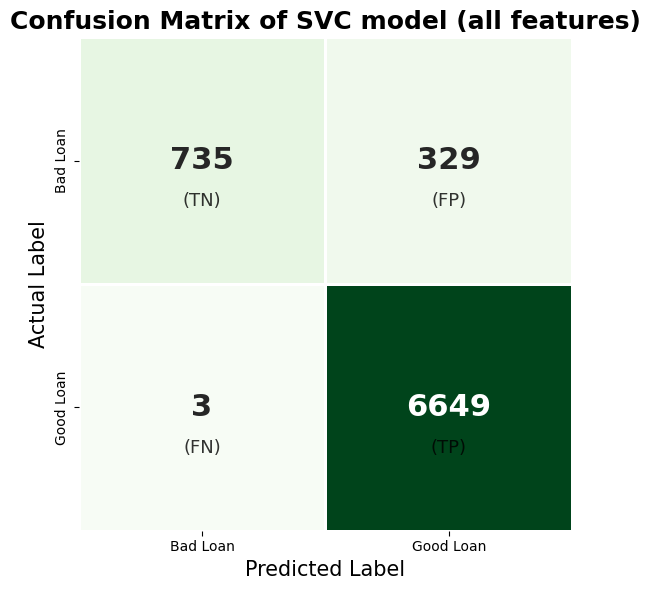

In [ ]:
plot_confusion_matrix(ytest, ypred_svm,title='Confusion Matrix of SVC model (all features)')

In [ ]:
print(classification_report(ytest, ypred_svm))

              precision    recall  f1-score   support

           0       1.00      0.69      0.82      1064
           1       0.95      1.00      0.98      6652

    accuracy                           0.96      7716
   macro avg       0.97      0.85      0.90      7716
weighted avg       0.96      0.96      0.95      7716



ROC-AUC Score: 0.9672420302108247


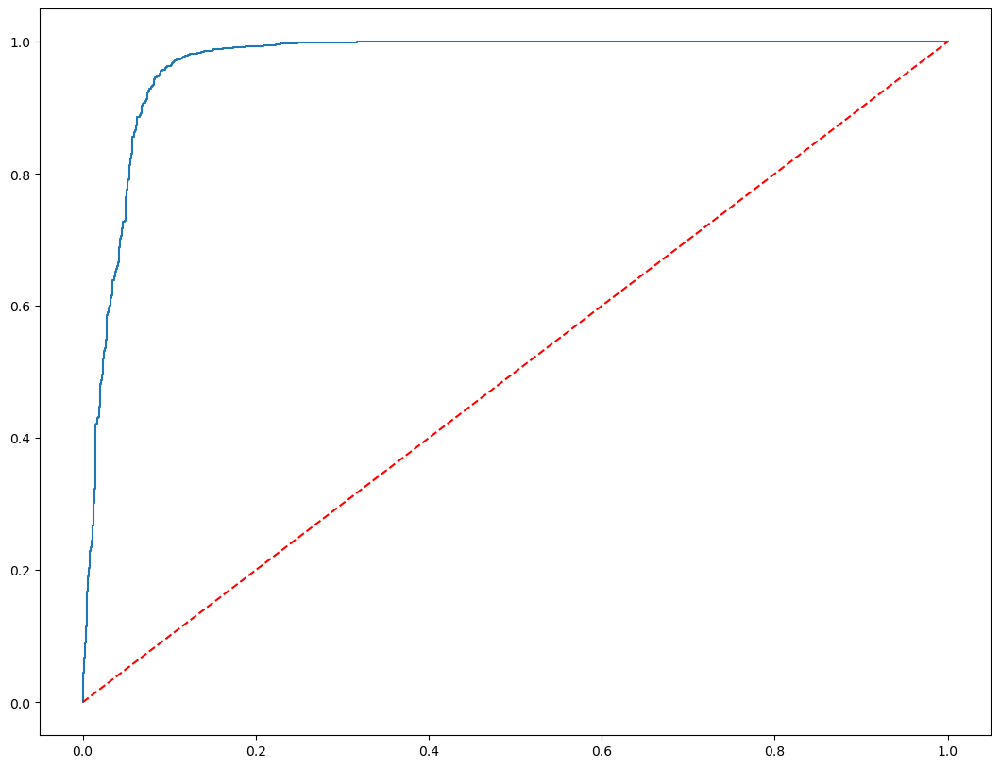

In [ ]:
ypred_svm_prob = svm_model.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_svm_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_svm_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('SVC model (all features)',svm_model,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789


#### Linear Kernel

In [ ]:
svm_linear = SVC(kernel='linear', probability=True, random_state=42)
svm_linear.fit(xtrain, ytrain)
ypred_svm_l = svm_linear.predict(xtest)

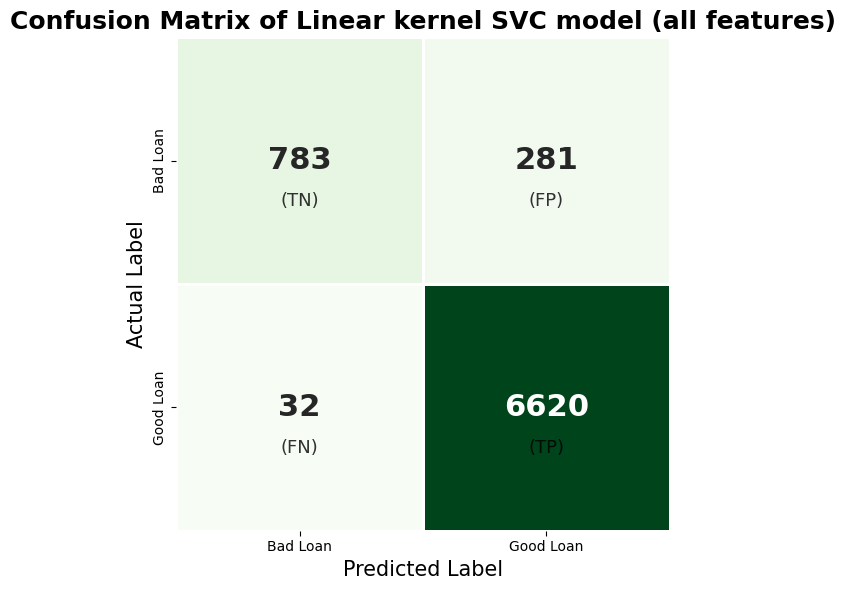

In [ ]:
plot_confusion_matrix(ytest, ypred_svm_l,title='Confusion Matrix of Linear kernel SVC model (all features)')

In [ ]:
print(classification_report(ytest, ypred_svm_l))

              precision    recall  f1-score   support

           0       0.96      0.74      0.83      1064
           1       0.96      1.00      0.98      6652

    accuracy                           0.96      7716
   macro avg       0.96      0.87      0.91      7716
weighted avg       0.96      0.96      0.96      7716



ROC-AUC Score: 0.9507639315893462


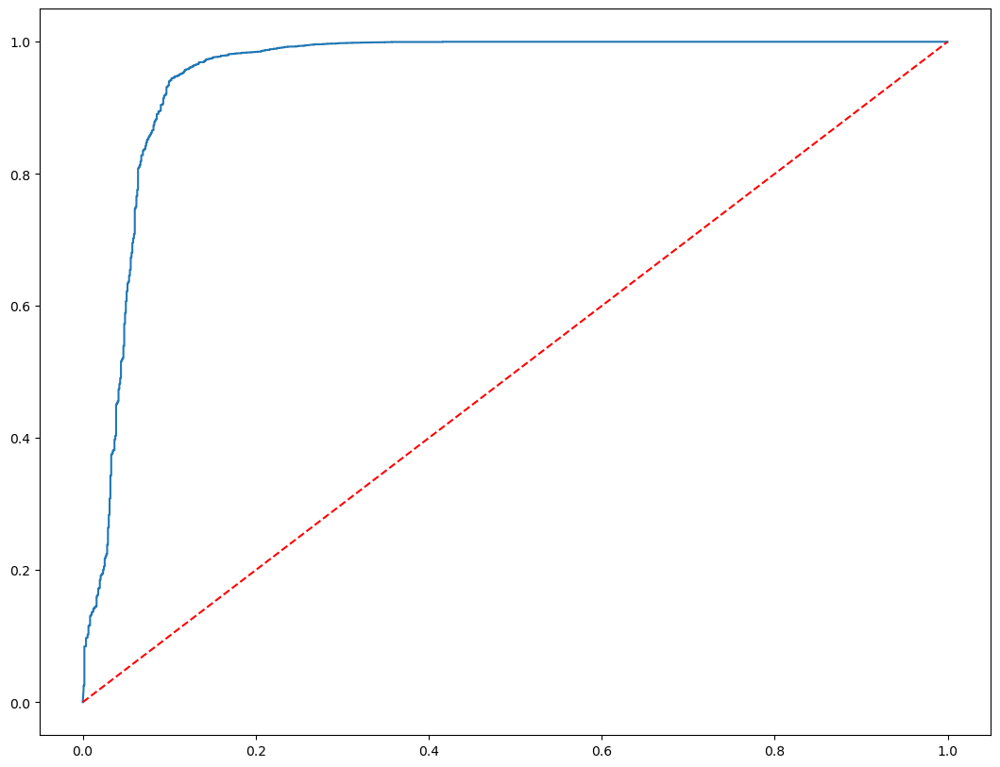

In [ ]:
ypred_svm_l_prob = svm_linear.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_svm_l_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_svm_l_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Linear kernel SVC model (all features)',svm_linear,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


### SVC (RFE-features)

#### Default rbf kernel

In [ ]:
svm_model_rfe = SVC(kernel='rbf', probability=True, random_state=42)
svm_model_rfe.fit(xtrain_r, ytrain_r)
ypred_svm_rfe = svm_model_rfe.predict(xtest_r)

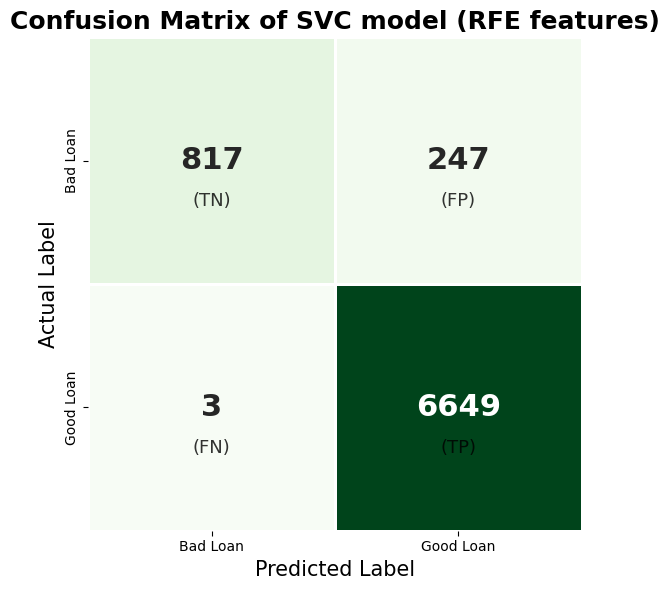

In [ ]:
plot_confusion_matrix(ytest_r, ypred_svm_rfe,title='Confusion Matrix of SVC model (RFE features)')

In [ ]:
print(classification_report(ytest_r, ypred_svm_rfe))

              precision    recall  f1-score   support

           0       1.00      0.77      0.87      1064
           1       0.96      1.00      0.98      6652

    accuracy                           0.97      7716
   macro avg       0.98      0.88      0.92      7716
weighted avg       0.97      0.97      0.97      7716



ROC-AUC Score: 0.9715530887878143


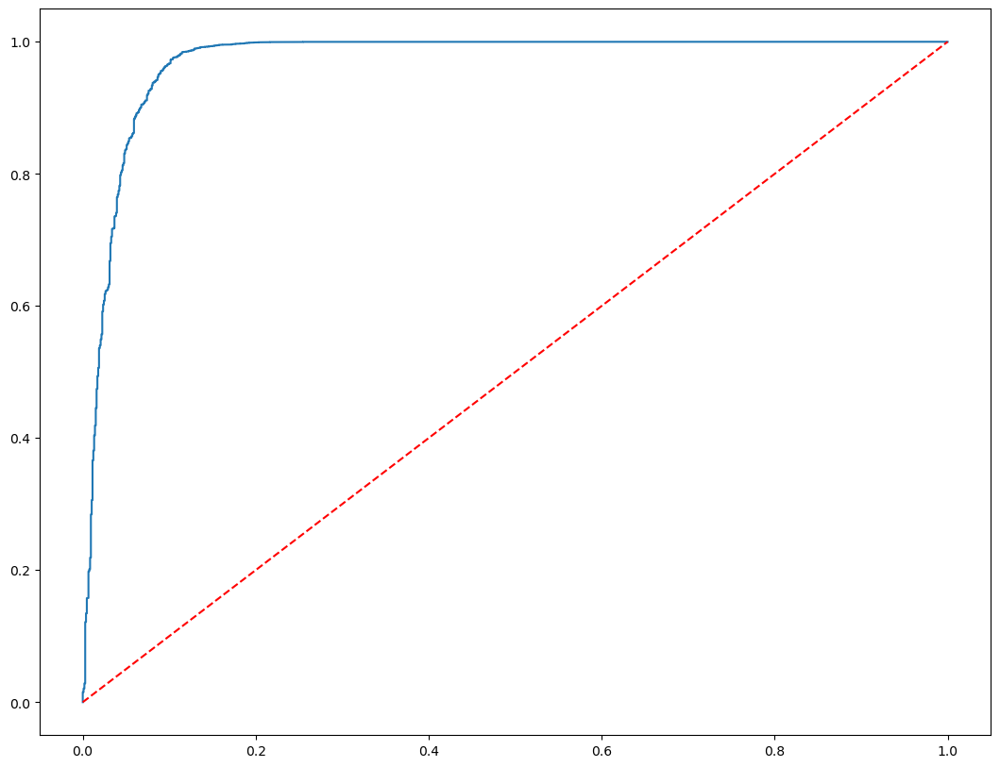

In [ ]:
ypred_svm_rfe_prob = svm_model_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_svm_rfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_svm_rfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('SVC model (RFE-features)',svm_model_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


#### Linear Kernel

In [ ]:
svm_linear_rfe = SVC(kernel='linear', probability=True, random_state=42)
svm_linear_rfe.fit(xtrain_r, ytrain_r)
ypred_svm_lrfe = svm_linear_rfe.predict(xtest_r)

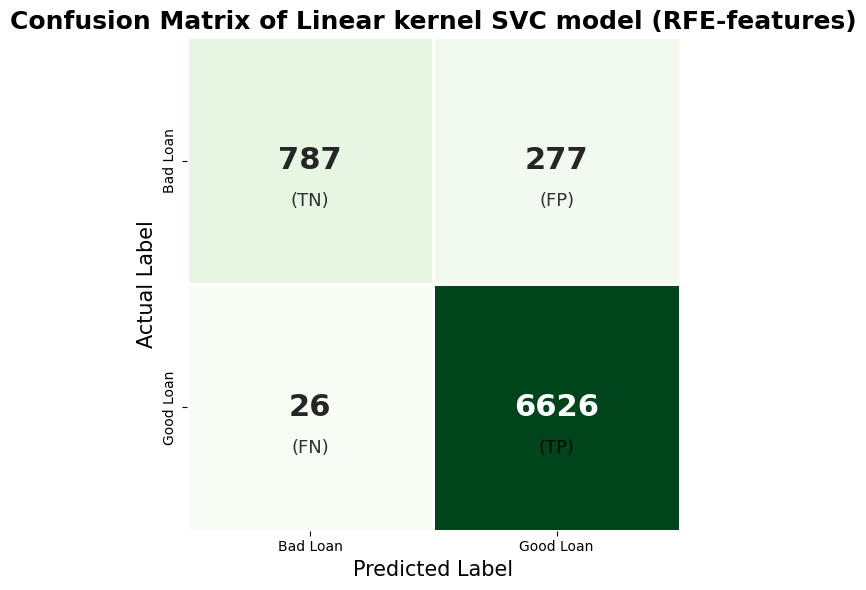

In [ ]:
plot_confusion_matrix(ytest_r, ypred_svm_lrfe,title='Confusion Matrix of Linear kernel SVC model (RFE-features)')

In [ ]:
print(classification_report(ytest_r, ypred_svm_lrfe))

              precision    recall  f1-score   support

           0       0.97      0.74      0.84      1064
           1       0.96      1.00      0.98      6652

    accuracy                           0.96      7716
   macro avg       0.96      0.87      0.91      7716
weighted avg       0.96      0.96      0.96      7716



ROC-AUC Score: 0.9509438622111501


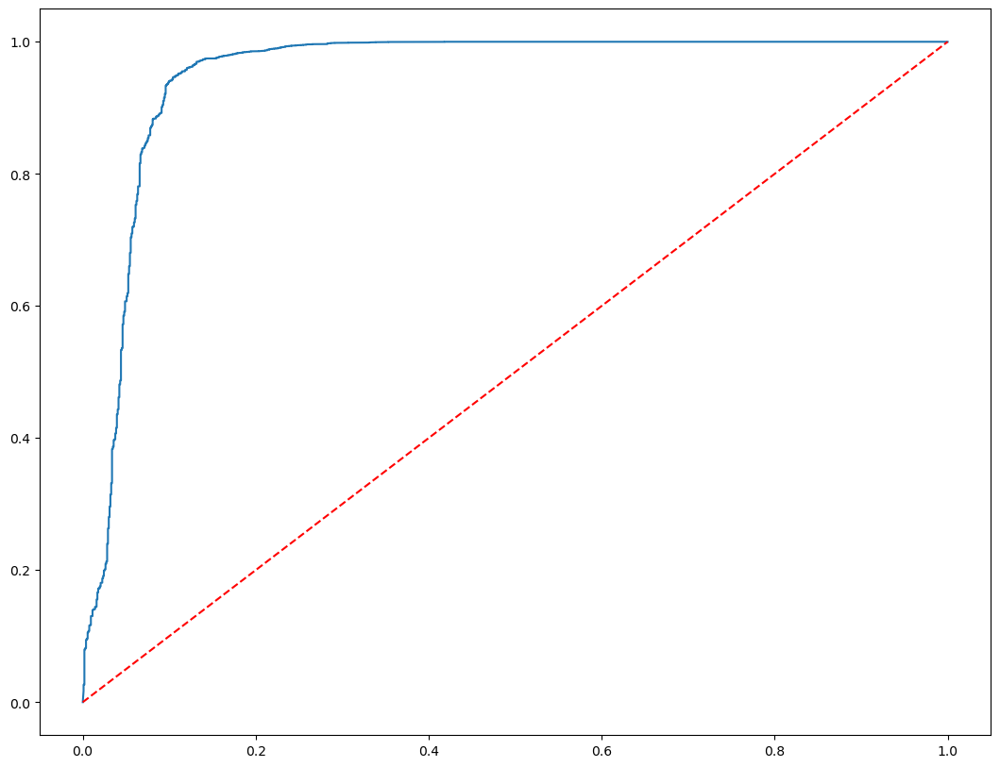

In [ ]:
ypred_svm_lrfe_prob = svm_linear_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_svm_lrfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_svm_lrfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('Linear kernel SVC model (RFE-features)',svm_linear_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


## Boosting Algorithms

We will try the following variations in boosting algorithms:
* Adaboost
* Gradient boost
* XGBoost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

### AdaBoost Classifier (all features)

In [ ]:
abc = AdaBoostClassifier(random_state=42)
abc.fit(xtrain,ytrain)
ypred_abc = abc.predict(xtest)

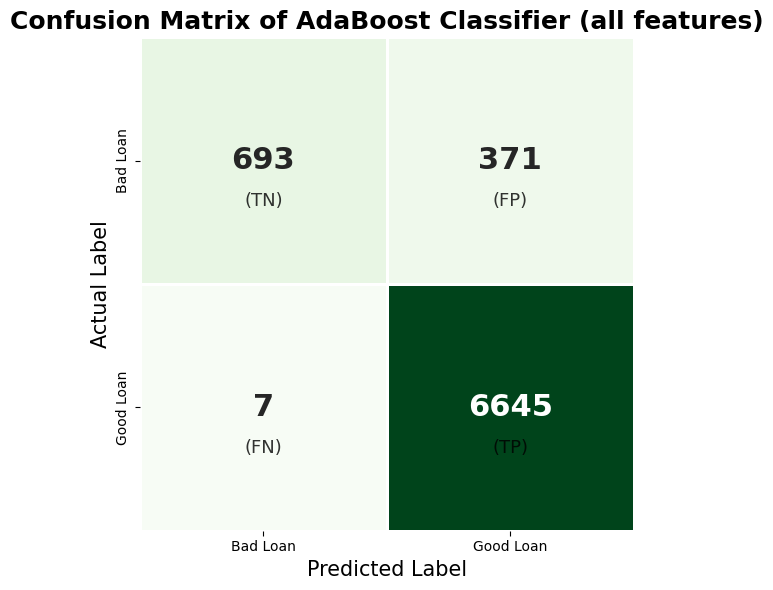

In [ ]:
plot_confusion_matrix(ytest, ypred_abc,title='Confusion Matrix of AdaBoost Classifier (all features)')

In [ ]:
print(classification_report(ytest,ypred_abc))

              precision    recall  f1-score   support

           0       0.99      0.65      0.79      1064
           1       0.95      1.00      0.97      6652

    accuracy                           0.95      7716
   macro avg       0.97      0.83      0.88      7716
weighted avg       0.95      0.95      0.95      7716



ROC-AUC Score: 0.966084172774088


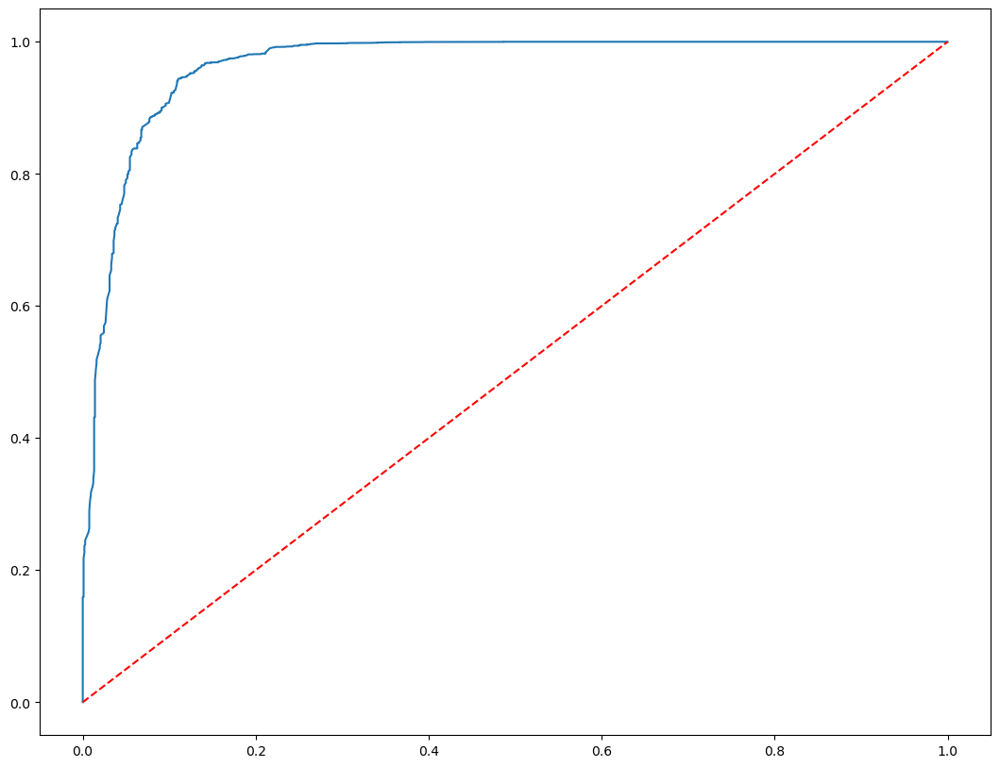

In [ ]:
ypred_abc_prob = abc.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_abc_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_abc_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('AdaBoost (all features)',abc,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


### AdaBoost Classifier (RFE-features)

In [ ]:
abc_rfe = AdaBoostClassifier(random_state=42)
abc_rfe.fit(xtrain_r,ytrain_r)
ypred_abc_rfe = abc_rfe.predict(xtest_r)

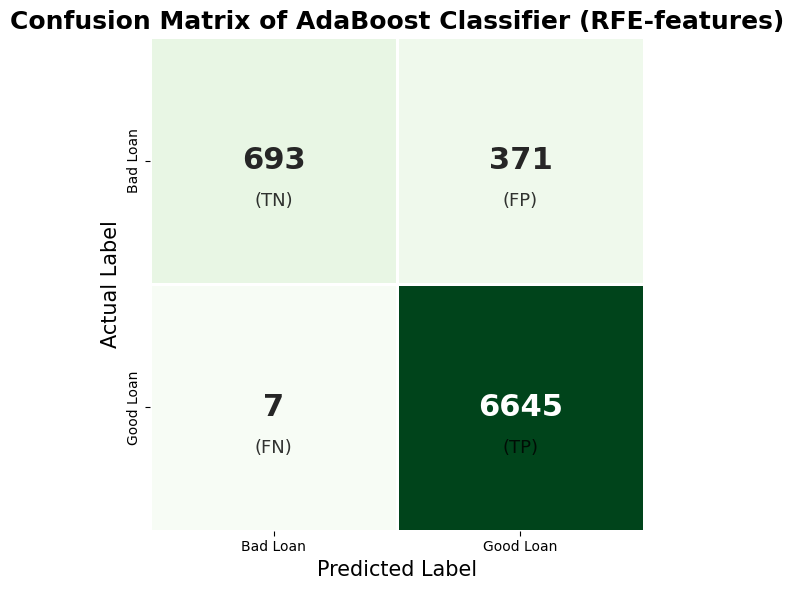

In [ ]:
plot_confusion_matrix(ytest_r, ypred_abc_rfe,title='Confusion Matrix of AdaBoost Classifier (RFE-features)')

In [ ]:
print(classification_report(ytest_r,ypred_abc_rfe))

              precision    recall  f1-score   support

           0       0.99      0.65      0.79      1064
           1       0.95      1.00      0.97      6652

    accuracy                           0.95      7716
   macro avg       0.97      0.83      0.88      7716
weighted avg       0.95      0.95      0.95      7716



ROC-AUC Score: 0.966084172774088


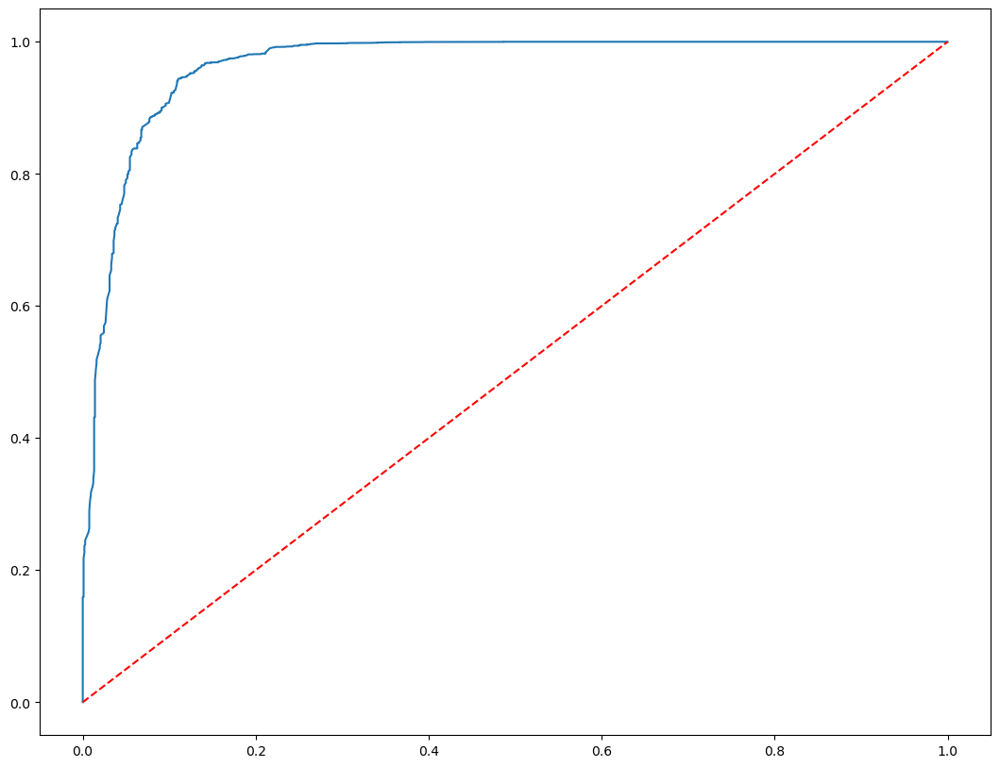

In [ ]:
ypred_abc_rfe_prob = abc_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_abc_rfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_abc_rfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('AdaBoost (RFE-features)',abc_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


### Gradient Boosting Classifier (all features)

In [ ]:
gb = GradientBoostingClassifier(random_state=42)
gb.fit(xtrain,ytrain)
ypred_gb = gb.predict(xtest)

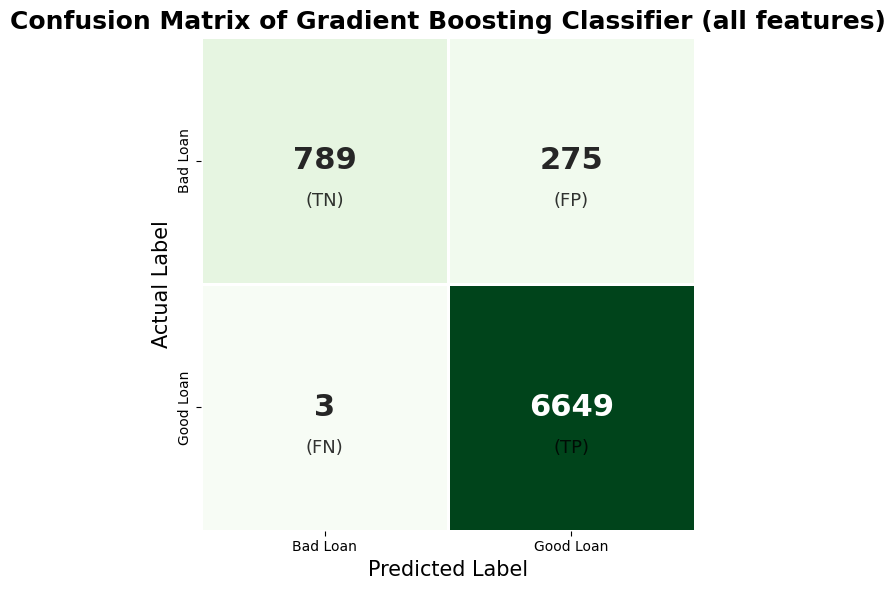

In [ ]:
plot_confusion_matrix(ytest, ypred_gb,title='Confusion Matrix of Gradient Boosting Classifier (all features)')

In [ ]:
print(classification_report(ytest,ypred_gb))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85      1064
           1       0.96      1.00      0.98      6652

    accuracy                           0.96      7716
   macro avg       0.98      0.87      0.91      7716
weighted avg       0.97      0.96      0.96      7716



ROC-AUC Score: 0.9765065145199138


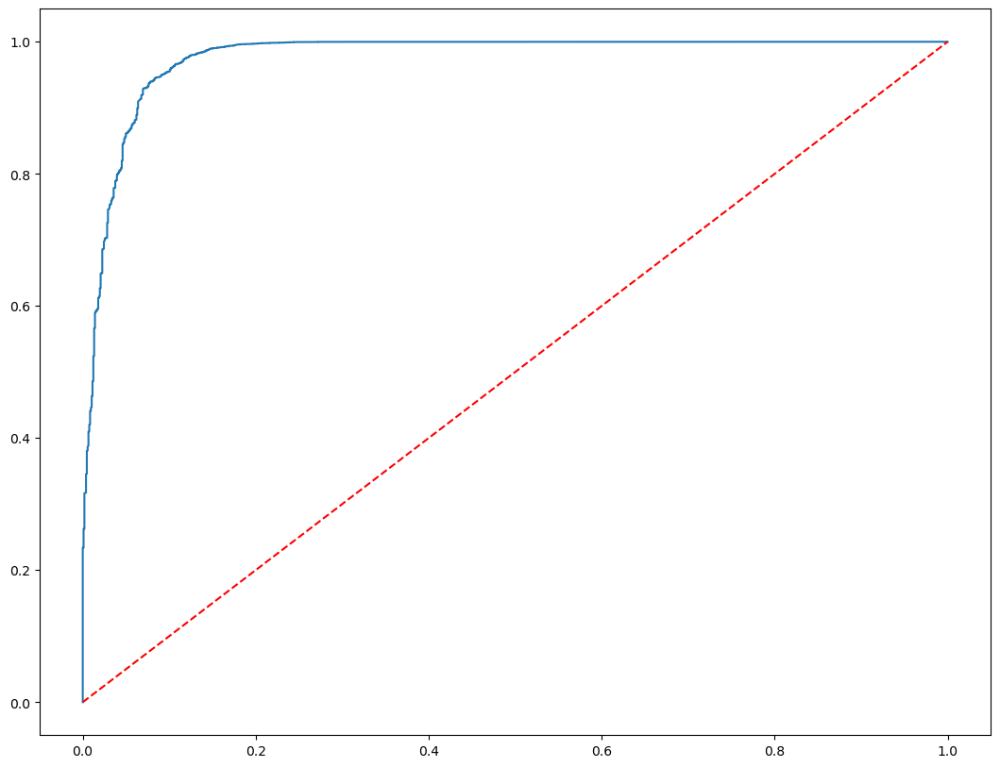

In [ ]:
ypred_gb_prob = gb.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_gb_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_gb_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('GradientBoost (all features)',gb,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


### Gradient Boosting Classifier (RFE-features)

In [ ]:
gb_rfe = GradientBoostingClassifier(random_state=42)
gb_rfe.fit(xtrain_r,ytrain_r)
ypred_gb_rfe = gb_rfe.predict(xtest_r)

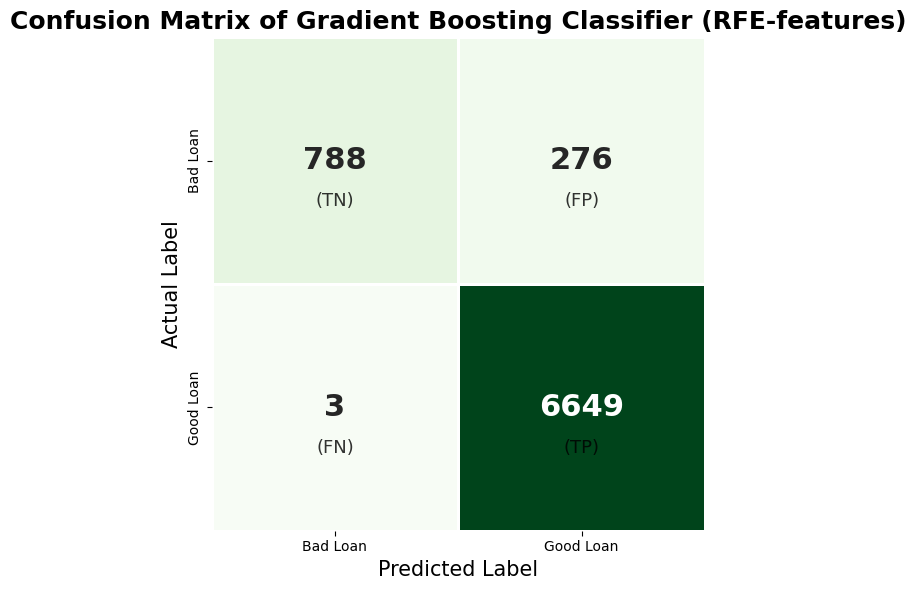

In [ ]:
plot_confusion_matrix(ytest_r, ypred_gb_rfe,title='Confusion Matrix of Gradient Boosting Classifier (RFE-features)')

In [ ]:
print(classification_report(ytest_r,ypred_gb_rfe))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85      1064
           1       0.96      1.00      0.98      6652

    accuracy                           0.96      7716
   macro avg       0.98      0.87      0.91      7716
weighted avg       0.97      0.96      0.96      7716



ROC-AUC Score: 0.9770002464067564


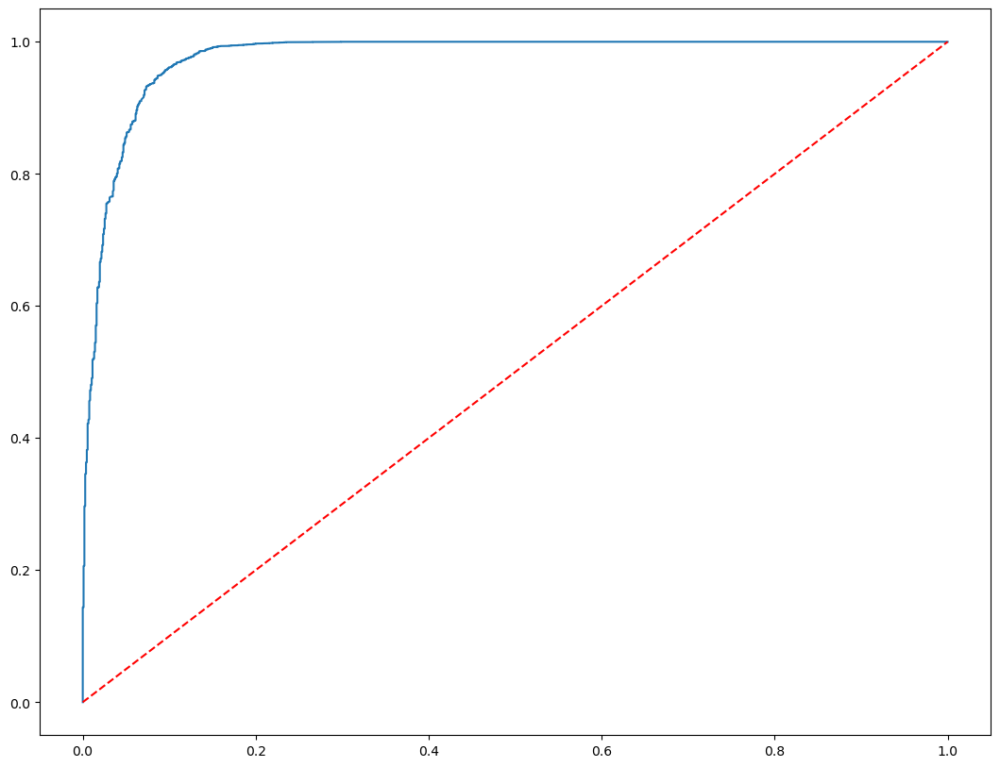

In [ ]:
ypred_gb_rfe_prob = gb_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_gb_rfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_gb_rfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('GradientBoost (RFE-features)',gb_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


### XGBoost (all features)

In [ ]:
xgb = XGBClassifier(random_state=42)
xgb.fit(xtrain,ytrain)
ypred_xgb = xgb.predict(xtest)

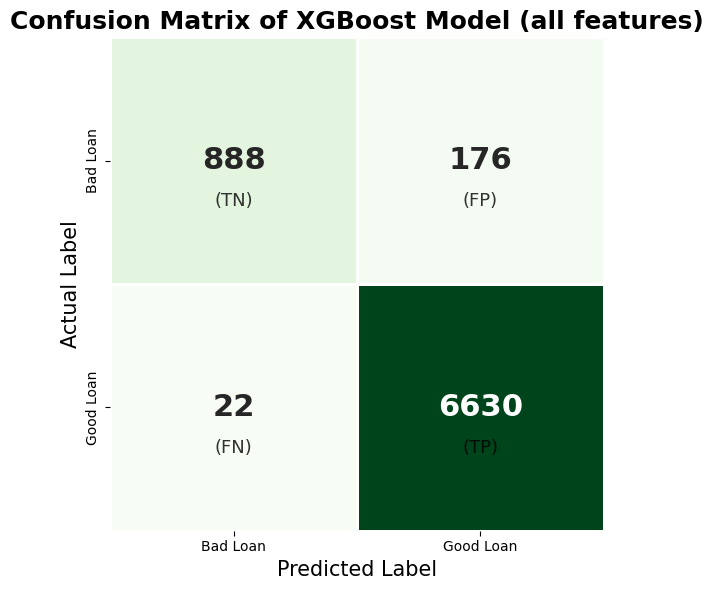

In [ ]:
plot_confusion_matrix(ytest, ypred_xgb, title='Confusion Matrix of XGBoost Model (all features)')

In [ ]:
print(classification_report(ytest, ypred_xgb))

              precision    recall  f1-score   support

           0       0.98      0.83      0.90      1064
           1       0.97      1.00      0.99      6652

    accuracy                           0.97      7716
   macro avg       0.97      0.92      0.94      7716
weighted avg       0.97      0.97      0.97      7716



ROC-AUC Score: 0.9817184271562853


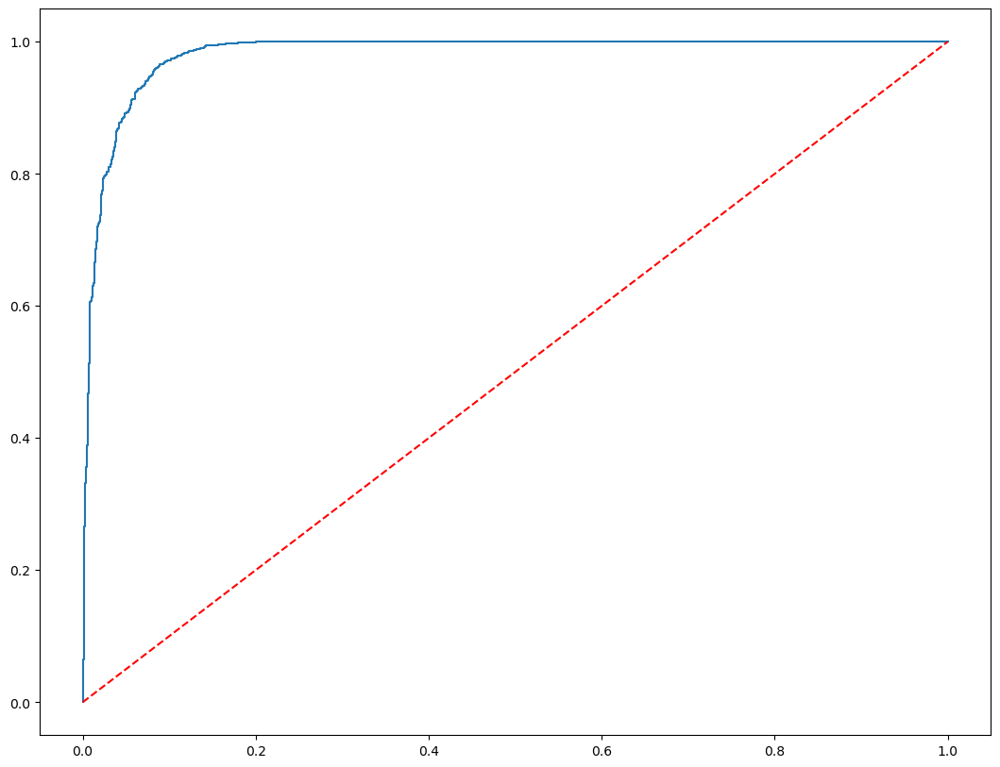

In [ ]:
ypred_xgb_prob = xgb.predict_proba(xtest)[:,1]
fpr, tpr, threshold = roc_curve(ytest,ypred_xgb_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest,ypred_xgb_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('XGBoost (all features)',xgb,xtrain,xtest,ytrain,ytest)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


### XGBoost (RFE-features)

In [ ]:
xgb_rfe = XGBClassifier(random_state=42)
xgb_rfe.fit(xtrain_r,ytrain_r)
ypred_xgb_rfe = xgb_rfe.predict(xtest_r)

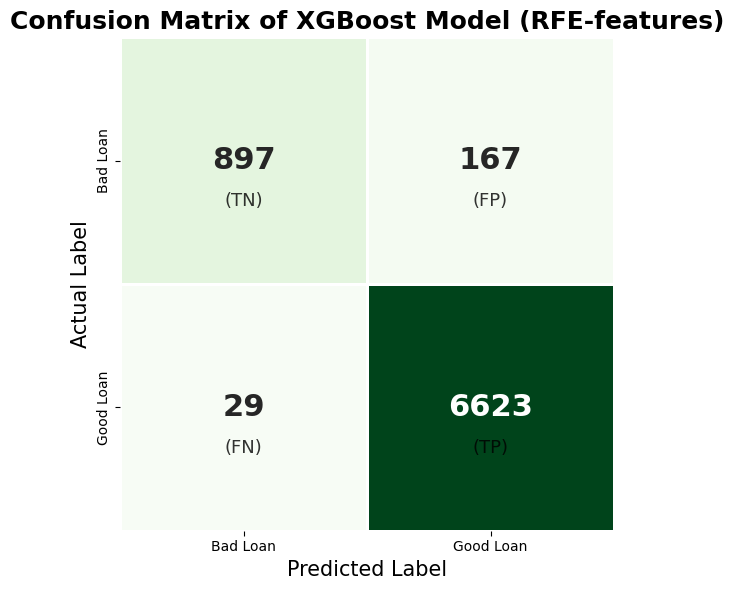

In [ ]:
plot_confusion_matrix(ytest_r, ypred_xgb_rfe, title='Confusion Matrix of XGBoost Model (RFE-features)')

In [ ]:
print(classification_report(ytest_r, ypred_xgb_rfe))

              precision    recall  f1-score   support

           0       0.97      0.84      0.90      1064
           1       0.98      1.00      0.99      6652

    accuracy                           0.97      7716
   macro avg       0.97      0.92      0.94      7716
weighted avg       0.97      0.97      0.97      7716



ROC-AUC Score: 0.9818869840717247


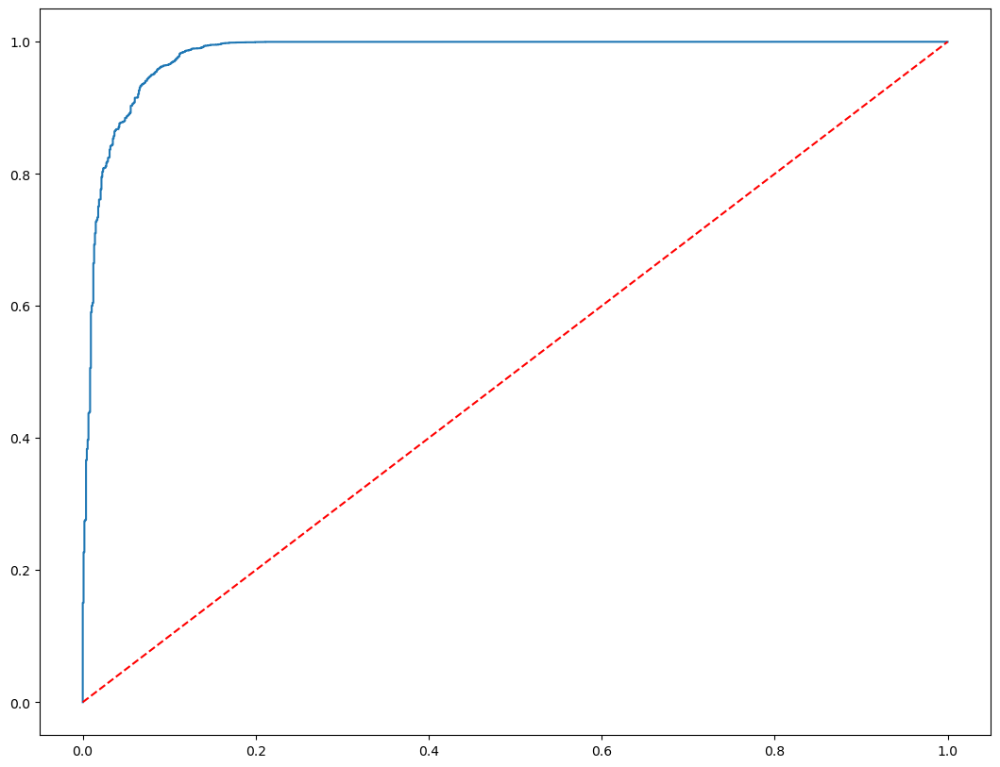

In [ ]:
ypred_xgb_rfe_prob = xgb_rfe.predict_proba(xtest_r)[:,1]
fpr, tpr, threshold = roc_curve(ytest_r,ypred_xgb_rfe_prob)
plt.plot(fpr,tpr)
print('ROC-AUC Score:',roc_auc_score(ytest_r,ypred_xgb_rfe_prob))
plt.plot([0,1],[0,1],'r--')
plt.show()

In [ ]:
update_scorecard('XGBoost (RFE-features)',xgb_rfe,xtrain_r,xtest_r,ytrain_r,ytest_r)

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


## Final Scorecard with All Models

In [ ]:
score_card

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
0,Logistic Regression (Base model),91,0.957971,0.955677,0.961007,0.953459,0.928741,0.734962
1,Logistic Regression (features selected by RFE),45,0.957388,0.955936,0.960611,0.953617,0.935096,0.731203
2,Decision Tree,91,1.000000,0.954381,0.906433,0.954488,0.830855,0.840226
3,Decision Tree (reduced features),82,1.000000,0.954381,0.907222,0.954523,0.829630,0.842105
4,Decision Tree (features selected by RFE),45,1.000000,0.956843,0.909835,0.956868,0.842549,0.844925
5,Decision Tree (reduced features from RFE featu...,42,1.000000,0.956843,0.908650,0.956817,0.844486,0.842105
6,Random Forest,91,1.000000,0.941939,0.958464,0.935222,0.996774,0.580827
7,Random Forest (RFE features),45,0.999968,0.963582,0.968606,0.961249,0.996198,0.738722
8,SVC model (all features),91,0.961990,0.956973,0.967242,0.953595,0.995935,0.690789
9,Linear kernel SVC model (all features),91,0.962443,0.959435,0.950764,0.957120,0.960736,0.735902


**Note**: rfe_features, features_42, features_82, rf_feature, rf_rfe_feature should be analyzed to determine overall, which features most of the models are considering important

## Determining the Best Model

Based on our understanding of classification models, feautres and metrics, we can say that the best model is one that has minimal error between train and test, and preferrably one with less features. Cross-validation can also be applied. We are also looking closely at the other metrics in the scorecard.

Models that can be considered based on this criteria are:
- Logistic regression (Base model with all features)
- Logistic regression (Base model with features selected through RFE)
- XGBoost (all features)
- XGBoost (RFE-features)

These four models come very close.

However, after a closer look at the number of features, the difference between train and test accuracies, and the precision and recall scores for the negative classs, we are choosing to finalize the **XGBoost model (with RFE-selected features)**

In [ ]:
best_model = score_card.tail(1)
best_model

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
17,XGBoost (RFE-features),45,0.986844,0.974598,0.981887,0.973848,0.968683,0.843045


### Attempting K-fold cross validation on the best model

In [ ]:
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score

In [ ]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

model_chosen = xgb_rfe

# Using KFold
scores_kf = cross_val_score(model_chosen, X_r, y_r, cv=kf, scoring='accuracy')

# Using StratifiedKFold (recommended for binary classification)
scores_skf = cross_val_score(model_chosen, X_r, y_r, cv=skf, scoring='accuracy')

print(f"KFold Cross-Validation Accuracy: {scores_kf.mean():.4f} (+/- {scores_kf.std():.4f})")
print(f"StratifiedKFold Cross-Validation Accuracy: {scores_skf.mean():.4f} (+/- {scores_skf.std():.4f})")

KFold Cross-Validation Accuracy: 0.9741 (+/- 0.0007)
StratifiedKFold Cross-Validation Accuracy: 0.9738 (+/- 0.0008)


**Interpreting the Mean Accuracy Score**

The mean accuracy score is the most important metric. It represents the average performance of your model across all the different test folds.
- A higher mean score indicates a better-performing model.
- This mean score gives you a more robust and realistic estimate of your model's performance on unseen data compared to a single train-test split.

We can also do this on the other models, but we are most satisfied with the XGBoost with RFE features overall, so we will go with this as our best model.

In [ ]:
best_model

,Model Name,Number of features,Train Accuracy Score,Test Accuracy Score,ROC-AUC Score,f1-weighted,Precision (Bad loan),Recall (Bad loan)
17,XGBoost (RFE-features),45,0.986844,0.974598,0.981887,0.973848,0.968683,0.843045


# 5. What this means for the business

For the domain, or hypothetical problem statement, first we should look at the features that were considered by the best model. The features were the featurese elected by rfe.

In [ ]:
rfe_data.head()

,annual_income,installment,int_rate,loan_amount,total_payment,address_state_DC,address_state_FL,address_state_IN,address_state_KS,address_state_LA,...,Purpose_educational,Purpose_house,Purpose_major_purchase,Purpose_moving,Purpose_renewable_energy,Purpose_small_business,Purpose_vacation,Purpose_wedding,term__60_months,Good_Loan
0,-1.096569,-1.322458,0.868221,-1.218005,-1.320611,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,-0.546525,-1.073892,1.776127,-1.147820,-0.969639,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-0.485409,0.490773,1.054113,0.115522,-1.019590,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.729873,-1.135883,-0.376444,-0.937263,-0.853207,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
4,0.523005,-1.088425,-1.621110,-1.077634,-0.982097,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
rfe_data.columns

Index(['annual_income', 'installment', 'int_rate', 'loan_amount',
       'total_payment', 'address_state_DC', 'address_state_FL',
       'address_state_IN', 'address_state_KS', 'address_state_LA',
       'address_state_MA', 'address_state_MD', 'address_state_MI',
       'address_state_MO', 'address_state_NE', 'address_state_NH',
       'address_state_NJ', 'address_state_NM', 'address_state_NV',
       'address_state_OH', 'address_state_PA', 'address_state_RI',
       'address_state_SD', 'address_state_TN', 'address_state_UT',
       'address_state_VA', 'address_state_VT', 'address_state_WV',
       'address_state_WY', 'emp_length_10+_years', 'emp_length_2_years',
       'emp_length_4_years', 'emp_length_7_years', 'home_ownership_OWN',
       'Purpose_car', 'Purpose_credit_card', 'Purpose_educational',
       'Purpose_house', 'Purpose_major_purchase', 'Purpose_moving',
       'Purpose_renewable_energy', 'Purpose_small_business',
       'Purpose_vacation', 'Purpose_wedding', 'term__60_mo

The important parameters that RFE looked at were:
- Annual income of the applicant
- Monthly installment amount to be paid by applicant
- Interest rate on the loan
- Loan amount borrowed
- Total payment on the loan
- Whether the borrowers were from the following states: DC, FL, IN, KS, LA, MA, MD, MI, MO, NE, NH, NJ, NM, NV, OH, PA, RI, SD, TN, UT, VA, VT, WV, and WY, or not
- Whether the borrowers were employed for more than 10 years, 2 years, 4 years or 7 years
- Whether the borrower already owned their current house
- The loans borrowed for car, credit card, educational, house, major purchase, moving, renewable energy, small business, vacation, wedding
- Term of loan (60 months or not)

These factors may be the most influential when it comes to determining whether a loan borrowed by a customer under these demographics or not will turn out to be 'Good' or 'Bad'. Maybe these factors can also help the bank figure out more about these demographics and whether they are able to deliver on their loans.

Interestingly, the model didn't even consider the grades of the loans borrowed, focusing on the income and other numerical aspects, and the economic demographic of the customers instead. Perhaps a grade analysis can be done on this sub_sample of the demographic to find out more